# Predict TripAdvisor Rating

In this competition we're provided with:
- train and test datasets of 40,000 and 10,000 samples respectivly and 9 features except target feature;
- model with hyperparametrs that we're **not allowed** to change;
- baseline that gives **MAE** = 0.21240125

More details on the features:
- Restaurant_id: Restaurant ID
- City: City of the restaurant
- Cuisine Style: Kitchen
- Ranking: The rank of the restaurant relative to other restaurants in this city
- Price Range: Restaurant prices in 3 categories
- Number of Reviews: Number of reviews
- Reviews: 2 recent reviews and the dates of these reviews
- URL_TA: restaurant page on 'www.tripadvisor.com '
- ID_TA: Restaurant ID in TripAdvisor
- Rating: Restaurant Rating

Target feature is **Rating**.

Data investigation (first look):
- we have 20% of the data as test
- train and test datasets are balanced across all features
- target feature (**rating**) has descret type and is shifted to the left; the greatest dependence of the target variable is observed on **ranking** - inverse linear correlation
- at first it seems that **ranking** is strongly shifted to the right, but in fact it completely depends on the number of restaurants in the **city** - it is scaled by the **city**; after the normalization of ranking, the distribution became almost uniform
- all cities are big touristic centres
- **price_range** has strongly pronounced mode
- **outliers** are observed in: **number_of_reviews** and **cuisine_style_count**
- **url_ta** contains information about **id_ta**, the name of the restaurant/chain, the region and code of region
- the test data has the same **id_ta** as in the train data, but with different **restaurant_id**

Data investigation (after EDA) - the most interesting points:
- **rating**:
    - average **rating** is higher in those cities where the number of restaurants is less
    - the **smaller the delta** between the last 2 reviews, as well as between the last and latest review in the dataset, the **higher the rating** of the restaurant
- **number_of_reviews**:
    - to **cheap** restaurants people go **less** than to restaurants of medium and expensive price segments
    - to restaurants with **a wide variety of cuisines** people go **more often**
    - people go to restaurants **more often** in those cities where there are **more** restaurants
- we mainly deal with non-chain restaurants
- **cousine_style** (by number of restaurants):
    - top-3 **rest_type**: Pizza, Cafe, Fast Food
    - top-3 **area_food**: European, Mediterranean, Asian
    - top-1 **specialties**: Vegetarian Friendly
    - top-3 **country_food**: Italian, French, Spanish

Trait of top-5 cities:
- London
    - highest **rating**: Street Food
    - highest **number_of_reviews**: Steakhouse (London_Steakhouse, Co-London, England)
    - highest **price_range**: Gastropub, Cuban
    - highest **chain_scale**: Latin (after American)
- Paris
    - highest **rating**: Fusion, Wine Bar, Tiwanese
    - highest **number_of_reviews**: Soups
- Madrid
    - highest **rating**: Street Food, Caribbean, Halal, Polish
    - highest **number_of_reviews**: Bar, Argentinean
    - highest **price_range**: Soups, Minority Chinese, Fujian
- Barcelona
    - highest **rating**: Street Food, Polish
    - highest **price_range**: Steakhouse, Central Asian, Vietnamese
- Berlin
    - highest **rating**: Steakhouse, Arabic, Moroccan
    - highest **number_of_reviews**: Bar
    - highest **price_range**: Steakhouse, Indonesian

# import

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline

from sklearn.model_selection import train_test_split

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# Any results you write to the current directory are saved as output.

/kaggle/input/sf-dst-restaurant-rating/sample_submission.csv
/kaggle/input/sf-dst-restaurant-rating/main_task.csv
/kaggle/input/sf-dst-restaurant-rating/kaggle_task.csv


In [2]:
from matplotlib import rcParams
#%config InlineBackend.figure_format = 'svg' # graphs in svg look clearer
plt.style.use('ggplot')  # beautiful graphs
plt.rcParams['figure.figsize'] = (12, 4)  # figure size

import warnings
warnings.filterwarnings("ignore")

from datetime import datetime
from datetime import date

In [3]:
# make our experiments reproducible
RANDOM_SEED = 42
CURRENT_DATE = pd.to_datetime(date.today().strftime('%Y-%m-%d'))
CURRENT_DATE

Timestamp('2023-05-16 00:00:00')

In [4]:
# fix the version of the packages
!pip freeze > requirements.txt

# DATA

In [5]:
DATA_DIR = '/kaggle/input/sf-dst-restaurant-rating/'
df_train = pd.read_csv(DATA_DIR+'/main_task.csv')
df_test = pd.read_csv(DATA_DIR+'kaggle_task.csv')
sample_submission = pd.read_csv(DATA_DIR+'/sample_submission.csv')

print('Size of the train dataset:', df_train.shape)
print('Size of the test dataset:', df_test.shape)
print('Size of the submission dataset:', sample_submission.shape, end='\n\n')

Size of the train dataset: (40000, 10)
Size of the test dataset: (10000, 9)
Size of the submission dataset: (10000, 2)



So we have 20% of the data as test

In [6]:
# Differences in train and test datasets' columns
list(set(df_train.columns.tolist()) - set(df_test.columns.tolist()))

['Rating']

In [7]:
df_train.head()

,Restaurant_id,City,Cuisine Style,Ranking,Rating,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_5569,Paris,"['European', 'French', 'International']",5570.0,3.5,$$ - $$$,194.0,"[['Good food at your doorstep', 'A good hotel ...",/Restaurant_Review-g187147-d1912643-Reviews-R_...,d1912643
1,id_1535,Stockholm,NaN,1537.0,4.0,NaN,10.0,"[['Unique cuisine', 'Delicious Nepalese food']...",/Restaurant_Review-g189852-d7992032-Reviews-Bu...,d7992032
2,id_352,London,"['Japanese', 'Sushi', 'Asian', 'Grill', 'Veget...",353.0,4.5,$$$$,688.0,"[['Catch up with friends', 'Not exceptional'],...",/Restaurant_Review-g186338-d8632781-Reviews-RO...,d8632781
3,id_3456,Berlin,NaN,3458.0,5.0,NaN,3.0,"[[], []]",/Restaurant_Review-g187323-d1358776-Reviews-Es...,d1358776
4,id_615,Munich,"['German', 'Central European', 'Vegetarian Fri...",621.0,4.0,$$ - $$$,84.0,"[['Best place to try a Bavarian food', 'Nice b...",/Restaurant_Review-g187309-d6864963-Reviews-Au...,d6864963


In [8]:
df_test.head()

,Restaurant_id,City,Cuisine Style,Ranking,Price Range,Number of Reviews,Reviews,URL_TA,ID_TA
0,id_0,Paris,"['Bar', 'Pub']",12963.0,$$ - $$$,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918
1,id_1,Helsinki,"['European', 'Scandinavian', 'Gluten Free Opti...",106.0,$$ - $$$,97.0,"[['Very good reviews!', 'Fine dining in Hakani...",/Restaurant_Review-g189934-d6674944-Reviews-Ra...,d6674944
2,id_2,Edinburgh,['Vegetarian Friendly'],810.0,$$ - $$$,28.0,"[['Better than the Links', 'Ivy Black'], ['12/...",/Restaurant_Review-g186525-d13129638-Reviews-B...,d13129638
3,id_3,London,"['Italian', 'Mediterranean', 'European', 'Vege...",1669.0,$$$$,202.0,"[['Most exquisite', 'Delicious and authentic']...",/Restaurant_Review-g186338-d680417-Reviews-Qui...,d680417
4,id_4,Bratislava,"['Italian', 'Mediterranean', 'European', 'Seaf...",37.0,$$$$,162.0,"[['Always the best in bratislava', 'Very good ...",/Restaurant_Review-g274924-d1112354-Reviews-Ma...,d1112354


In [9]:
sample_submission.head()

,Restaurant_id,Rating
0,id_0,2.0
1,id_1,2.5
2,id_2,4.0
3,id_3,1.0
4,id_4,4.0


In [10]:
# important! for the correct processing of characteristics, we combine the train and the test into one dataset
df_train['sample'] = 1 # mark the train
df_test['sample'] = 0 # mark the test
df_test['Rating'] = 0 # in test we don't have column Rating, it's our target

data = df_test.append(df_train, sort=False).reset_index(drop=True) # combine

data.columns = [x.lower().replace(' ', '_') for x in data.columns]
data.columns

Index(['restaurant_id', 'city', 'cuisine_style', 'ranking', 'price_range',
       'number_of_reviews', 'reviews', 'url_ta', 'id_ta', 'sample', 'rating'],
      dtype='object')

## Structure investigation

In [11]:
print('Size of the dataset:', data.shape, end='\n\n')
# Count how many times each data type is present in the train dataset
pd.value_counts(data.dtypes)

Size of the dataset: (50000, 11)



object     7
float64    3
int64      1
dtype: int64

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 11 columns):
restaurant_id        50000 non-null object
city                 50000 non-null object
cuisine_style        38410 non-null object
ranking              50000 non-null float64
price_range          32639 non-null object
number_of_reviews    46800 non-null float64
reviews              49998 non-null object
url_ta               50000 non-null object
id_ta                50000 non-null object
sample               50000 non-null int64
rating               50000 non-null float64
dtypes: float64(3), int64(1), object(7)
memory usage: 4.2+ MB


More details on the features:
- Restaurant_id: Restaurant ID
- City: City of the restaurant
- Cuisine Style: Kitchen
- Ranking: The rank of the restaurant relative to other restaurants in this city
- Price Range: Restaurant prices in 3 categories
- Number of Reviews: Number of reviews
- Reviews: 2 recent reviews and the dates of these reviews
- URL_TA: restaurant page on 'www.tripadvisor.com '
- ID_TA: Restaurant ID in TripAdvisor
- Rating: Restaurant Rating

### Structure of non-numerical features

In [13]:
data.select_dtypes(exclude="number").sample(5)

,restaurant_id,city,cuisine_style,price_range,reviews,url_ta,id_ta
16922,id_617,Helsinki,NaN,NaN,"[['One of a kind Cafe in Kallio', 'Unique plac...",/Restaurant_Review-g189934-d815477-Reviews-Kah...,d815477
11512,id_3200,Paris,"['French', 'Wine Bar', 'Bar', 'European', 'Veg...",$$ - $$$,"[['Amazing wine bar with delicious food', 'Nic...",/Restaurant_Review-g187147-d794535-Reviews-Le_...,d794535
11652,id_429,Lyon,"['French', 'European']",$$ - $$$,"[['Great food and atmosphere', 'Orgasmic Sunda...",/Restaurant_Review-g187265-d5796826-Reviews-Cu...,d5796826
8850,id_8850,Milan,"['Mediterranean', 'Vegetarian Friendly']",$$ - $$$,"[['Good kitchen, thief personnel', 'Worst dinn...",/Restaurant_Review-g187849-d2326817-Reviews-Mo...,d2326817
35348,id_326,Prague,"['Bar', 'European', 'Central European', 'Inter...",$$ - $$$,"[['Would come back again', 'Great appetizers']...",/Restaurant_Review-g274707-d3379531-Reviews-Br...,d3379531


In [14]:
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')
    display(data[data['sample']==ds].describe(exclude="number"))
    print('')

Test dataset


,restaurant_id,city,cuisine_style,price_range,reviews,url_ta,id_ta
count,10000,10000,7693,6525,9998,10000,10000
unique,10000,31,3128,3,8358,10000,10000
top,id_3204,London,['Italian'],$$ - $$$,"[[], []]",/Restaurant_Review-g274707-d10356841-Reviews-B...,d12512021
freq,1,1436,300,4629,1641,1,1



Train dataset


,restaurant_id,city,cuisine_style,price_range,reviews,url_ta,id_ta
count,40000,40000,30717,26114,40000,40000,40000
unique,11909,31,9007,3,33516,39980,39980
top,id_871,London,['Italian'],$$ - $$$,"[[], []]",/Restaurant_Review-g187514-d11999956-Reviews-S...,d11674463
freq,18,5757,1032,18412,6471,2,2


The unique **restaurant_id** (identification number of the restaurant / restaurant chain) is much smaller than the unique **id_ta** (restaurant ID in the TripAdvisor database). TripAdvisor probably has its own ID for every restaurant in the chain.

There are as many unique **url_ta** (the URL of the restaurant's page on Tripadvisor) as there are **id_ta**, plus there are no passes, which means we definitely have a situation where one restaurant has several ratings.

Let's see how this can be.

In [15]:
import collections

# count the number of mentions of unique values and get those that come across more than 1 time
def collect_repeated_items(col):
    c = collections.Counter()
    for el in data[col].tolist():
        c[el]+=1
    print('Unique values:', len(c))
    
    new_c = {k: v for k, v in c.items() if v > 1}
    print('Values repeated more then one time:', len(new_c))
    
    c_list = list(new_c.keys())
    
    return c_list

In [16]:
# look at how many rows with them in the dataset
data.loc[data['id_ta'].isin(collect_repeated_items('id_ta'))]['id_ta'].count()
# exactly 2 times more

Unique values: 49963
Values repeated more then one time: 37


74

In [17]:
data.loc[data['id_ta']==collect_repeated_items('id_ta')[0]]

Unique values: 49963
Values repeated more then one time: 37


,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating
118,id_118,Warsaw,['Italian'],1801.0,$,3.0,"[[], []]",/Restaurant_Review-g274856-d10316215-Reviews-B...,d10316215,0,0.0
36920,id_1800,Warsaw,['Italian'],1801.0,$,3.0,"[[], []]",/Restaurant_Review-g274856-d10316215-Reviews-B...,d10316215,1,3.5


In [18]:
data.loc[data['id_ta'].isin(collect_repeated_items('id_ta'))]['restaurant_id'].nunique()

Unique values: 49963
Values repeated more then one time: 37


74

Thus, we have the same **id_ta** in the test data as in the training data, but with different **restaurant_id**. This is strange.

In [19]:
for el in data['url_ta'].sample(5):
    print(type(el), el)

<class 'str'> /Restaurant_Review-g186338-d1015991-Reviews-Fiamma_Restaurant-London_England.html
<class 'str'> /Restaurant_Review-g274856-d10492659-Reviews-Ciastkowo_Pl-Warsaw_Mazovia_Province_Central_Poland.html
<class 'str'> /Restaurant_Review-g187309-d1039606-Reviews-Zum_Koreaner-Munich_Upper_Bavaria_Bavaria.html
<class 'str'> /Restaurant_Review-g189158-d10326425-Reviews-Quimera_Brewpub-Lisbon_Lisbon_District_Central_Portugal.html
<class 'str'> /Restaurant_Review-g189158-d1884072-Reviews-Trigo_Latino-Lisbon_Lisbon_District_Central_Portugal.html


In [20]:
for el in data['reviews'].sample(5):
    print(type(el), el)

<class 'str'> [['Best ice cream'], ['09/30/2017']]
<class 'str'> [['Quick, inexpensive stop for pizza & drinks', 'Tasty pizza'], ['08/11/2017', '05/20/2017']]
<class 'str'> [['A great find!', 'Something different'], ['05/13/2017', '01/26/2017']]
<class 'str'> [['Very nice dinner 👌', 'unique style'], ['02/11/2017', '08/15/2017']]
<class 'str'> [['Start up review :)'], ['06/23/2014']]


1. The unique **restaurant_id** (restaurant/restaurant chain identification number) is much smaller than the unique **id_ta** (restaurant ID in the TripAdvisor database). TripAdvisor probably has its own ID for every restaurant in the chain.
2. There are as many unique **url_ta** (the URL of the restaurant's page on Tripadvisor) as there are **id_ta**, plus there are no passes, which means we definitely have a situation where one restaurant has several ratings. Thus, we have the same **id_ta** in the test data as in the training data, but with different **restaurant_id**. This is strange...
3. **cuisine_style** and **reviews** clearly have a list structure (including an empty one) - the data needs to be extracted and there are actually more missing values.
4. **reviews** also contains dates.
5. **url_ta** carries information about **id_ta**, the name of the restaurant (or chain?), the region and some other code associated with the restaurant and TripAdvosor (??).

Machine learning models work with numerical data. Already now we can get additional numeric information from non-numeric:
1. Let's make the **Price Range** feature categorical
2. Let's count the number of **Cuisine Style** in each line

In [21]:
# the structure of the list, but the data type is a string
# turn it into a list
data['cuisine_style'] = data['cuisine_style'].dropna().apply(lambda x: x[2:-2].split("', '"))
# count the number of kitchens
data['cuisine_style_count'] = data['cuisine_style'].dropna().apply(lambda x: len(x))

data['price_range'] = data['price_range'].dropna().apply(lambda x: 1.0 if x=='$' else (2.5 if x=='$$ - $$$' else(4.0 if x=='$$$$' else x)))

### Structure of numerical features

In [22]:
data.select_dtypes(include="number").sample(5)

,ranking,price_range,number_of_reviews,sample,rating,cuisine_style_count
23705,5057.0,NaN,14.0,1,4.0,2.0
3904,5864.0,NaN,NaN,0,0.0,1.0
3483,7573.0,2.5,NaN,0,0.0,2.0
46620,3209.0,2.5,54.0,1,3.0,3.0
47787,1511.0,2.5,306.0,1,4.0,1.0


In [23]:
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')
    display(data[data['sample']==ds].describe(include="number"))
    print('')

Test dataset


,ranking,price_range,number_of_reviews,sample,rating,cuisine_style_count
count,10000.000000,6525.000000,9343.000000,10000.0,10000.0,7693.000000
mean,3618.023500,2.229195,123.050840,0.0,0.0,3.127908
std,3665.076451,0.761936,287.819368,0.0,0.0,1.846070
min,2.000000,1.000000,2.000000,0.0,0.0,1.000000
25%,966.000000,2.500000,9.000000,0.0,0.0,2.000000
50%,2257.000000,2.500000,32.000000,0.0,0.0,3.000000
75%,5137.000000,2.500000,114.000000,0.0,0.0,4.000000
max,16443.000000,4.000000,6437.000000,0.0,0.0,15.000000



Train dataset


,ranking,price_range,number_of_reviews,sample,rating,cuisine_style_count
count,40000.000000,26114.000000,37457.000000,40000.0,40000.000000,30717.000000
mean,3676.028525,2.221069,124.825480,1.0,3.993037,3.112706
std,3708.749567,0.765395,295.666352,0.0,0.668417,1.806860
min,1.000000,1.000000,2.000000,1.0,1.000000,1.000000
25%,973.000000,2.500000,9.000000,1.0,3.500000,2.000000
50%,2285.000000,2.500000,33.000000,1.0,4.000000,3.000000
75%,5260.000000,2.500000,115.000000,1.0,4.500000,4.000000
max,16444.000000,4.000000,9660.000000,1.0,5.000000,21.000000


It looks like our samples are balanced.

In [24]:
for i in data.loc[data['number_of_reviews']==max(data['number_of_reviews'])]['url_ta']:
    print(i)

/Restaurant_Review-g186338-d1421189-Reviews-London_Steakhouse_Co-London_England.html


In [25]:
for i in data.loc[data['ranking']==max(data['ranking'])]['url_ta']:
    print(i)

/Restaurant_Review-g186338-d720554-Reviews-Singapura_Blackfriars-London_England.html


As in the case of **number_of_reviews**, and with **ranking**, the maximum value is very far from the 75 quartile - studying the issue of outliers in more detail is needed.

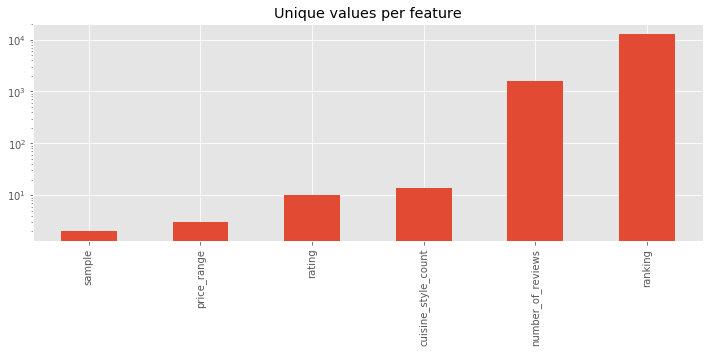

In [26]:
# For each numerical feature compute number of unique entries
unique_values = data.copy().select_dtypes(include="number").nunique().sort_values()

# Plot information with y-axis in log-scale !!!!!!!!!!!
unique_values.plot.bar(logy=True, 
                       #figsize=(12, 4), 
                       title="Unique values per feature")

In [27]:
data.rating.unique()

array([0. , 3.5, 4. , 4.5, 5. , 3. , 2.5, 2. , 1. , 1.5])

1. We have **ranking** (the rank of the restaurant relative to other restaurants in this city), which most likely depends on the number of restaurants in a particular city. The magnitude and variability of its values is much higher than **rating**, and std - than the average. We may have to scale.
2. The **number_of_reviews** std also exceeds its average. We need to take a closer look.
3. **rating** has a 5-point system, the average is almost equal to the median - most likely, it has a normal distribution (as does **cuisine_style_count**).
4. As in the case of **number_of_reviews**, and with **ranking**, the maximum value is very far from the 75 quartile - studying the issue of outliers in more detail is needed.
5. At 75% **price_range** - average level.
6. The samples are balanced.

## Quality investigation

### Duplicates

In [28]:
# the structure of the list, but the data type is a string
# let's make it a string again
data['cuisine_style'] = data['cuisine_style'].dropna().apply(lambda x: ', '.join(x))

print(f"You seem to have {data.duplicated().sum()} duplicates in your database.")

You seem to have 0 duplicates in your database.


### Missing values
There may be different reasons for the presence of omissions, but the omissions must either be filled in or excluded from the set completely. But you need to be careful with omissions, even the lack of information can be an important sign!

In [29]:
count=0
for i in data.isnull().sum(axis=1):
    if i>0:
        count=count+1
print('Total number of rows with missing values: {}, that is {}% of all rows'.format(count, round(count/data.shape[0]*100, 2)))

Total number of rows with missing values: 17891, that is 35.78% of all rows


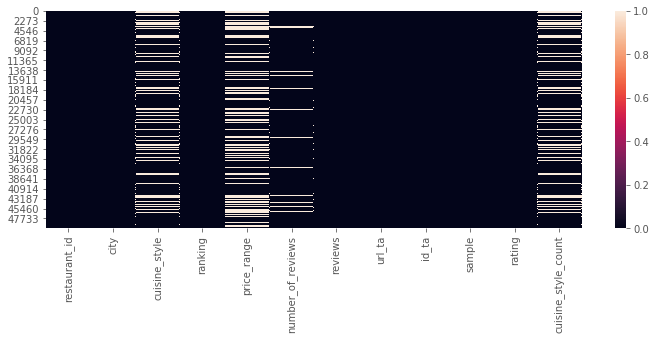

In [30]:
# Per sample
sns.heatmap(data.isnull())

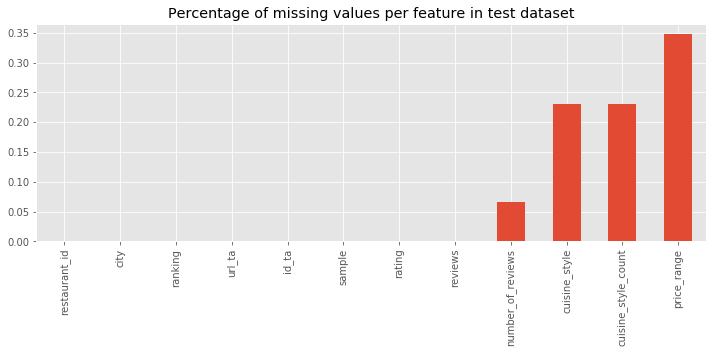

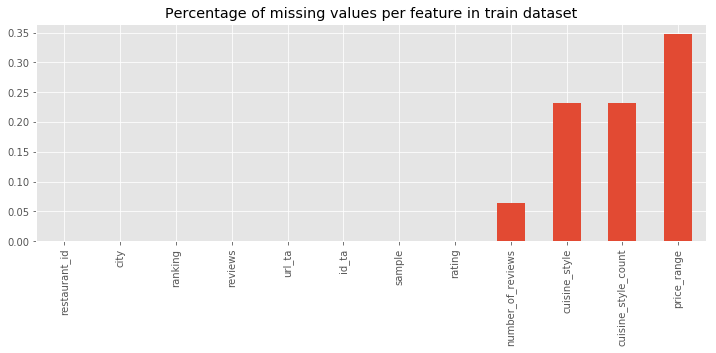

In [31]:
# Per feature
for ds in data['sample'].unique():
    data[data['sample']==ds].isna().mean().sort_values().plot(
        kind="bar",
        title="Percentage of missing values per feature in " + 'train dataset' if ds==1 else "Percentage of missing values per feature in " + 'test dataset',
        #ylabel="Ratio of missing values per feature"
                                                            )
    plt.show()

In fact, we know there are more of them.

### Unwanted entries and recording errors

#### Numerical features

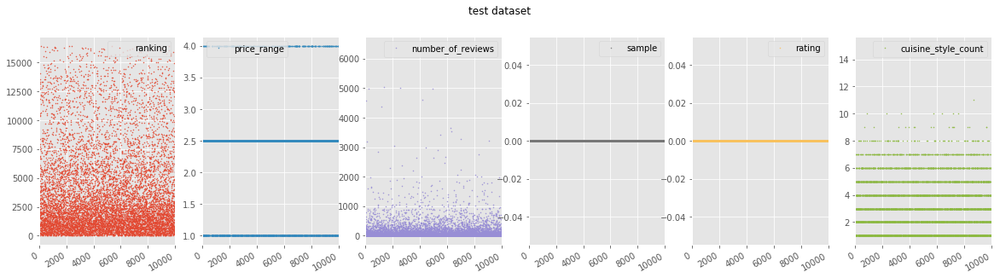

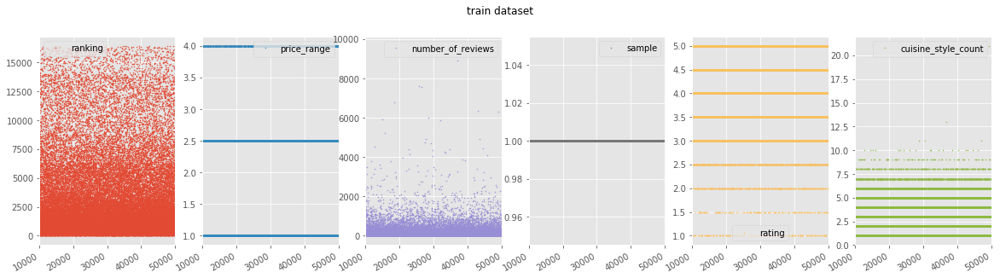

In [32]:
for ds in data['sample'].unique():
    data[data['sample']==ds].plot(lw=0,    # lw stands for line width. 0 means that we don't want to show any lines
          marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
          subplots=True,                   # subplots tells pandas to plot each feature in a separate subplot 
          layout=(1, -1),                  # how many rows and columns to use for the subplots. The -1 means "as many as needed", while the 4 means to use 4 columns per row
          figsize=(20, 5), 
          markersize=1,
          title='train dataset' if ds==1 else 'test dataset'
                           )

# Each point in this figure is a sample (i.e. a row) in our dataset and each subplot represents a different feature. 
# The y-axis shows the feature value, while the x-axis is the sample index.

At first glance, outliers are observed in:
- **number_of_reviews**
- **cuisine_style_count**

#### Non-numerical features

In [33]:
data.describe(exclude=["number", "datetime"])

,restaurant_id,city,cuisine_style,reviews,url_ta,id_ta
count,50000,50000,38410,49998,50000,50000
unique,13094,31,10731,41857,49963,49963
top,id_871,London,Italian,"[[], []]",/Restaurant_Review-g187514-d9877640-Reviews-Ra...,d3161682
freq,19,7193,1332,8112,2,2


The values of **reviews**, **url_ta**, **id_ta** are almost unique:
- **reviews** can be empty lists,
- with **url_ta**, **id_ta**, **restaurant_id** we figured out above.

Therefore, let's look only at **city**, **cuisine_style**.

Test dataset


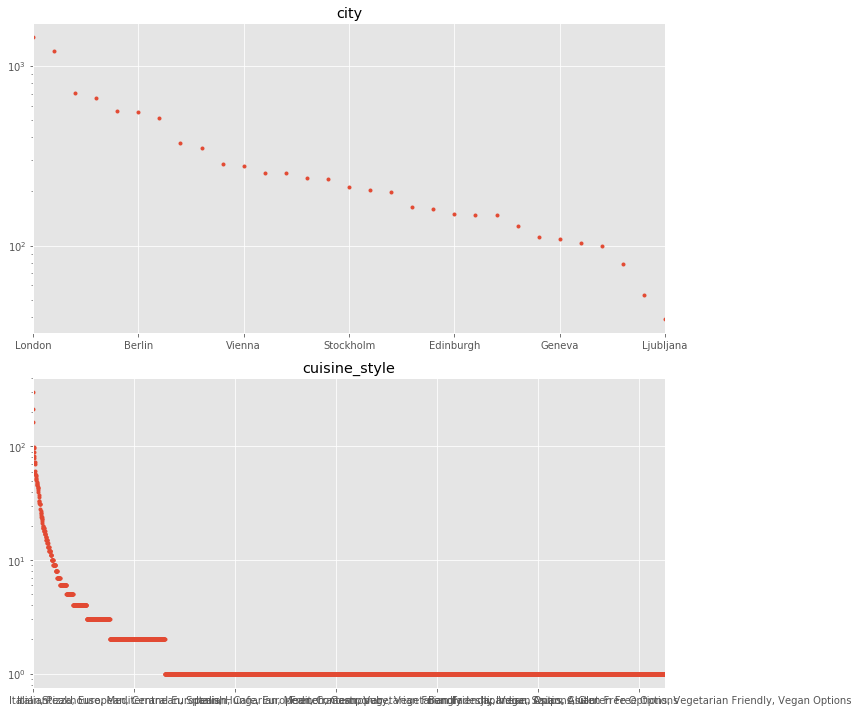

Train dataset


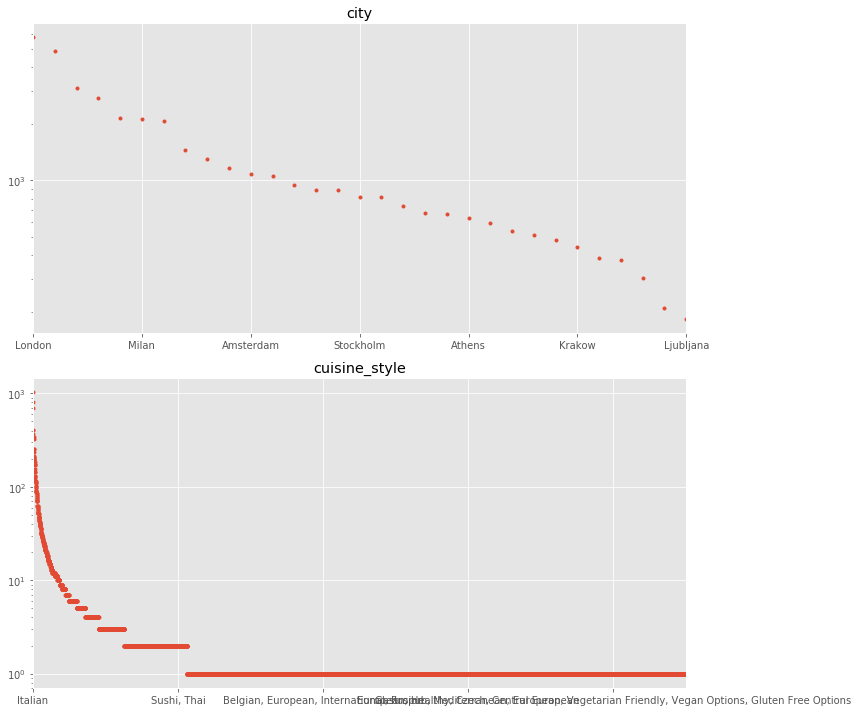

In [34]:
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')

    # Create figure object with 2 subplots
    fig, axes = plt.subplots(ncols=1, nrows=2, figsize=(12, 10))

    # Identify non-numerical features
    #df_non_numerical = data.select_dtypes(exclude=["number", "datetime"])
    df_non_numerical = data[data['sample']==ds][['city', 'cuisine_style']]

    # Loop through features and put each subplot on a matplotlib axis object
    for col, ax in zip(df_non_numerical.columns, axes.ravel()):

        # Selects one single feature and counts number of occurrences per unique value
        df_non_numerical[col].value_counts().plot(

            # Plots this information in a figure with log-scaled y-axis
            logy=True, title=col, lw=0, marker=".", ax=ax)
    
    plt.tight_layout()
    plt.show()

Test dataset


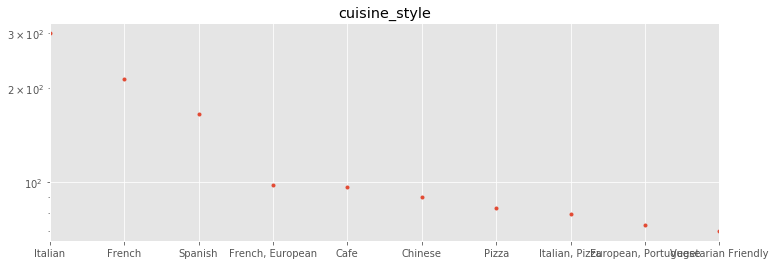

Train dataset


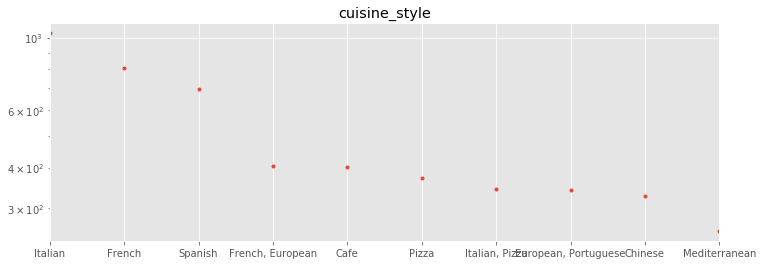

In [35]:
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')
        
    df_non_numerical = data[data['sample']==ds][['city', 'cuisine_style']]
    df_non_numerical['cuisine_style'].value_counts()[:10].plot(

    # Plots this information in a figure with log-scaled y-axis
    logy=True, title='cuisine_style', lw=0, marker=".")
    plt.show()

- **city**: the number is gradually decreasing from London via Milan and Amsterdam to Ljubljana, which most likely reflects the tourist popularity of the cities,
- **cuisine_style**: these are raw lists, at the moment they show the popularity of combinations

## Content investigation

Test dataset


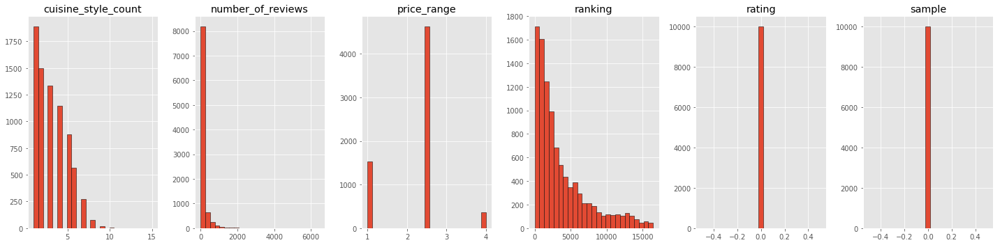

Train dataset


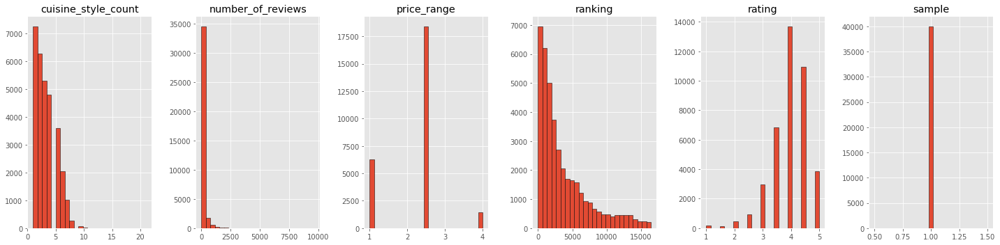

In [36]:
# Plots the histogram for each numerical feature in a separate subplot
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')
    data[data['sample']==ds].hist(layout=(1, -1), edgecolor="black", bins=25, figsize=(20, 5))
    plt.tight_layout()
    plt.show()

Test dataset


rating                 1.0000
price_range            0.4629
cuisine_style_count    0.1890
reviews                0.1641
city                   0.1436
dtype: float64

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,rating,cuisine_style_count
0,id_0,London,Italian,179.0,2.5,2.0,"[[], []]",/Restaurant_Review-g1068497-d6600141-Reviews-S...,d10002758,0.0,1.0


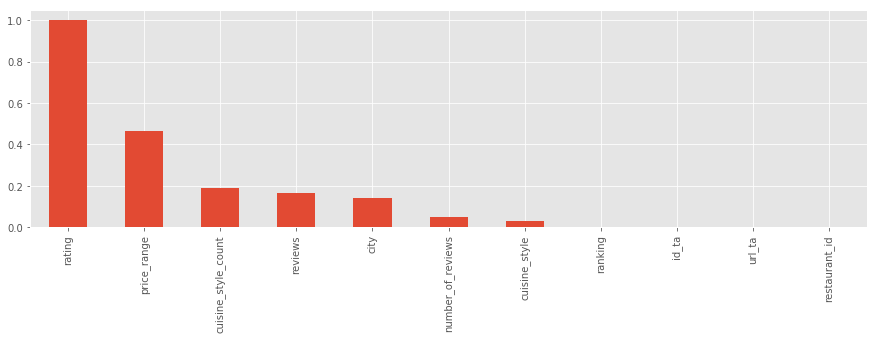

Train dataset


price_range            0.460300
rating                 0.342300
cuisine_style_count    0.181600
reviews                0.161775
city                   0.143925
dtype: float64

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,rating,cuisine_style_count
0,id_227,London,Italian,1080.0,2.5,2.0,"[[], []]",/Restaurant_Review-g187514-d10047799-Reviews-E...,d10047799,4.0,1.0


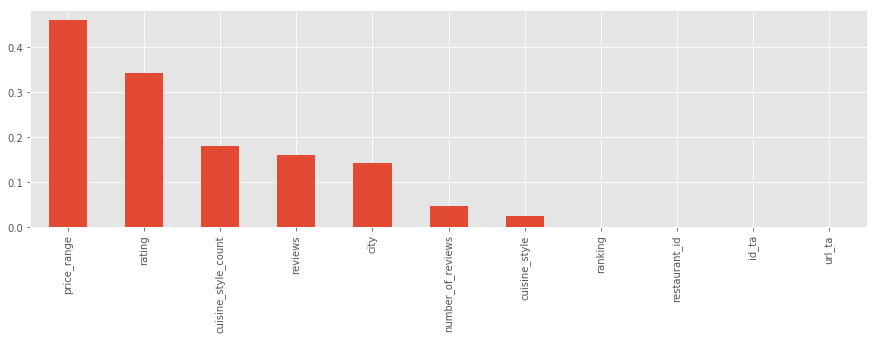

In [37]:
# Most frequent entry
for ds in data['sample'].unique():
    if ds==1:
        print('Train dataset')
    else:
        print('Test dataset')
        
    # Collects for each feature the most frequent entry
    most_frequent_entry = data[data['sample']==ds].copy().drop('sample', axis=1).mode().head(1)

    # Checks for each entry if it contains the most frequent entry
    df_freq = data[data['sample']==ds].copy().drop('sample', axis=1).eq(most_frequent_entry.values, axis=1)

    # Computes the mean of the 'is_most_frequent' occurrence
    df_freq = df_freq.mean().sort_values(ascending=False)

    display(df_freq.head())

    # Show the 5 top features with the highest ratio of singular value content
    display(most_frequent_entry)

    # Visualize the 'df_freq' table
    df_freq.plot.bar(figsize=(15, 4))
    plt.show()

**price_range** most likely will not affect **rating**

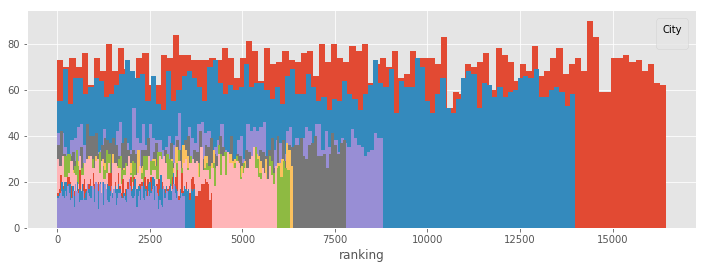

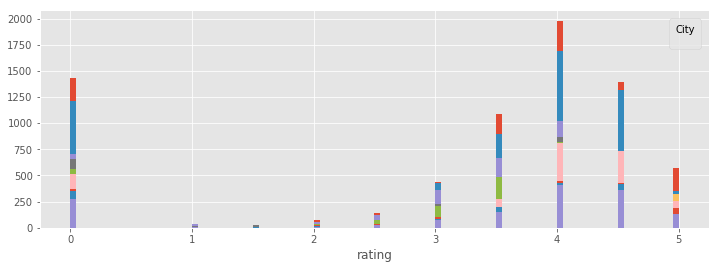

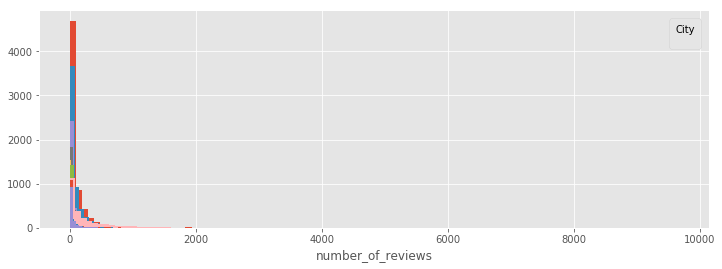

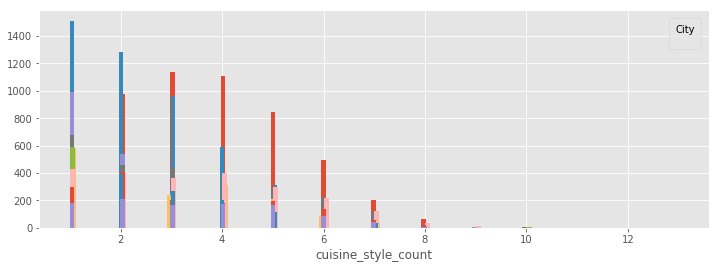

In [38]:
for col in ['ranking', 'rating', 'number_of_reviews', 'cuisine_style_count']:
    # посмотрим на топ 10 городов
    for x in (data['city'].value_counts())[:10].index:
        data[col][data['city'] == x].hist(bins=100)
    plt.legend(prop={'size': 16}, title = 'City')
    plt.xlabel(col)
    plt.show()

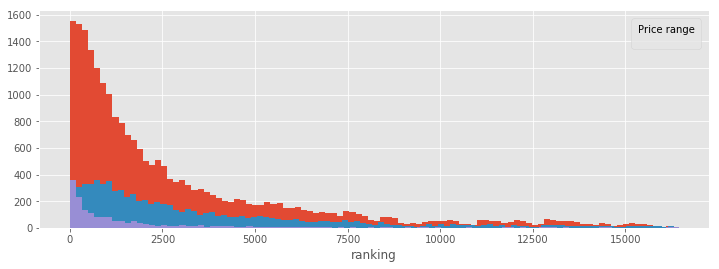

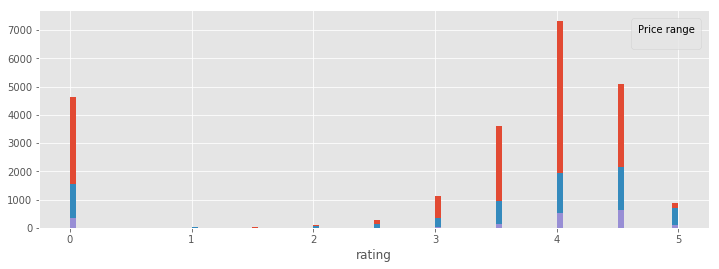

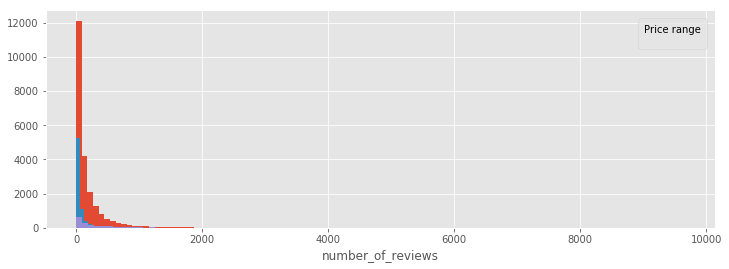

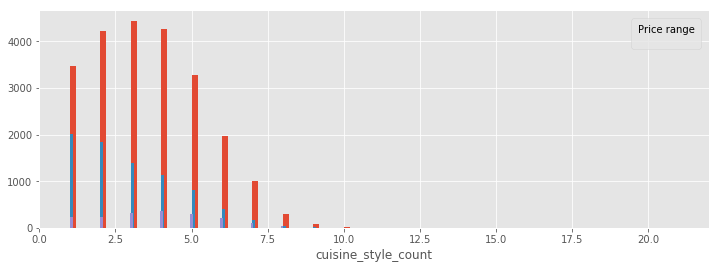

In [39]:
for col in ['ranking', 'rating', 'number_of_reviews', 'cuisine_style_count']:
    for x in (data['price_range'].value_counts()).index:
        data[col][data['price_range'] == x].hist(bins=100)
    plt.legend(prop={'size': 16}, title = 'Price range')
    plt.xlabel(col)
    plt.show()

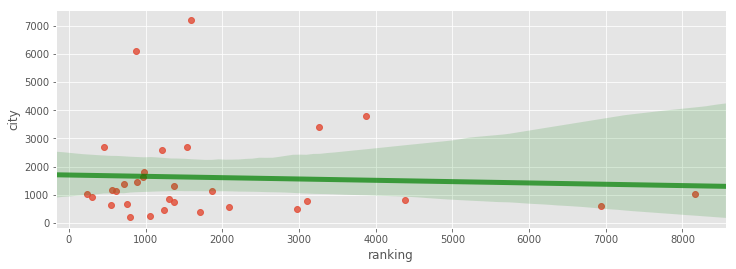

In [40]:
sns.regplot(x=data.groupby('city')['ranking'].mean(), y=data['city'].value_counts(), line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

In [41]:
print('Ranking mean by city max:', data.groupby('city')['ranking'].mean().sort_values(ascending=False)[:1], end='\n\n')
print('Count city max:', data['city'].value_counts()[:1])

Ranking mean by city max: city
London    8169.707354
Name: ranking, dtype: float64

Count city max: London    7193
Name: city, dtype: int64


In [42]:
pd.DataFrame({'city': data['city'].unique(),
              'city_ranking_mean': [data[data['city']==c]['ranking'].mean() for c in data['city'].unique()],
              'city_count': [data[data['city']==c]['city'].count() for c in data['city'].unique()]
              }).corr()

,city_ranking_mean,city_count
city_ranking_mean,1.000000,0.999799
city_count,0.999799,1.000000


- A very small number of restaurants have a large number of **number_of_reviews**, rather these are anomalies,
- At first it seems that **ranking** is strongly shifted to the right, but in fact it completely depends on the number of restaurants in the city - scaled by the city,
- **rating** is shifted to the left,
- the samples are balanced

In [43]:
# since the samples are balanced, we can normalize ranking as follows: 
#data['ranking_norm'] = data.groupby(['sample', 'city'])['ranking'].transform(lambda x: (x-x.mean())/x.std())
data['ranking_norm'] = data.groupby(['sample', 'city'])['ranking'].transform(lambda x: (x-x.mean())/(x.max()-x.min()))

data.groupby('sample')[['ranking', 'ranking_norm']].describe()

ranking                                                        \
          count         mean          std  min    25%     50%     75%   
sample                                                                  
0       10000.0  3618.023500  3665.076451  2.0  966.0  2257.0  5137.0   
1       40000.0  3676.028525  3708.749567  1.0  973.0  2285.0  5260.0   

                ranking_norm                                              \
            max        count          mean       std       min       25%   
sample                                                                     
0       16443.0      10000.0  6.070838e-18  0.289834 -0.563197 -0.251666   
1       16444.0      40000.0 -3.724798e-18  0.287878 -0.512439 -0.248863   

                                      
             50%       75%       max  
sample                                
0      -0.001419  0.250323  0.567715  
1      -0.001465  0.248720  0.513564

[Text(0.5, 1.0, 'test dataset ranking_norm')]

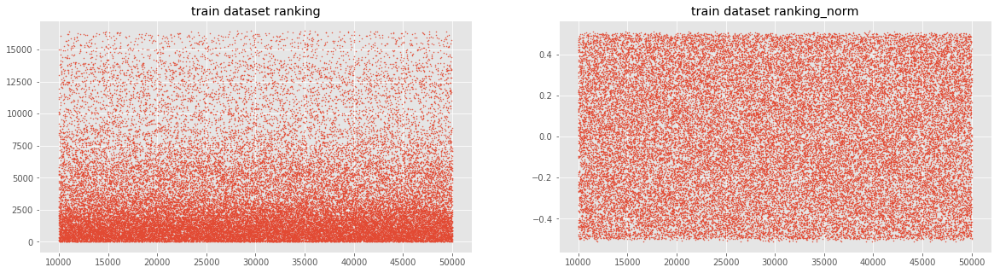

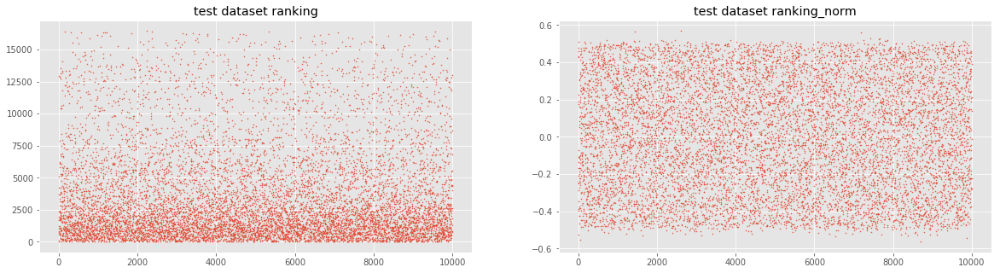

In [44]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].plot(data[data['sample']==1]['ranking'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )
    
axes[1].plot(data[data['sample']==1]['ranking_norm'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )
    
axes[0].set(title = 'train dataset ranking')
axes[1].set(title = 'train dataset ranking_norm')


fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].plot(data[data['sample']==0]['ranking'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )

axes[1].plot(data[data['sample']==0]['ranking_norm'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )

axes[0].set(title = 'test dataset ranking')
axes[1].set(title = 'test dataset ranking_norm')

[Text(0.5, 1.0, 'test dataset ranking_norm')]

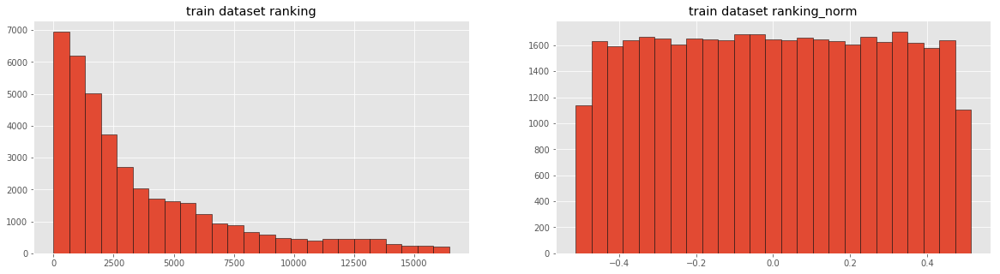

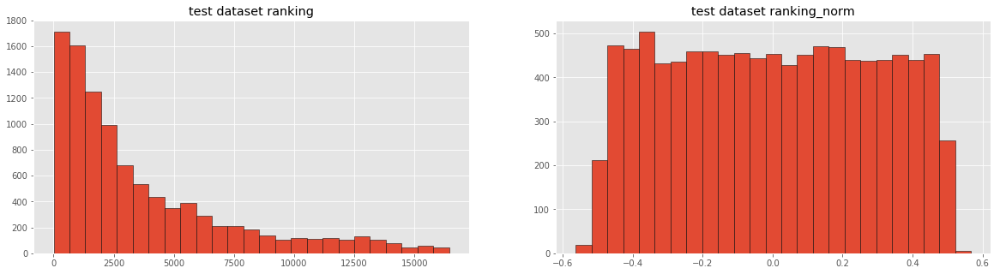

In [45]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].hist(
        data[data['sample']==1]['ranking'],
        edgecolor="black", 
        bins=25
    )

axes[1].hist(
        data[data['sample']==1]['ranking_norm'],
        edgecolor="black", 
        bins=25
    )

axes[0].set(title = 'train dataset ranking')
axes[1].set(title = 'train dataset ranking_norm')


fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].hist(
        data[data['sample']==0]['ranking'],
        edgecolor="black", 
        bins=25
    )

axes[1].hist(
        data[data['sample']==0]['ranking_norm'],
        edgecolor="black", 
        bins=25
    )

axes[0].set(title = 'test dataset ranking')
axes[1].set(title = 'test dataset ranking_norm')

After normalization **ranking**:
- the distribution has become almost uniform
- the situation with outliers has changed for the better

In [46]:
# And now let's prolog the normalized ranking
# np.log(data.column[data.column >= 0] + 1).hist()
data['ranking_norm_log'] = data['ranking_norm'].apply(lambda x: np.log(x+1))

# Or better, first prolog and then normalize ranking
data['ranking_log'] = data['ranking'].apply(lambda x: np.log(x))
data['ranking_log_norm'] = data.groupby(['sample', 'city'])['ranking_log'].transform(lambda x: (x-x.mean())/(x.max()-x.min()))


data.groupby('sample')[['ranking_norm_log', 'ranking_log_norm']].describe()

ranking_norm_log                                                    \
                  count      mean       std       min       25%       50%   
sample                                                                      
0               10000.0 -0.045506  0.308699 -0.828274 -0.289907 -0.001420   
1               40000.0 -0.044949  0.306894 -0.718340 -0.286168 -0.001466   

                           ranking_log_norm                                    \
             75%       max            count          mean       std       min   
sample                                                                          
0       0.223402  0.449619          10000.0  2.467332e-17  0.162713 -0.865514   
1       0.222119  0.414467          40000.0 -4.008741e-16  0.127455 -0.896744   

                                                
             25%       50%       75%       max  
sample                                          
0      -0.064929  0.048333  0.114047  0.348955  
1      -0.047577  0.037544  0.087510  0.191784

[Text(0.5, 1.0, 'test dataset ranking_log_norm')]

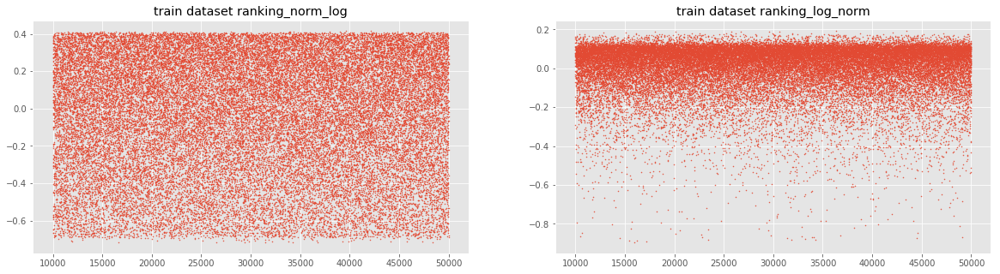

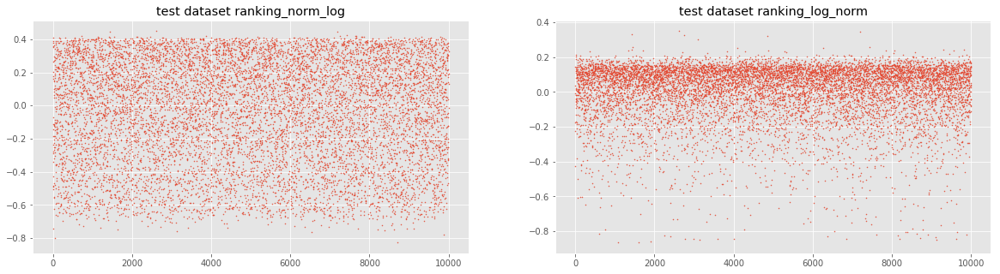

In [47]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].plot(data[data['sample']==1]['ranking_norm_log'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )
    
axes[1].plot(data[data['sample']==1]['ranking_log_norm'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )
    
axes[0].set(title = 'train dataset ranking_norm_log')
axes[1].set(title = 'train dataset ranking_log_norm')


fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].plot(data[data['sample']==0]['ranking_norm_log'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )

axes[1].plot(data[data['sample']==0]['ranking_log_norm'],
            lw=0,                            # lw stands for line width. 0 means that we don't want to show any lines
            marker=".",                      # Instead of lines, we tell the plot to use . as markers for each data point
            markersize=1
            )

axes[0].set(title = 'test dataset ranking_norm_log')
axes[1].set(title = 'test dataset ranking_log_norm')

[Text(0.5, 1.0, 'test dataset ranking_log_norm')]

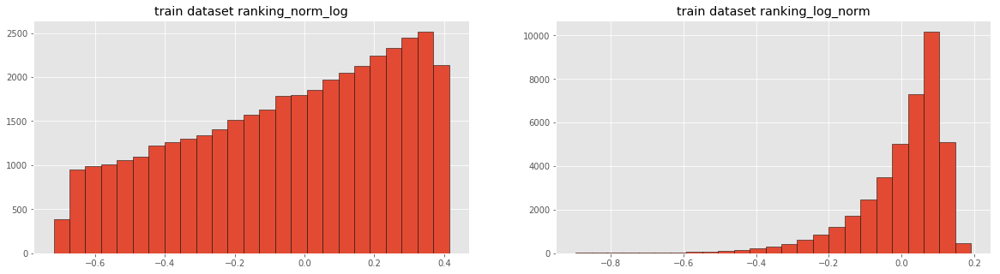

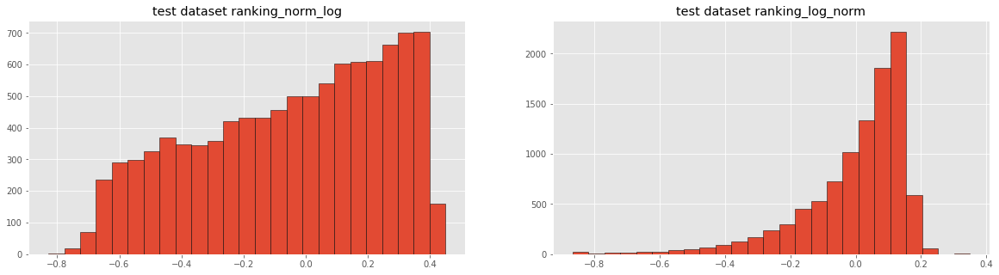

In [48]:
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].hist(
        data[data['sample']==1]['ranking_norm_log'],
        edgecolor="black", 
        bins=25
    )

axes[1].hist(
        data[data['sample']==1]['ranking_log_norm'],
        edgecolor="black", 
        bins=25
    )

axes[0].set(title = 'train dataset ranking_norm_log')
axes[1].set(title = 'train dataset ranking_log_norm')


fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 5))

axes[0].hist(
        data[data['sample']==0]['ranking_norm_log'],
        edgecolor="black", 
        bins=25
    )

axes[1].hist(
        data[data['sample']==0]['ranking_log_norm'],
        edgecolor="black", 
        bins=25
    )

axes[0].set(title = 'test dataset ranking_norm_log')
axes[1].set(title = 'test dataset ranking_log_norm')

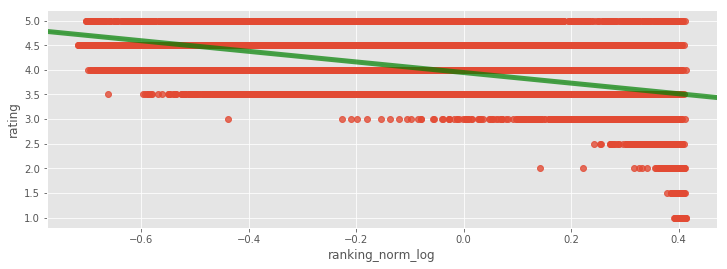

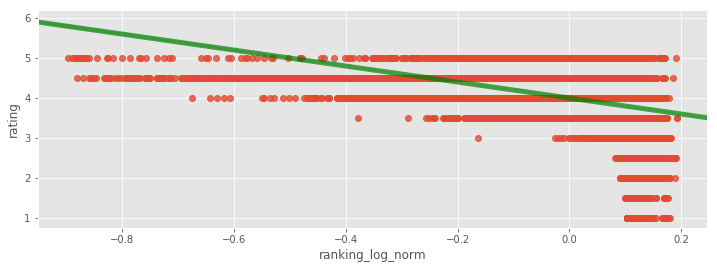

In [49]:
sns.regplot(x=data[data['sample']==1]['ranking_norm_log'], y=data[data['sample']==1]['rating'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
sns.regplot(x=data[data['sample']==1]['ranking_log_norm'], y=data[data['sample']==1]['rating'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

In [50]:
#data[data['ranking_norm'].isin(sorted(list(set(data[data['sample']==0]['ranking_norm'].tolist())))[:25])]
#data[data['ranking_norm'].isin(sorted(list(set(data[data['sample']==0]['ranking_norm'].tolist())))[-25:])]

### Feature patterns

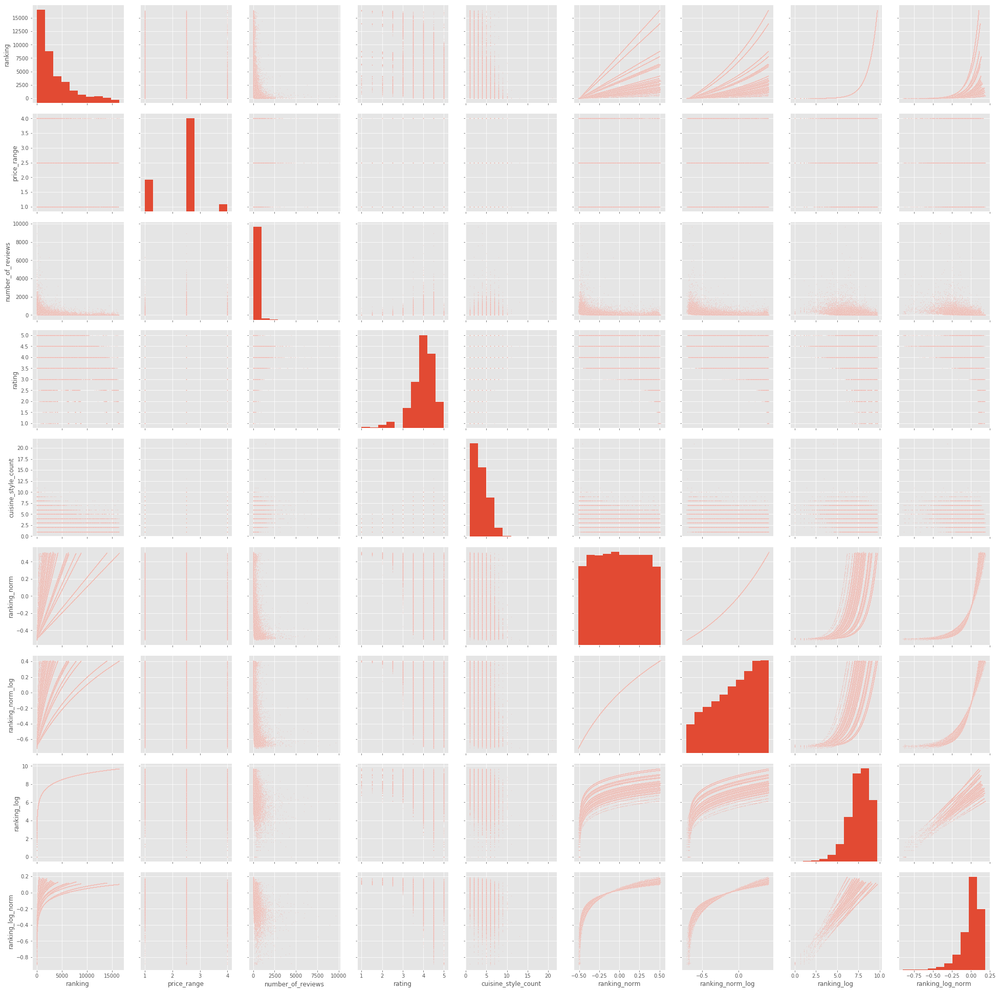

In [51]:
sns.pairplot(data[data['sample']==1].copy().drop('sample', axis=1), 
             plot_kws={"s": 2, "alpha": 0.2}, height=3)

### Feature relationships

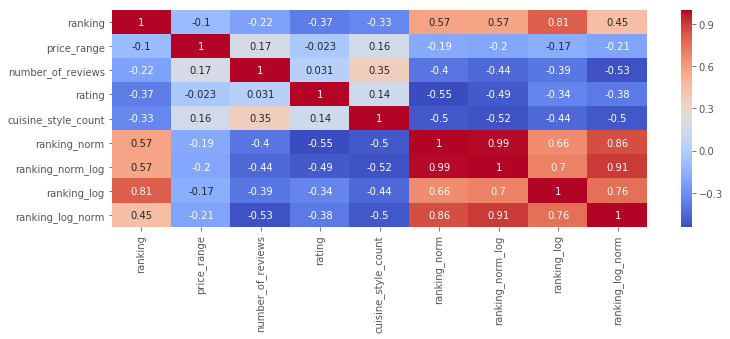

In [52]:
# Computes feature correlation
sns.heatmap(data.copy().loc[data['sample']==1].drop('sample', axis=1).corr(method="pearson"), 
            annot=True, cmap='coolwarm')


- ranking - ranking_norm = 0.57                        **
- rating - ranking_norm = -0.55
- ranking_norm - cuisine_style_count = -0.5
- ranking_norm - number_of_reviews = -0.4
- rating - ranking = -0.37                            *
- number_of_reviews - cuisine_style_count = 0.35
- ranking - cuisine_style_count = -0.33               *
- number_of_reviews - ranking = -0.22                 *

Let's take a closer look at the target variable

In [53]:
city_count_1 = data.query('sample==1')['city'].value_counts()
city_count_0 = data.query('sample==0')['city'].value_counts()
data['city_count'] = data['city'].dropna().apply(lambda x: city_count_1[x] if x in city_count_1.index else (city_count_0[x] if x in city_count_0.index else np.nan))

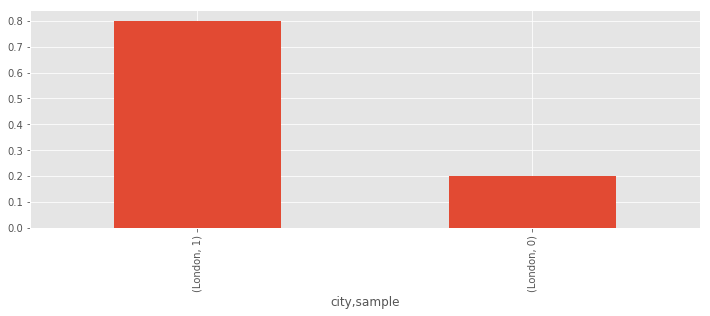

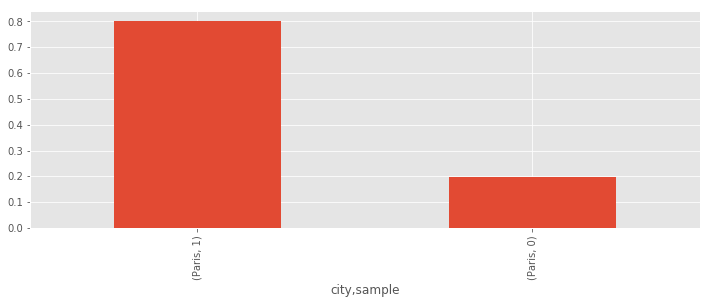

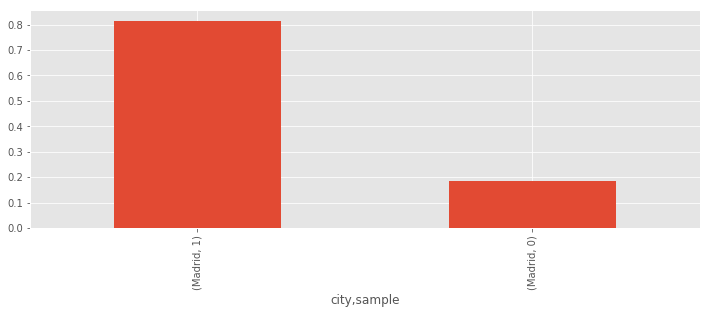

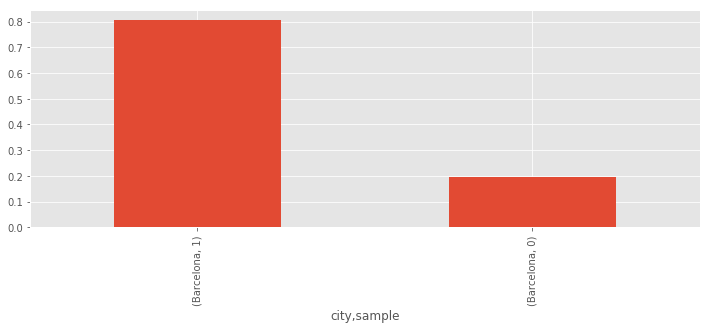

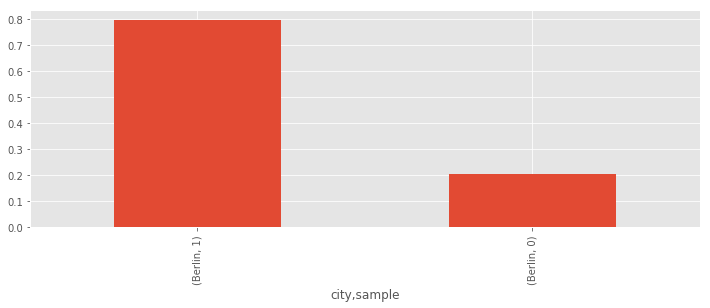

In [54]:
for city in city_count_1.head().index:
    data[data['city']==city].groupby('city')['sample'].value_counts(normalize=True).plot.bar()
    plt.show()

The samples are balanced by **city**.

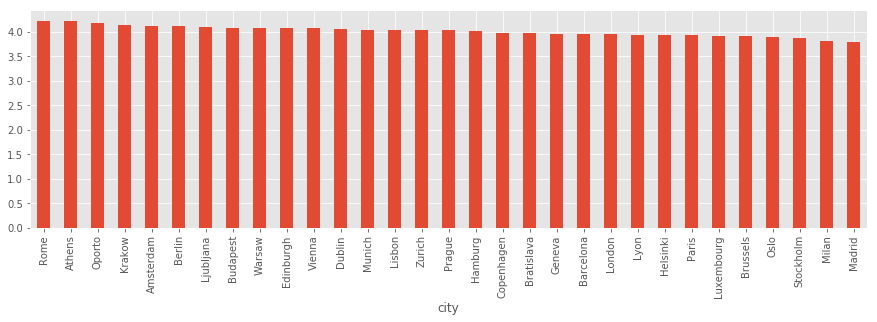

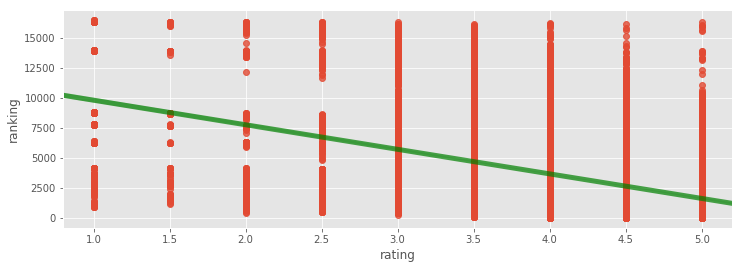

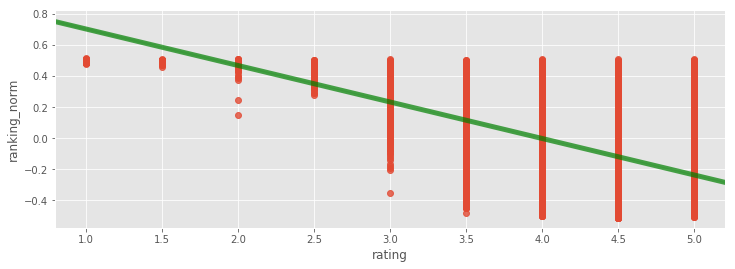

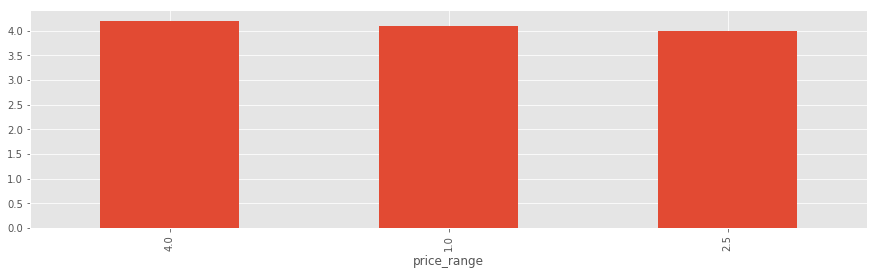

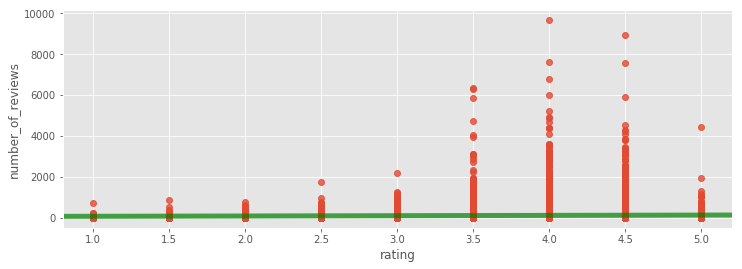

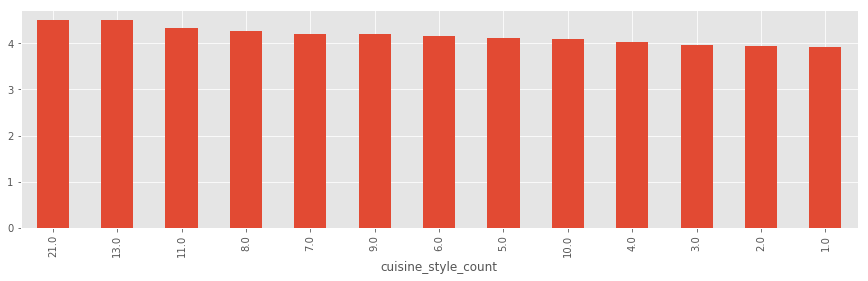

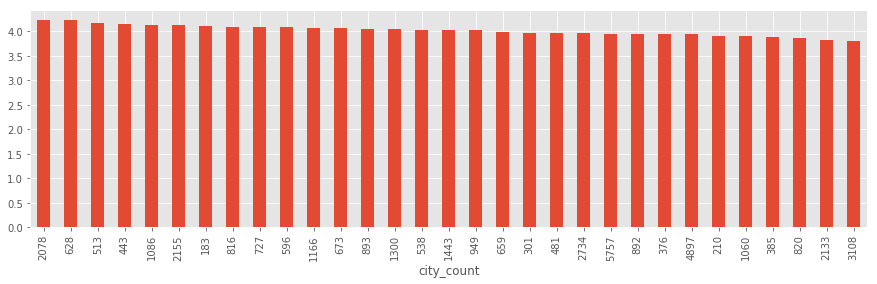

In [55]:
for col in ['city', 'ranking', 'ranking_norm', 'price_range', 'number_of_reviews', 'cuisine_style_count', 'city_count']:
    if data[col].nunique() <= 31:
        data.query('sample==1').groupby(col)['rating'].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4))
        plt.show()
    else:
        sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')[col], line_kws={"color":"g","alpha":0.7,"lw":5})
        plt.show()

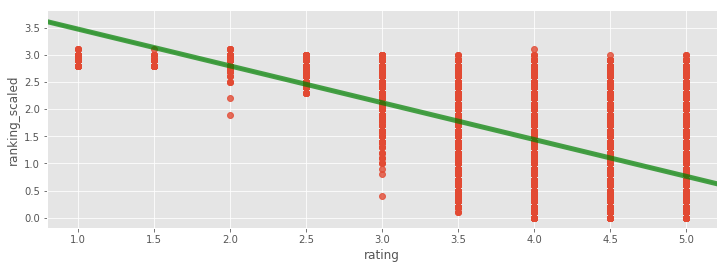

In [56]:
data['ranking_scaled'] = round(data['ranking'] / data['city_count'], 1)

sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')['ranking_scaled'], line_kws={"color":"g","alpha":0.7,"lw":5})

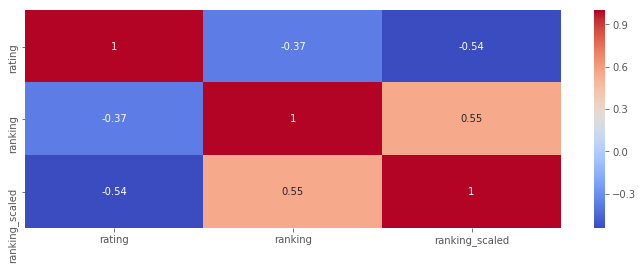

In [57]:
sns.heatmap(data.query('sample==1')[['rating', 'ranking', 'ranking_scaled']].corr(), annot = True, cmap = 'coolwarm')

The greatest dependence of the target variable **rating** is observed from **ranking_norm**.

Weak dependencies (not necessarily linear) **rating** are traced from
- **city**
-**price_range**
- **cuisine_style_count**
- **city_count** - how many restaurants are there in the city

Check the parameters for statistical significance.

In [58]:
data = data.drop(['ranking_norm', 'ranking_norm_log', 'ranking_log', 'ranking_log_norm', 'ranking_scaled'], axis=1)

In [59]:
# DIDN'T USE

from scipy.stats import ttest_ind
from scipy.stats import t

# check if there is a statistical difference in the distribution of the Number of Reviews by these criteria using the Student's test
def get_stat_dif(param, column, alpha, n):
    df = data[[param, column]].dropna()
    cols = df.loc[:, column].value_counts().index[:n]
    combinations_all = list(combinations(cols, 2)) # combinations('ABCD', 2) -> AB AC AD BC BD CD
    for comb in combinations_all:
        p_value = ttest_ind(df.loc[df.loc[:, column] == comb[0], param], 
                            df.loc[df.loc[:, column] == comb[1], param]).pvalue
        alpha_new = alpha/len(combinations_all) # Bonferroni amendment
        if p_value <= alpha_new:
            print('Statistically significant differences were found at the {} significance level for the feature {}, pvalue: {}'.format(round(alpha_new, 10), column, round(p_value, 10)))
            break
        
    p_value_dict.update({column: [round(alpha_new, 10), round(p_value, 10)]})
    
    
def get_stat_dif_(param, column, data, alpha, n):
    df = data[[param, column]].dropna()
    cols = df.loc[:, column].value_counts().index[:n]
    combinations_all = list(combinations(cols, 2)) # combinations('ABCD', 2) -> AB AC AD BC BD CD
    for comb in combinations_all:
        p_value = ttest_ind(df.loc[df.loc[:, column] == comb[0], param], 
                            df.loc[df.loc[:, column] == comb[1], param]).pvalue
        alpha_new = alpha/len(combinations_all) # Bonferroni amendment
        if p_value <= alpha_new:
            print('Statistically significant differences were found at the {} significance level for the feature {}, pvalue: {}'.format(round(alpha_new, 10), column, round(p_value, 10)))
            break
            
    p_value_dict.update({column: [round(alpha_new, 10), round(p_value, 10)]})

    
def t_test_diff(alpha, s_1, s_2, n_1, n_2, mean_1, mean_2, side): # left, right, dubble

    t_st = (mean_1 - mean_2) / (math.sqrt(s_1**2/n_1 + s_2**2/n_2))
    k = n_1 + n_2 - 2

    if side == 'left':
        print('T statistic is {}'.format(t_st))
        print('T critical is {}'.format(t.ppf(alpha, k)), end='\n\n')
        p_value = t.cdf(t_st, k)

    elif side == 'right':
        print('T statistic is {}'.format(t_st))
        print('T critical is {}'.format(-t.ppf(alpha, k)), end='\n\n')
        p_value = t.sf(t_st, k) # t.sf() = 1 - t.cdf()

    else:
        #t_st_list = (t_st, -t_st)
        print('T statistic is {}'.format(abs(t_st)))
        print('T critical is {}'.format(abs(t.ppf(alpha / 2, k))), end='\n\n') # !!!!!
        p_value = 2*(t.sf(abs(t_st), k)) # 1 - t.cdf(max(t_st_list)) + t.cdf(min(t_st_list))
    
    print('p_value is {}'.format(p_value))
    if p_value < alpha:
        print('H0 hypothesis at the significance level of {} is rejected in favor of H1'.format(alpha))
    else:
        print('H0 hypothesis at the significance level of {} was confirmed'.format(alpha))


# EDA

## rating by price_range & city

Price range 2.5 Total count 18412



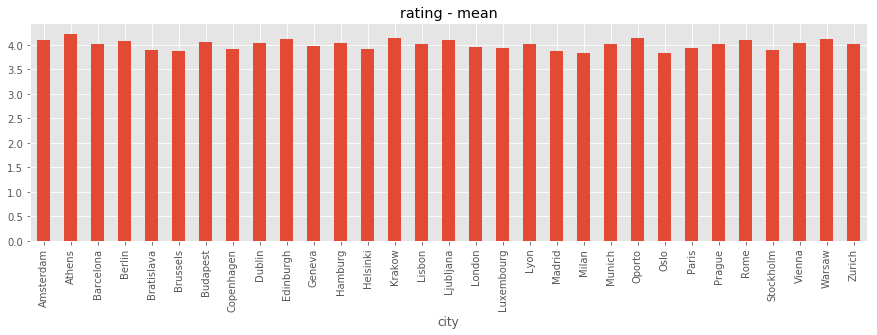

city
Athens       4.227273
Krakow       4.137640
Oporto       4.129808
Warsaw       4.115385
Edinburgh    4.112853
Name: rating, dtype: float64

city
Stockholm    3.894521
Brussels     3.882066
Madrid       3.879216
Oslo         3.829082
Milan        3.827542
Name: rating, dtype: float64

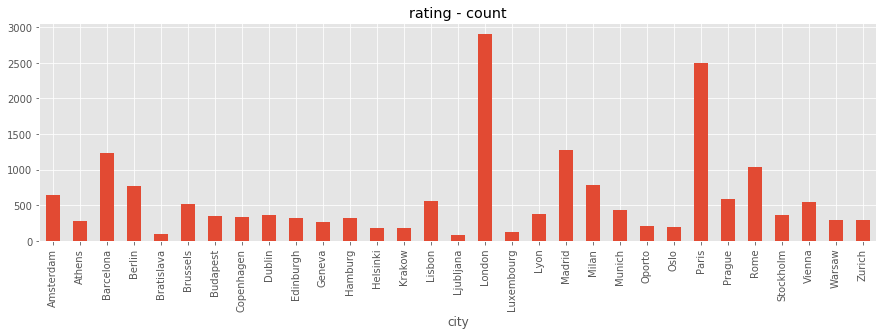

city
London       2908
Paris        2501
Madrid       1275
Barcelona    1229
Rome         1041
Name: rating, dtype: int64

city
Helsinki      184
Krakow        178
Luxembourg    128
Bratislava     97
Ljubljana      86
Name: rating, dtype: int64


Price range 4.0 Total count 1423



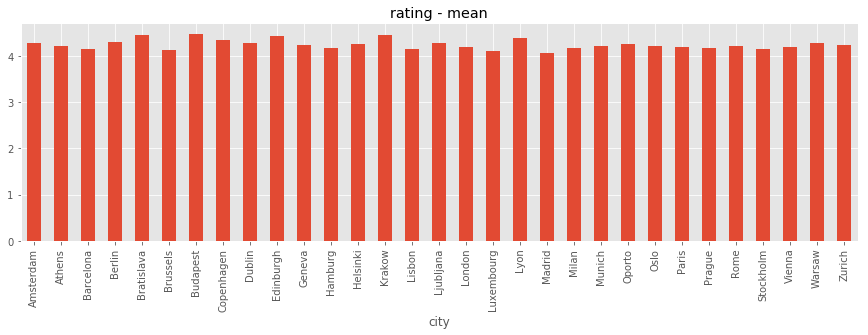

city
Budapest      4.477273
Bratislava    4.450000
Krakow        4.450000
Edinburgh     4.437500
Lyon          4.391304
Name: rating, dtype: float64

city
Barcelona     4.140449
Stockholm     4.140000
Brussels      4.131579
Luxembourg    4.111111
Madrid        4.054455
Name: rating, dtype: float64

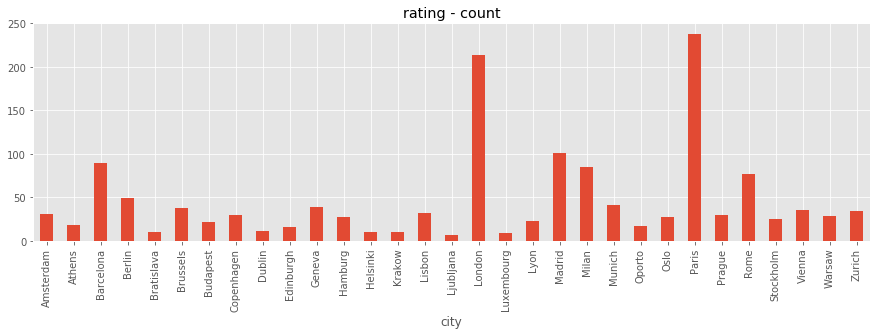

city
Paris        238
London       214
Madrid       101
Barcelona     89
Milan         85
Name: rating, dtype: int64

city
Krakow        10
Helsinki      10
Bratislava    10
Luxembourg     9
Ljubljana      7
Name: rating, dtype: int64


Price range 1.0 Total count 6279



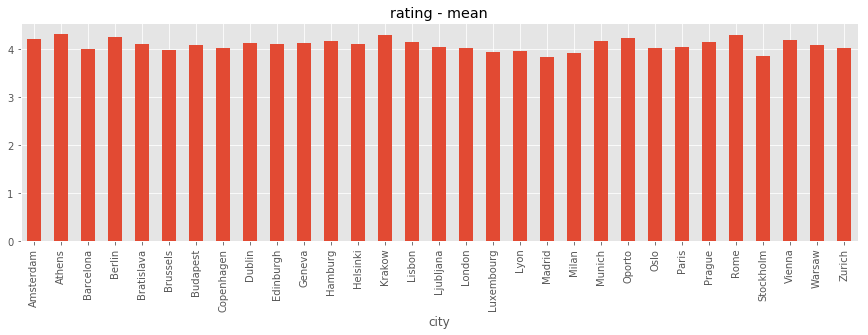

city
Athens    4.328467
Rome      4.310507
Krakow    4.310345
Berlin    4.262121
Oporto    4.242308
Name: rating, dtype: float64

city
Lyon          3.967105
Luxembourg    3.954545
Milan         3.921429
Stockholm     3.870000
Madrid        3.832873
Name: rating, dtype: float64

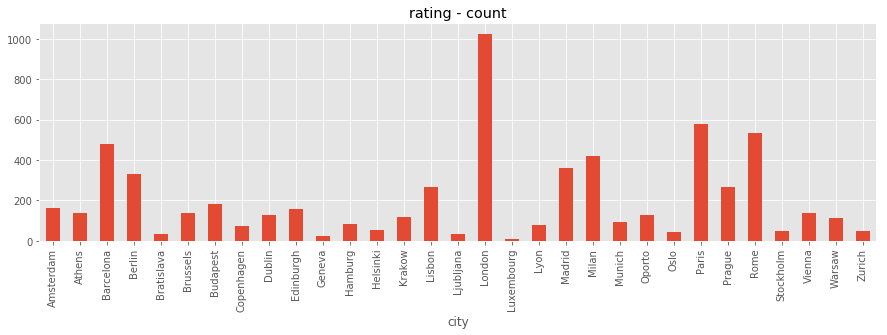

city
London       1025
Paris         579
Rome          533
Barcelona     480
Milan         420
Name: rating, dtype: int64

city
Oslo          42
Ljubljana     35
Bratislava    33
Geneva        23
Luxembourg    11
Name: rating, dtype: int64

In [60]:
for price in data.price_range.copy().dropna().unique():
    print('Price range ' + str(price) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['price_range']==price)]['rating'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].mean().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].mean().sort_values(ascending=False).tail())
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].count().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - count')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].count().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['rating'].count().sort_values(ascending=False).tail())
    
    print('')

In [61]:
data.price_range.value_counts(normalize=True)

2.5    0.705935
1.0    0.239468
4.0    0.054597
Name: price_range, dtype: float64

In [62]:
data.loc[(data['sample']==1)&(data['city'].isin(['Athens', 'Krakow', 'Oporto', 'Edinburgh', 'Warsaw', 'Bratislava', 'Budapest', 'Lyon', 'Rome', 'Berlin']))].groupby('city')['rating'].count().sort_values(ascending=False)

city
Berlin        2155
Rome          2078
Lyon           892
Budapest       816
Warsaw         727
Athens         628
Edinburgh      596
Oporto         513
Krakow         443
Bratislava     301
Name: rating, dtype: int64

In [63]:
data.loc[(data['sample']==1)].groupby('city')['rating'].count().sort_values(ascending=False).head(10)

city
London       5757
Paris        4897
Madrid       3108
Barcelona    2734
Berlin       2155
Milan        2133
Rome         2078
Prague       1443
Lisbon       1300
Vienna       1166
Name: rating, dtype: int64

In [64]:
data.loc[(data['sample']==1)&(data['city'].isin(['London', 'Paris', 'Madrid', 'Barcelona', 'Rome', 'Milan']))].groupby('city')['rating'].mean().sort_values(ascending=False)

city
Rome         4.230269
Barcelona    3.961229
London       3.955098
Paris        3.942414
Milan        3.824895
Madrid       3.800837
Name: rating, dtype: float64

In [65]:
data.loc[(data['sample']==1)&(data['city']=='Luxembourg')&(data['price_range']==2.5)]['rating'].mean()

3.9375

1. In 71% **price_range** - average level. At the same time, the average **rating** for cities in this price range is lower (3.8-4.2) than in expensive (5%: 4.1-4.5) and cheap (24%: 3.8-4.3).
2. The highest **rating** belong to cities not belonging to the top ten with the highest a large number of restaurants except Berlin and Rome, but not with the smallest number.
3. Conversely, the cities out of the top ten with the largest number of restaurants have some of the lowest ratings except Luxembourg (few restaurants - no average rating).

Therefore, the following are important for us:
- **city**
- **city_price_count** - how many restaurants of this price range are in the city

What about
- **city_price_rating_mean**
- **city_price_rating_std**

???

## rating by price_range & cuisine_style_count

Price range 2.5 Total count 18412



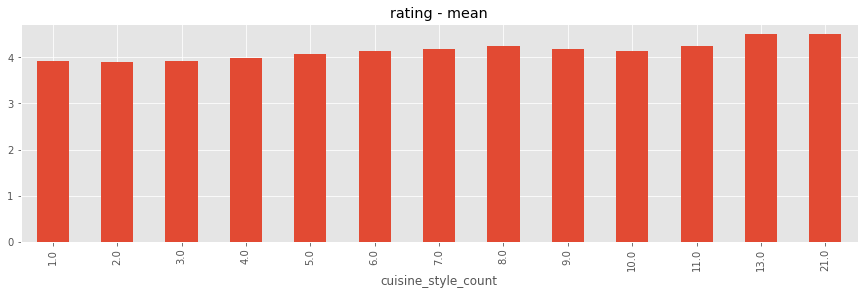

cuisine_style_count
21.0    4.50
13.0    4.50
11.0    4.25
Name: rating, dtype: float64

cuisine_style_count
3.0    3.925999
1.0    3.925811
2.0    3.896435
Name: rating, dtype: float64

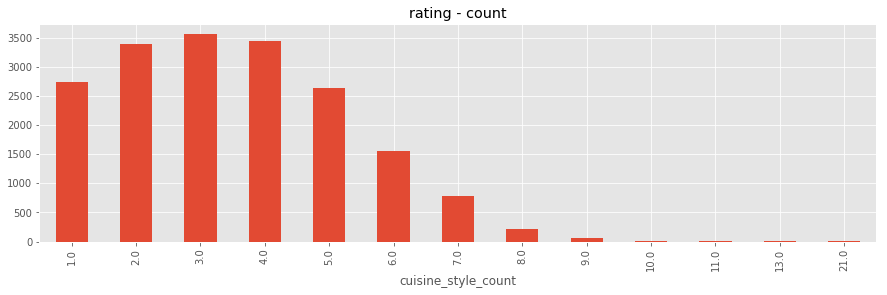

cuisine_style_count
3.0    3554
4.0    3443
2.0    3394
Name: rating, dtype: int64

cuisine_style_count
11.0    2
21.0    1
13.0    1
Name: rating, dtype: int64


Price range 4.0 Total count 1423



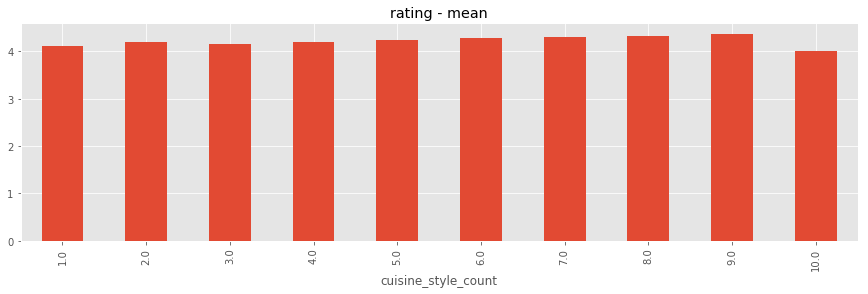

cuisine_style_count
9.0    4.375000
8.0    4.333333
7.0    4.303571
Name: rating, dtype: float64

cuisine_style_count
3.0     4.151575
1.0     4.114035
10.0    4.000000
Name: rating, dtype: float64

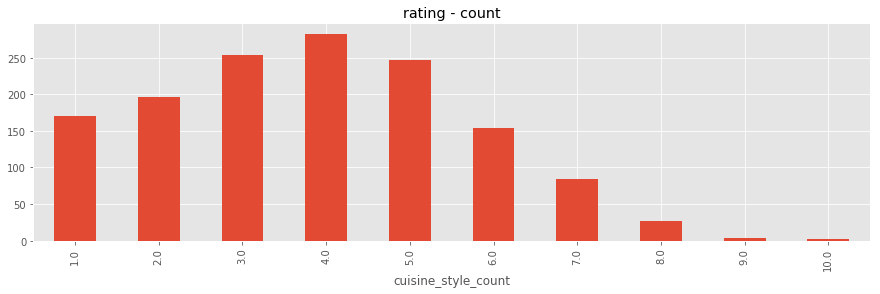

cuisine_style_count
4.0    283
3.0    254
5.0    247
Name: rating, dtype: int64

cuisine_style_count
8.0     27
9.0      4
10.0     2
Name: rating, dtype: int64


Price range 1.0 Total count 6279



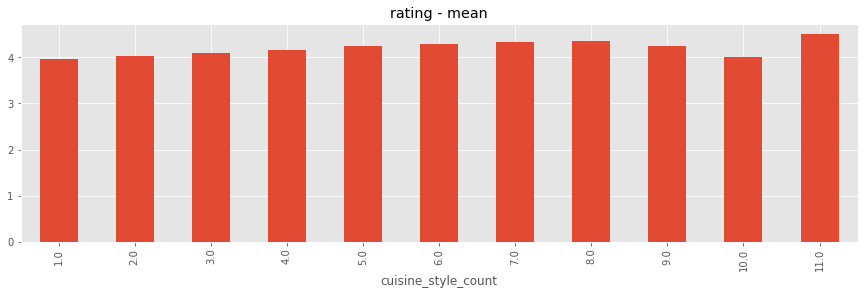

cuisine_style_count
11.0    4.500000
8.0     4.357143
7.0     4.326531
Name: rating, dtype: float64

cuisine_style_count
2.0     4.026298
10.0    4.000000
1.0     3.977598
Name: rating, dtype: float64

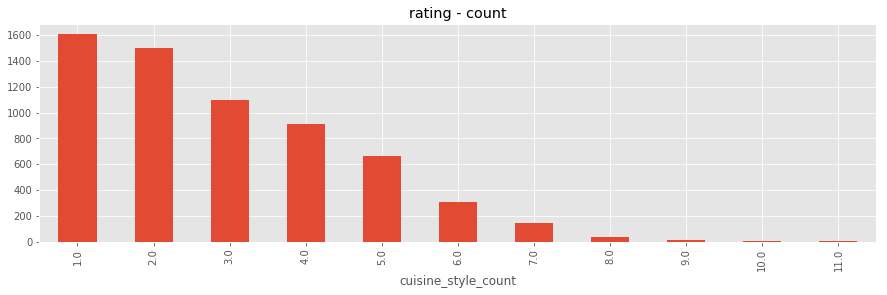

cuisine_style_count
1.0    1607
2.0    1502
3.0    1100
Name: rating, dtype: int64

cuisine_style_count
9.0     10
10.0     3
11.0     1
Name: rating, dtype: int64

In [66]:
for price in data.price_range.copy().dropna().unique():
    print('Price range ' + str(price) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['price_range']==price)]['rating'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].mean().sort_values(ascending=False).head(3))
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].mean().sort_values(ascending=False).tail(3))
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].count().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - count')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].count().sort_values(ascending=False).head(3))
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('cuisine_style_count')['rating'].count().sort_values(ascending=False).tail(3))
    
    print('')

Price range 2.5 Total count 18412



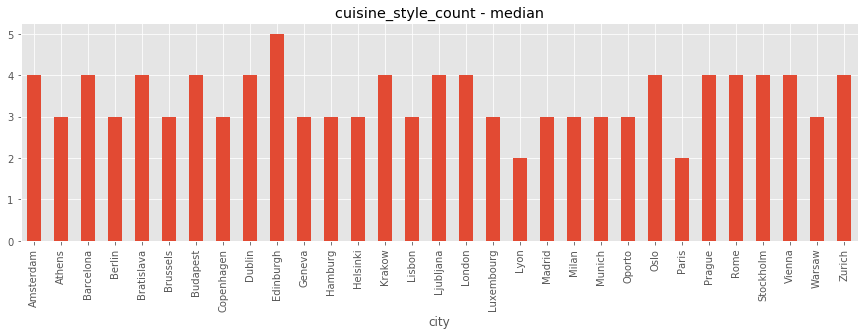

city
Edinburgh     5.0
Zurich        4.0
London        4.0
Barcelona     4.0
Bratislava    4.0
Name: cuisine_style_count, dtype: float64

city
Luxembourg    3.0
Madrid        3.0
Geneva        3.0
Paris         2.0
Lyon          2.0
Name: cuisine_style_count, dtype: float64


Price range 4.0 Total count 1423



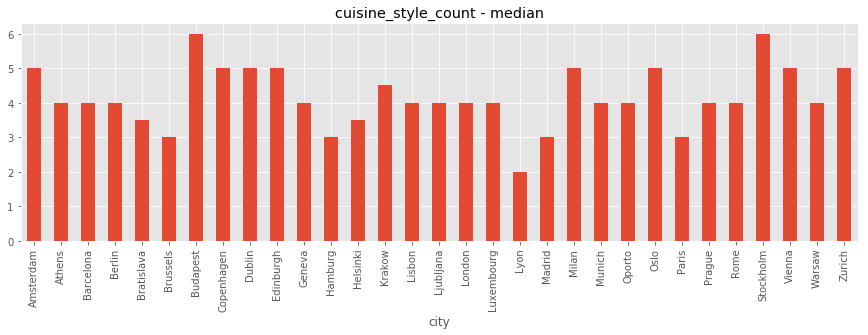

city
Budapest      6.0
Stockholm     6.0
Zurich        5.0
Milan         5.0
Copenhagen    5.0
Name: cuisine_style_count, dtype: float64

city
Paris       3.0
Brussels    3.0
Madrid      3.0
Hamburg     3.0
Lyon        2.0
Name: cuisine_style_count, dtype: float64


Price range 1.0 Total count 6279



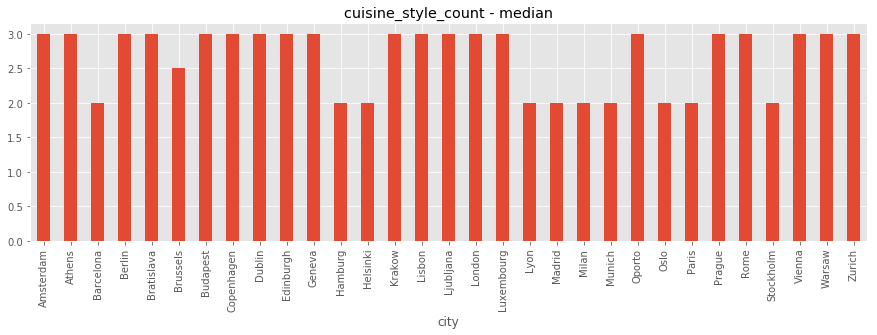

city
Zurich        3.0
London        3.0
Athens        3.0
Berlin        3.0
Bratislava    3.0
Name: cuisine_style_count, dtype: float64

city
Milan        2.0
Stockholm    2.0
Barcelona    2.0
Madrid       2.0
Oslo         2.0
Name: cuisine_style_count, dtype: float64

In [67]:
for price in data.price_range.copy().dropna().unique():
    print('Price range ' + str(price) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['price_range']==price)]['cuisine_style_count'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['cuisine_style_count'].median().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('cuisine_style_count - median')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['cuisine_style_count'].median().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['cuisine_style_count'].median().sort_values(ascending=False).tail())
    
    print('')

## rating by number_of_reviews

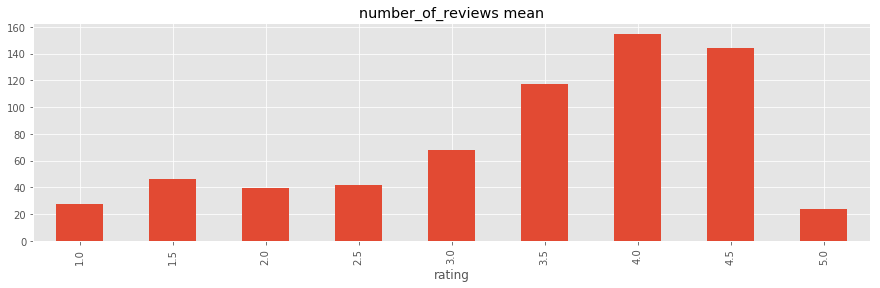

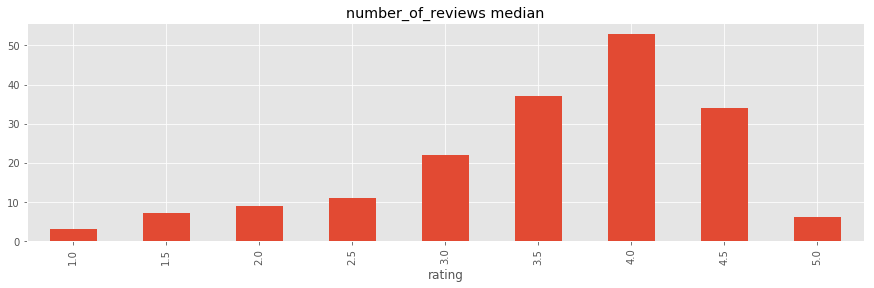

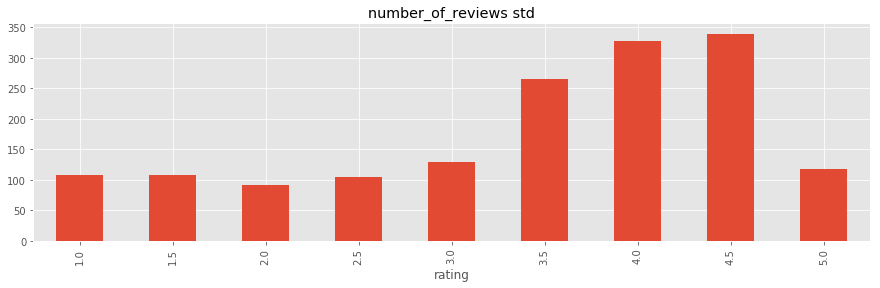

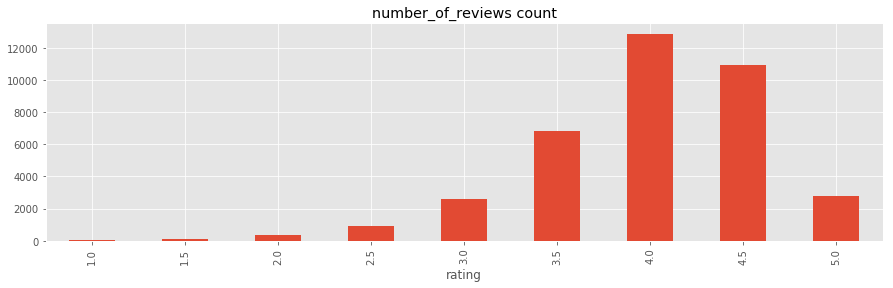

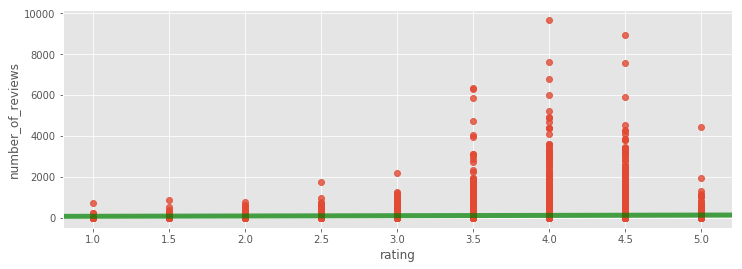

In [68]:
data.query('sample==1').groupby(['rating'])['number_of_reviews'].mean().plot.bar(figsize=(15, 4), title='number_of_reviews mean')
plt.show()
data.query('sample==1').groupby(['rating'])['number_of_reviews'].median().plot.bar(figsize=(15, 4), title='number_of_reviews median')
plt.show()
data.query('sample==1').groupby(['rating'])['number_of_reviews'].std().plot.bar(figsize=(15, 4), title='number_of_reviews std')
plt.show()
data.query('sample==1').groupby(['rating'])['number_of_reviews'].count().plot.bar(figsize=(15, 4), title='number_of_reviews count')
plt.show()
sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')['number_of_reviews'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

In [69]:
import math

# divide all restaurants into conditional groups by frequency of occurrence
def get_param_scale(cell):
    for el in percentile_75_list:
        if cell < el+1:
            cell = el
            break
    
    return cell


# as a criterion , let 's take the percentile
def get_percentile(pc, df, col):
    percentile_list = []
    percentile = 0
    col_max = max(df[col])

    while math.ceil(col_max) > math.ceil(percentile):
        percentile = math.ceil(np.percentile(df.loc[(df[col]>percentile)][col], pc))
        percentile_list.append(percentile)
        
    return percentile_list

In [70]:
percentile_75_list = get_percentile(75, data, 'number_of_reviews')
data['number_of_reviews_ord'] = data['number_of_reviews'].dropna().apply(get_param_scale)
print('number_of_reviews_ord:', data['number_of_reviews_ord'].nunique(), '-', data['number_of_reviews_ord'].unique())

number_of_reviews_ord: 9 - [ 115.  461.   nan 1059. 5216. 3433. 1968. 7599. 9294. 9660.]


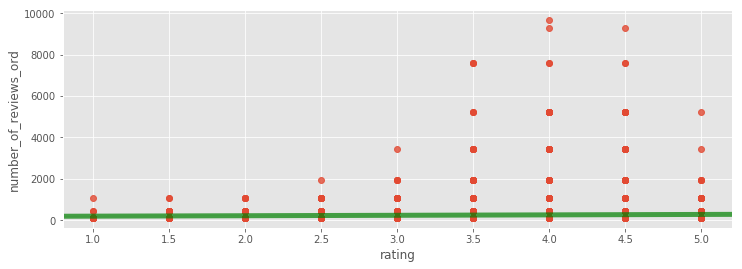

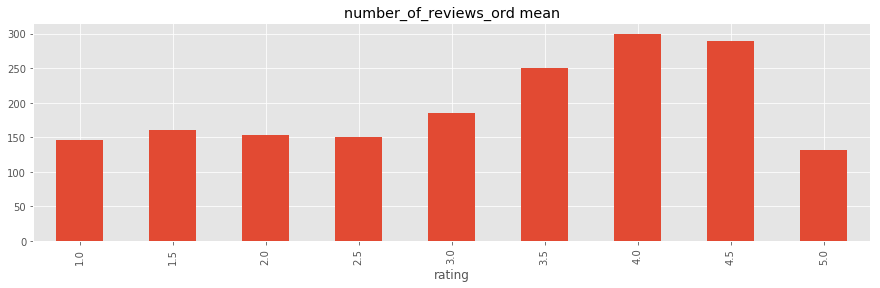

In [71]:
sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')['number_of_reviews_ord'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
data.query('sample==1').groupby(['rating'])['number_of_reviews_ord'].mean().plot.bar(figsize=(15, 4), title='number_of_reviews_ord mean')
plt.show()

In [72]:
quartile_1, quartile_3 = data.query('sample==1')['number_of_reviews'].quantile(0.25), data.query('sample==1')['number_of_reviews'].quantile(0.75)
iqr = quartile_3 - quartile_1
upper_bound = quartile_3 + (iqr * 1.5)
print('quartile_1:', quartile_1, 'quartile_3:', quartile_3, 'upper_bound:', upper_bound)

quartile_1: 9.0 quartile_3: 115.0 upper_bound: 274.0


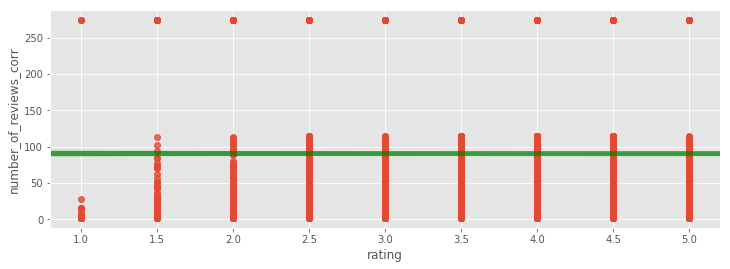

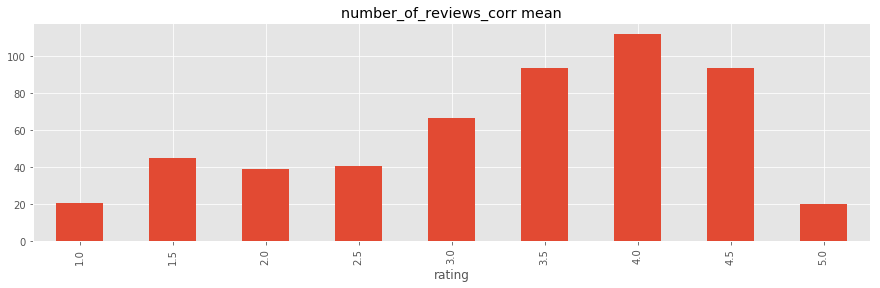

In [73]:
data['number_of_reviews_corr'] = data['number_of_reviews'].dropna().apply(lambda x: upper_bound if x>quartile_3 else x)

sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')['number_of_reviews_corr'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
data.query('sample==1').groupby(['rating'])['number_of_reviews_corr'].mean().plot.bar(figsize=(15, 4), title='number_of_reviews_corr mean')
plt.show()

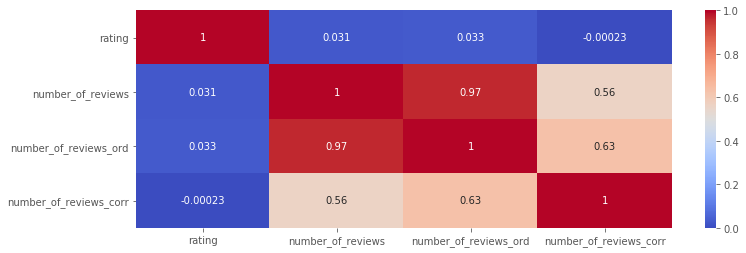

In [74]:
sns.heatmap(data.query('sample==1')[['rating', 'number_of_reviews', 'number_of_reviews_ord', 'number_of_reviews_corr']].corr(), annot = True, cmap = 'coolwarm')

In [75]:
data = data.drop(['number_of_reviews_ord', 'number_of_reviews_corr'], axis=1)

Attempts to convert the **number_of_reviews** feature to categorical or to get rid of outliers did not lead to a significant increase in the linear dependence with the target variable in the first case, or led to a significant deterioration in the linear dependence in the second. In both cases, the informative value of the feature in relation to the target variable has decreased - let's look for another way to use this feature.

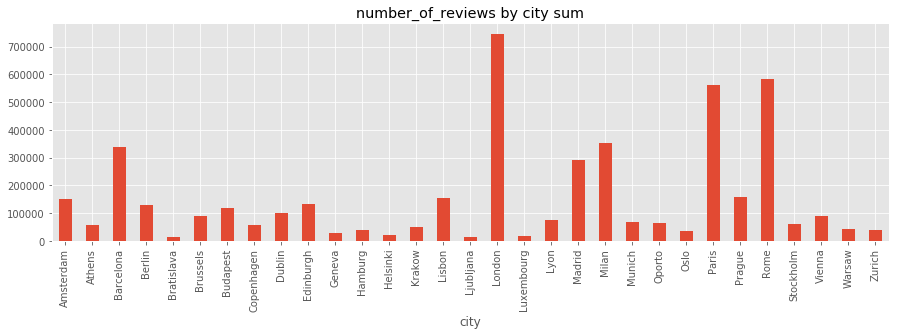

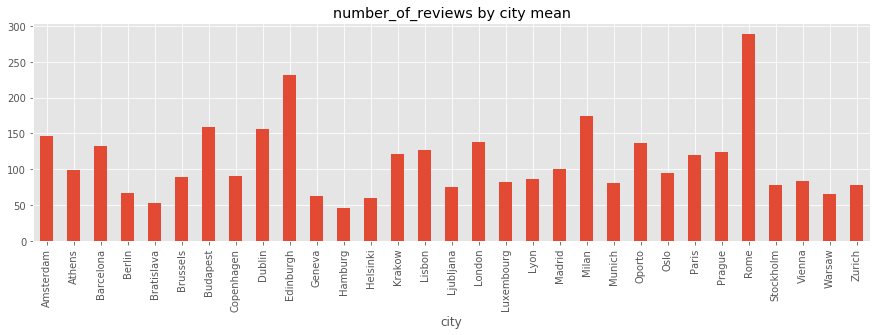

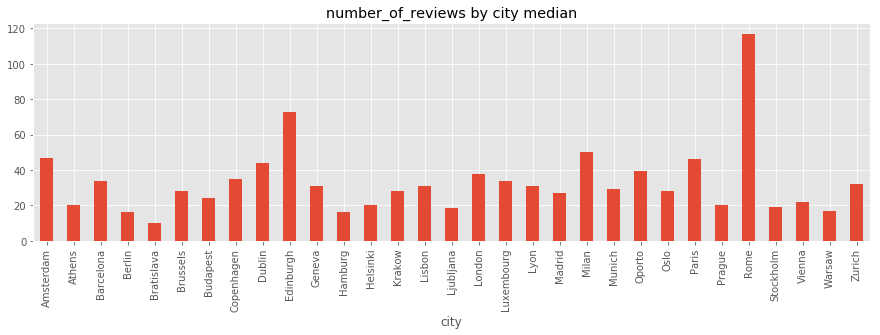

In [76]:
data.query('sample==1').groupby(['city'])['number_of_reviews'].sum().plot.bar(figsize=(15, 4), title='number_of_reviews by city sum')
plt.show()
data.query('sample==1').groupby(['city'])['number_of_reviews'].mean().plot.bar(figsize=(15, 4), title='number_of_reviews by city mean')
plt.show()
data.query('sample==1').groupby(['city'])['number_of_reviews'].median().plot.bar(figsize=(15, 4), title='number_of_reviews by city median')
plt.show()

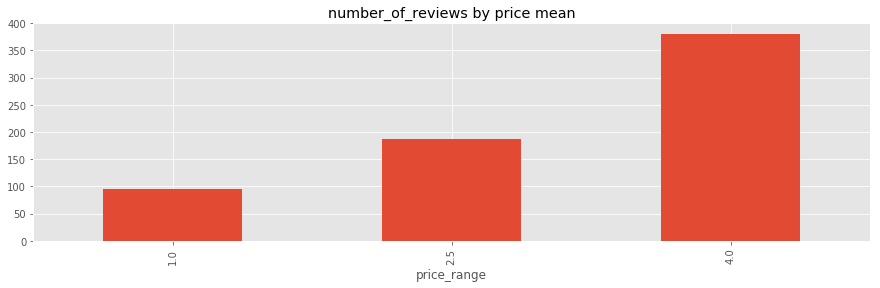

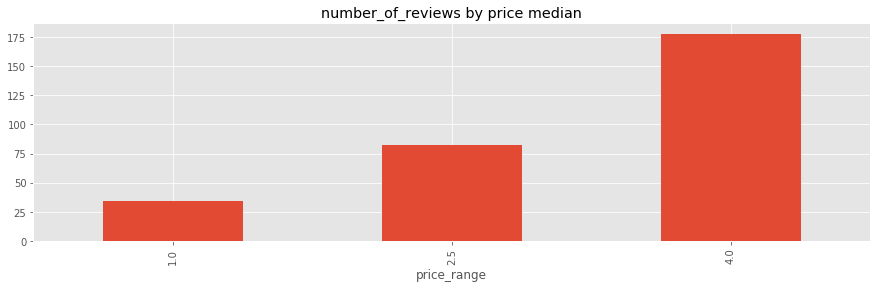

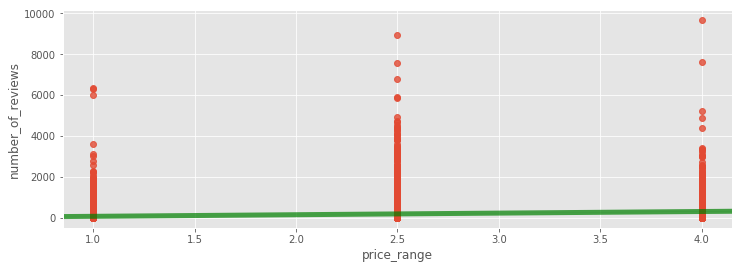

In [77]:
data.query('sample==1').groupby(['price_range'])['number_of_reviews'].mean().plot.bar(figsize=(15, 4), title='number_of_reviews by price mean')
plt.show()
data.query('sample==1').groupby(['price_range'])['number_of_reviews'].median().plot.bar(figsize=(15, 4), title='number_of_reviews by price median')
plt.show()
sns.regplot(x=data.query('sample==1')['price_range'], y=data.query('sample==1')['number_of_reviews'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

Price range 2.5 Total count 18197



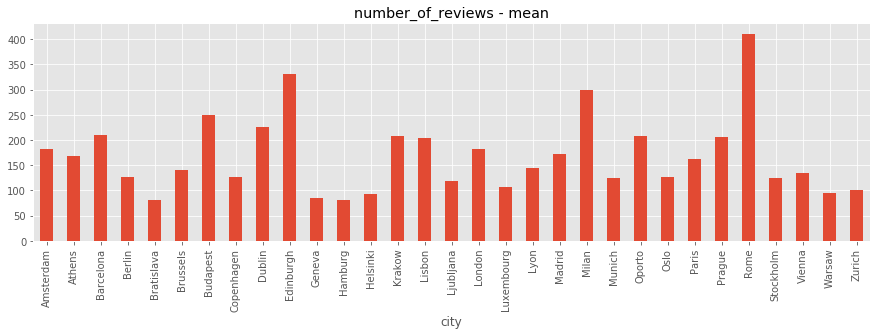

city
Rome         410.839458
Edinburgh    331.730408
Milan        299.321244
Budapest     250.385714
Dublin       226.336066
Name: number_of_reviews, dtype: float64

city
Warsaw        95.033784
Helsinki      92.786885
Geneva        85.263359
Bratislava    80.639175
Hamburg       80.428125
Name: number_of_reviews, dtype: float64


Price range 4.0 Total count 1392



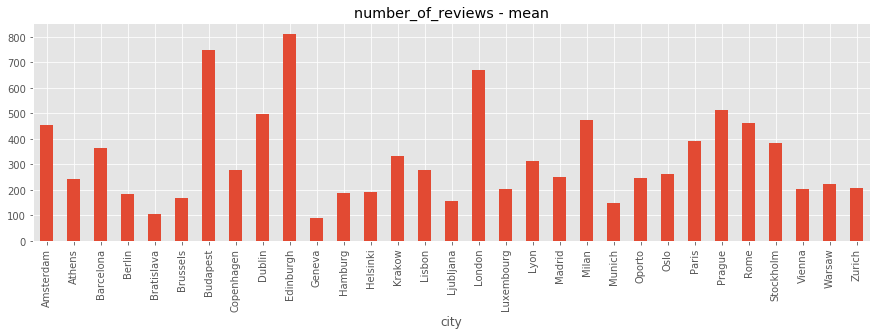

city
Edinburgh    812.000000
Budapest     748.772727
London       668.426471
Prague       513.689655
Dublin       497.000000
Name: number_of_reviews, dtype: float64

city
Brussels      168.594595
Ljubljana     154.166667
Munich        149.463415
Bratislava    105.400000
Geneva         90.500000
Name: number_of_reviews, dtype: float64


Price range 1.0 Total count 6105



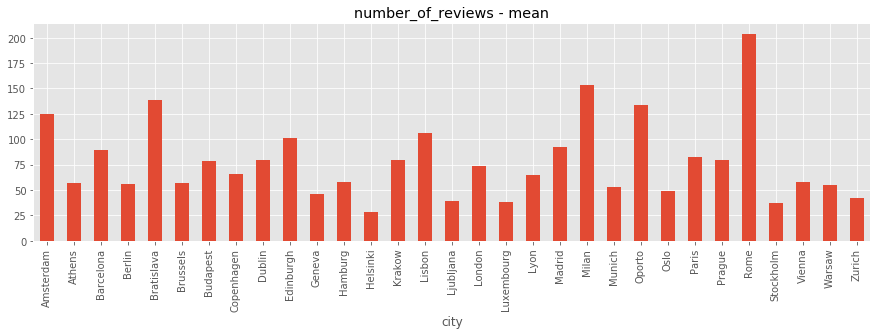

city
Rome          203.899240
Milan         153.474820
Bratislava    139.000000
Oporto        133.961240
Amsterdam     125.070513
Name: number_of_reviews, dtype: float64

city
Zurich        41.851064
Ljubljana     39.636364
Luxembourg    38.375000
Stockholm     37.541667
Helsinki      28.760000
Name: number_of_reviews, dtype: float64

In [78]:
for price in data.price_range.copy().dropna().unique():
    print('Price range ' + str(price) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['price_range']==price)]['number_of_reviews'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['number_of_reviews'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('number_of_reviews - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['number_of_reviews'].mean().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('city')['number_of_reviews'].mean().sort_values(ascending=False).tail())
    
    print('')

1. Attempts to convert the **number_of_reviews** feature to categorical or to get rid of outliers did not lead to a significant increase in the linear dependence with the target variable in the first case, or led to a significant deterioration in the linear dependence in the second. In both cases, the informative value of the feature in relation to the target variable has decreased.
2. Most reviews are left in expensive restaurants in cities with a high and average number of restaurants. Next in descending order are the average and low price levels.

## url_ta

In [79]:
data['url_ta'].tolist()[0].split('-')

['/Restaurant_Review',
 'g187147',
 'd10746918',
 'Reviews',
 'Le_Perchoir',
 'Paris_Ile_de_France.html']

In [80]:
pd.DataFrame({'id_ta': data['id_ta'].tolist(),
              'attrib_count': [len(x.split('-')) for x in data['url_ta'].tolist()]
             }).dropna().describe()

,attrib_count
count,50000.000000
mean,5.999960
std,0.006324
min,5.000000
25%,6.000000
50%,6.000000
75%,6.000000
max,6.000000


In [81]:
# get the data about the name of the restaurant (or chain?), the region and some other g-code from URL_TA
data['name'] = data['url_ta'].dropna().apply(lambda x: x.split('-')[4].replace('.html', ''))
data['region'] = data['url_ta'].dropna().apply(lambda x: x.split('-')[5].replace('.html', '') if len(x.split('-'))>5 else x.split('-')[4].replace('.html', ''))
data['g_code'] = data['url_ta'].dropna().apply(lambda x: x.split('-')[1])

In [82]:
for el in data.loc[data['name'] == data['region']]['url_ta'].tolist():
    print(el, data.loc[data['url_ta']==el]['name'].unique())

/Restaurant_Review-g189400-d8810157-Reviews-Athens_Attica.html ['Athens_Attica']
/Restaurant_Review-g187323-d12551161-Reviews-Berlin-Berlin.html ['Berlin']
/Restaurant_Review-g189400-d9570812-Reviews-Athens_Attica.html ['Athens_Attica']


In [83]:
# in some cases, there is no indication of the name, then the region is pulled up - let's fix it
data.iloc[data.loc[data['name'] == data['region']].index.tolist(), data.columns.tolist().index('name')] = np.nan
data['name'] = data['name'].dropna().apply(lambda x: x.lower())
data['region'] = data['region'].dropna().apply(lambda x: x.lower())

data[data.name.isna()==True]

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating,cuisine_style_count,city_count,name,region,g_code
10770,id_1349,Athens,NaN,1351.0,NaN,3.0,"[[], []]",/Restaurant_Review-g189400-d8810157-Reviews-At...,d8810157,1,4.5,NaN,628,NaN,athens_attica,g189400
14140,id_5190,Berlin,NaN,5192.0,NaN,NaN,"[[], []]",/Restaurant_Review-g187323-d12551161-Reviews-B...,d12551161,1,4.0,NaN,2155,NaN,berlin,g187323
15566,id_1063,Athens,Steakhouse,1065.0,4.0,NaN,"[[], []]",/Restaurant_Review-g189400-d9570812-Reviews-At...,d9570812,1,5.0,1.0,628,NaN,athens_attica,g189400


In [84]:
data[['restaurant_id', 'city', 'url_ta', 'id_ta', 'name', 'region', 'g_code']].describe()

,restaurant_id,city,url_ta,id_ta,name,region,g_code
count,50000,50000,50000,50000,49997,50000,50000
unique,13094,31,49963,49963,46267,101,74
top,id_871,London,/Restaurant_Review-g187514-d9877640-Reviews-Ra...,d3161682,mcdonald_s,london_england,g186338
freq,19,7193,2,2,148,7193,7193


**g_code**, apparently this is the **region code**

In [85]:
# count the number of mentions of unique values and get those that come across more than 1 time
# look at how many rows with them in the dataset
data.loc[data['restaurant_id'].isin(collect_repeated_items('restaurant_id'))]['restaurant_id'].count()

Unique values: 13094
Values repeated more then one time: 9287


46193

In [86]:
data[data['restaurant_id']==collect_repeated_items('restaurant_id')[0]]

Unique values: 13094
Values repeated more then one time: 9287


,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating,cuisine_style_count,city_count,name,region,g_code
0,id_0,Paris,"Bar, Pub",12963.0,2.5,4.0,"[[], []]",/Restaurant_Review-g187147-d10746918-Reviews-L...,d10746918,0,0.0,2.0,4897,le_perchoir,paris_ile_de_france,g187147
14453,id_0,Hamburg,"Lebanese, Mediterranean, Middle Eastern, Veget...",1.0,2.5,373.0,"[['Beautiful restaurant, excellent food & ser....",/Restaurant_Review-g187331-d3929905-Reviews-Re...,d3929905,1,5.0,7.0,949,restaurant_hala,hamburg,g187331
15441,id_0,Rome,Italian,1.0,2.5,409.0,"[['Unmissable experience', 'Magical evening'],...",/Restaurant_Review-g187791-d11752096-Reviews-F...,d11752096,1,5.0,1.0,2078,federica_barbara_of_bb_kitchen,rome_lazio,g187791
15936,id_0,London,"Cafe, Middle Eastern, Persian, Vegetarian Frie...",1.0,2.5,146.0,"[['Amazing cakes', 'Breakfatst'], ['01/08/2018...",/Restaurant_Review-g186338-d10517849-Reviews-R...,d10517849,1,5.0,6.0,5757,r_h_cafe_gallery,london_england,g186338
16194,id_0,Milan,"Italian, Mediterranean, Vegetarian Friendly, G...",1.0,2.5,103.0,"[['A Gem Worth Discovering', 'Loeve the food a...",/Restaurant_Review-g187849-d12949211-Reviews-D...,d12949211,1,5.0,4.0,2133,dersett,milan_lombardy,g187849
17199,id_0,Madrid,"Mediterranean, European, Spanish, Contemporary...",1.0,4.0,352.0,"[['Absolutely divine tastes and flavours', 'Lo...",/Restaurant_Review-g187514-d10428302-Reviews-C...,d10428302,1,5.0,7.0,3108,cebo,madrid,g187514
22734,id_0,Oslo,"Contemporary, European, Scandinavian, Norwegia...",1.0,4.0,578.0,"[['Classic eating at its best !', 'Expensive, ...",/Restaurant_Review-g190479-d805342-Reviews-Sta...,d805342,1,4.5,6.0,385,statholdergaarden,oslo_eastern_norway,g190479
22803,id_0,Stockholm,"European, Swedish, Scandinavian, Vegetarian Fr...",1.0,2.5,165.0,"[['Fantastic Dinner', '30th birthday feast'], ...",/Restaurant_Review-g189852-d7345323-Reviews-Ad...,d7345323,1,4.5,6.0,820,adam_albin_matstudio,stockholm,g189852
29744,id_0,Krakow,"Polish, Cafe, European, Vegetarian Friendly, V...",1.0,2.5,171.0,"[['Delicious breakfast', 'Very good'], ['01/08...",/Restaurant_Review-g274772-d10086671-Reviews-G...,d10086671,1,5.0,6.0,443,gossip_cafe,krakow_lesser_poland_province_southern_poland,g274772
31372,id_0,Lyon,"French, European, Vegetarian Friendly, Vegan O...",1.0,2.5,347.0,"[['Recommended', 'Taste and welcoming'], ['08/...",/Restaurant_Review-g187265-d12337867-Reviews-A...,d12337867,1,5.0,5.0,892,aromatic,lyon_rhone_auvergne_rhone_alpes,g187265


The logic of assigning **restaurant_id** is not clear: completely different restaurants with completely different characteristics are collected under one id.

In [87]:
# count the number of mentions of unique values and get those that come across more than 1 time
# look at how many rows with them in the dataset
data.loc[data['name'].isin(collect_repeated_items('name'))]['name'].count()

Unique values: 46268
Values repeated more then one time: 2038


5767

In [88]:
data[data['name']==collect_repeated_items('name')[1]]

Unique values: 46268
Values repeated more then one time: 2038


,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,rating,cuisine_style_count,city_count,name,region,g_code
23,id_23,Brussels,"Italian, Mediterranean, Pizza",1255.0,2.5,51.0,"[['Good pizza in Woluwe', 'Cosy environment'],...",/Restaurant_Review-g1136495-d7653791-Reviews-P...,d7653791,0,0.0,3.0,1060,pinocchio,woluwe_saint_lambert_brussels,g1136495
8076,id_8076,Amsterdam,NaN,2926.0,NaN,3.0,[['Nice place to sit outside and people watch'...,/Restaurant_Review-g188590-d2357857-Reviews-Pi...,d2357857,0,0.0,NaN,1086,pinocchio,amsterdam_north_holland_province,g188590
16082,id_3018,Paris,"Italian, European, Vegetarian Friendly",3019.0,2.5,174.0,"[['Perfect for simple dinner and drink', 'Dinn...",/Restaurant_Review-g187147-d6697429-Reviews-Pi...,d6697429,1,4.0,3.0,4897,pinocchio,paris_ile_de_france,g187147
28963,id_4185,Madrid,NaN,4187.0,NaN,NaN,"[[], []]",/Restaurant_Review-g187514-d5617414-Reviews-Pi...,d5617414,1,5.0,NaN,3108,pinocchio,madrid,g187514
38894,id_6503,Madrid,Spanish,6506.0,1.0,33.0,[['If you want a good pizza and fast service.....,/Restaurant_Review-g187514-d3137069-Reviews-Pi...,d3137069,1,3.0,1.0,3108,pinocchio,madrid,g187514


**name** turned out to be more informative, but different countries/**city** may have their own specific cuisine. Further we will use only **name**.

In [89]:
name_count_1 = data.loc[(data['sample']==1)&(data['name'].isna()==False)]['name'].value_counts()
name_count_0 = data.loc[(data['sample']==0)&(data['name'].isna()==False)]['name'].value_counts()
data['name_count'] = data['name'].apply(lambda x: name_count_1[x] if x in name_count_1.index else (name_count_0[x] if x in name_count_0.index else 1))
data['chain'] = data['name_count'].dropna().apply(lambda x: 0 if x==1 else 1)

In [90]:
data[['name_count', 'chain']].describe()

,name_count,chain
count,50000.000000,50000.000000
mean,1.859760,0.093980
std,7.291493,0.291804
min,1.000000,0.000000
25%,1.000000,0.000000
50%,1.000000,0.000000
75%,1.000000,0.000000
max,116.000000,1.000000


In [91]:
data.query('chain==1')['name_count'].describe()

count    4699.000000
mean       10.148329
std        22.135519
min         2.000000
25%         2.000000
50%         2.000000
75%         5.000000
max       116.000000
Name: name_count, dtype: float64

In [92]:
print('Single in test but not in train count:', len(list(set(data.loc[(data['sample']==0)&(data['chain']==0)]['name'].tolist()) & set(data.loc[(data['sample']==1)&(data['chain']==1)]['name'].tolist()))))
print('Single in train but not in test count:', len(list(set(data.loc[(data['sample']==1)&(data['chain']==0)]['name'].tolist()) & set(data.loc[(data['sample']==0)&(data['chain']==1)]['name'].tolist()))))

Single in test but not in train count: 0
Single in train but not in test count: 0


In [93]:
print('Names in test that absent in train count:', len(list(set(data.loc[(data['sample']==0)&(data['chain']==0)]['name'].tolist()) - set(data.loc[(data['sample']==1)&(data['chain']==0)]['name'].tolist()))))
print('Chain names in test that absent in train count:', len(list(set(data.loc[(data['sample']==0)&(data['chain']==1)]['name'].tolist()) - set(data.loc[(data['sample']==1)&(data['chain']==1)]['name'].tolist()))))

Names in test that absent in train count: 8875
Chain names in test that absent in train count: 58


In [94]:
print('Chains count', data[data['chain']==1]['name'].nunique(), end='\n\n')
display(data[data['chain']==1]['name'].value_counts().head(15))
print('')
display(data[data['chain']==1]['name'].value_counts().tail())

Chains count 1516



mcdonald_s           148
burger_king           67
pret_a_manger         61
subway                59
kfc                   51
pizza_express         43
domino_s_pizza        38
pizza_hut             34
eat                   34
wagamama              23
itsu                  22
telepizza             22
le_pain_quotidien     19
sushi_shop            19
nando_s               17
Name: name, dtype: int64

o_sole_mio             2
l_institut             2
bellini                2
un_jour_a_peyrassol    2
misto                  2
Name: name, dtype: int64

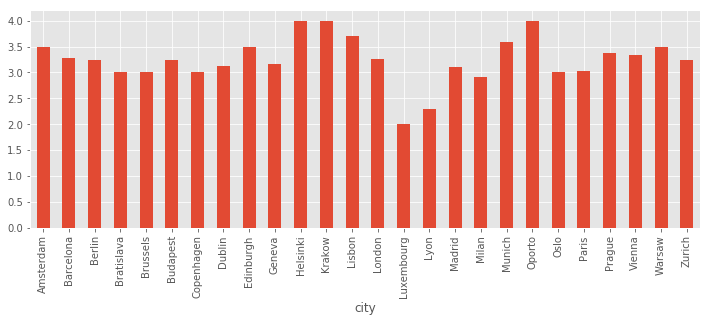

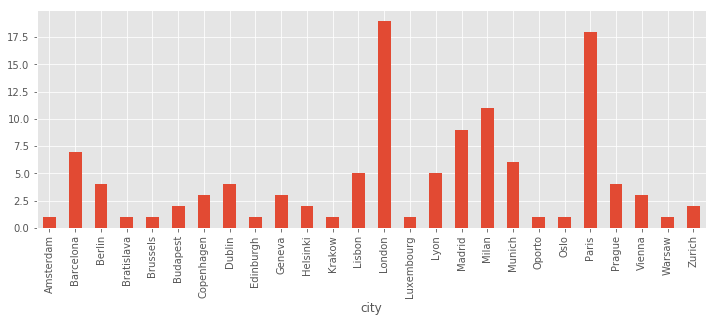

In [95]:
data.loc[(data['sample']==1)&(data['name']=='mcdonald_s')].groupby('city')['rating'].mean().plot.bar()
plt.show()
data.loc[(data['sample']==1)&(data['name']=='mcdonald_s')].groupby('city')['rating'].count().plot.bar()
plt.show()

On the one hand, we can't get attached to the names of the chains. On the other hand, the representation and ratings of the same chain in different cities are different.

Let's divide all restaurants into conditional groups by frequency of occurrence - **chain_scale**.

In [96]:
# take 75 percentile as a criterion
percentile_75_list = get_percentile(75, data.query('sample==1'), 'name_count') # chain_scale
percentile_75_list

[1, 4, 48, 116]

In [97]:
data['chain_scale'] = data['name_count'].dropna().apply(get_param_scale)
data['chain_scale'].unique()

array([  4,   1,  48, 116])

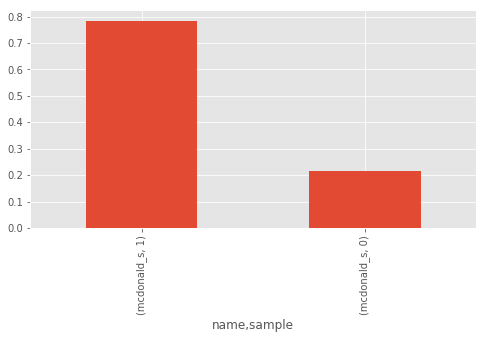

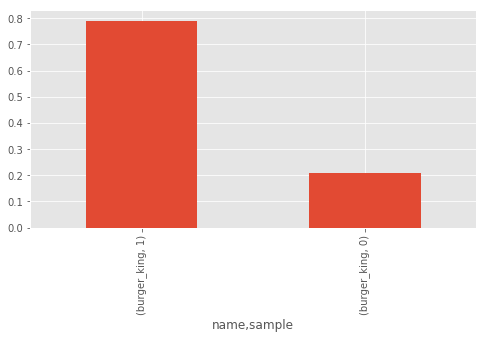

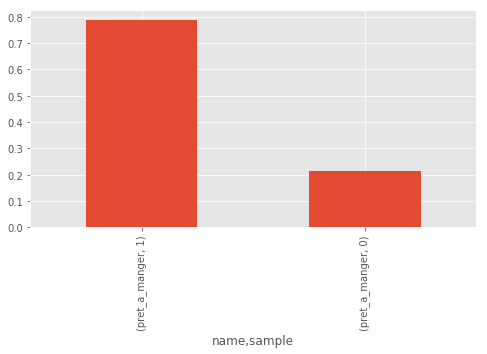

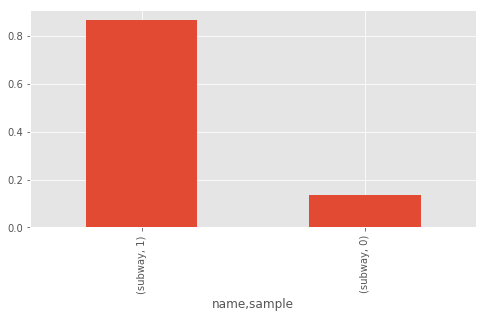

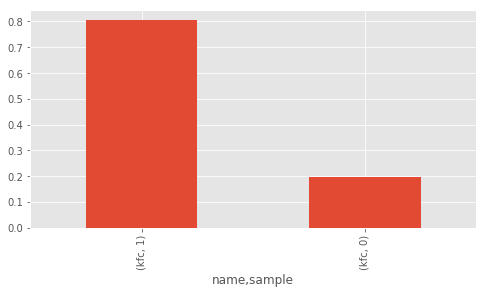

In [98]:
plt.rcParams['figure.figsize'] = (8, 4)  # figure size
for name in data[data['chain']==1]['name'].value_counts().head().index:
    data[data['name']==name].groupby('name')['sample'].value_counts(normalize=True).plot.bar()
    plt.show()

Basically, we are dealing with non-chain restaurants, but **name_count** can be left, since the samples are more or less balanced by **name**.

## rating by chain

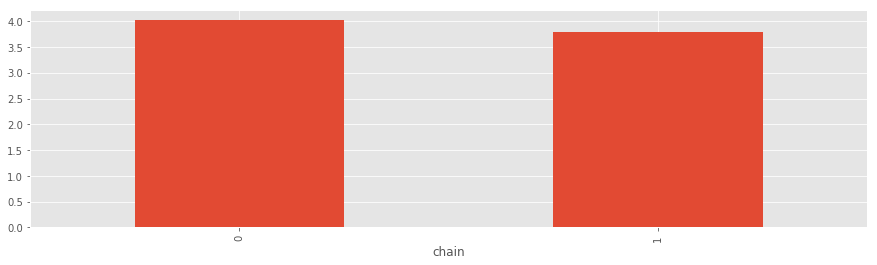

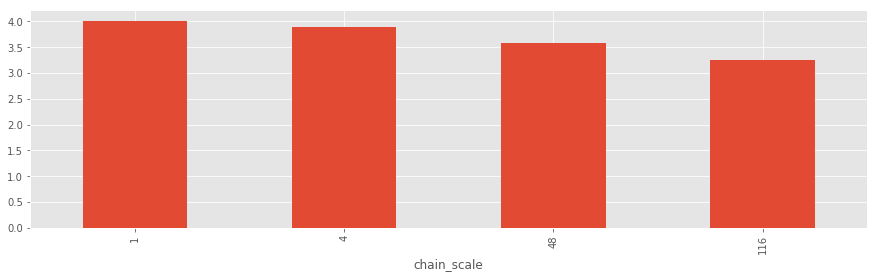

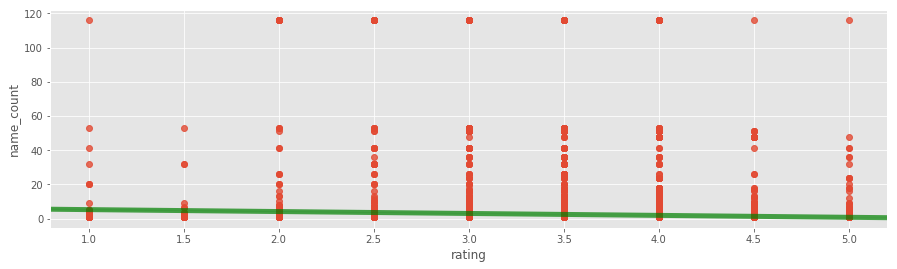

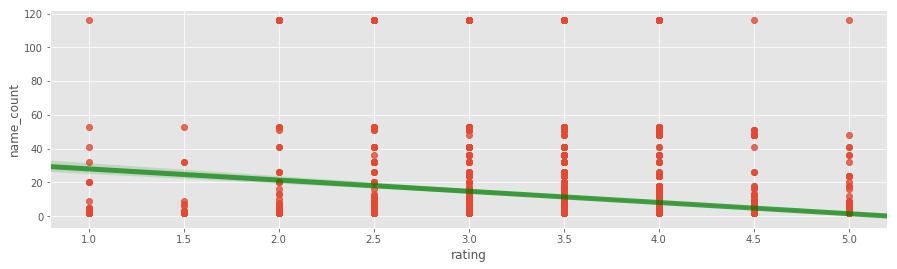

In [99]:
plt.rcParams['figure.figsize'] = (15, 4)  # figure size

data.query('sample==1').groupby('chain')['rating'].mean().plot.bar()
plt.show()
data.query('sample==1').groupby('chain_scale')['rating'].mean().plot.bar()
plt.show()
sns.regplot(x=data.query('sample==1')['rating'], y=data.query('sample==1')['name_count'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
sns.regplot(x=data.loc[(data['sample']==1)&(data['chain']==1)]['rating'], y=data.loc[(data['sample']==1)&(data['chain']==1)]['name_count'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

Chain 1 Total count 35879



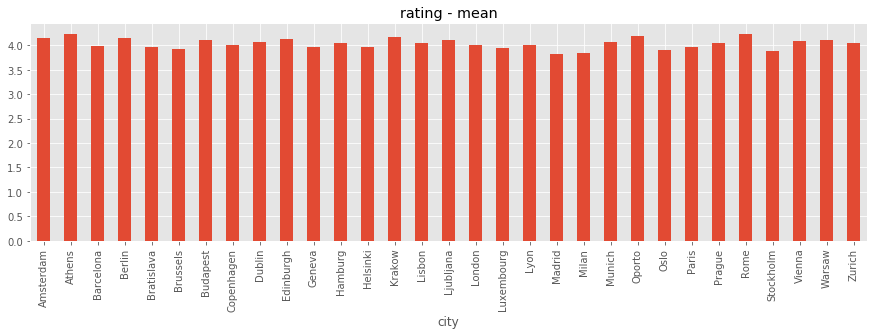

city
Rome      4.235612
Athens    4.220513
Oporto    4.182000
Krakow    4.162990
Berlin    4.145334
Name: rating, dtype: float64

city
Brussels     3.919406
Oslo         3.899433
Stockholm    3.879310
Milan        3.839405
Madrid       3.829713
Name: rating, dtype: float64

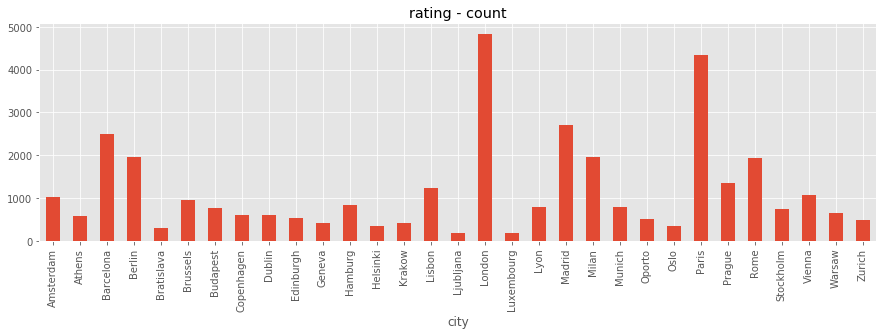

city
London       4839
Paris        4334
Madrid       2716
Barcelona    2495
Berlin       1961
Name: rating, dtype: int64

city
Oslo          353
Helsinki      344
Bratislava    288
Luxembourg    188
Ljubljana     173
Name: rating, dtype: int64


Chain 4 Total count 3101



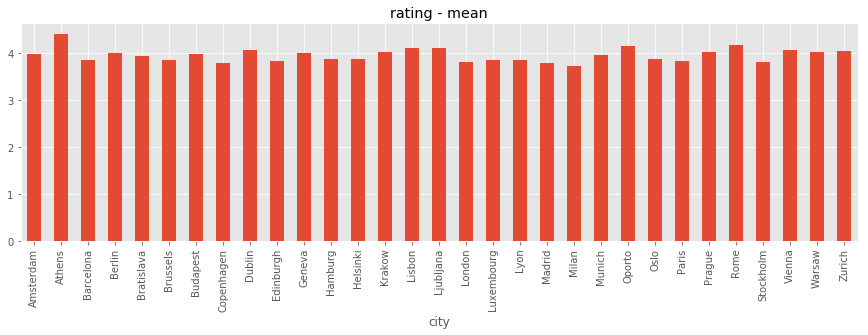

city
Athens       4.410256
Rome         4.162281
Oporto       4.150000
Ljubljana    4.111111
Lisbon       4.098214
Name: rating, dtype: float64

city
Stockholm     3.807018
London        3.803993
Copenhagen    3.790909
Madrid        3.778409
Milan         3.729299
Name: rating, dtype: float64

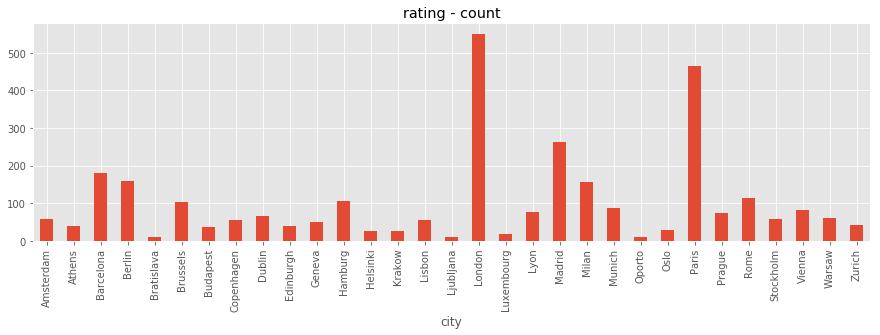

city
London       551
Paris        465
Madrid       264
Barcelona    180
Berlin       160
Name: rating, dtype: int64

city
Krakow        26
Luxembourg    17
Oporto        10
Bratislava     9
Ljubljana      9
Name: rating, dtype: int64


Chain 48 Total count 800



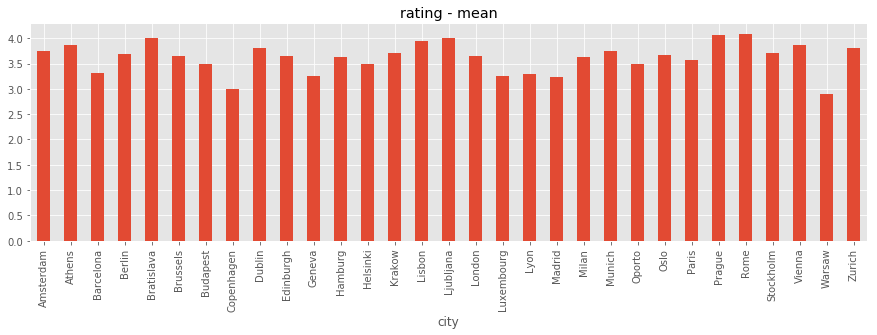

city
Rome          4.088235
Prague        4.058824
Ljubljana     4.000000
Bratislava    4.000000
Lisbon        3.950000
Name: rating, dtype: float64

city
Geneva        3.250000
Luxembourg    3.250000
Madrid        3.243478
Copenhagen    3.000000
Warsaw        2.888889
Name: rating, dtype: float64

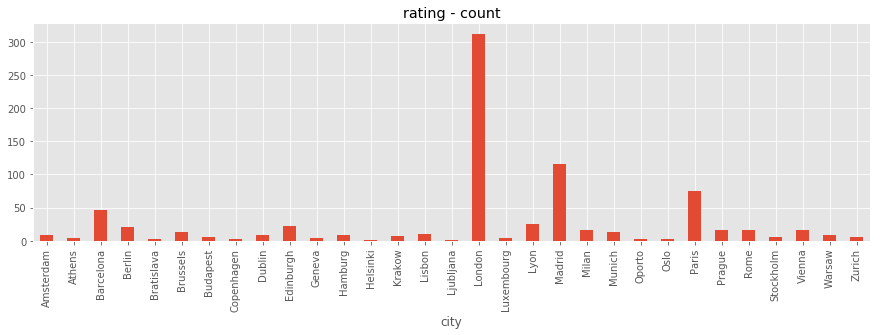

city
London       312
Madrid       115
Paris         75
Barcelona     47
Lyon          25
Name: rating, dtype: int64

city
Copenhagen    2
Oporto        2
Bratislava    2
Helsinki      1
Ljubljana     1
Name: rating, dtype: int64


Chain 116 Total count 220



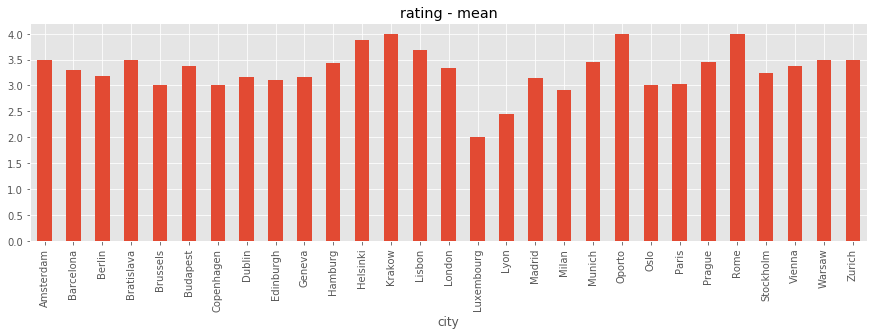

city
Oporto      4.0000
Rome        4.0000
Krakow      4.0000
Helsinki    3.8750
Lisbon      3.6875
Name: rating, dtype: float64

city
Copenhagen    3.000000
Brussels      3.000000
Milan         2.909091
Lyon          2.444444
Luxembourg    2.000000
Name: rating, dtype: float64

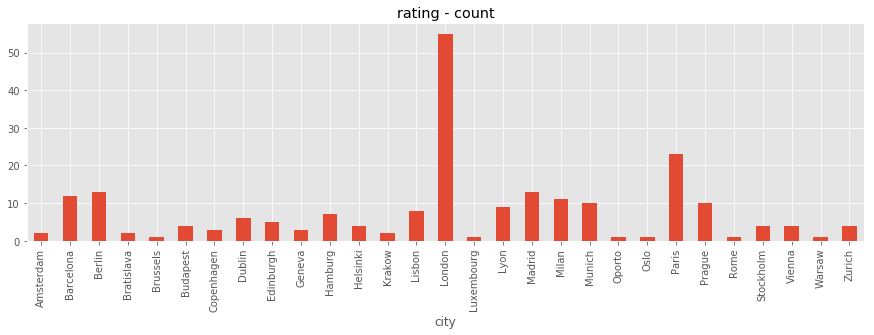

city
London       55
Paris        23
Berlin       13
Madrid       13
Barcelona    12
Name: rating, dtype: int64

city
Luxembourg    1
Oporto        1
Oslo          1
Rome          1
Brussels      1
Name: rating, dtype: int64

In [100]:
for ind in sorted(data.chain_scale.copy().dropna().unique()):
    print('Chain ' + str(ind) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['chain_scale']==ind)]['rating'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].mean().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].mean().sort_values(ascending=False).tail())
    
    data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].count().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - count')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].count().sort_values(ascending=False).head())
    print('')
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('city')['rating'].count().sort_values(ascending=False).tail())
    
    print('')

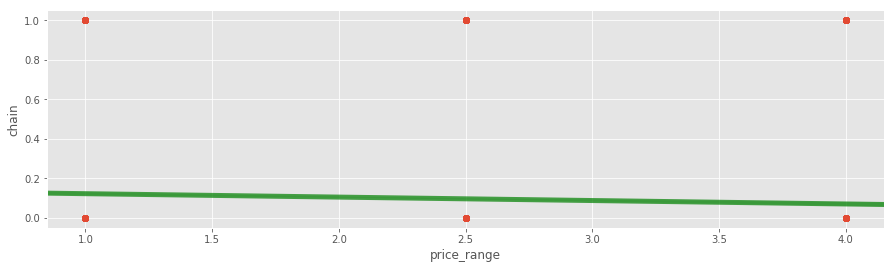

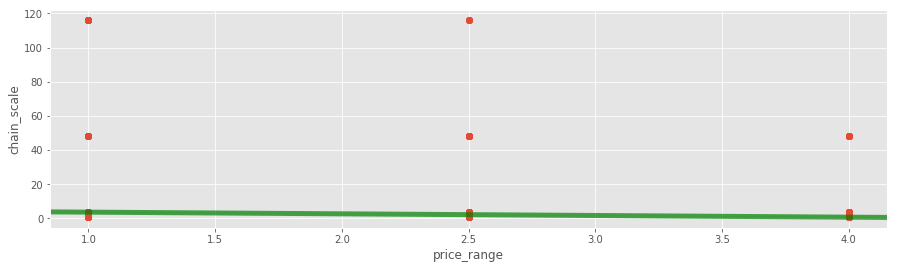

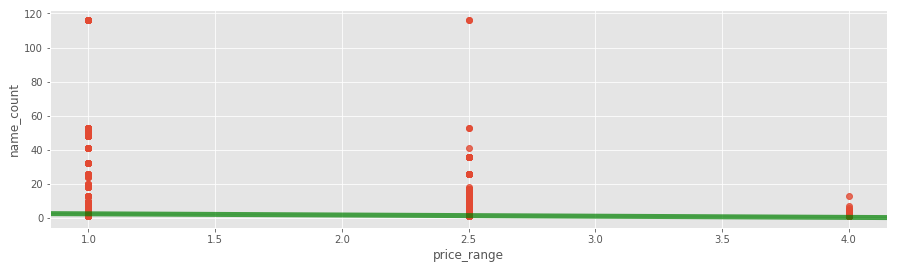

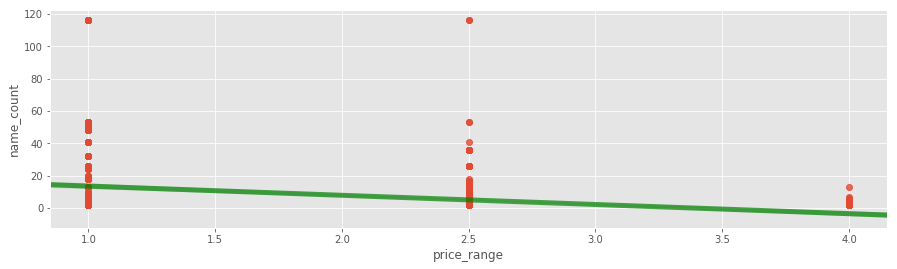

In [101]:
sns.regplot(x=data.query('sample==1')['price_range'], y=data.query('sample==1')['chain'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
sns.regplot(x=data.query('sample==1')['price_range'], y=data.query('sample==1')['chain_scale'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
sns.regplot(x=data.query('sample==1')['price_range'], y=data.query('sample==1')['name_count'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()
sns.regplot(x=data.loc[(data['sample']==1)&(data['chain']==1)]['price_range'], y=data.loc[(data['sample']==1)&(data['chain']==1)]['name_count'], line_kws={"color":"g","alpha":0.7,"lw":5})
plt.show()

price_range 2.5 Total count 18412



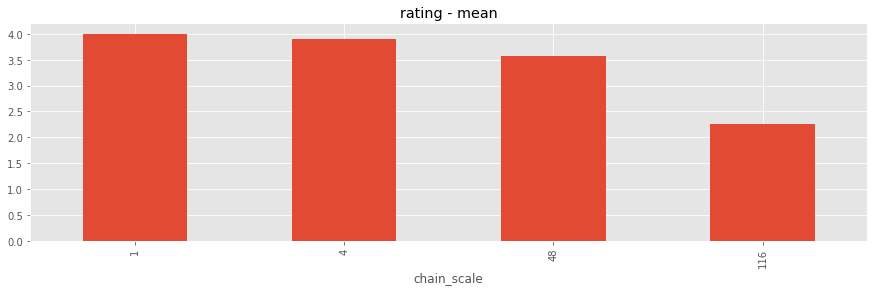

chain_scale
1      4.004267
4      3.891817
48     3.570769
116    2.250000
Name: rating, dtype: float64

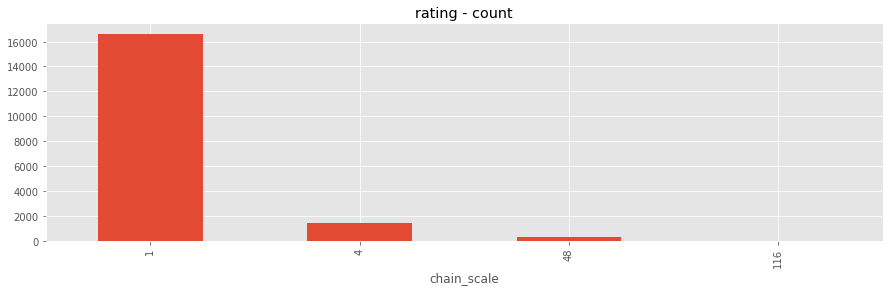

chain_scale
1      16641
4       1442
48       325
116        4
Name: rating, dtype: int64


price_range 4.0 Total count 1423



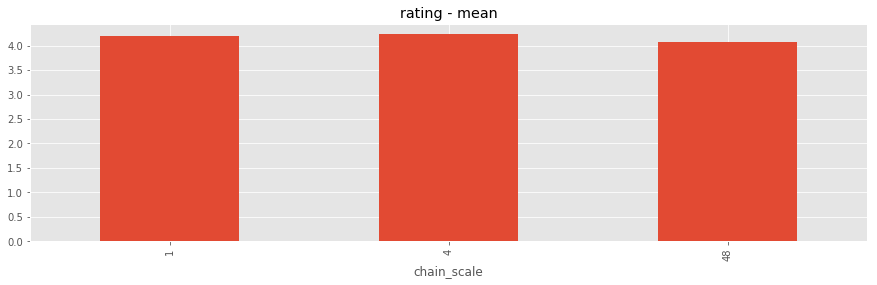

chain_scale
4     4.234375
1     4.203409
48    4.071429
Name: rating, dtype: float64

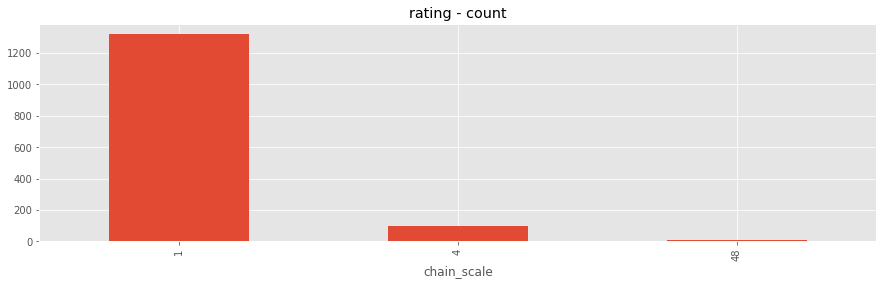

chain_scale
1     1320
4       96
48       7
Name: rating, dtype: int64


price_range 1.0 Total count 6279



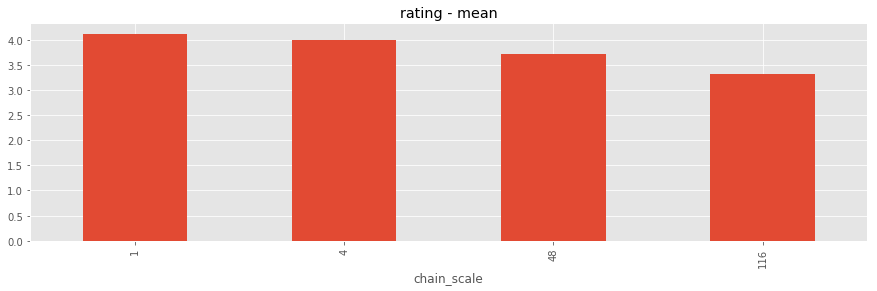

chain_scale
1      4.124115
4      3.987759
48     3.717647
116    3.309859
Name: rating, dtype: float64

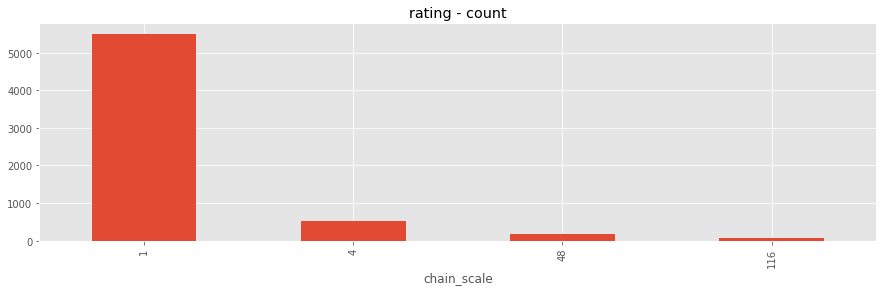

chain_scale
1      5507
4       531
48      170
116      71
Name: rating, dtype: int64

In [102]:
for price in data.price_range.copy().dropna().unique():
    print('price_range ' + str(price) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['price_range']==price)]['rating'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('chain_scale')['rating'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('chain_scale')['rating'].mean().sort_values(ascending=False))
    
    data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('chain_scale')['rating'].count().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - count')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['price_range']==price)].groupby('chain_scale')['rating'].count().sort_values(ascending=False))
    print('')

## rating by chain_scale & cuisine_style_count

Chain 1 Total count 35879



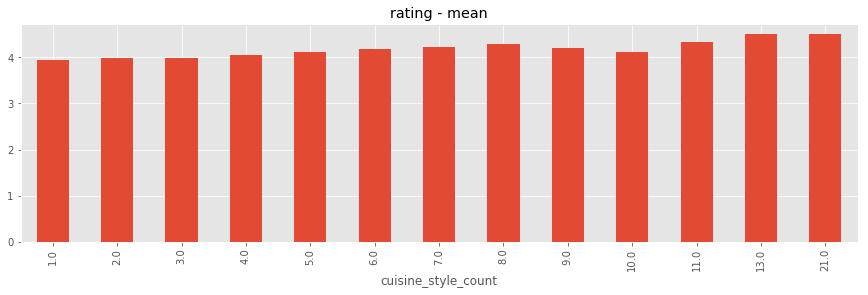

cuisine_style_count
21.0    4.500000
13.0    4.500000
11.0    4.333333
Name: rating, dtype: float64

cuisine_style_count
3.0    3.983188
2.0    3.979552
1.0    3.947981
Name: rating, dtype: float64

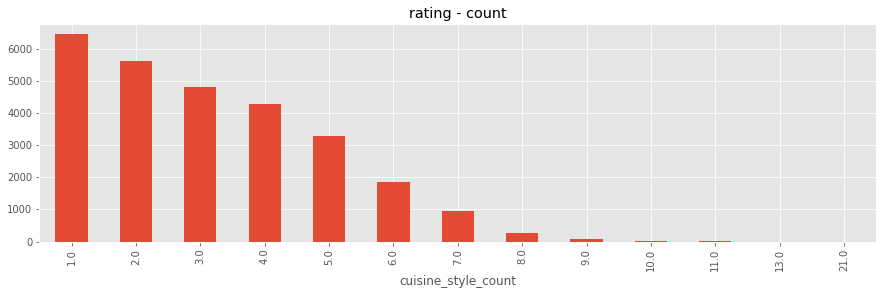

cuisine_style_count
1.0    6440
2.0    5624
3.0    4818
Name: rating, dtype: int64

cuisine_style_count
11.0    3
21.0    1
13.0    1
Name: rating, dtype: int64


Chain 4 Total count 3101



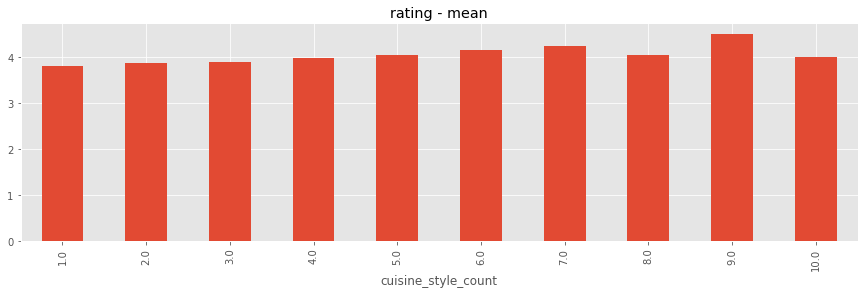

cuisine_style_count
9.0    4.500000
7.0    4.222222
6.0    4.133540
Name: rating, dtype: float64

cuisine_style_count
3.0    3.892857
2.0    3.852883
1.0    3.798305
Name: rating, dtype: float64

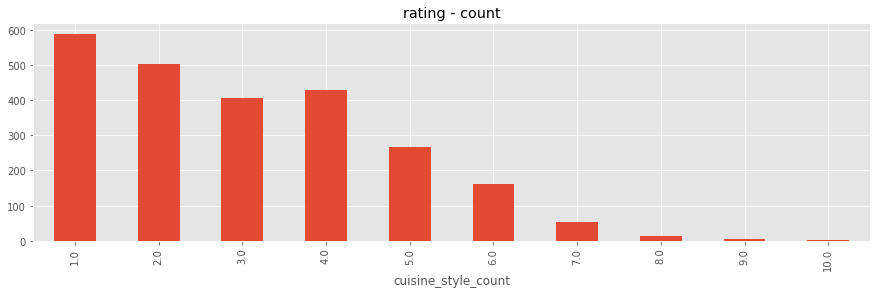

cuisine_style_count
1.0    590
2.0    503
4.0    428
Name: rating, dtype: int64

cuisine_style_count
8.0     12
9.0      4
10.0     2
Name: rating, dtype: int64


Chain 48 Total count 800



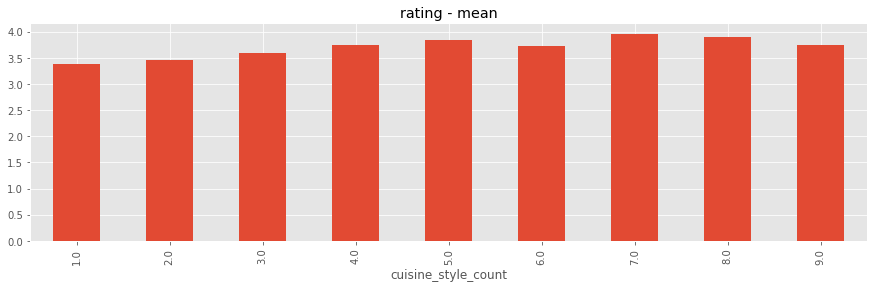

cuisine_style_count
7.0    3.958333
8.0    3.900000
5.0    3.846154
Name: rating, dtype: float64

cuisine_style_count
3.0    3.583333
2.0    3.462810
1.0    3.385204
Name: rating, dtype: float64

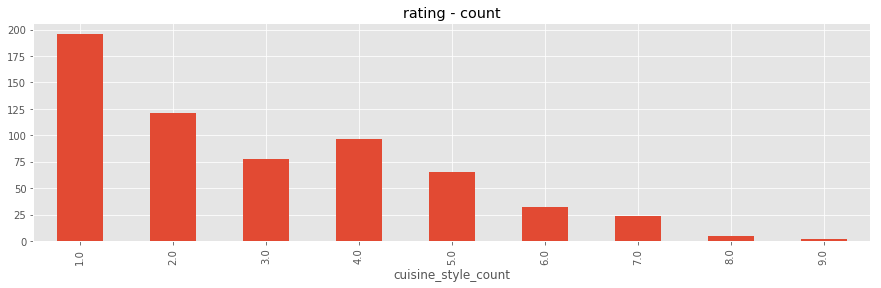

cuisine_style_count
1.0    196
2.0    121
4.0     96
Name: rating, dtype: int64

cuisine_style_count
7.0    24
8.0     5
9.0     2
Name: rating, dtype: int64


Chain 116 Total count 220



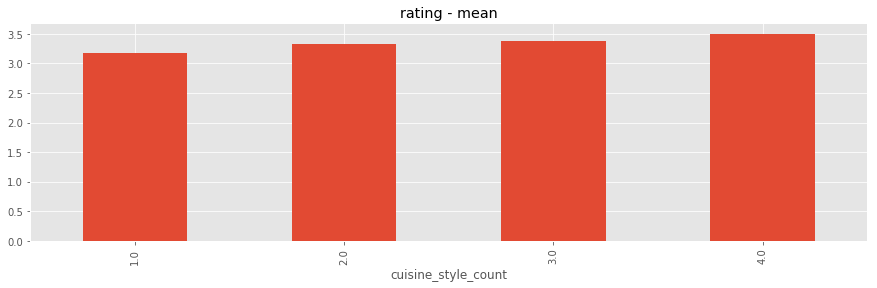

cuisine_style_count
4.0    3.500000
3.0    3.375000
2.0    3.326087
Name: rating, dtype: float64

cuisine_style_count
3.0    3.375000
2.0    3.326087
1.0    3.171053
Name: rating, dtype: float64

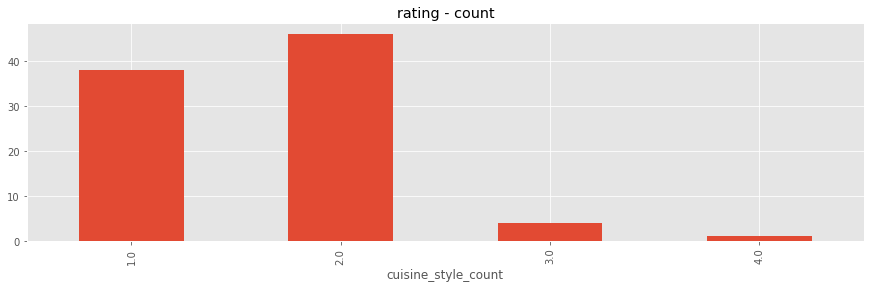

cuisine_style_count
2.0    46
1.0    38
3.0     4
Name: rating, dtype: int64

cuisine_style_count
1.0    38
3.0     4
4.0     1
Name: rating, dtype: int64

In [103]:
for ind in sorted(data.chain_scale.copy().dropna().unique()):
    print('Chain ' + str(ind) + ' Total count ' + str(data.loc[(data['sample']==1)&(data['chain_scale']==ind)]['rating'].count()), end='\n\n')
    
    data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].mean().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - mean')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].mean().sort_values(ascending=False).head(3))
    print('')
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].mean().sort_values(ascending=False).tail(3))
    
    data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].count().plot.bar(figsize=(15, 4)) # .sort_values(ascending=False)
    plt.title('rating - count')
    plt.show()
    
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].count().sort_values(ascending=False).head(3))
    print('')
    display(data.loc[(data['sample']==1)&(data['chain_scale']==ind)].groupby('cuisine_style_count')['rating'].count().sort_values(ascending=False).tail(3))
    
    print('')

## g_cod

**g_code**, apparently this is the **region code**

Important for us:
- **g_code**
- **g_code_count** - how many restaurants are there in the region
- **g_code_price_count** - how many restaurants of this price range in the region

***But!*** It can be correlated with **city**

In [104]:
gcode_count_1 = data.query('sample==1')['g_code'].value_counts()
gcode_count_0 = data.query('sample==0')['g_code'].value_counts()
data['gcode_count'] = data['g_code'].dropna().apply(lambda x: gcode_count_1[x] if x in gcode_count_1.index else (gcode_count_0[x] if x in gcode_count_0.index else np.nan))

## reviews date

In [105]:
# the structure of the lists in the list (review and dates), but the data type is a string
# turning empty lists into nan and strings into lists
data['reviews'] = data['reviews'].dropna().apply(lambda x: np.nan if x == '[[], []]' else x[2:-2].split("], ["))

# separate the dates from the review and turn the data into lists
data['reviews_date'] = data['reviews'].dropna().apply(lambda x: x[1][1:-1].split("', '"))
# turning strings into dates
data['reviews_date'] = data['reviews_date'].dropna().apply(lambda x: [pd.to_datetime(i) for i in x])

# at the same time, we separate the review and turn the data into lists
data['reviews_text'] = data['reviews'].dropna().apply(lambda x: x[0][1:-1].split("', '"))

In [106]:
data[['reviews', 'reviews_date', 'reviews_text']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 3 columns):
reviews         41886 non-null object
reviews_date    41886 non-null object
reviews_text    41886 non-null object
dtypes: object(3)
memory usage: 1.1+ MB


In [107]:
data[['reviews', 'reviews_date', 'reviews_text']].sample(5)

,reviews,reviews_date,reviews_text
4954,"['Excellent as always', 'Perfect Dinner', '12/...","[2017-12-11 00:00:00, 2017-11-03 00:00:00]","[Excellent as always, Perfect Dinner]"
22211,"['Seemingly lovely but not quite the case', 'h...","[2017-10-10 00:00:00, 2017-06-04 00:00:00]","[Seemingly lovely but not quite the case, hot ..."
22317,"['NO Service', '12/05/2011']",[2011-12-05 00:00:00],[NO Service]
38713,"['Fairly decent falafel', 'Perfect falafel', '...","[2017-05-23 00:00:00, 2017-08-14 00:00:00]","[Fairly decent falafel, Perfect falafel]"
39186,"['good burger', 'Best burgers', '11/13/2017', ...","[2017-11-13 00:00:00, 2017-08-09 00:00:00]","[good burger, Best burgers]"


There is nothing we can do with the missing **reviews** (at least for now), but we can check the absence of **number_of_reviews** where there are actually **reviews**.

In [108]:
print('number_of_reviews is absent while at least 1 review exists count:', data.loc[(data['number_of_reviews'].isnull()==True)&(data['reviews'].isnull()==False)]['reviews'].count(), end='\n\n')

data.loc[(data['number_of_reviews'].isnull()==True)&(data['reviews'].isnull()==False)].sample(5)

number_of_reviews is absent while at least 1 review exists count: 1176



,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,...,city_count,name,region,g_code,name_count,chain,chain_scale,gcode_count,reviews_date,reviews_text
28614,id_2980,Prague,"European, Czech",2987.0,NaN,NaN,"['Typical Czech Food.', '08/30/2017']",/Restaurant_Review-g274707-d7685971-Reviews-Re...,d7685971,1,...,1443,restaurace_sparta,prague_bohemia,g274707,1,0,1,1443,[2017-08-30 00:00:00],[Typical Czech Food.]
42739,id_2259,Brussels,NaN,2225.0,NaN,NaN,"['Nice alternative in EU area', '03/05/2017']",/Restaurant_Review-g188644-d10464588-Reviews-U...,d10464588,1,...,1060,up,brussels,g188644,1,0,1,767,[2017-03-05 00:00:00],[Nice alternative in EU area]
15431,id_9283,London,NaN,9292.0,NaN,NaN,"['Out on a date withy husband', '04/28/2015']",/Restaurant_Review-g186338-d1381569-Reviews-Re...,d1381569,1,...,5757,rex_cinema_and_bar,london_england,g186338,1,0,1,5757,[2015-04-28 00:00:00],[Out on a date withy husband]
44915,id_3148,Vienna,Greek,3150.0,NaN,NaN,"['Ok Greek', '10/08/2013']",/Restaurant_Review-g190454-d4288479-Reviews-Fi...,d4288479,1,...,1166,filoxenia,vienna,g190454,1,0,1,1166,[2013-10-08 00:00:00],[Ok Greek]
8941,id_8941,Copenhagen,NaN,1106.0,NaN,NaN,"['GO!', '02/15/2014']",/Restaurant_Review-g189541-d4697027-Reviews-Mi...,d4697027,0,...,659,min_nye_kaffebar,copenhagen_zealand,g189541,1,0,1,595,[2014-02-15 00:00:00],[GO!]


At a minimum, we can fill in the gaps in **number_of_reviews** with the number of **reviews**, as a maximum, we can parse the data from the site (applies to all the gaps). But will it be correct to pull up the current data from the site into our upload? Let's see when the last review was.

In [109]:
data['reviews_date_last'] = data['reviews_date'].dropna().apply(lambda x: max(x))

print('max train dataset date:', max(data.loc[data['sample']==1]['reviews_date_last'].dropna().tolist()))
print('max test dataset date:', max(data.loc[data['sample']==0]['reviews_date_last'].dropna().tolist()))
print('current date:', CURRENT_DATE)

max train dataset date: 2018-02-26 00:00:00
max test dataset date: 2018-02-26 00:00:00
current date: 2023-05-16 00:00:00


Most likely, the data that we would have pulled up from the site now would have turned out to be irrelevant. So, we will look for other ways to fill in the gaps.

In [110]:
reviews_date_max_1 = max(data.loc[data['sample']==1]['reviews_date_last'].dropna().tolist())
#reviews_date_max_0 = max(data.loc[data['sample']==0]['reviews_date_last'].dropna().tolist())

data['reviews_date_delta'] = data['reviews_date'].dropna().apply(lambda x: (max(x) - min(x)).days)
data['reviews_date_delta_max'] = data['reviews_date'].dropna().apply(lambda x: (reviews_date_max_1 - max(x)).days)
#data['delta_sience_last_review'] = data['reviews_date'].dropna().apply(lambda x: (CURRENT_DATE - max(x)).days)
#data = data.drop('delta_sience_last_review', axis=1)

data.sample(3)

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,...,g_code,name_count,chain,chain_scale,gcode_count,reviews_date,reviews_text,reviews_date_last,reviews_date_delta,reviews_date_delta_max
22219,id_7764,Barcelona,Spanish,7776.0,1.0,NaN,"['Never again.', '04/18/2017']",/Restaurant_Review-g187497-d12158176-Reviews-B...,d12158176,1,...,g187497,1,0,1,2734,[2017-04-18 00:00:00],[Never again.],2017-04-18,0.0,314.0
39810,id_5715,Milan,Italian,5718.0,2.5,199.0,"['The Traditional Pugliese Foods', 'Potentiall...",/Restaurant_Review-g187849-d2002016-Reviews-Os...,d2002016,1,...,g187849,1,0,1,2133,"[2017-12-27 00:00:00, 2017-05-13 00:00:00]","[The Traditional Pugliese Foods, Potentially g...",2017-12-27,228.0,61.0
1738,id_1738,Berlin,NaN,3429.0,NaN,NaN,NaN,/Restaurant_Review-g187323-d10467114-Reviews-E...,d10467114,0,...,g187323,1,0,1,2155,NaN,NaN,NaT,NaN,NaN


In [111]:
data[['reviews_date_delta', 'reviews_date_delta_max']].describe()

,reviews_date_delta,reviews_date_delta_max
count,41886.000000,41886.000000
mean,123.218331,290.045361
std,212.592518,363.252094
min,0.000000,0.000000
25%,8.000000,79.000000
50%,49.000000,153.000000
75%,148.000000,337.000000
max,3296.000000,5059.000000


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7d0c3c01e3c8>,
      dtype=object)

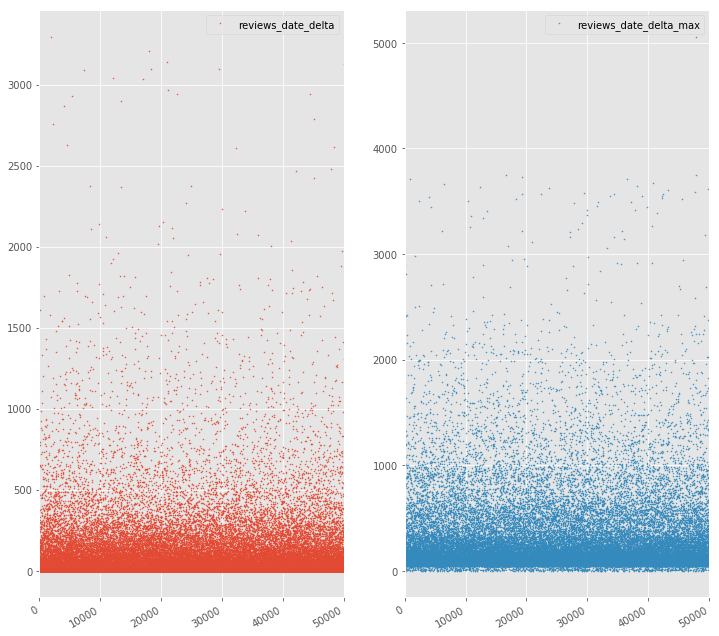

In [112]:
data[['reviews_date_delta', 'reviews_date_delta_max']].plot(lw=0,
                                                            marker=".",                      
                                                            subplots=True,                  
                                                            layout=(-1, 2),                  
                                                            figsize=(12, 12), 
                                                            markersize=1)

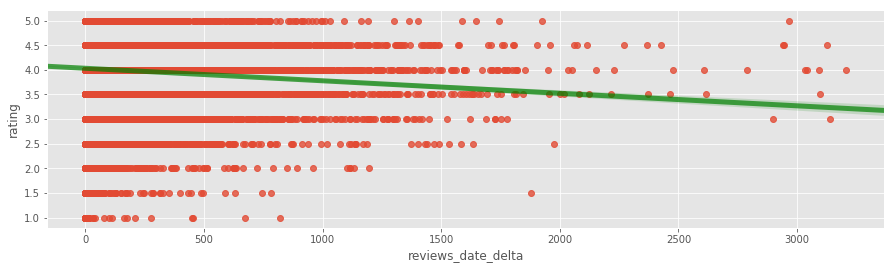

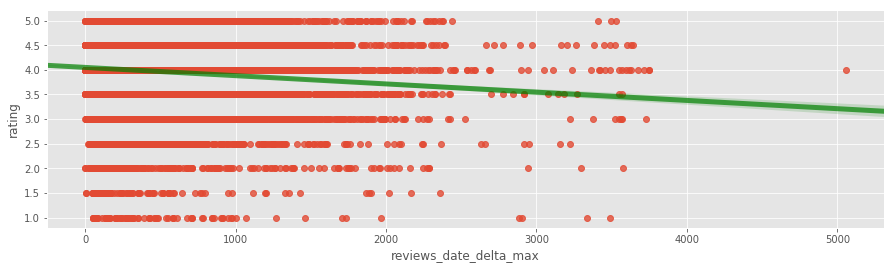

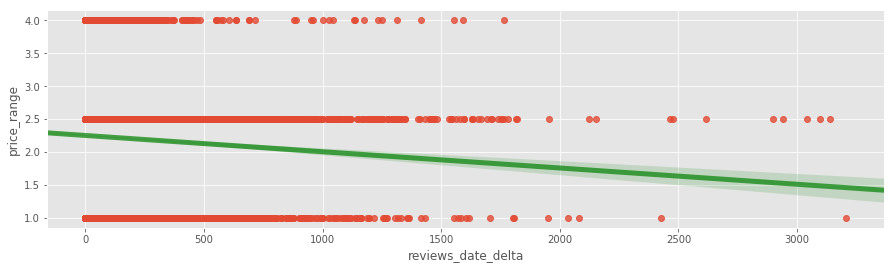

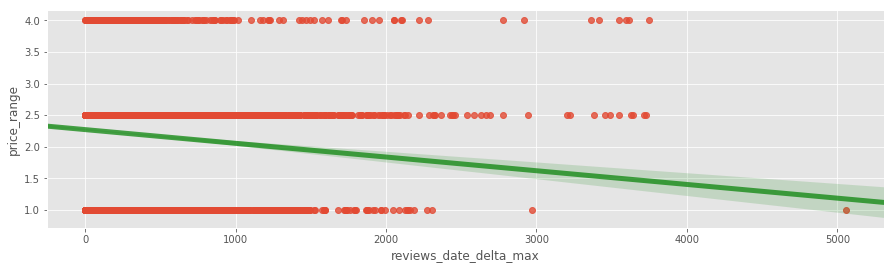

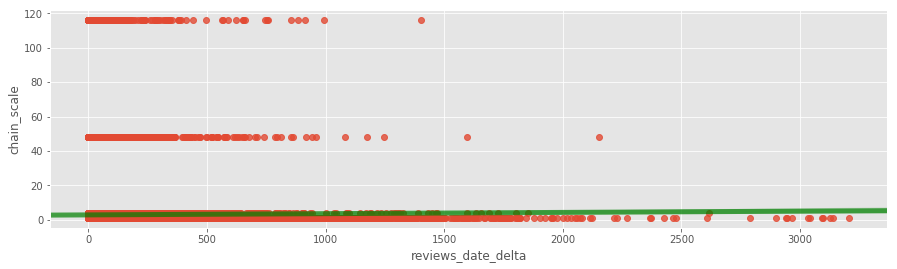

...

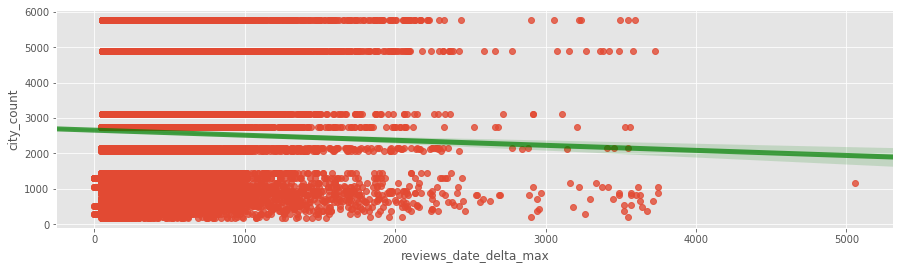

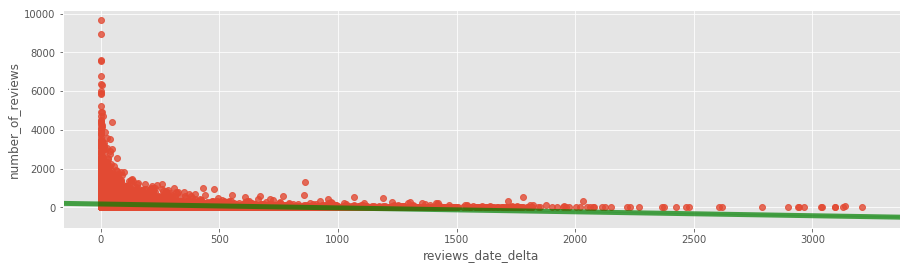

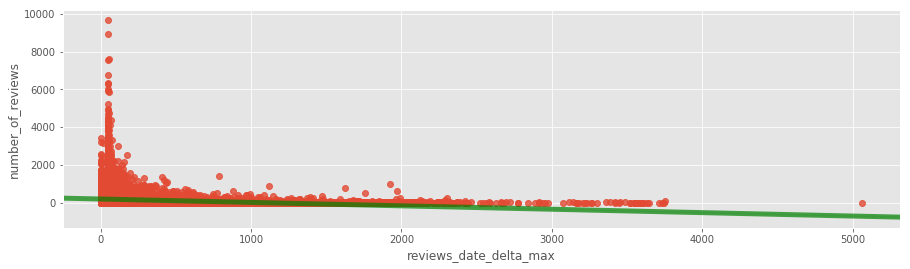

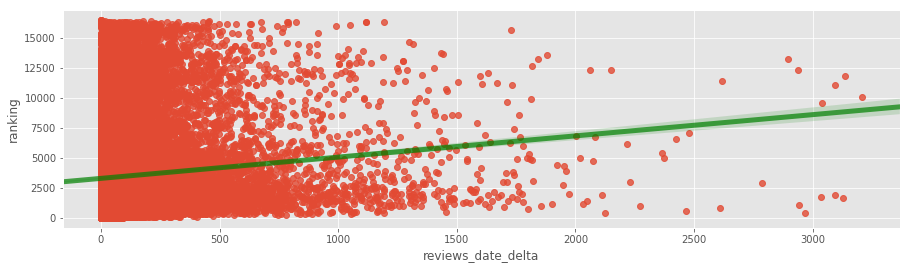

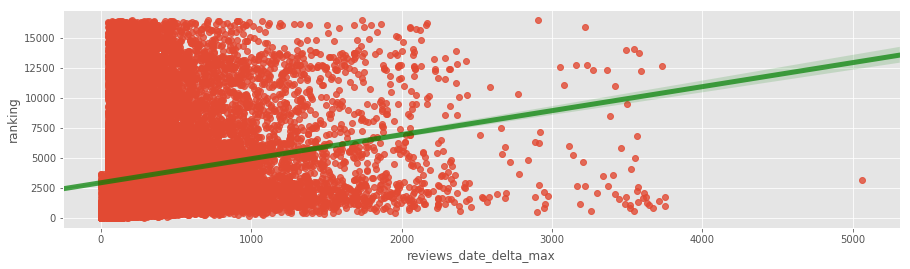

In [113]:
for col in ['rating', 'price_range', 'chain_scale', 'cuisine_style_count', 'city_count', 'number_of_reviews', 'ranking']:
    sns.regplot(x=data.query('sample==1')['reviews_date_delta'], y=data.query('sample==1')[col], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()
    sns.regplot(x=data.query('sample==1')['reviews_date_delta_max'], y=data.query('sample==1')[col], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()

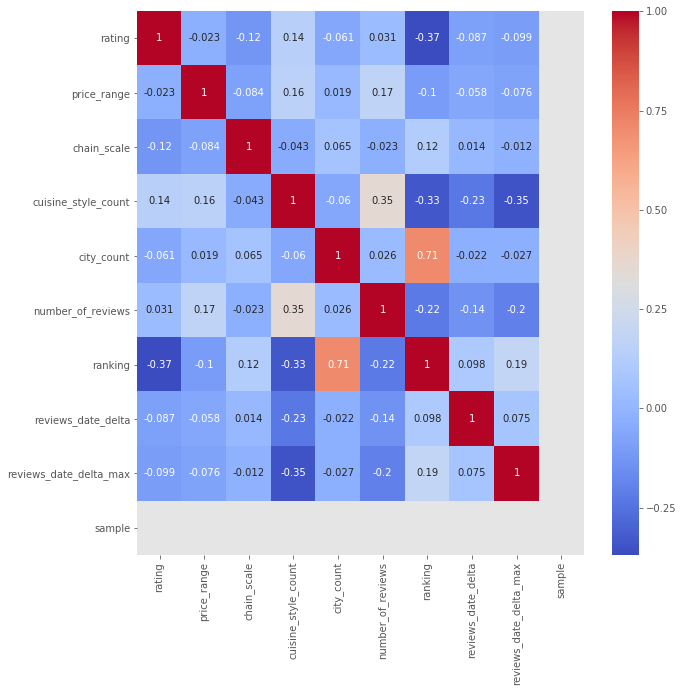

In [114]:
plt.rcParams['figure.figsize'] = (10, 10)  # figure size
sns.heatmap(data[['rating', 'price_range', 'chain_scale', 'cuisine_style_count', 'city_count', 'number_of_reviews', 'ranking', 'reviews_date_delta', 'reviews_date_delta_max', 'sample']].query('sample==1').corr(), annot = True, cmap = 'coolwarm')

- the **smaller the delta** between the last 2 revues, as well as between the last and latest review in the dataset, the **higher the rating** of the restaurant
- go to **cheap** restaurants **less often** than to restaurants of medium and expensive price segments
- **the scale of the chain** practically does not matter
- restaurants with **a wide variety of cuisines** go **more often**
- people go to restaurants **more often** in those cities where there are **more** restaurants
- the **smaller the delta** between the last 2 reviews, as well as between the last and latest review in the dataset, the **greater the number of revues**, but the dependence is not pronounced
- the **smaller the delta** between the last 2 reviews, as well as between the last and latest review in the dataset, the **lower the ranking** of the restaurant - **!!!** compare by city
- the **better** a restaurant by **ranking**, the **more often** people go to it.

London


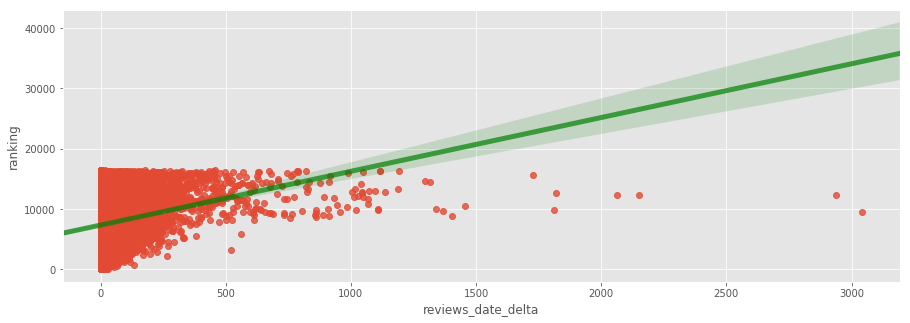

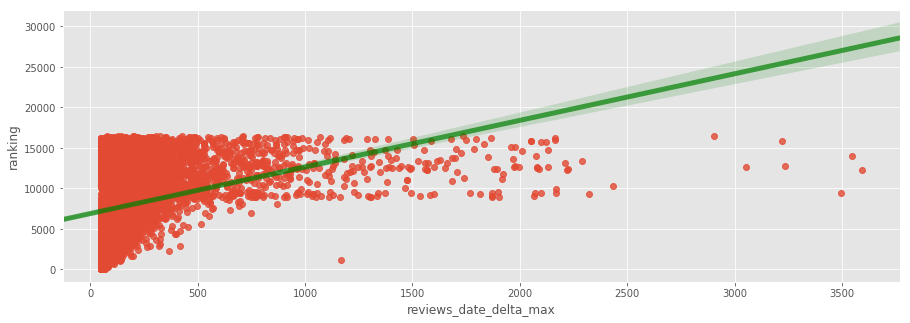

Paris


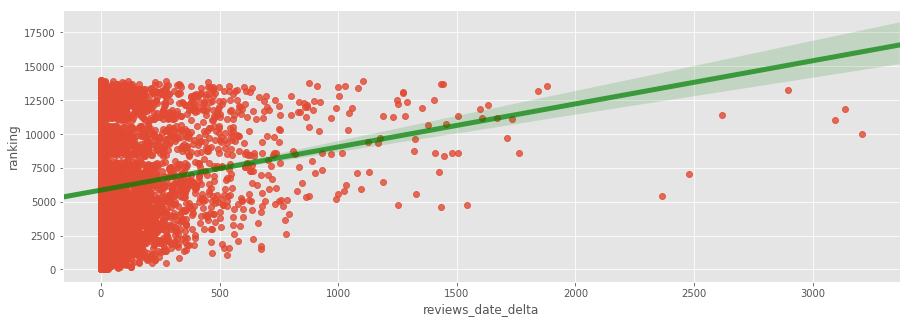

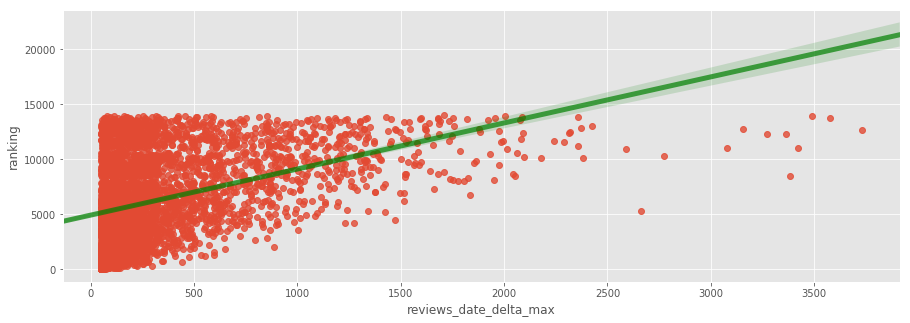

Madrid


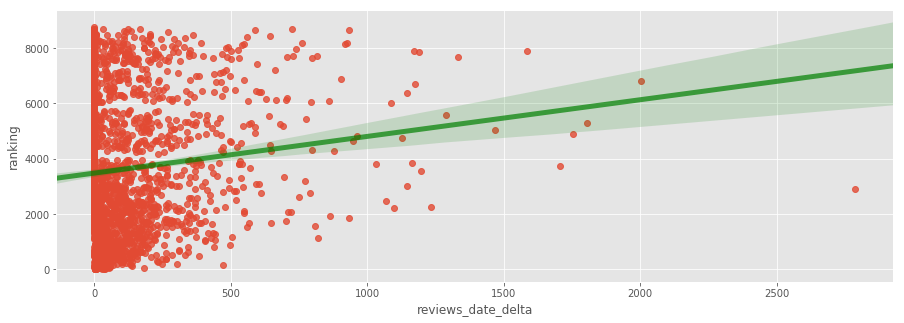

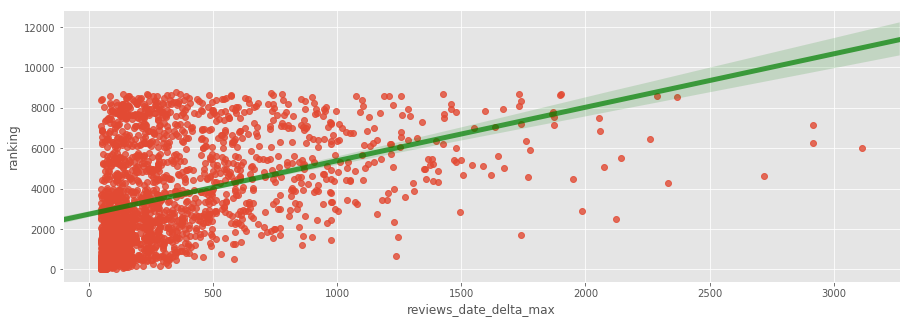

Barcelona


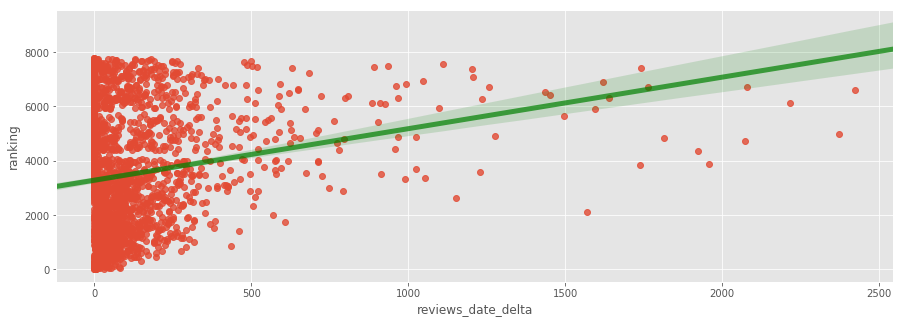

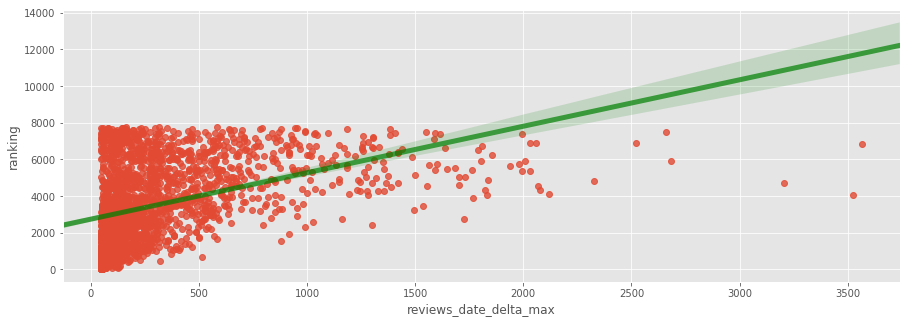

Berlin


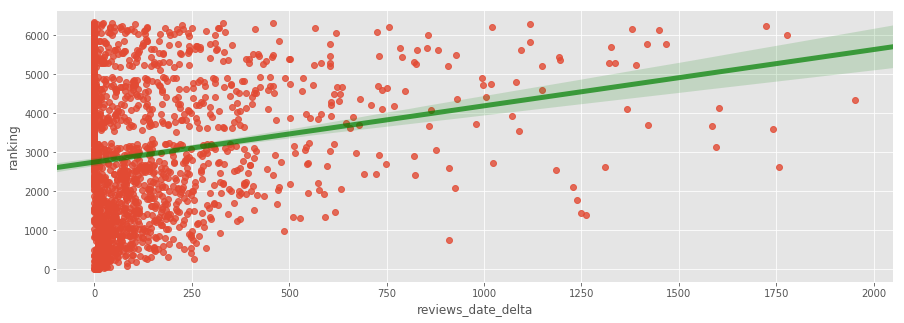

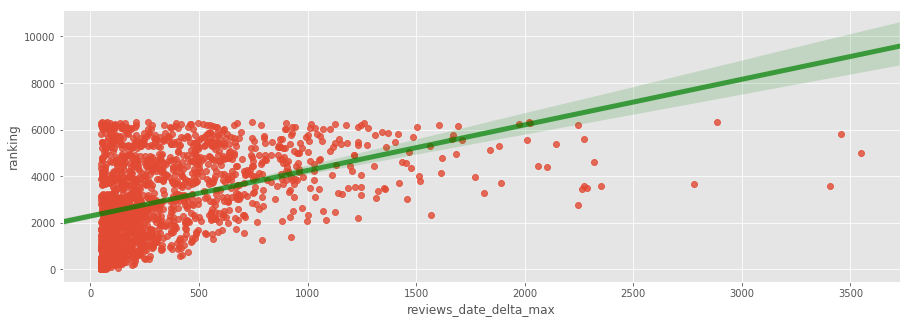

In [115]:
plt.rcParams['figure.figsize'] = (15, 5)  # figure size
for city in data.query('sample==1')['city'].value_counts().head().index:
    print(city)
    sns.regplot(x=data.loc[(data['sample']==1)&(data['city']==city)]['reviews_date_delta'], y=data.loc[(data['sample']==1)&(data['city']==city)]['ranking'], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()
    sns.regplot(x=data.loc[(data['sample']==1)&(data['city']==city)]['reviews_date_delta_max'], y=data.loc[(data['sample']==1)&(data['city']==city)]['ranking'], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()

## Cuisine Style

In [116]:
data['cuisine_style'] = data['cuisine_style'].dropna().apply(lambda x: x.split(', '))
for x in data.cuisine_style.tolist()[:5]:
    print(type(x), x)

<class 'list'> ['Bar', 'Pub']
<class 'list'> ['European', 'Scandinavian', 'Gluten Free Options', 'Vegetarian Friendly', 'Vegan Options']
<class 'list'> ['Vegetarian Friendly']
<class 'list'> ['Italian', 'Mediterranean', 'European', 'Vegetarian Friendly', 'Gluten Free Options']
<class 'list'> ['Italian', 'Mediterranean', 'European', 'Seafood', 'Vegetarian Friendly', 'Gluten Free Options']


In [117]:
data.cuisine_style.isna().sum()

11590

In [118]:
# Theoretically, the cuisine style can be divided into groups by type, region, country and specifics.

rest_type_list = ['Bar', 'Pub', 'Cafe', 'Fast Food', 'Steakhouse', 'Street Food', 'Gastropub',
                  'Wine Bar', 'Barbecue', 'Seafood', 'Pizza', 'Soups', 'Sushi', 'Diner',
                  'Grill', 'Brew Pub', 'Contemporary', 'Fusion', 'Delicatessen'
                 ]

area_food_list = ['Mediterranean', 'European', 'Scandinavian', 'Eastern European', 
                  'Central European', 'African', 'Middle Eastern', 'International', 'Arabic', 
                  'Southwestern', 'Asian', 'Central American', 'South American', 'Persian', 
                  'Latin', 'Balti', 'Caribbean', 'Minority Chinese', 'Cajun & Creole', 
                  'Native American', 'Yunnan', 'Xinjiang', 'Central Asian', 'Caucasian'
                 ]

country_food_list = ['Italian', 'French', 'Portuguese', 'Greek', 'Czech', 'British', 'Spanish',
                     'Norwegian', 'Moroccan', 'Indian', 'Thai', 'Dutch', 'Welsh', 'American',
                     'Scottish', 'Hungarian', 'Peruvian', 'Irish', 'Polish', 'Vietnamese',
                     'Lebanese', 'Turkish', 'Japanese', 'Austrian', 'Chinese', 'Danish',
                     'Korean', 'German', 'Swiss', 'Swedish', 'Australian', 'Mexican', 'Belgian',
                     'Argentinean', 'Tunisian', 'Russian', 'Nepali', 'Bangladeshi', 'Colombian',
                     'Sri Lankan', 'Pakistani', 'Israeli', 'Brazilian', 'Ethiopian', 
                     'Taiwanese', 'Indonesian', 'Malaysian', 'Venezuelan', 'Armenian', 
                     'Slovenian', 'Jamaican', 'Ecuadorean', 'Chilean', 'Hawaiian', 'Croatian',
                     'Cambodian', 'Afghani', 'Tibetan', 'Romanian', 'Mongolian', 'Singaporean',
                     'Filipino', 'Cuban', 'Canadian', 'Egyptian', 'Azerbaijani', 'Georgian',
                     'New Zealand', 'Ukrainian', 'Albanian', 'Polynesian', 'Uzbek',
                     'Salvadoran', 'Burmese', 'Fujian', 'Latvian'
                    ]

spcialities_list = ['Gluten Free Options', 'Vegetarian Friendly', 'Vegan Options', 'Halal',
                    'Healthy', 'Kosher']

In [119]:
data['rest_type'] = data['cuisine_style'].dropna().apply(lambda x: [st for st in rest_type_list if st in x])
data['rest_type_count'] = data['rest_type'].dropna().apply(lambda x: len(x))
data['rest_type'] = data['rest_type'].dropna().apply(lambda x: ', '.join(x) if len(x)>0 else '-')

data['area_food'] = data['cuisine_style'].dropna().apply(lambda x: [st for st in area_food_list if st in x])
data['area_food_count'] = data['area_food'].dropna().apply(lambda x: len(x))
data['area_food'] = data['area_food'].dropna().apply(lambda x: ', '.join(x) if len(x)>0 else '-')

data['country_food'] = data['cuisine_style'].dropna().apply(lambda x: [st for st in country_food_list if st in x])
data['country_food_count'] = data['country_food'].dropna().apply(lambda x: len(x))
data['country_food'] = data['country_food'].dropna().apply(lambda x: ', '.join(x) if len(x)>0 else '-')

data['spcialities'] = data['cuisine_style'].dropna().apply(lambda x: [st for st in spcialities_list if st in x])
data['spcialities_count'] = data['spcialities'].dropna().apply(lambda x: len(x))
data['spcialities'] = data['spcialities'].dropna().apply(lambda x: ', '.join(x) if len(x)>0 else '-')

In [120]:
data[['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']].describe()

,rest_type_count,area_food_count,country_food_count,spcialities_count
count,38410.000000,38410.000000,38410.000000,38410.000000
mean,0.677974,0.822494,0.925957,0.689326
std,0.865922,0.828396,0.575417,0.999697
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000
50%,0.000000,1.000000,1.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000
max,6.000000,5.000000,9.000000,5.000000


In [121]:
data[['cuisine_style', 'rest_type', 'area_food', 'country_food', 'spcialities']].sample(5)

,cuisine_style,rest_type,area_food,country_food,spcialities
48725,"[Italian, Vegetarian Friendly, Vegan Options]",-,-,Italian,"Vegetarian Friendly, Vegan Options"
26596,"[Irish, Bar, Cafe, Pub]","Bar, Pub, Cafe",-,Irish,-
30626,NaN,NaN,NaN,NaN,NaN
35217,NaN,NaN,NaN,NaN,NaN
40880,NaN,NaN,NaN,NaN,NaN


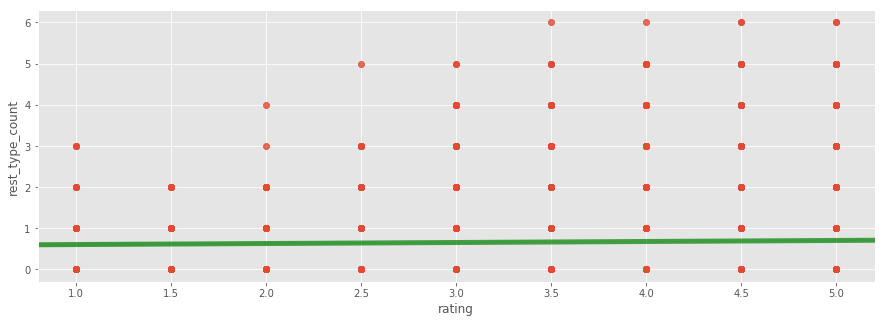

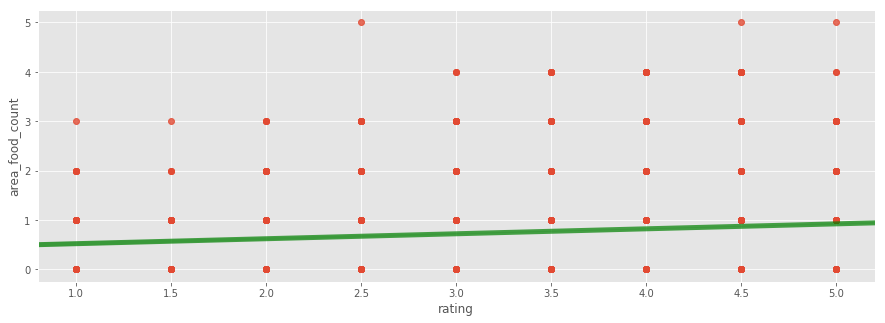

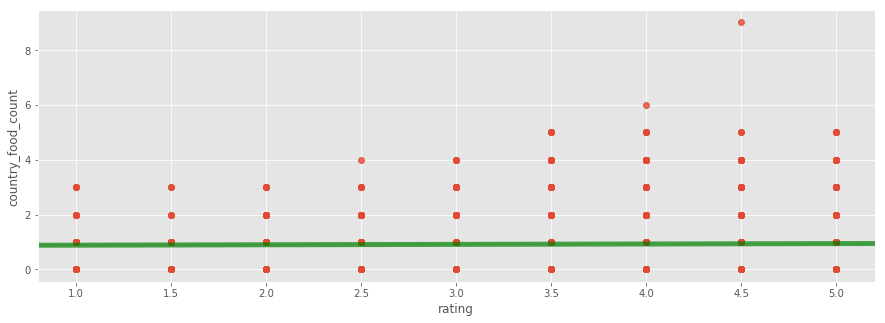

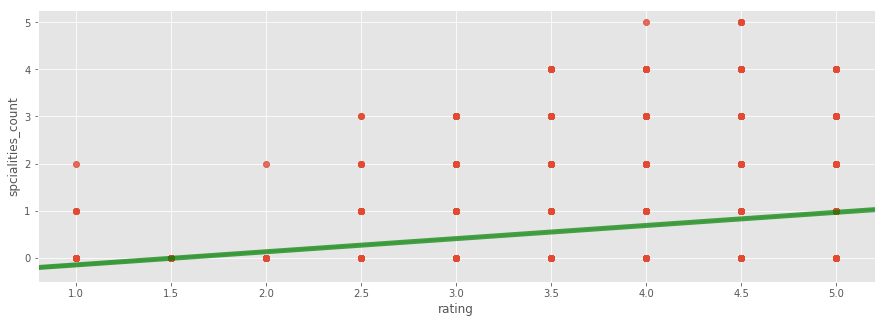

In [122]:
for col in ['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']:
    sns.regplot(x=data.loc[(data['sample']==1)]['rating'], y=data.loc[(data['sample']==1)][col], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()

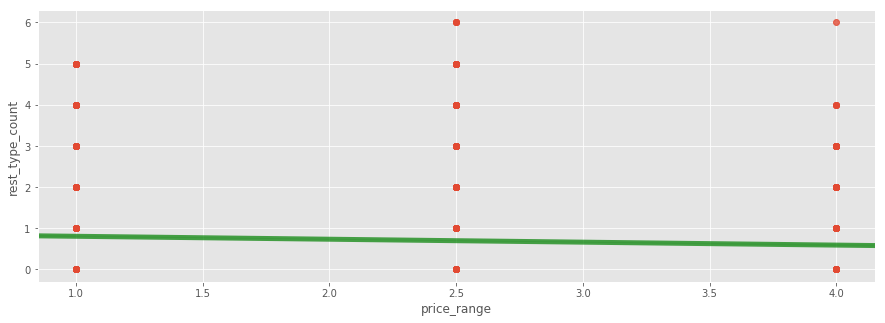

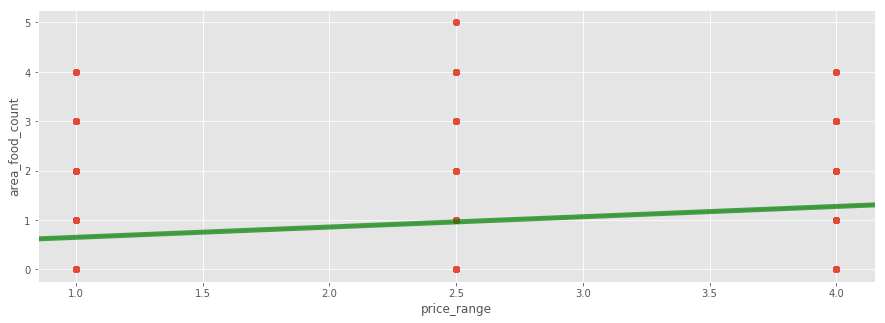

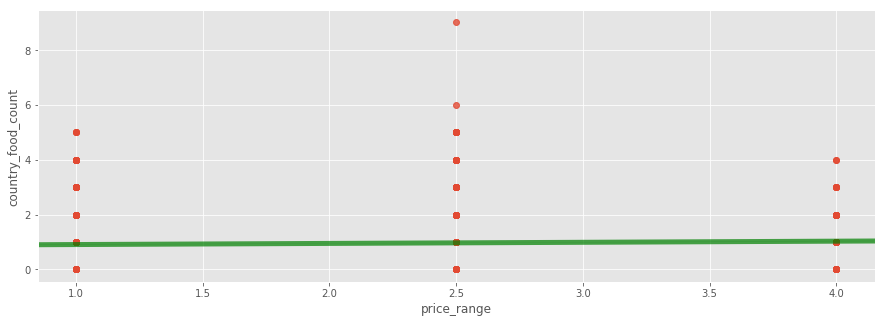

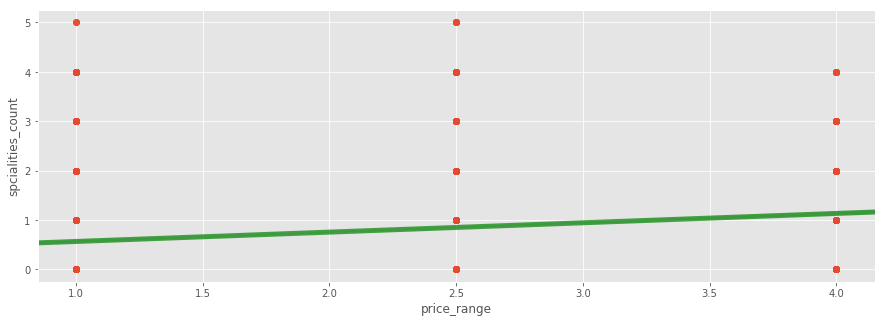

In [123]:
for col in ['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']:
    sns.regplot(x=data.loc[(data['sample']==1)]['price_range'], y=data.loc[(data['sample']==1)][col], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()

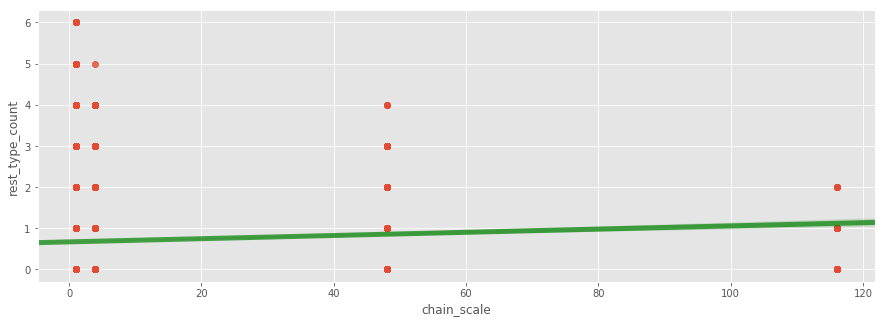

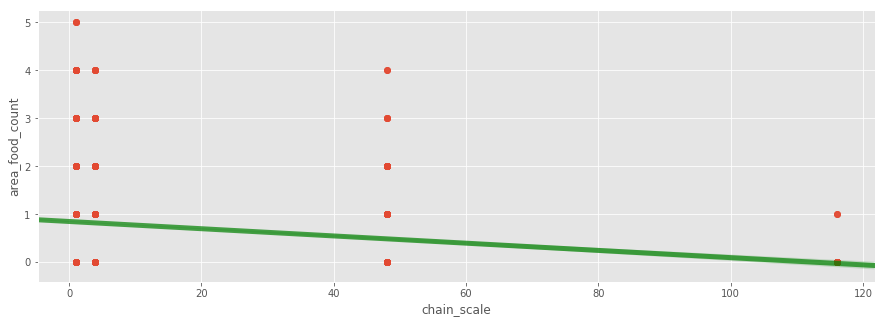

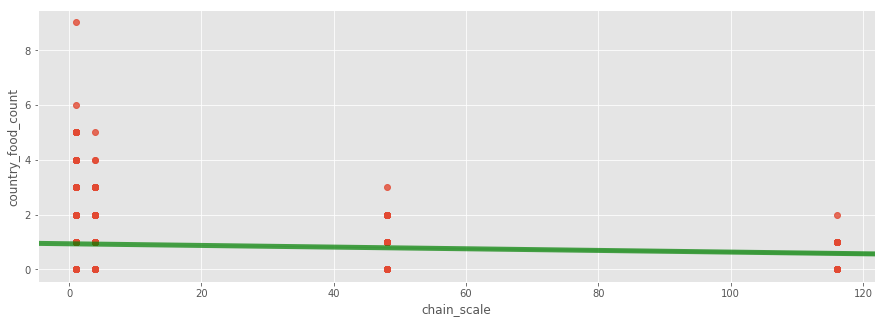

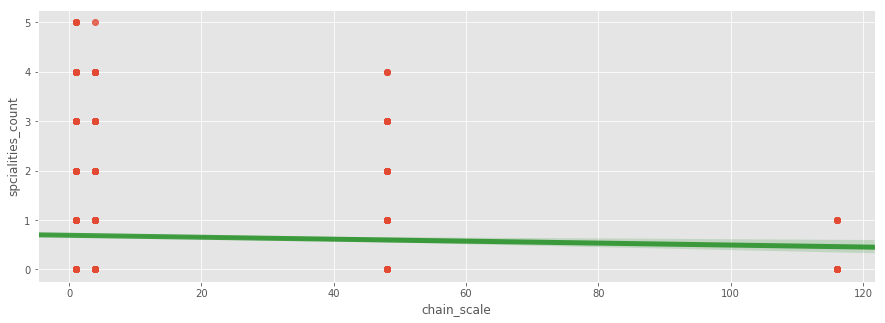

In [124]:
for col in ['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']:
    sns.regplot(x=data.loc[(data['sample']==1)]['chain_scale'], y=data.loc[(data['sample']==1)][col], line_kws={"color":"g","alpha":0.7,"lw":5})
    plt.show()

In [125]:
data.loc[(data['sample']==1)&(data['chain_scale']==116)&(data['rest_type_count']>2)]#.sample(3)

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,...,reviews_date_delta,reviews_date_delta_max,rest_type,rest_type_count,area_food,area_food_count,country_food,country_food_count,spcialities,spcialities_count


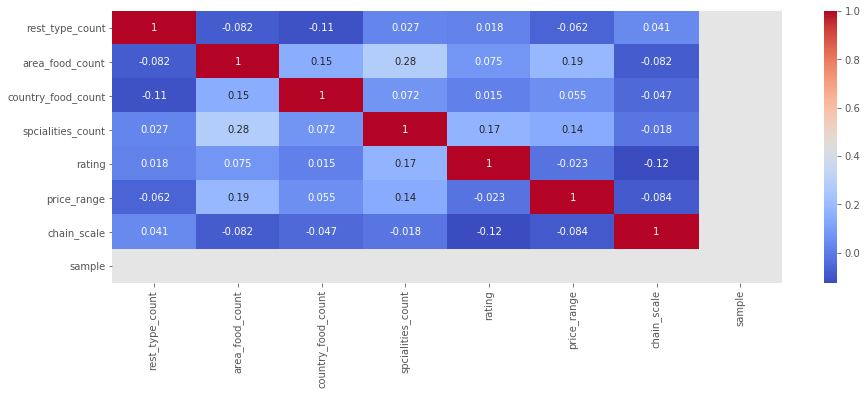

In [126]:
sns.heatmap(data[['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 'rating', 'price_range', 'chain_scale', 'sample']].query('sample==1').corr(), annot=True, cmap='coolwarm')

- the presence of a weak direct linear relationship between **rating** and the amount of **area_food** and **specialties**
- the presence of a weak direct linear relationship between **price_range** and the amount of **area_food** and **specialties**, as well as the inverse with **rest_type**
- the presence of a weak inverse linear relationship between **chain_scale** and the amount of **area_food** and **country_food**, as well as a direct one with **rest_type**

In [127]:
for col in ['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']:
    print('Restaurants that have more then one cuisine', col[:-6], '- count:', data.loc[(data['sample']==1)&(data[col]>1)][col].count(), '- %:', round(data.loc[(data['sample']==1)&(data[col]>1)][col].count()/38410, 2), '- unique:', data.loc[(data['sample']==1)&(data[col]>1)][col[:-6]].nunique())

Restaurants that have more then one cuisine rest_type - count: 4860 - %: 0.13 - unique: 520
Restaurants that have more then one cuisine area_food - count: 6070 - %: 0.16 - unique: 157
Restaurants that have more then one cuisine country_food - count: 2840 - %: 0.07 - unique: 572
Restaurants that have more then one cuisine spcialities - count: 6077 - %: 0.16 - unique: 23


In [128]:
data.loc[(data['sample']==1)&(data['rest_type'].isna()==False)].head()

,restaurant_id,city,cuisine_style,ranking,price_range,number_of_reviews,reviews,url_ta,id_ta,sample,...,reviews_date_delta,reviews_date_delta_max,rest_type,rest_type_count,area_food,area_food_count,country_food,country_food_count,spcialities,spcialities_count
10000,id_5569,Paris,"[European, French, International]",5570.0,2.5,194.0,"['Good food at your doorstep', 'A good hotel r...",/Restaurant_Review-g187147-d1912643-Reviews-R_...,d1912643,1,...,41.0,57.0,-,0.0,"European, International",2.0,French,1.0,-,0.0
10002,id_352,London,"[Japanese, Sushi, Asian, Grill, Vegetarian Fri...",353.0,4.0,688.0,"['Catch up with friends', 'Not exceptional', '...",/Restaurant_Review-g186338-d8632781-Reviews-RO...,d8632781,1,...,2.0,49.0,"Sushi, Grill",2.0,Asian,1.0,Japanese,1.0,"Gluten Free Options, Vegetarian Friendly, Vega...",3.0
10004,id_615,Munich,"[German, Central European, Vegetarian Friendly]",621.0,2.5,84.0,"['Best place to try a Bavarian food', 'Nice bu...",/Restaurant_Review-g187309-d6864963-Reviews-Au...,d6864963,1,...,272.0,100.0,-,0.0,Central European,1.0,German,1.0,Vegetarian Friendly,1.0
10006,id_1720,Milan,"[Italian, Pizza]",1722.0,1.0,50.0,"['Excellent simple local eatery.', 'Excellent ...",/Restaurant_Review-g187849-d5808504-Reviews-Pi...,d5808504,1,...,93.0,113.0,Pizza,1.0,-,0.0,Italian,1.0,-,0.0
10007,id_825,Bratislava,[Italian],826.0,NaN,9.0,"['Wasting of money', 'excellent cuisine', '02/...",/Restaurant_Review-g274924-d3199765-Reviews-Ri...,d3199765,1,...,613.0,1471.0,-,0.0,-,0.0,Italian,1.0,-,0.0


In 75% of cases, in each type of kitchen, we are dealing with 1 position, a maximum of 16% include 2 or more, unique and even less. This gives us an opportunity to draw some general conclusions.

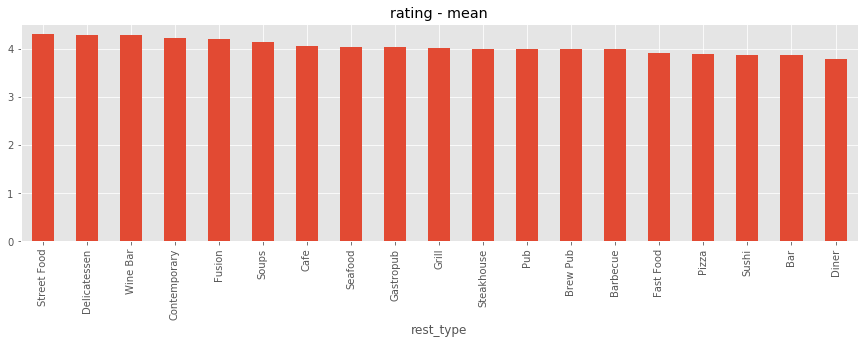

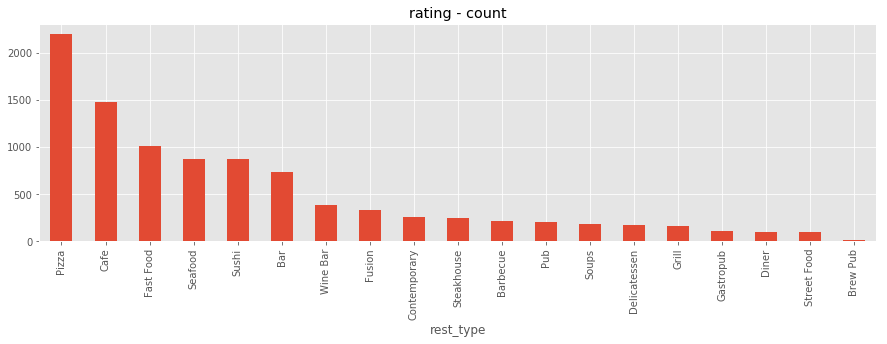

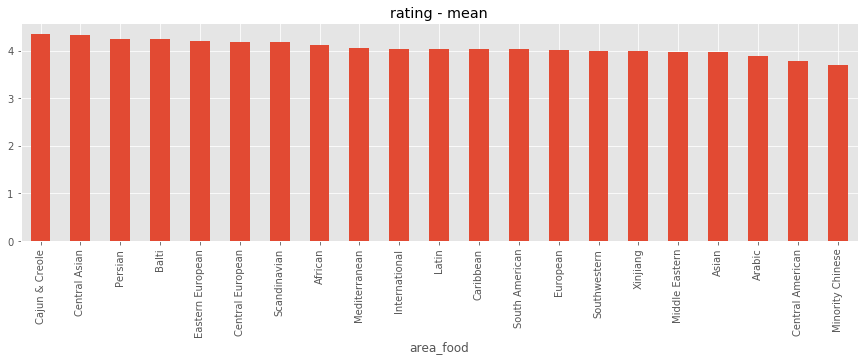

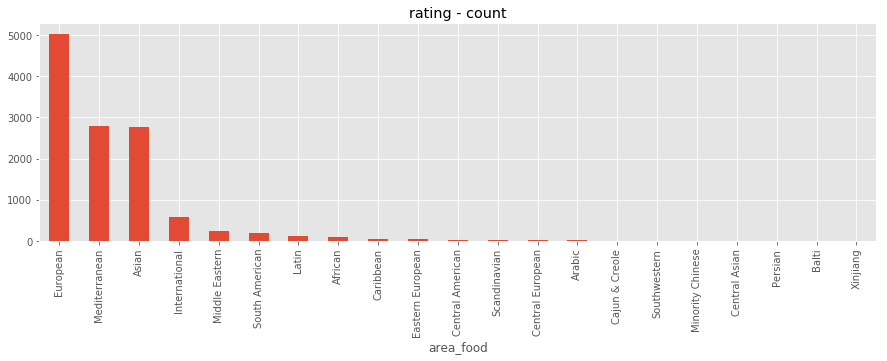

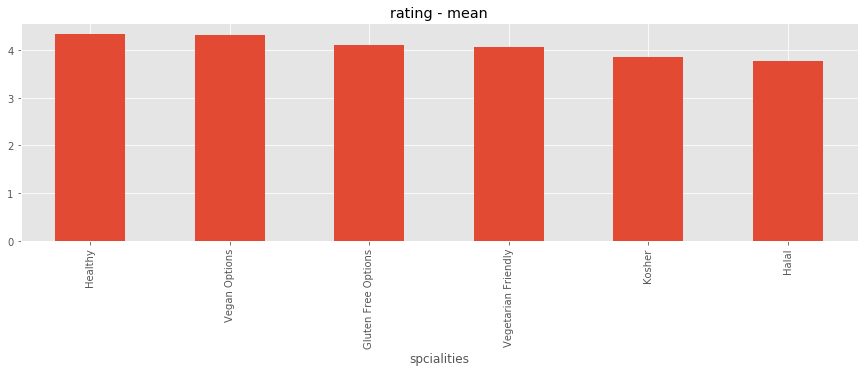

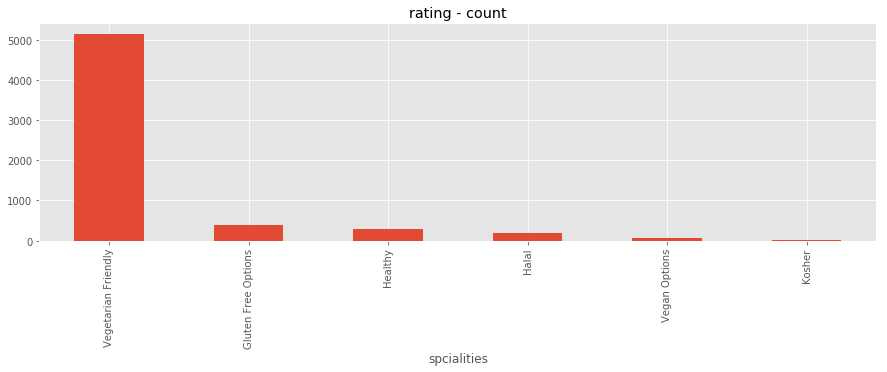

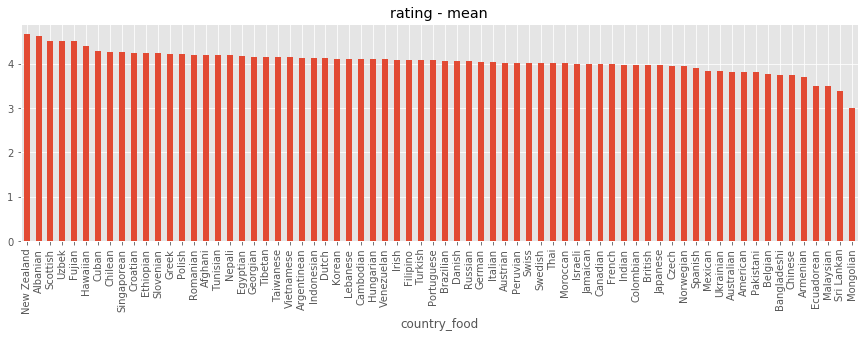

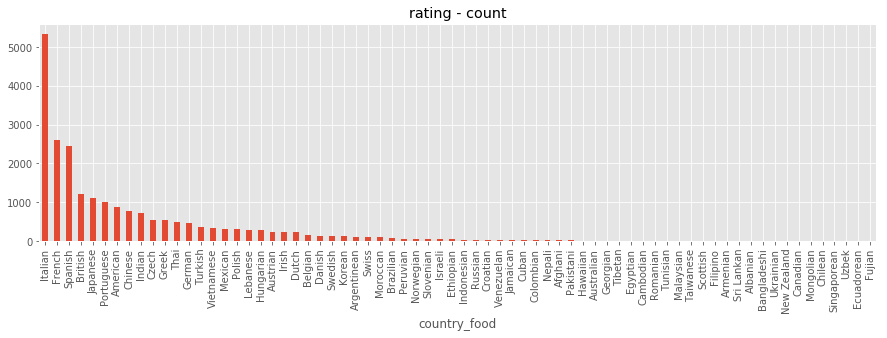

In [129]:
for ind, col in enumerate(['rest_type', 'area_food', 'spcialities', 'country_food']):
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['rating'].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('rating - mean')
    plt.show()
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['rating'].count().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('rating - count')
    plt.show()

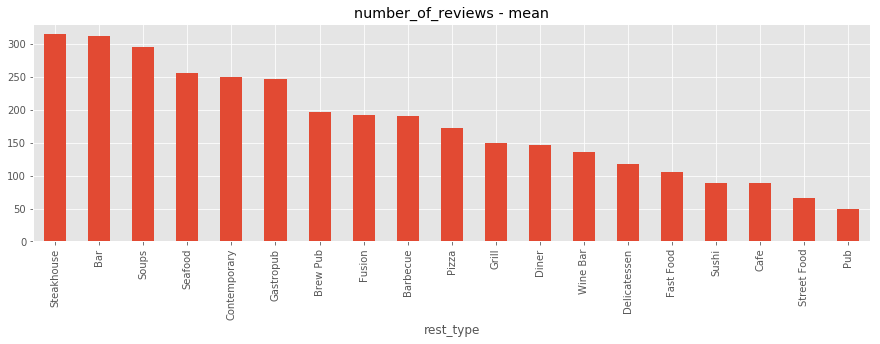

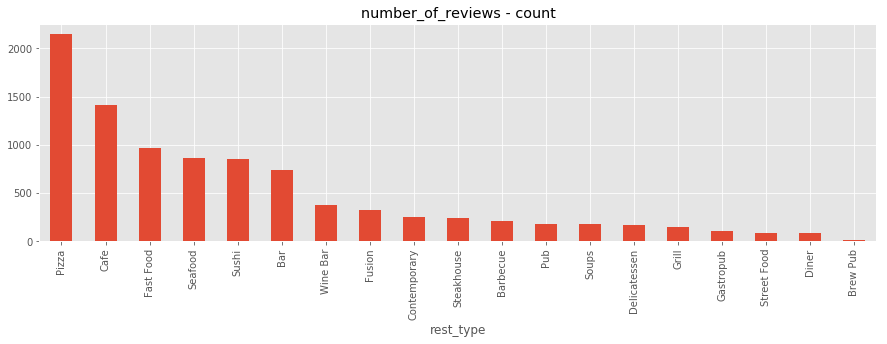

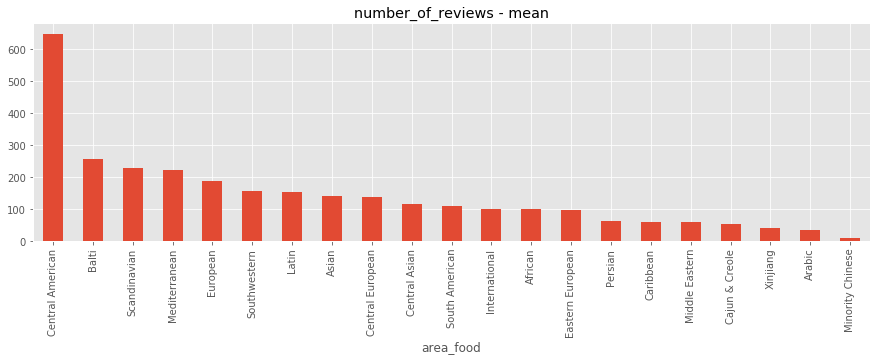

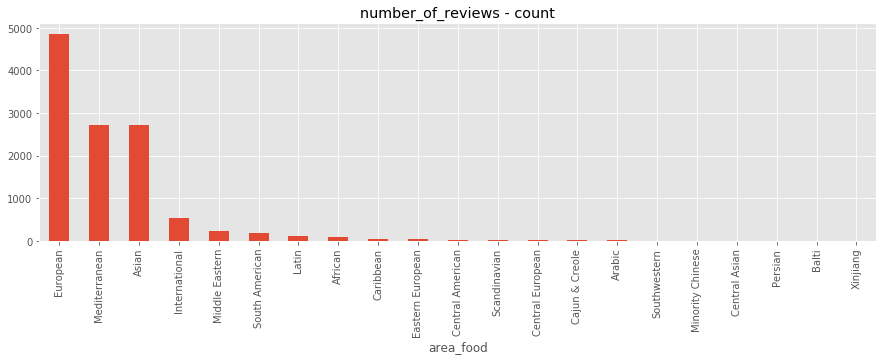

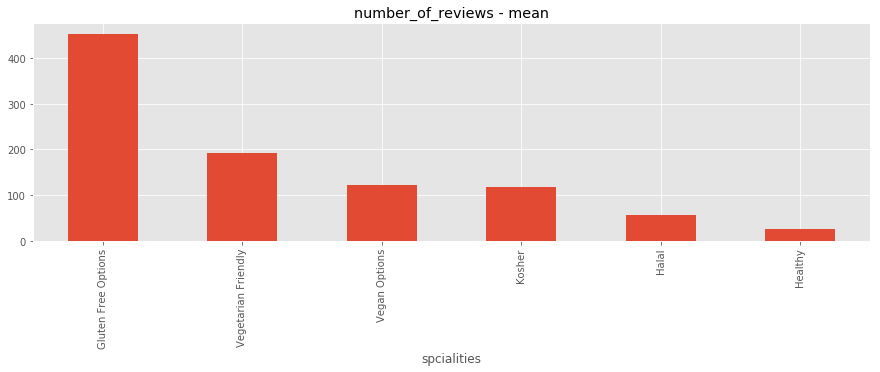

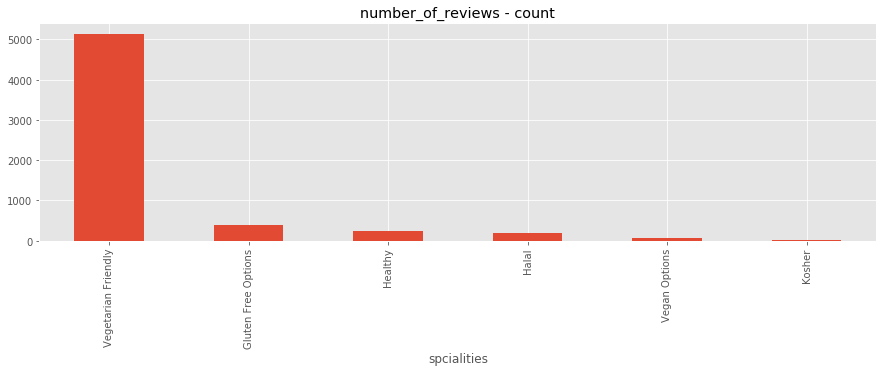

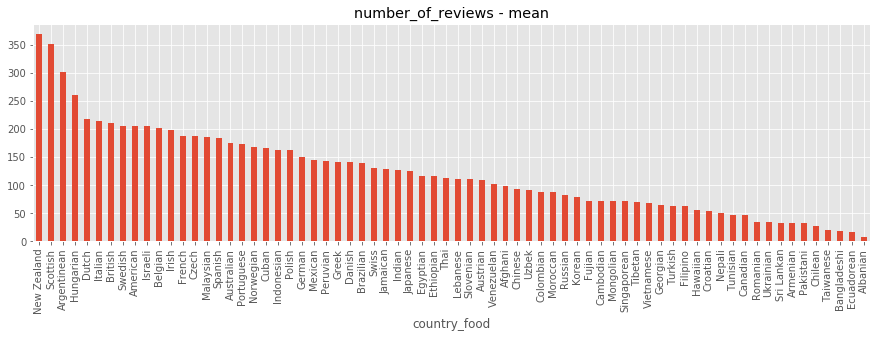

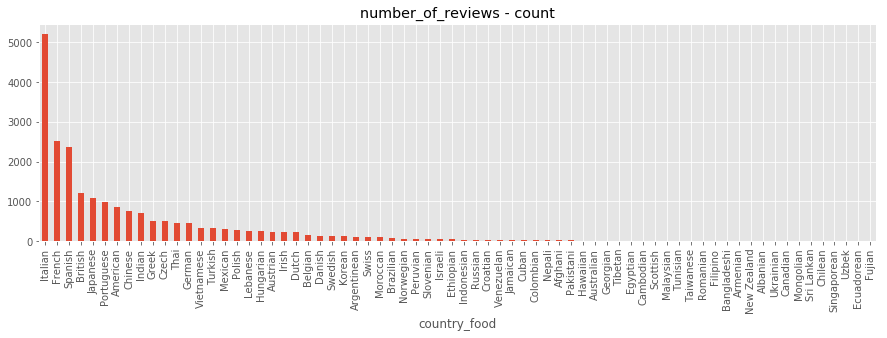

In [130]:
for ind, col in enumerate(['rest_type', 'area_food', 'spcialities', 'country_food']):
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['number_of_reviews'].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('number_of_reviews - mean')
    plt.show()
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['number_of_reviews'].count().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('number_of_reviews - count')
    plt.show()

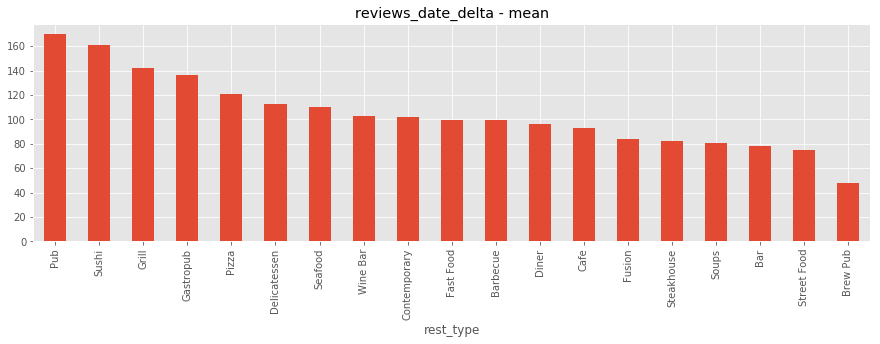

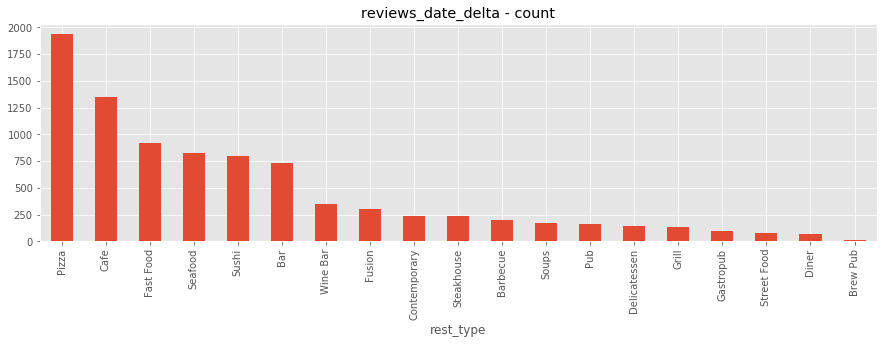

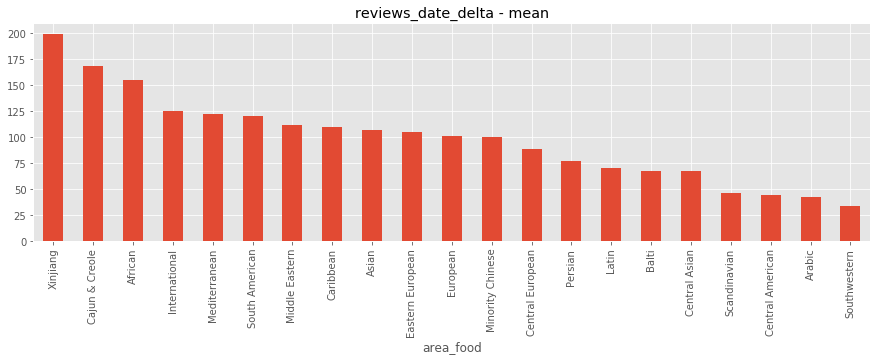

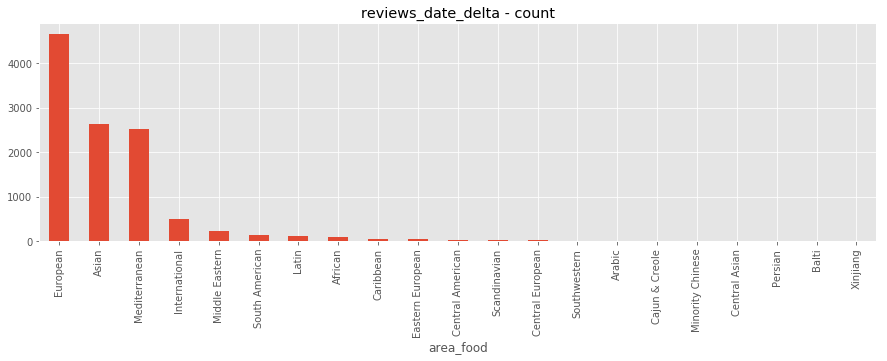

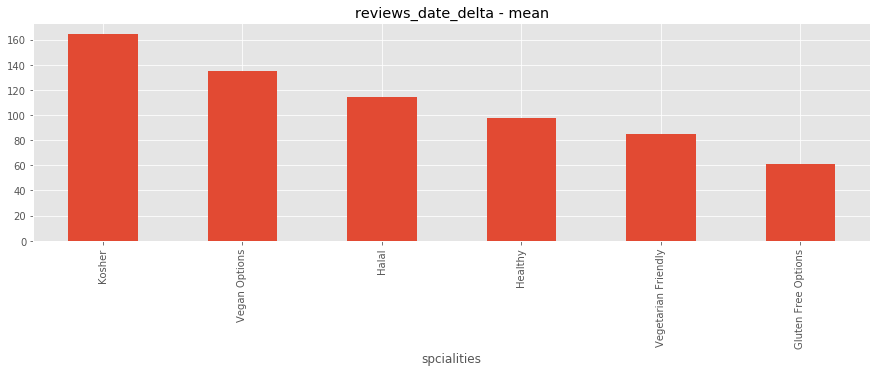

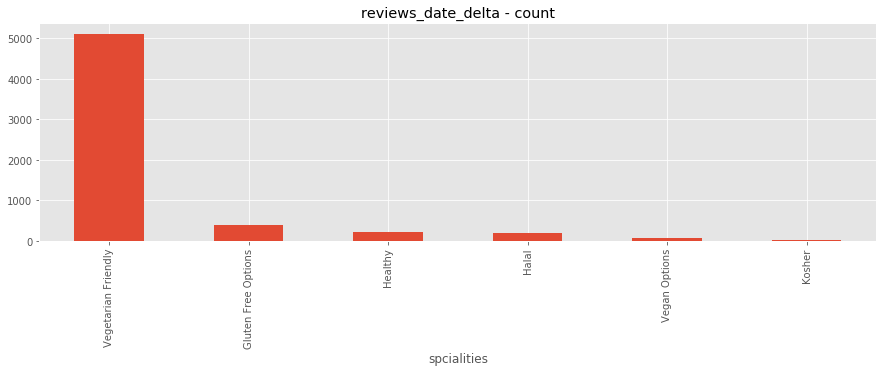

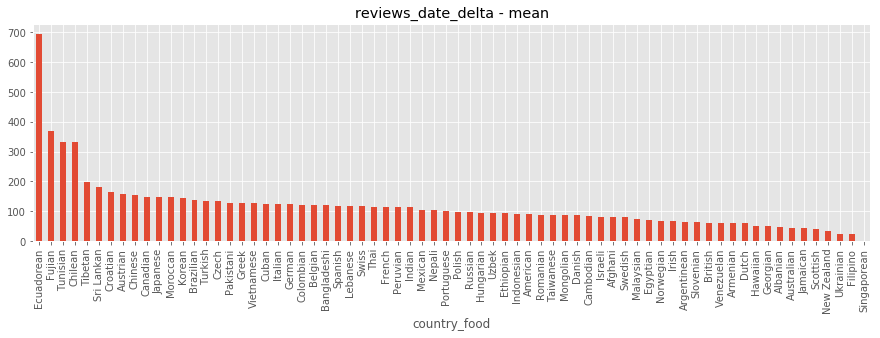

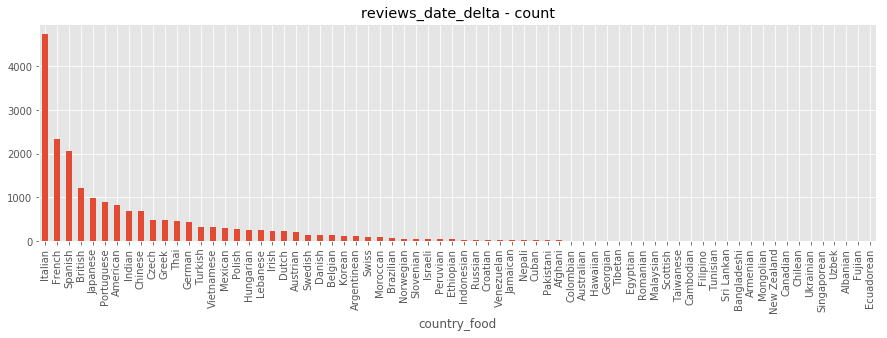

In [131]:
for ind, col in enumerate(['rest_type', 'area_food', 'spcialities', 'country_food']):
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['reviews_date_delta'].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('reviews_date_delta - mean')
    plt.show()
    data.loc[(data['sample']==1)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)['reviews_date_delta'].count().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
    plt.title('reviews_date_delta - count')
    plt.show()

London


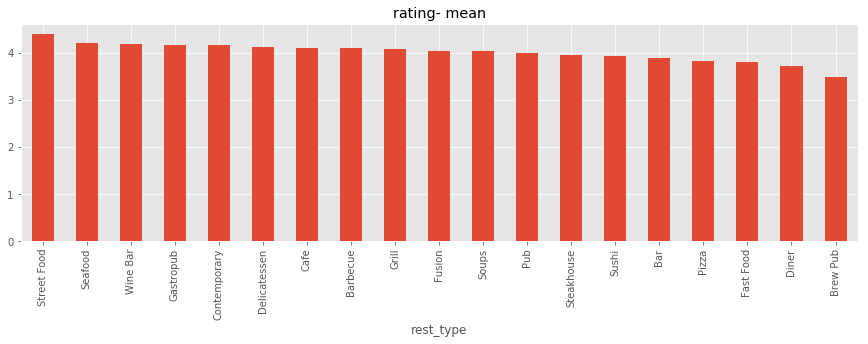

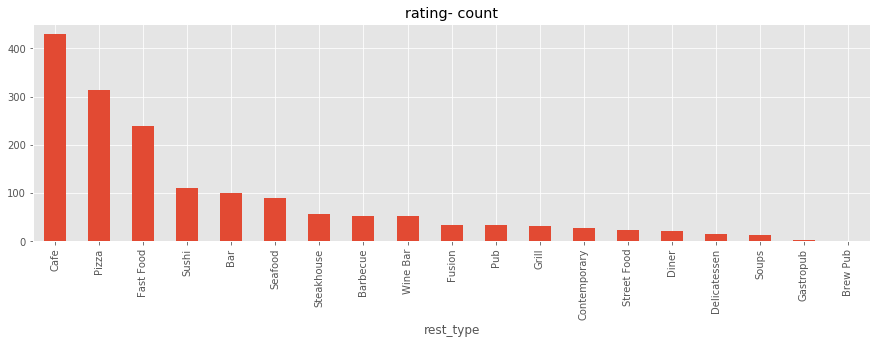

Paris


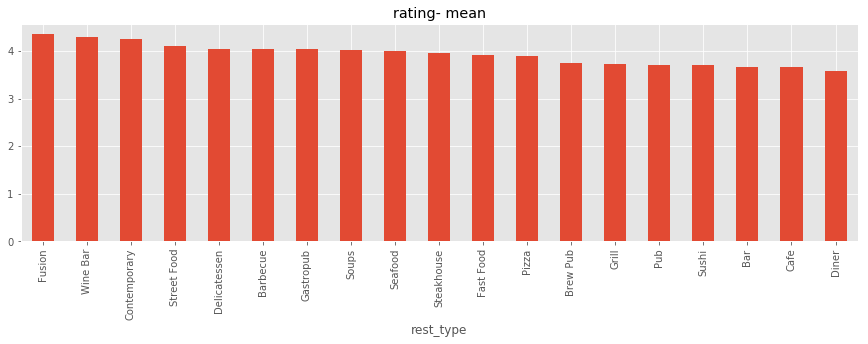

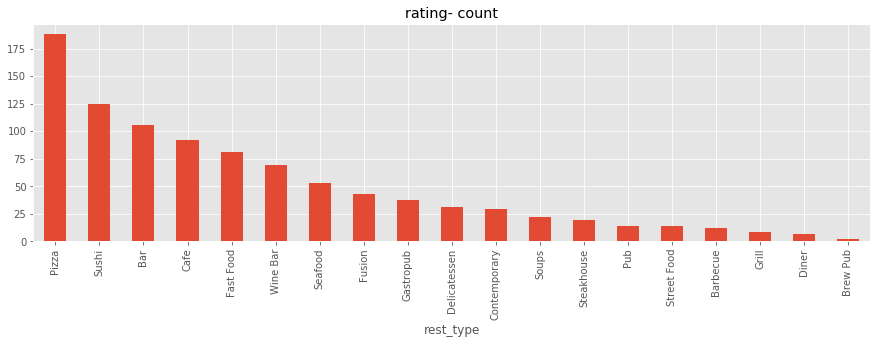

Madrid


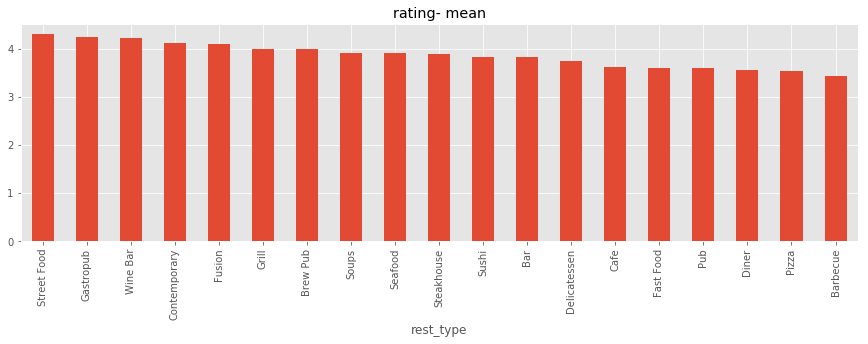

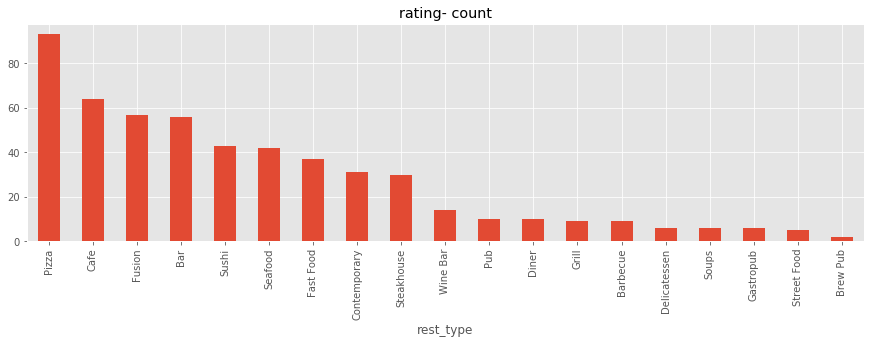

Barcelona


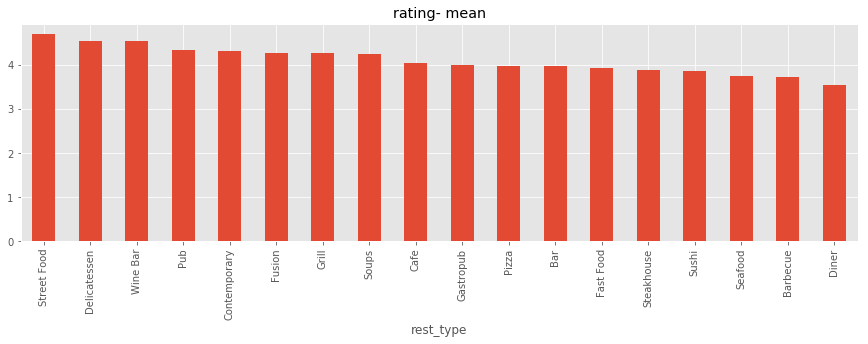

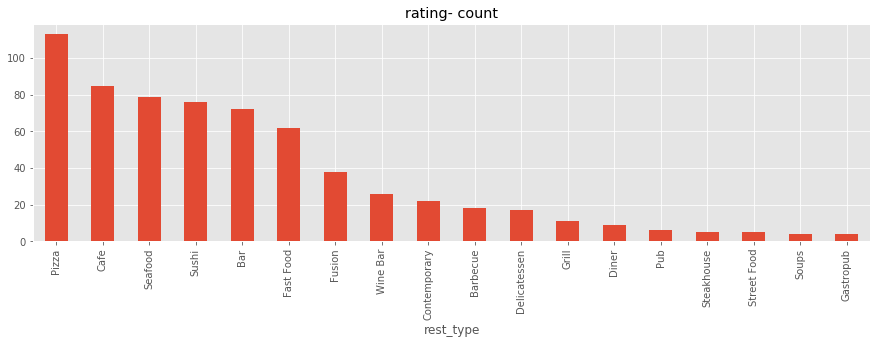

Berlin


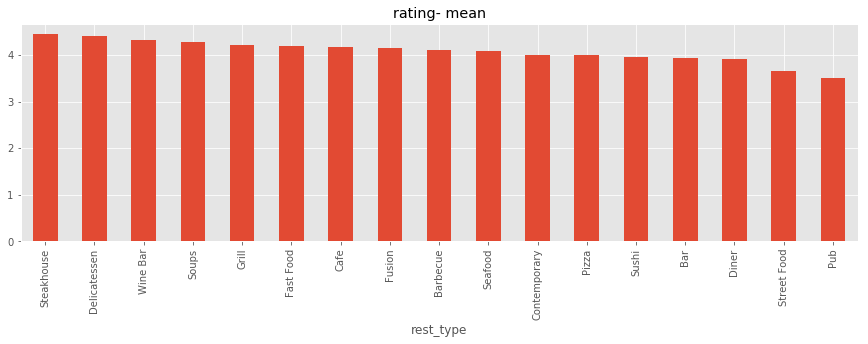

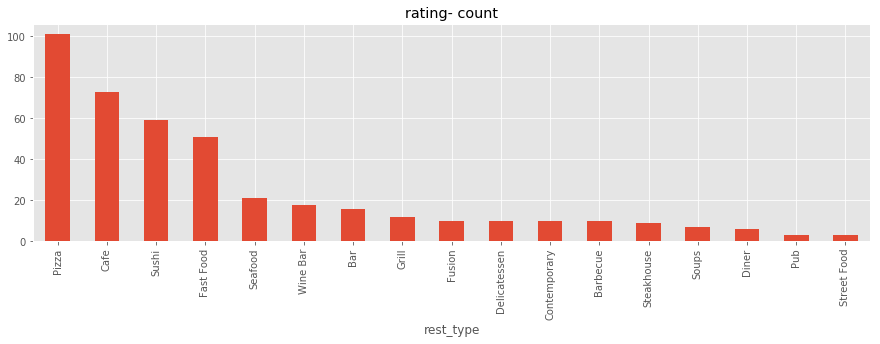

London


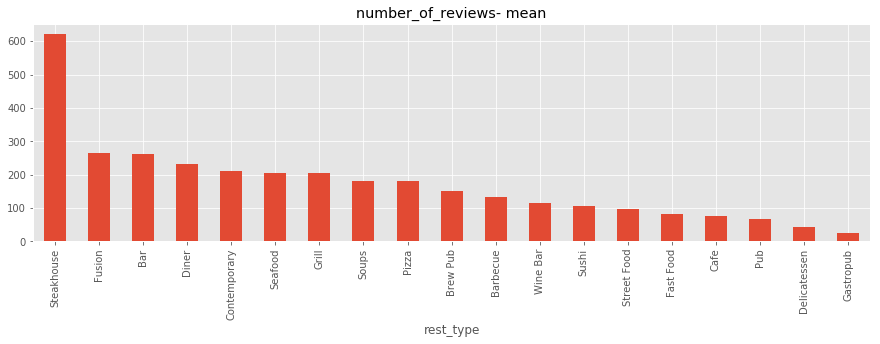

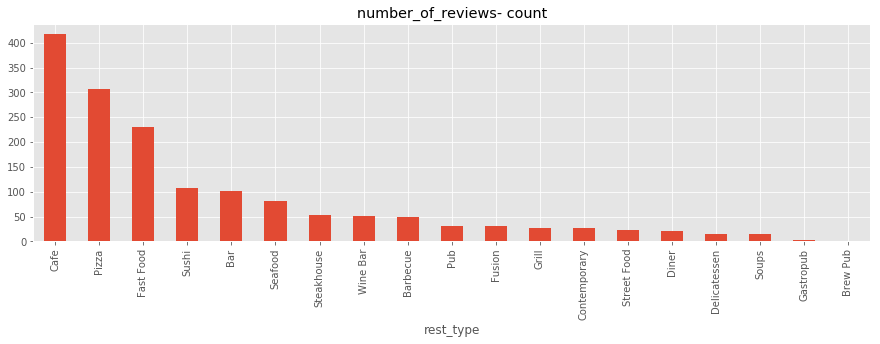

Paris


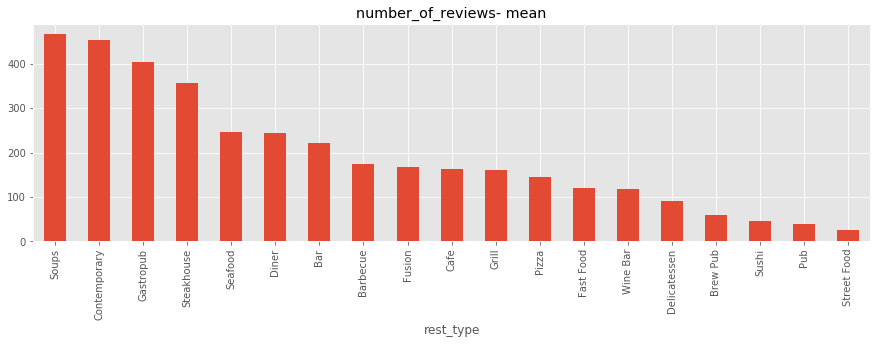

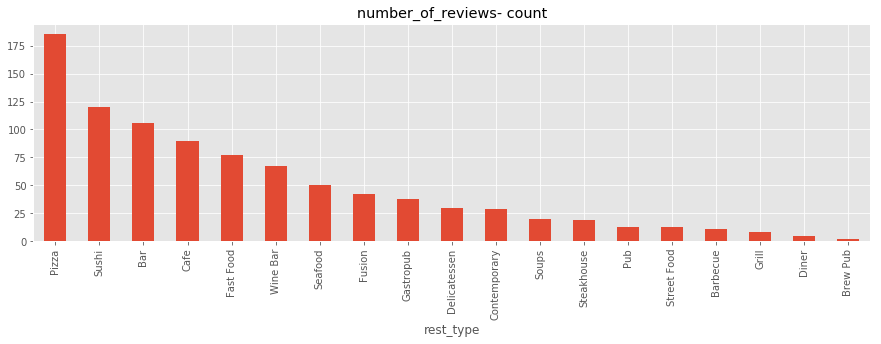

Madrid


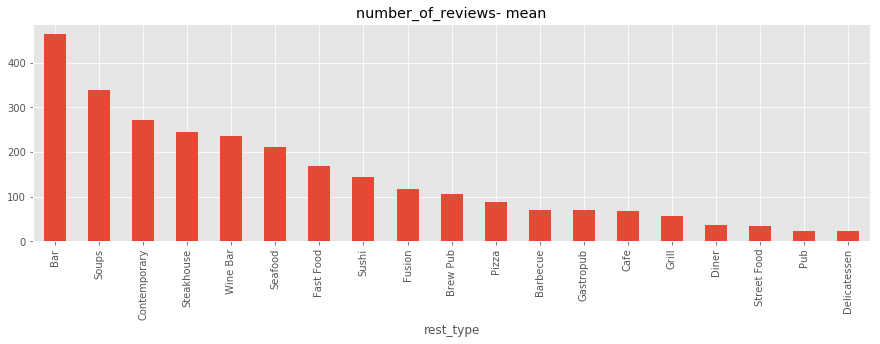

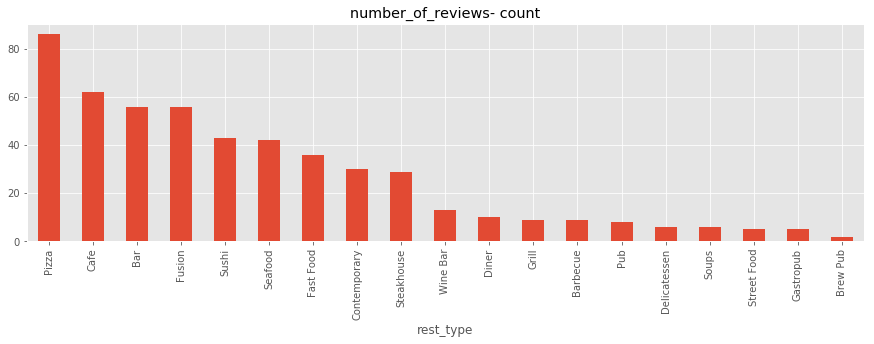

Barcelona


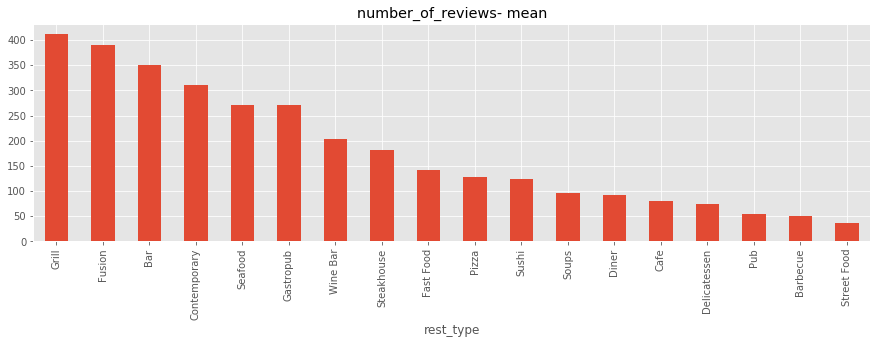

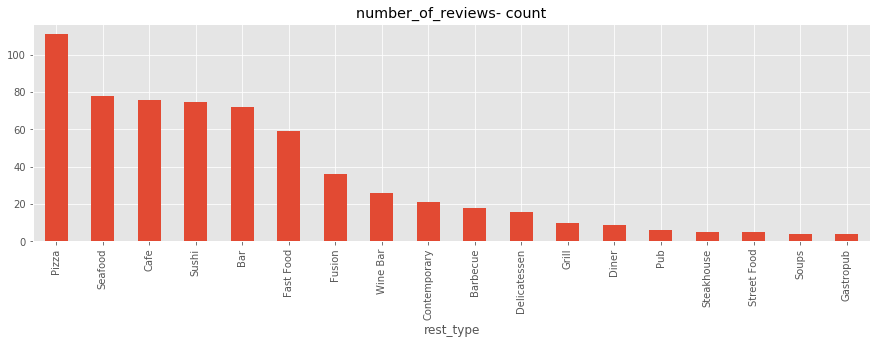

Berlin


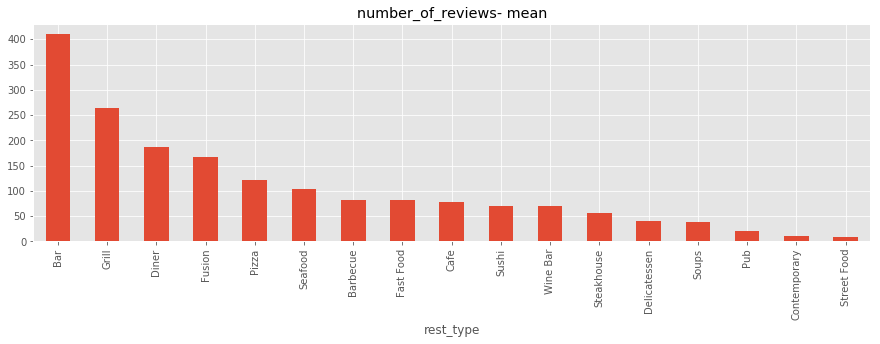

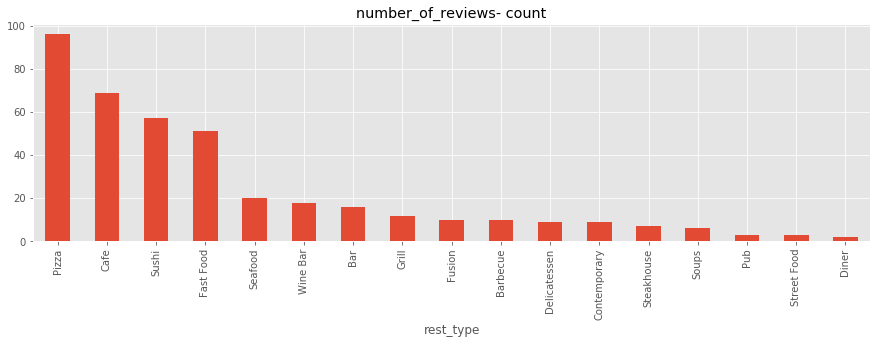

London


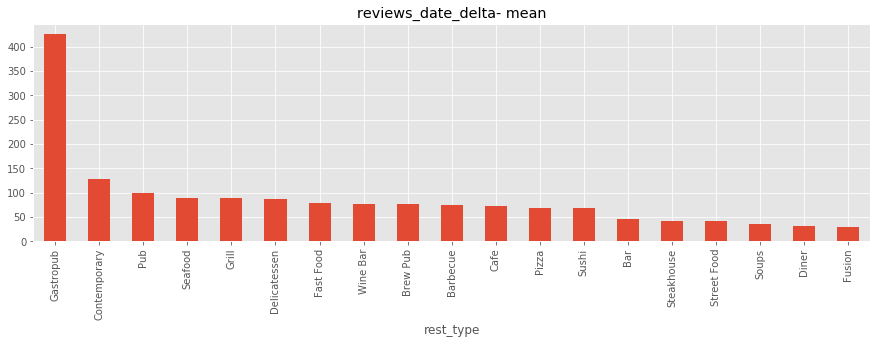

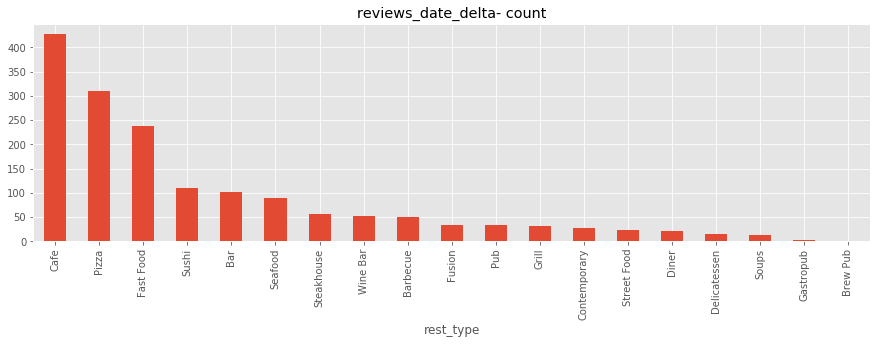

Paris


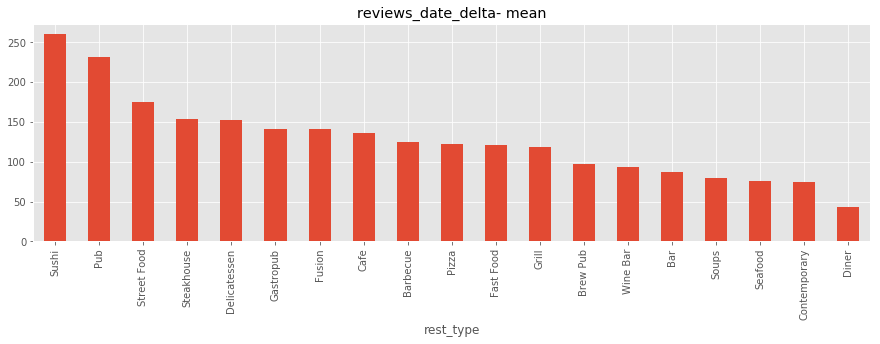

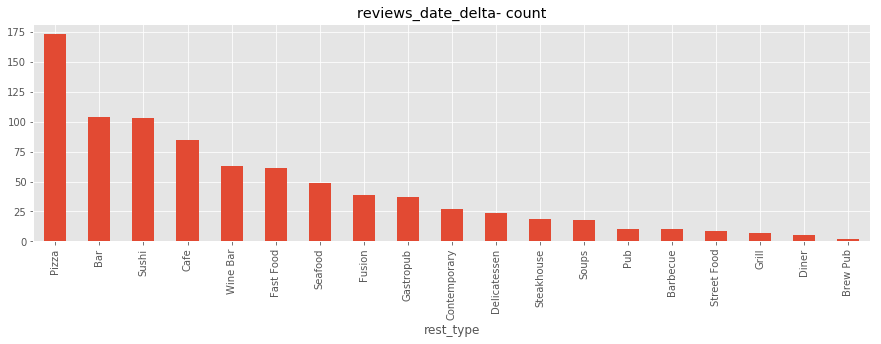

Madrid


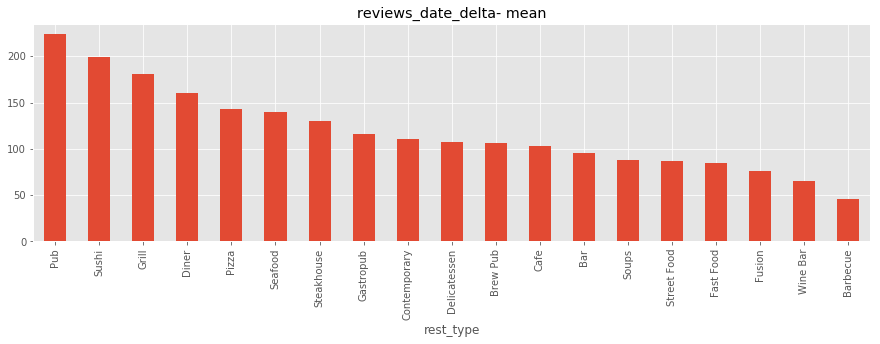

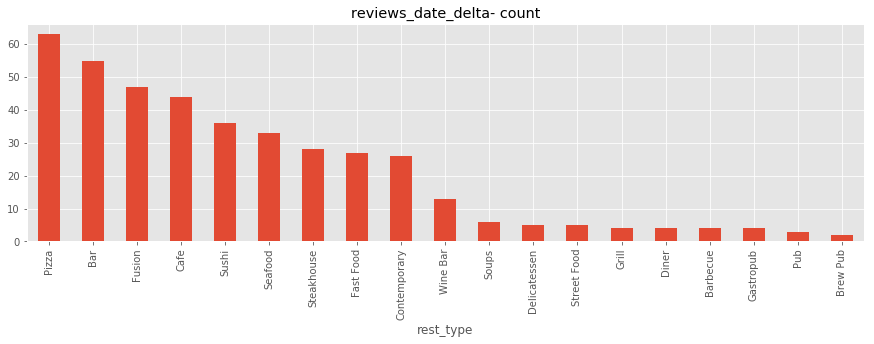

Barcelona


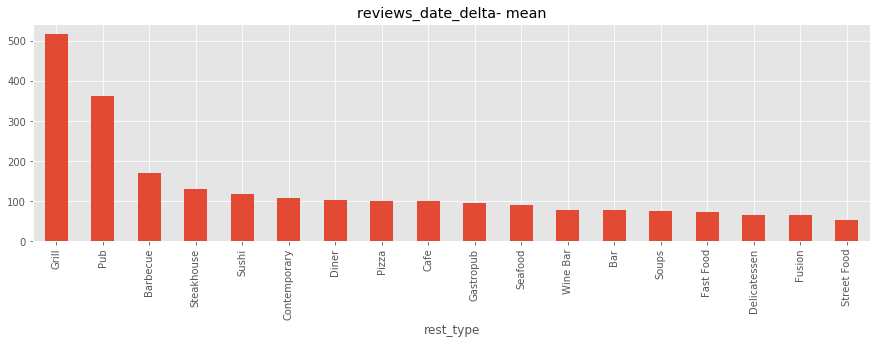

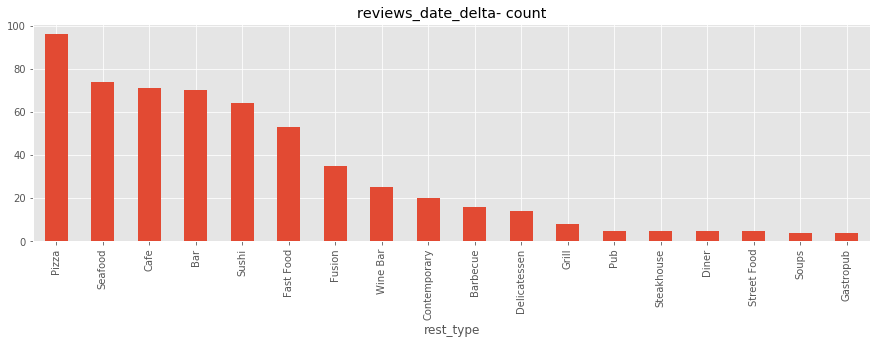

Berlin


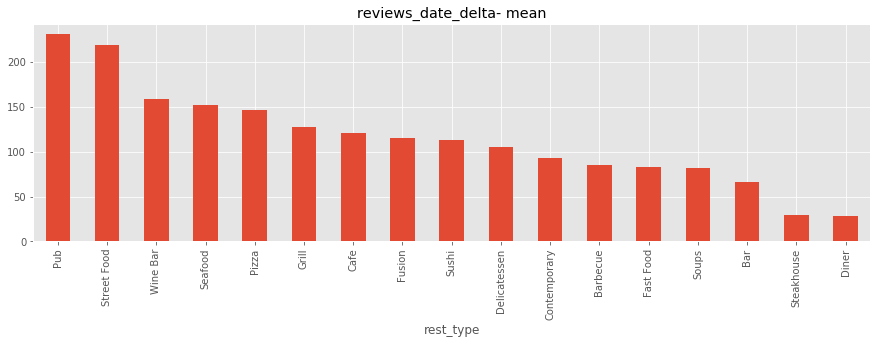

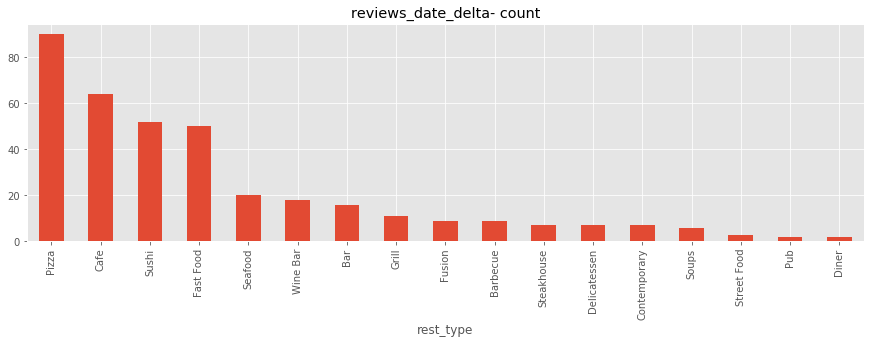

London


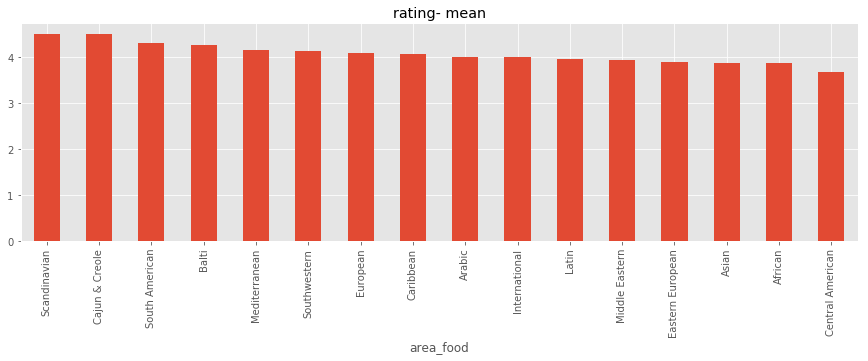

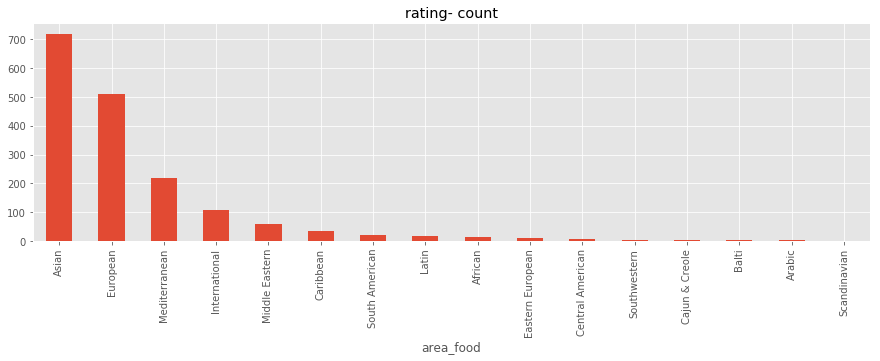

Paris


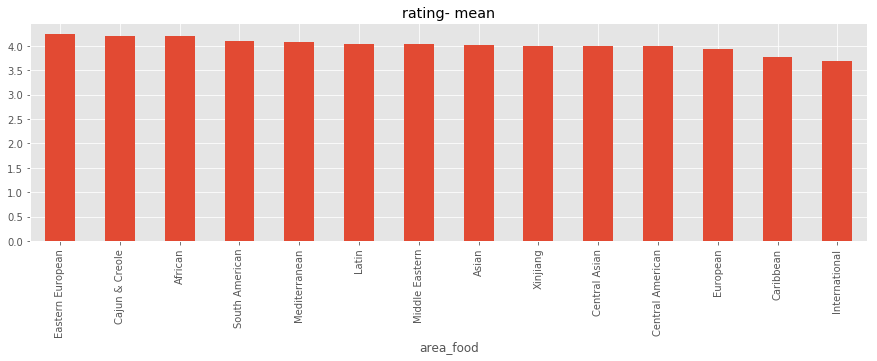

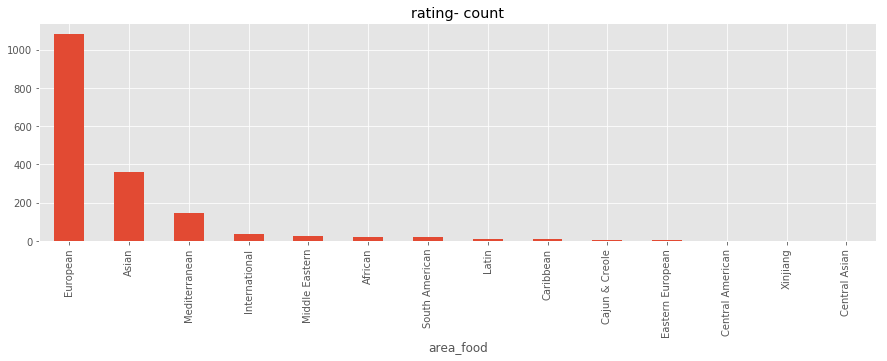

Madrid


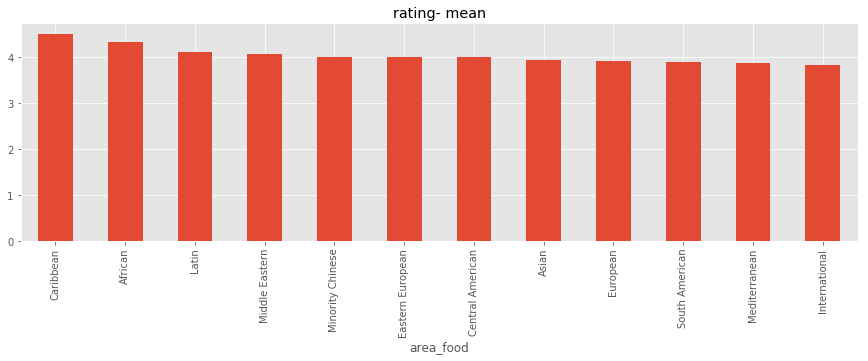

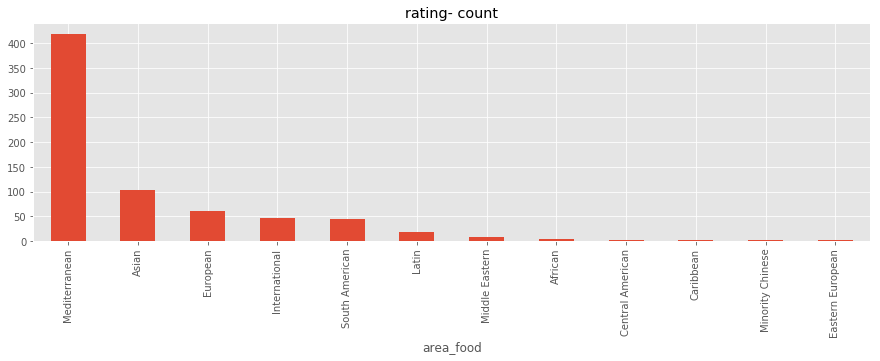

Barcelona


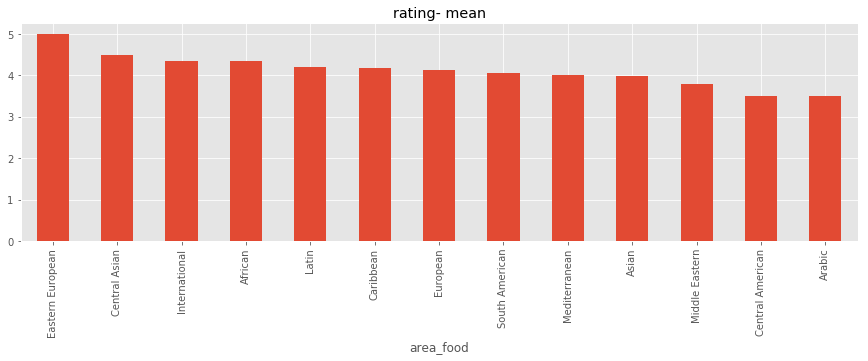

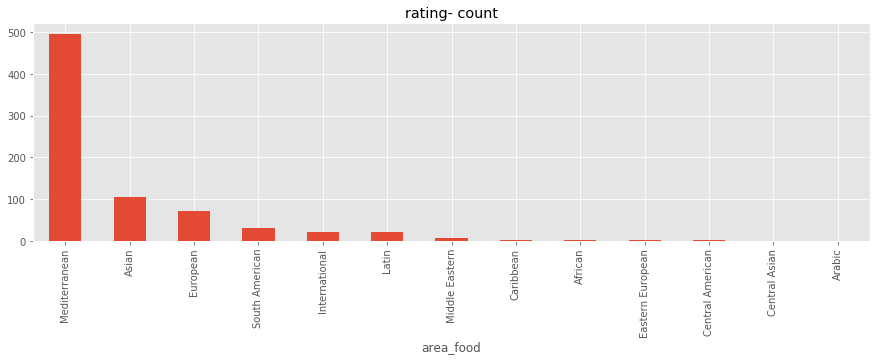

Berlin


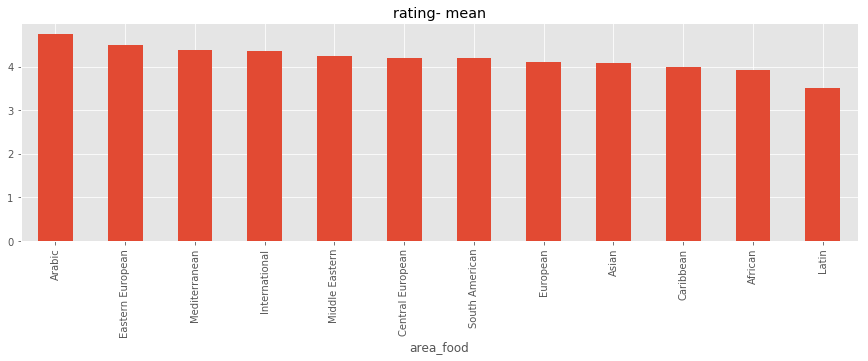

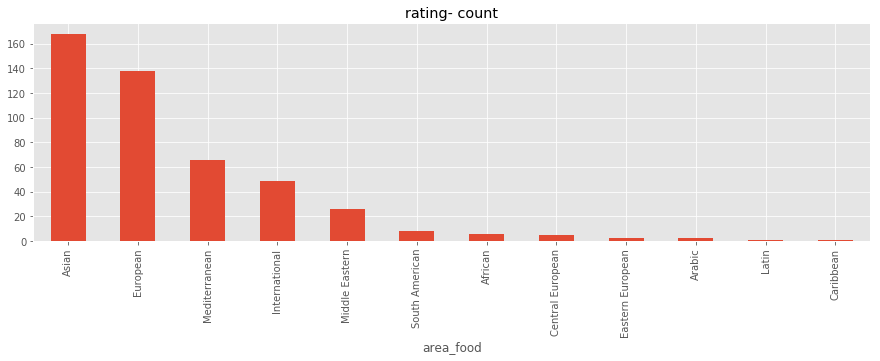

London


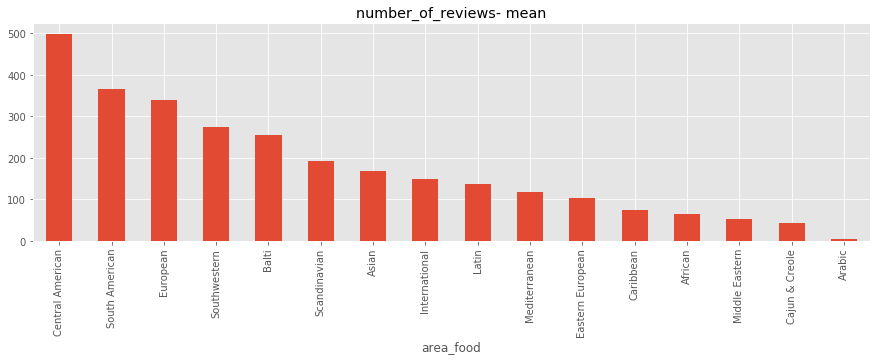

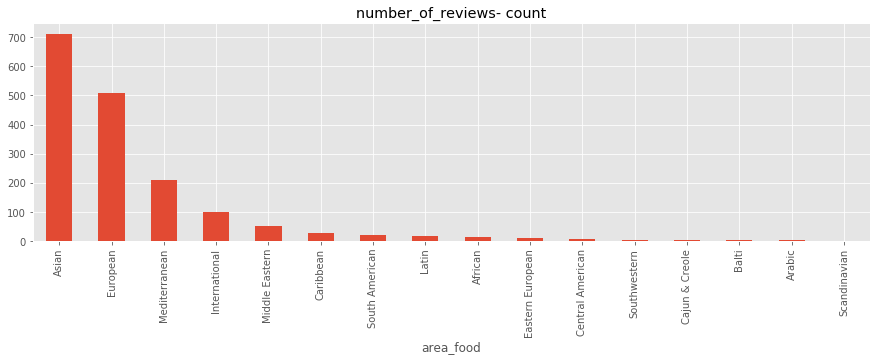

Paris


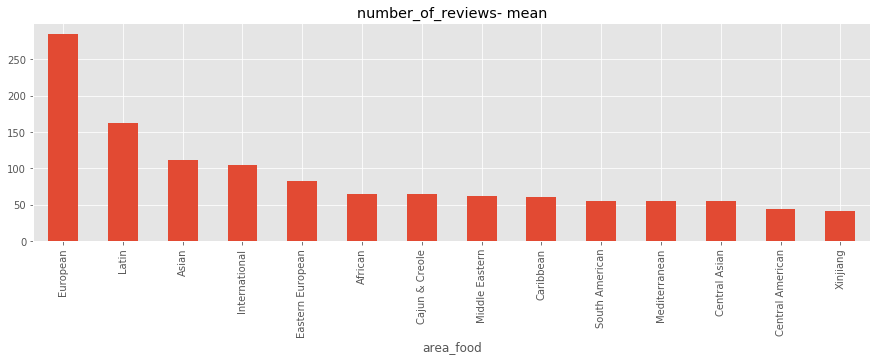

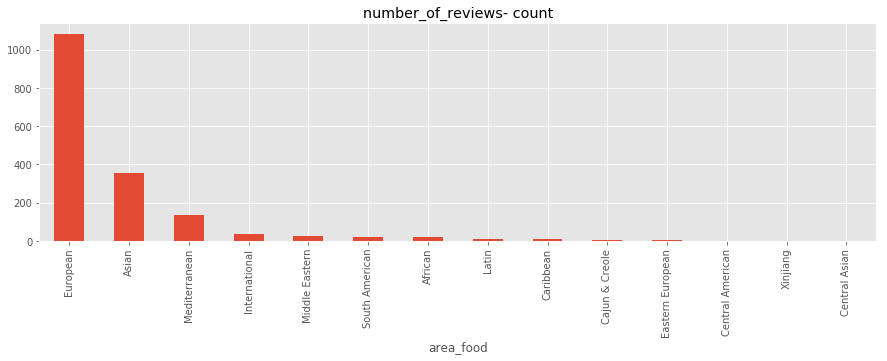

Madrid


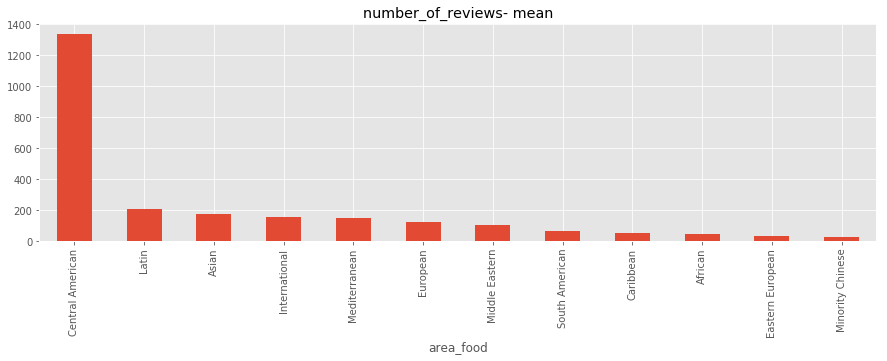

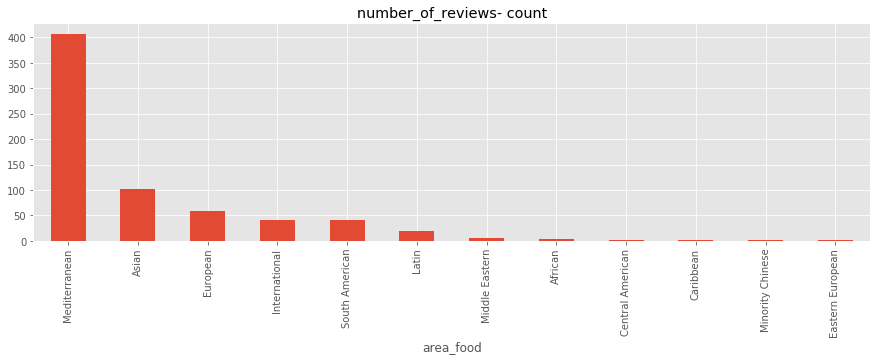

Barcelona


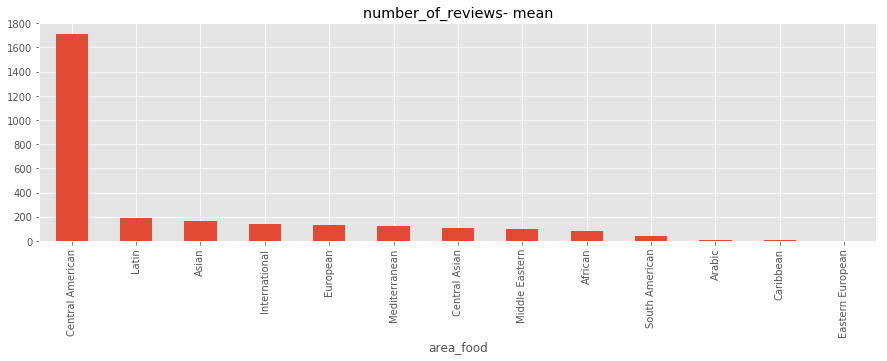

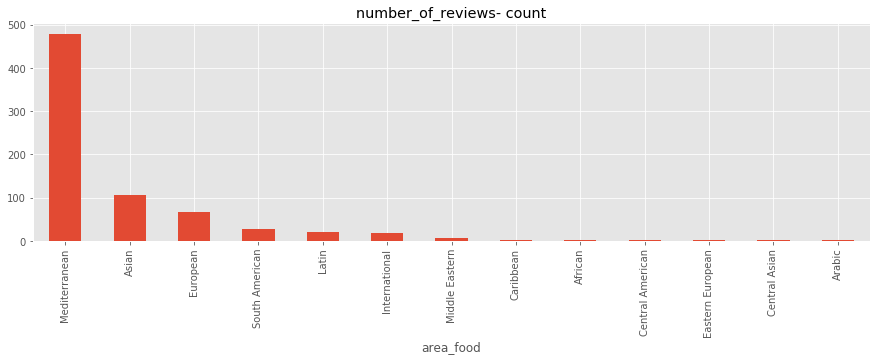

Berlin


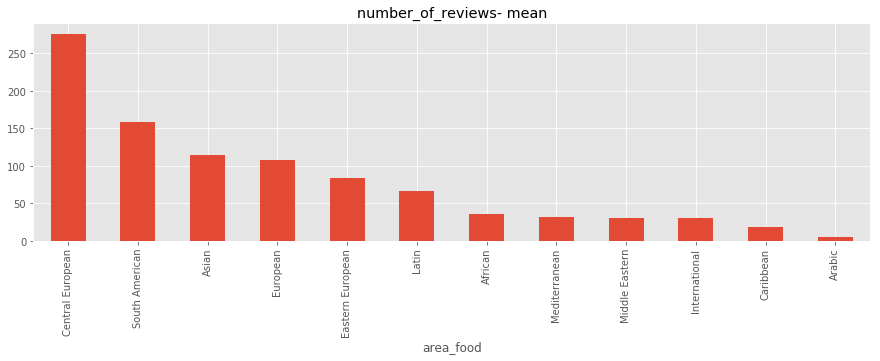

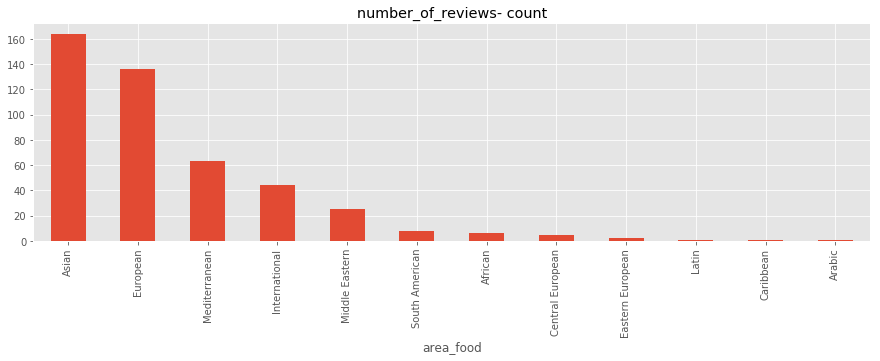

London


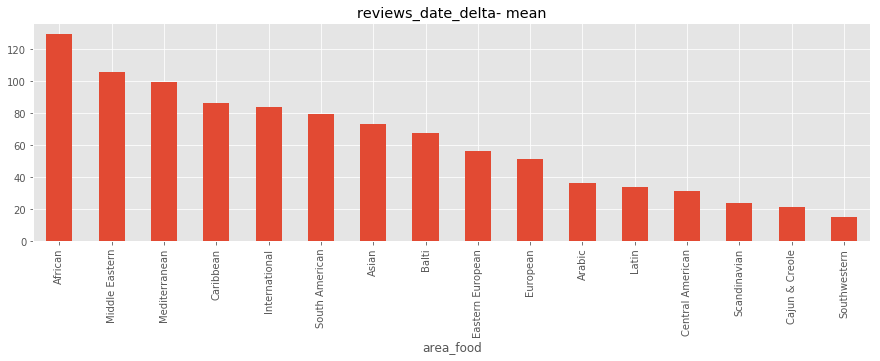

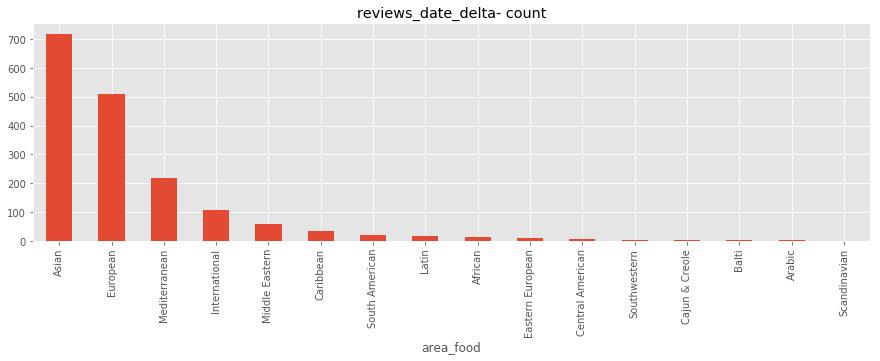

Paris


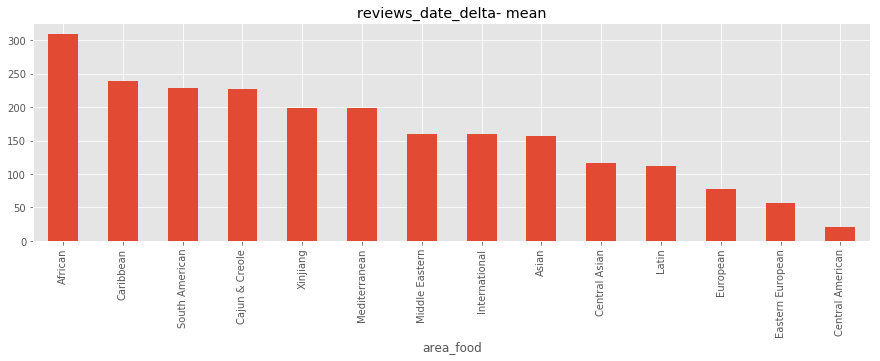

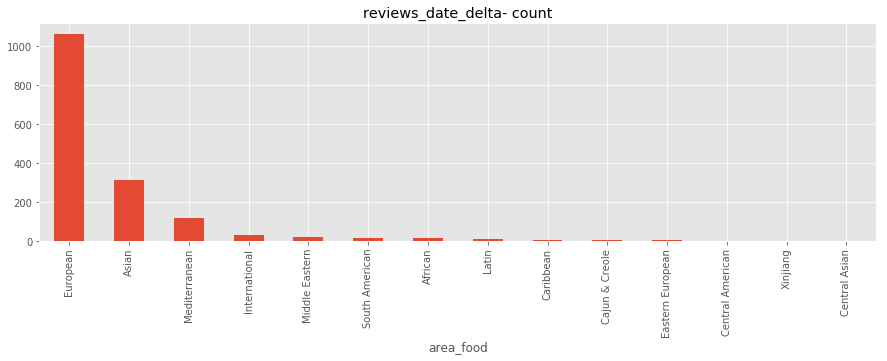

Madrid


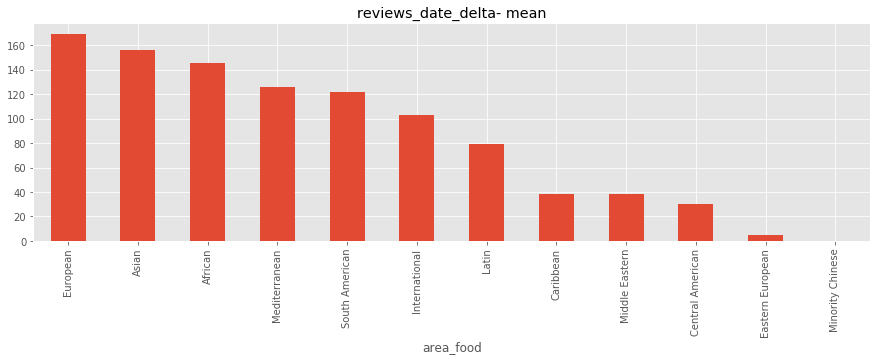

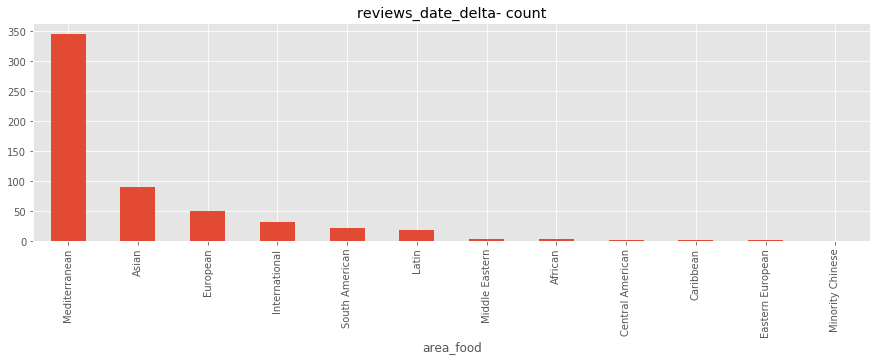

Barcelona


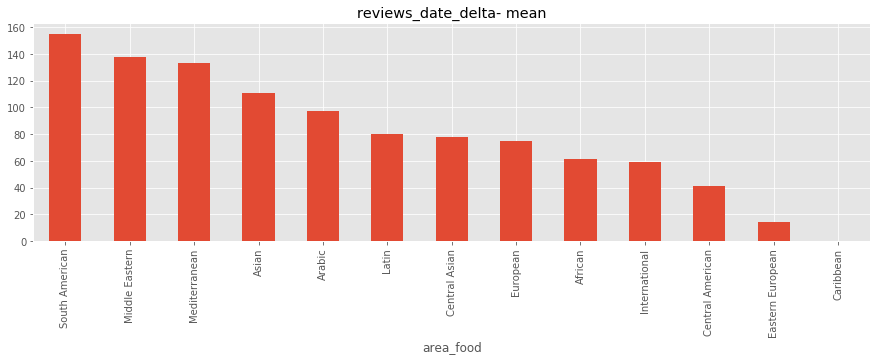

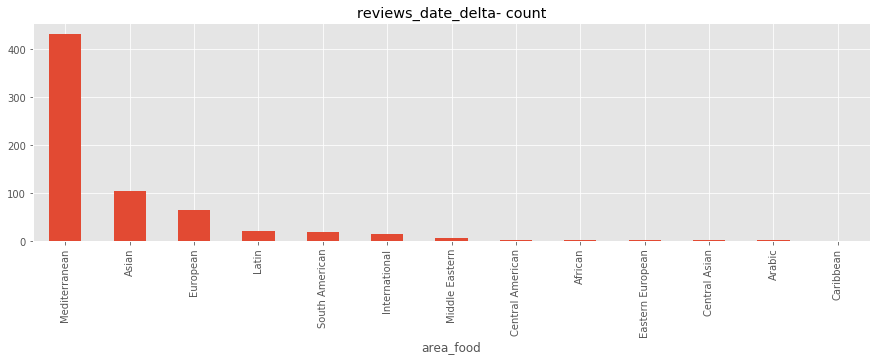

Berlin


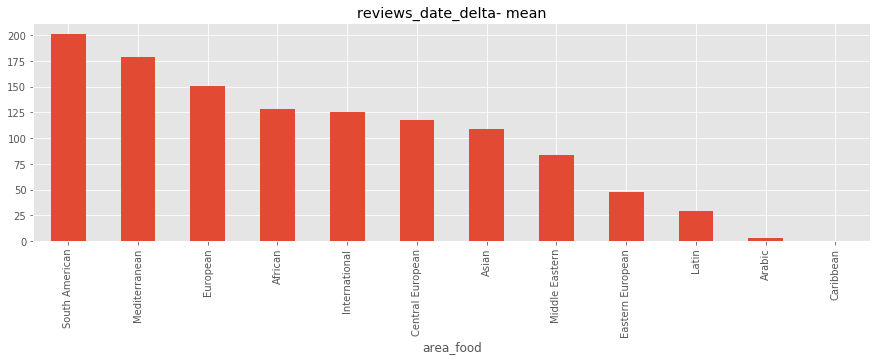

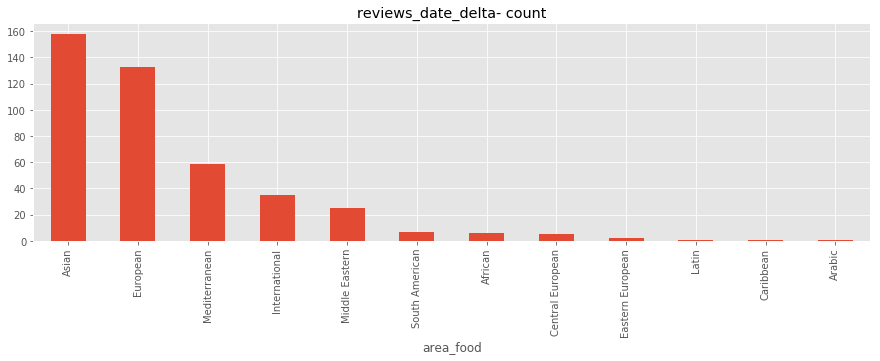

London


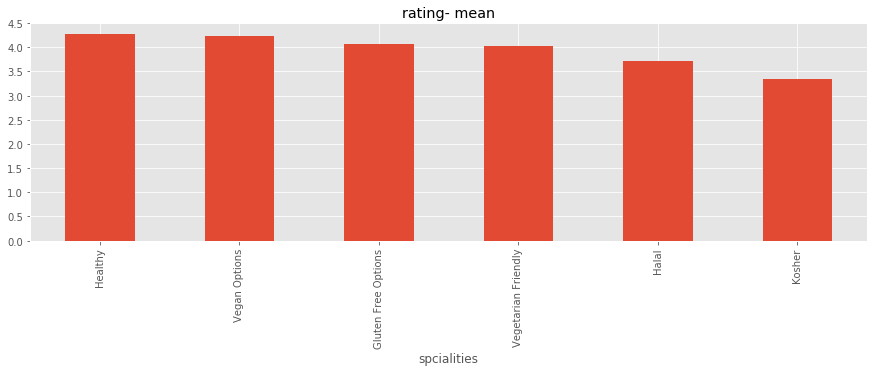

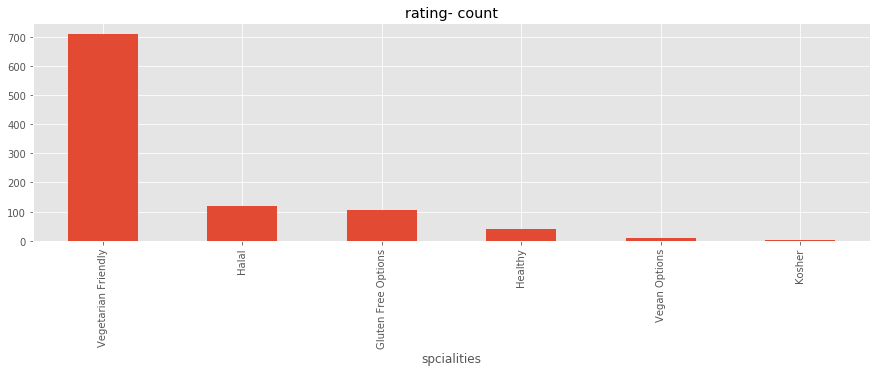

Paris


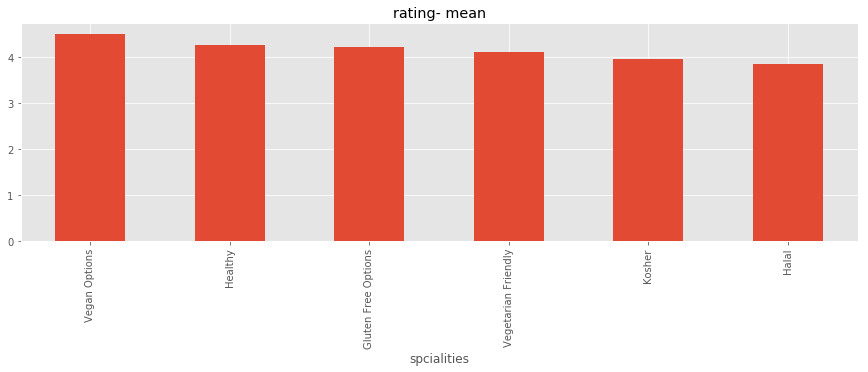

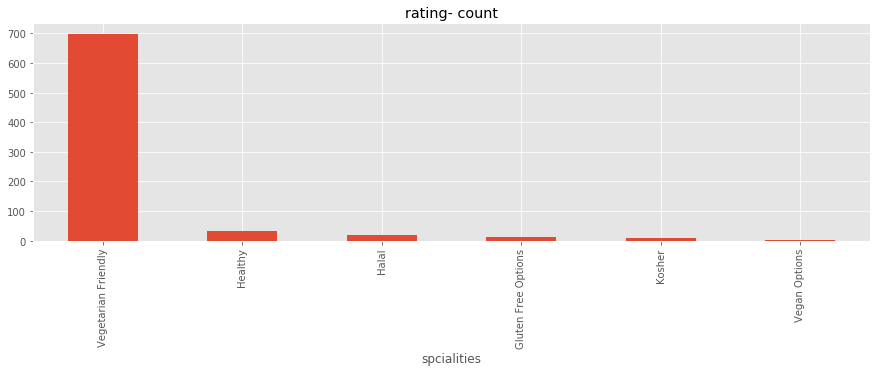

Madrid


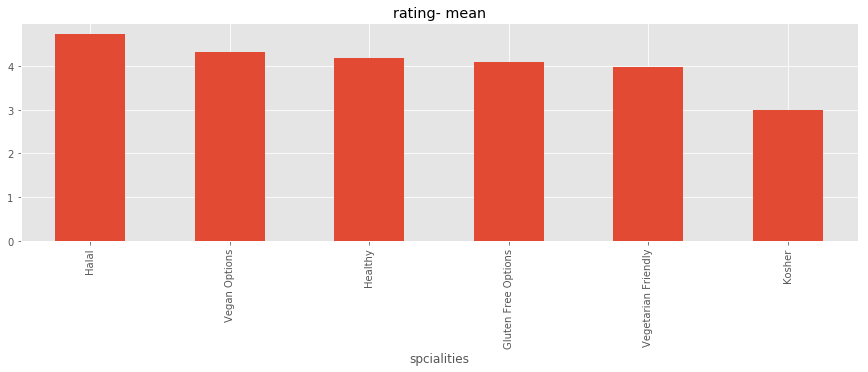

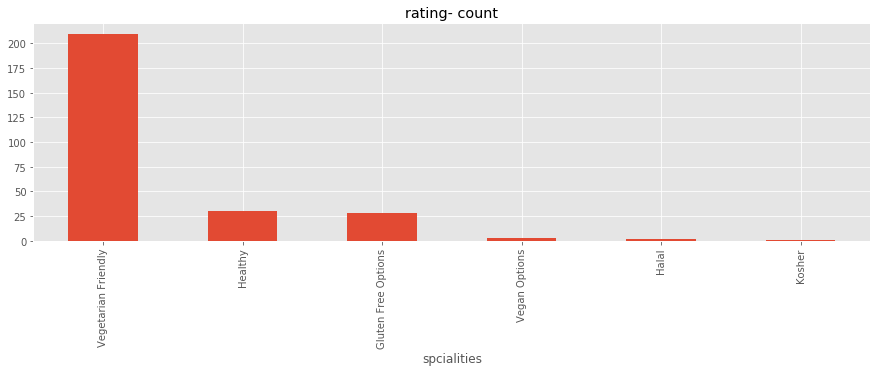

Barcelona


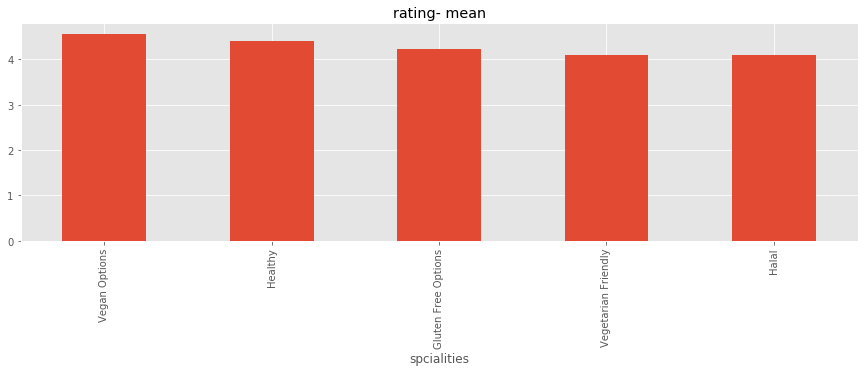

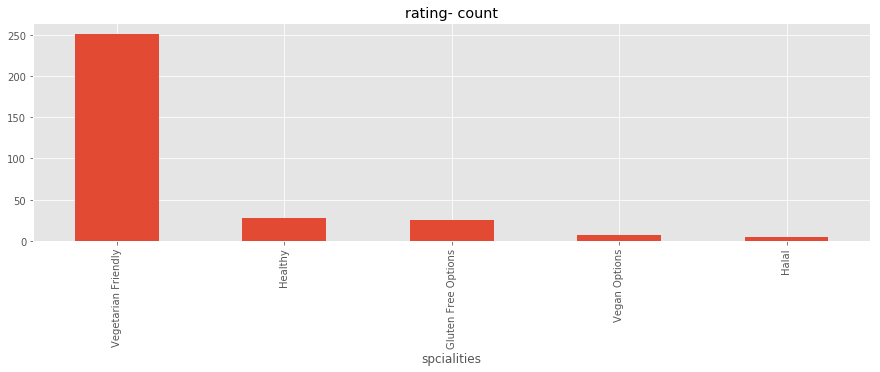

Berlin


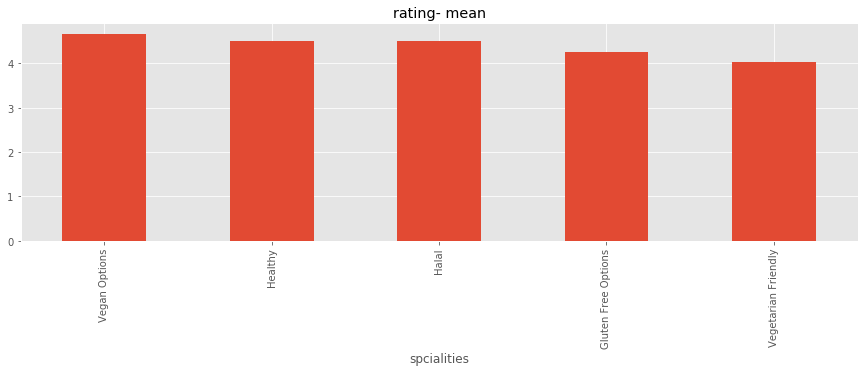

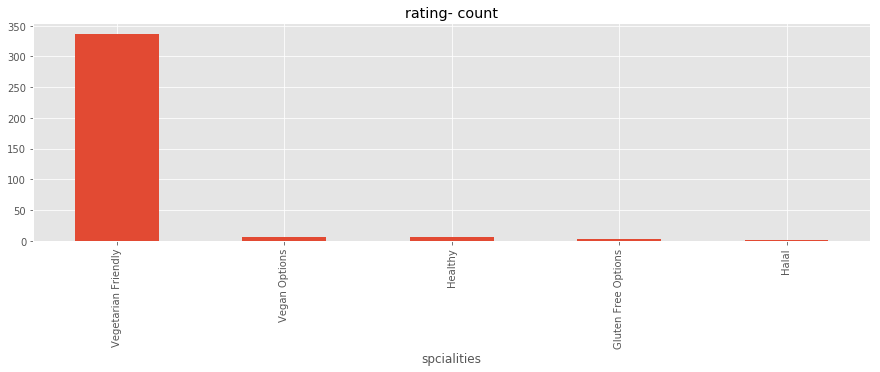

London


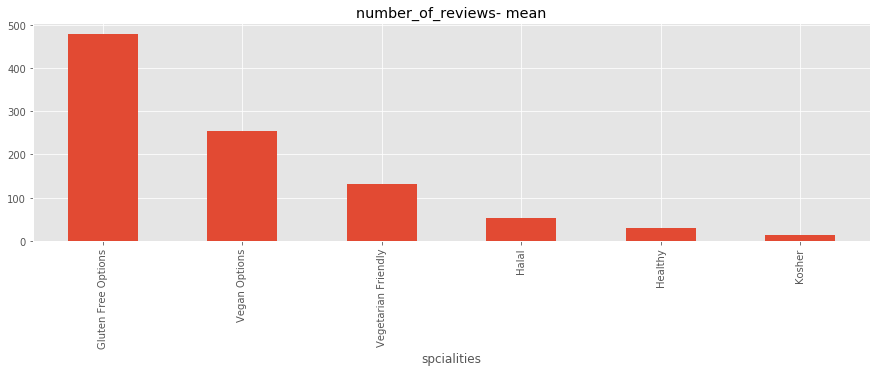

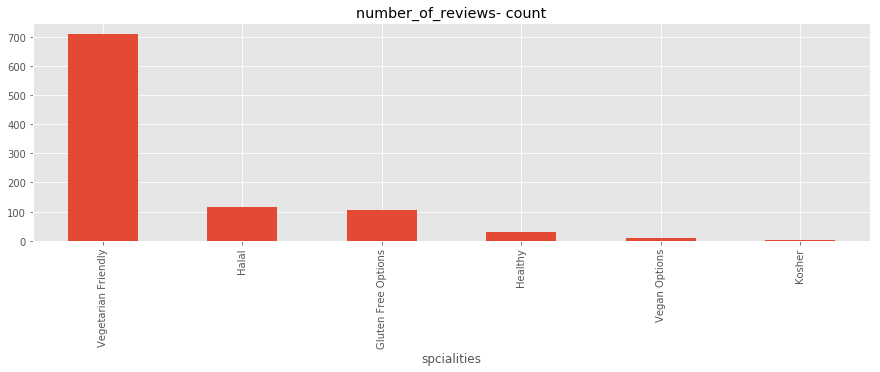

Paris


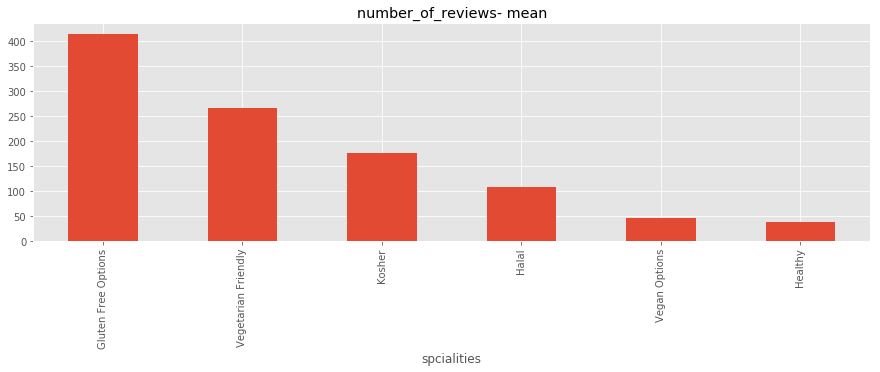

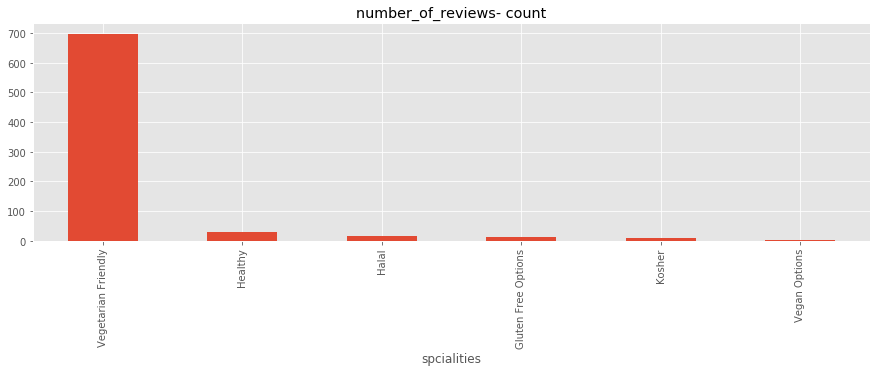

Madrid


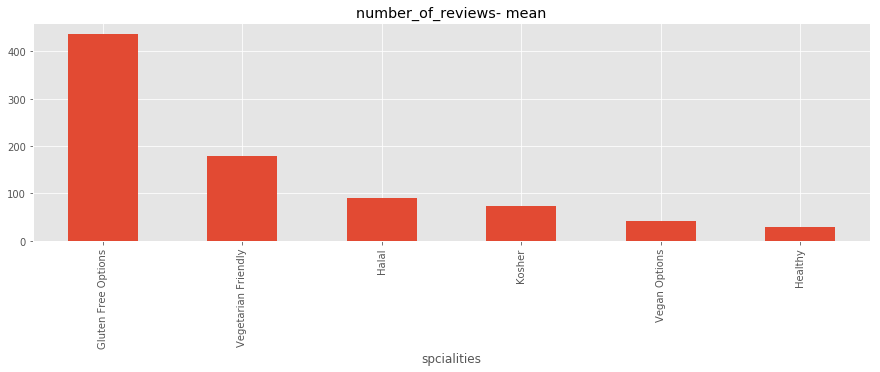

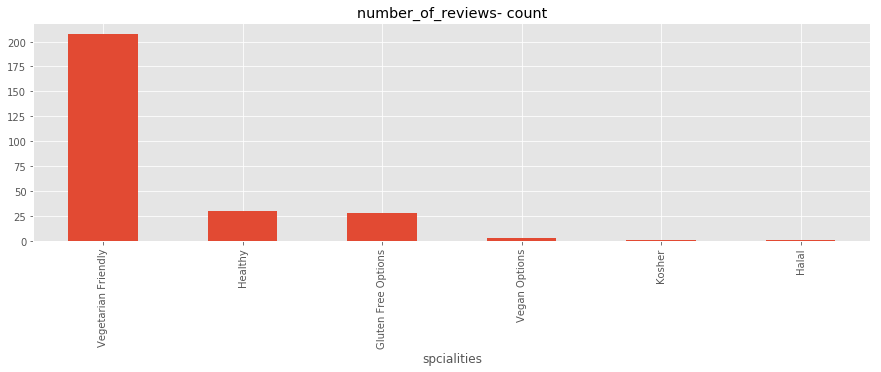

Barcelona


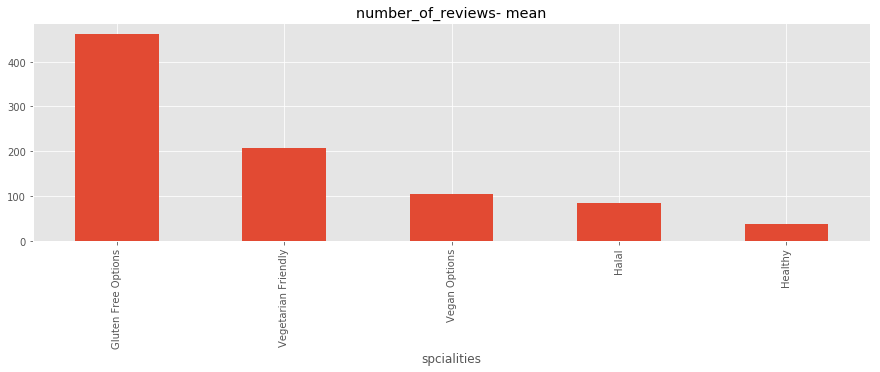

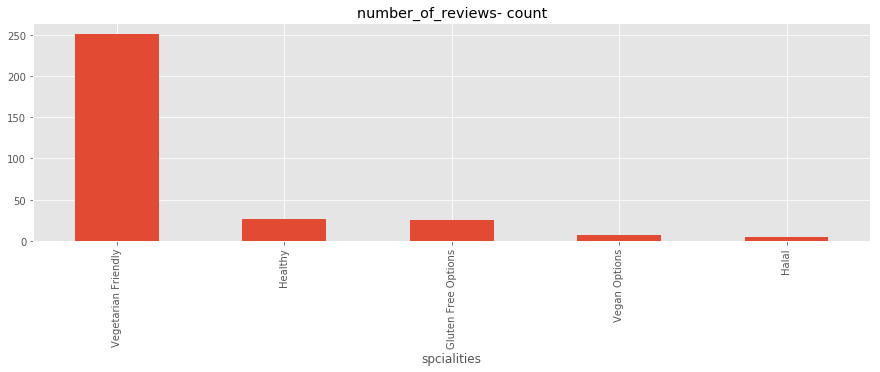

Berlin


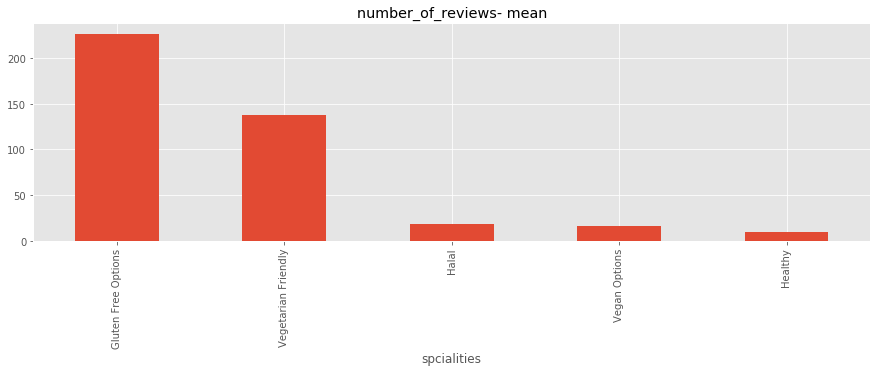

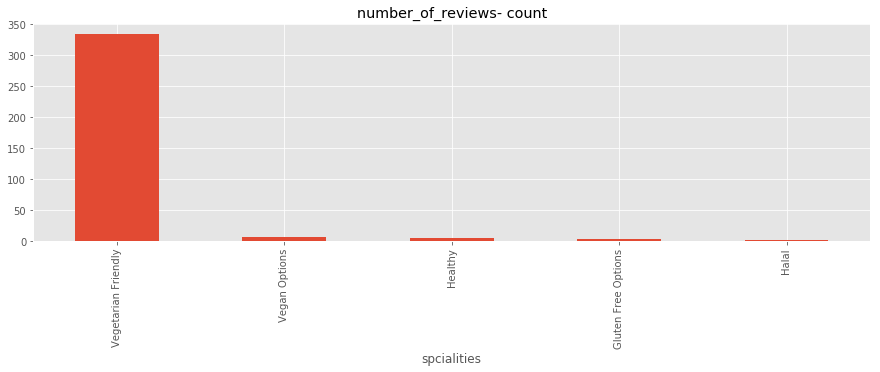

London


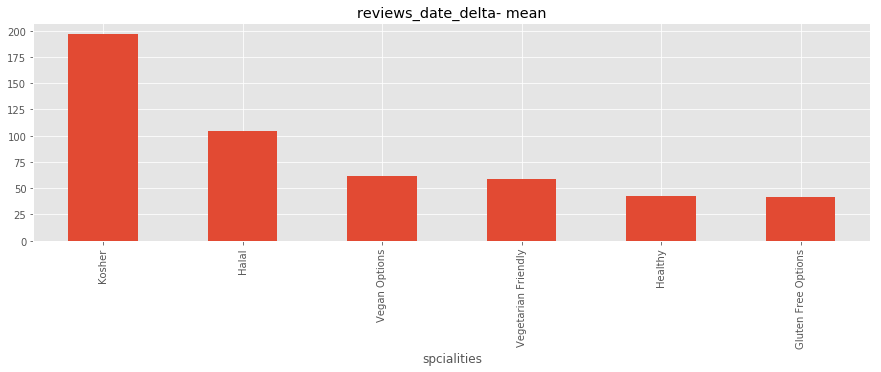

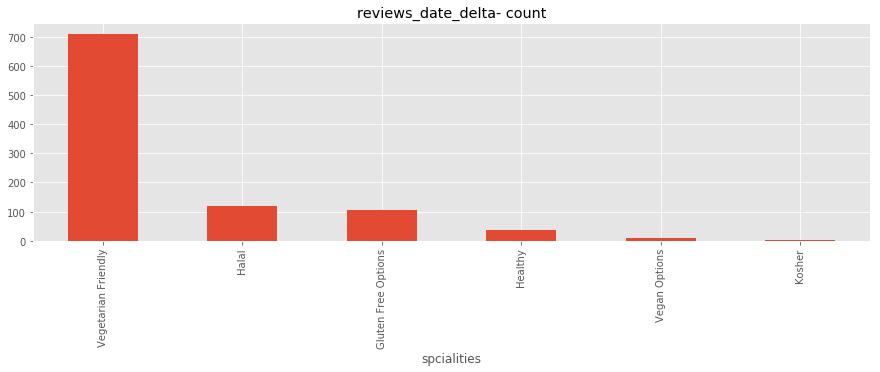

Paris


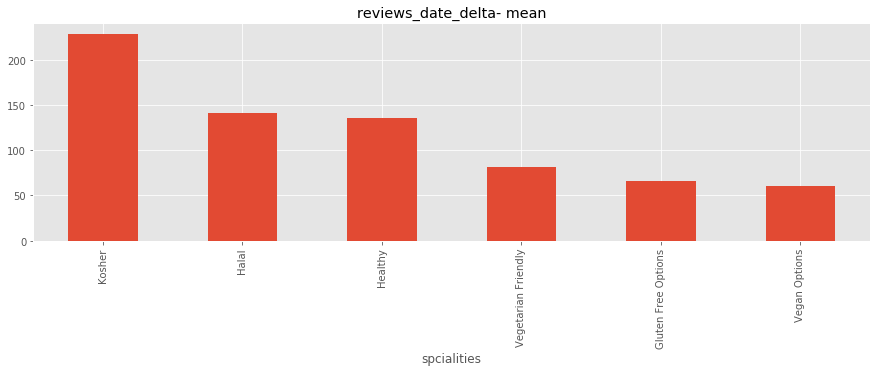

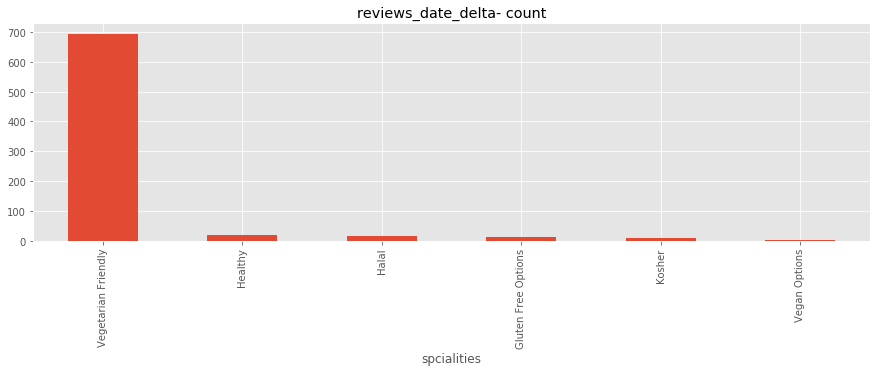

Madrid


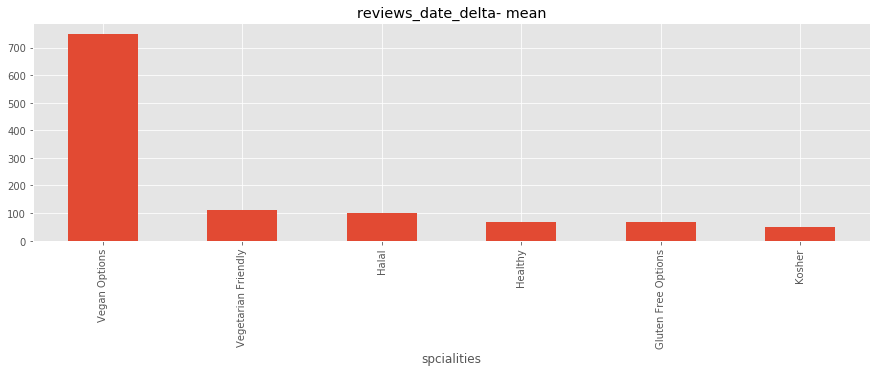

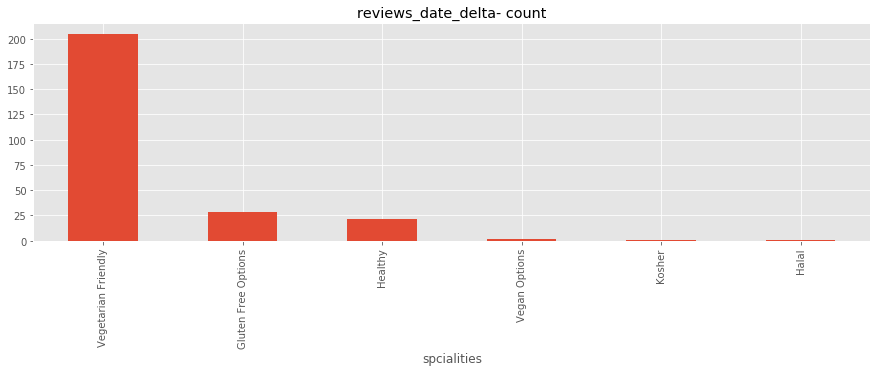

Barcelona


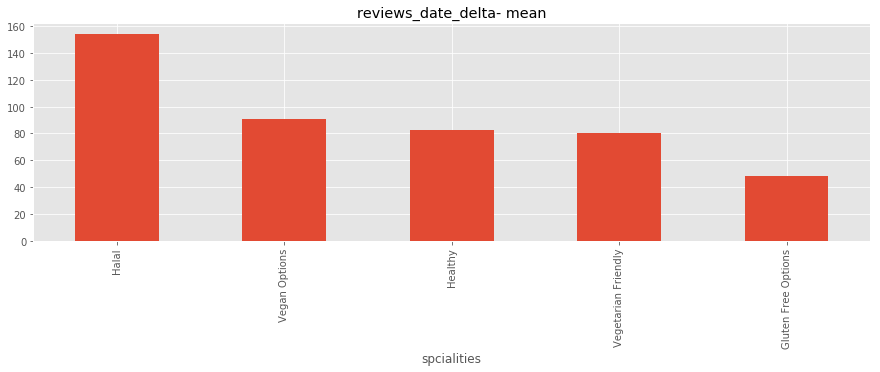

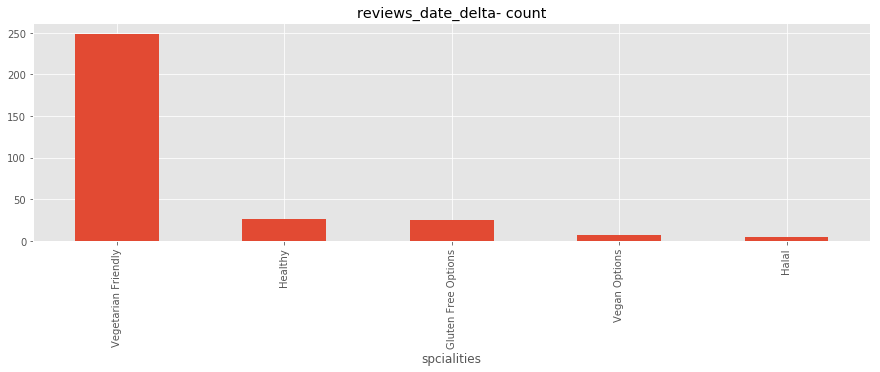

Berlin


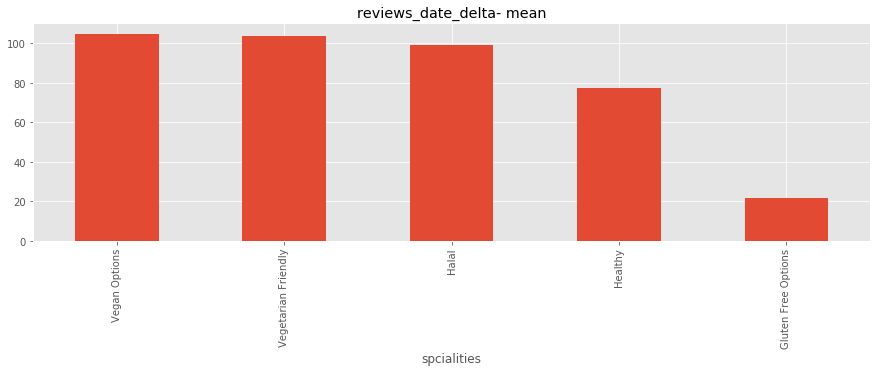

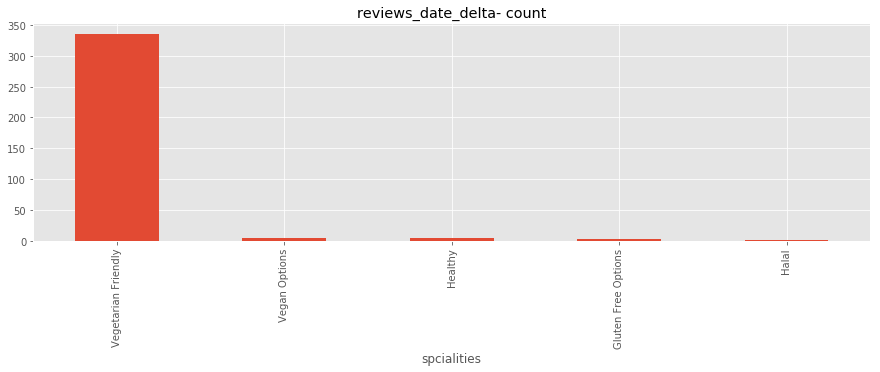

London


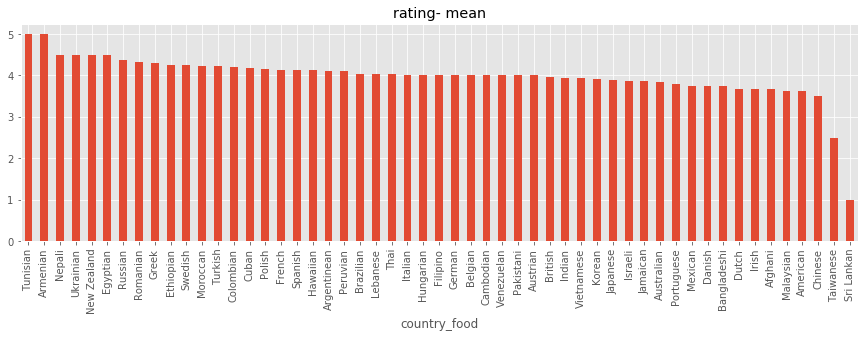

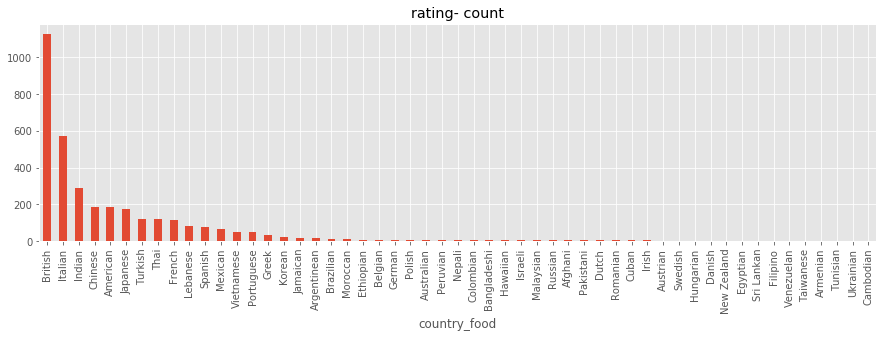

Paris


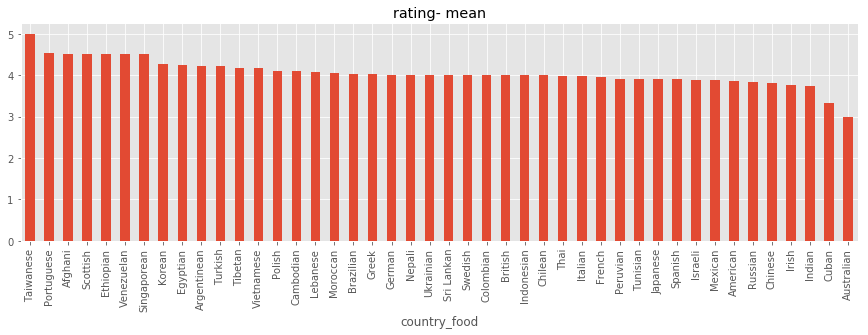

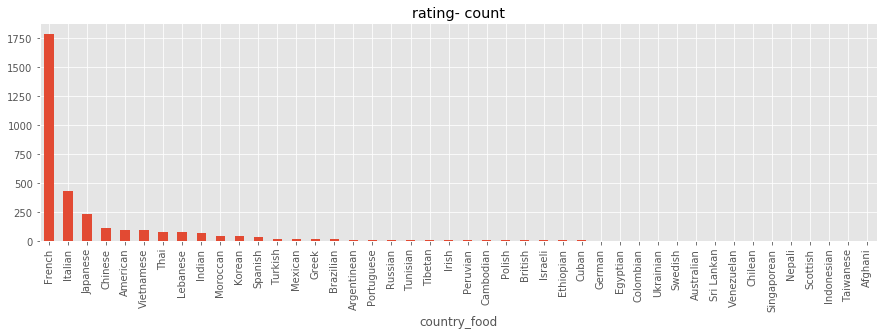

Madrid


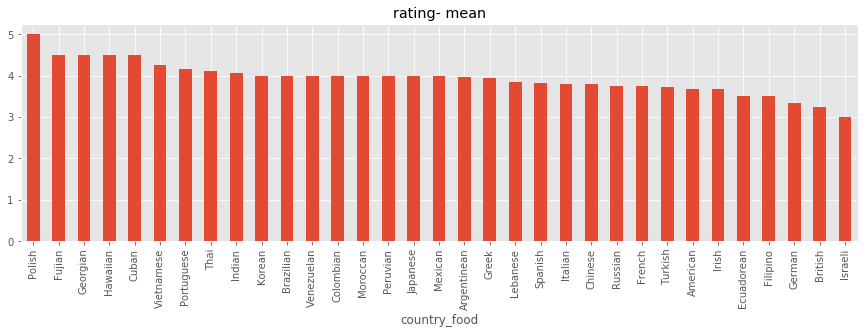

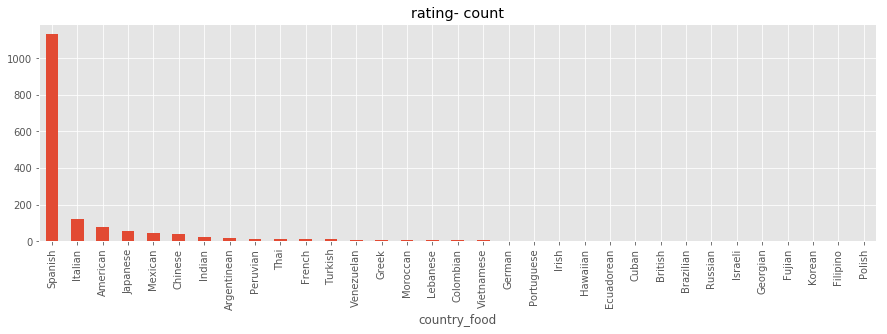

Barcelona


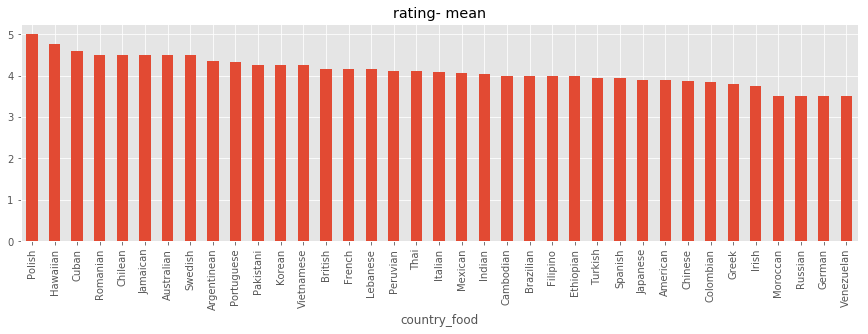

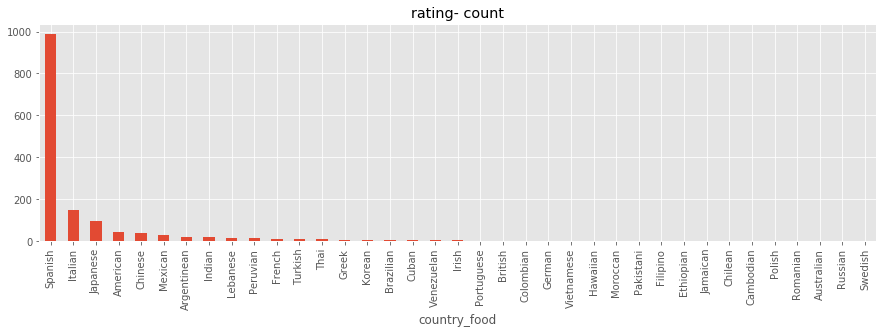

Berlin


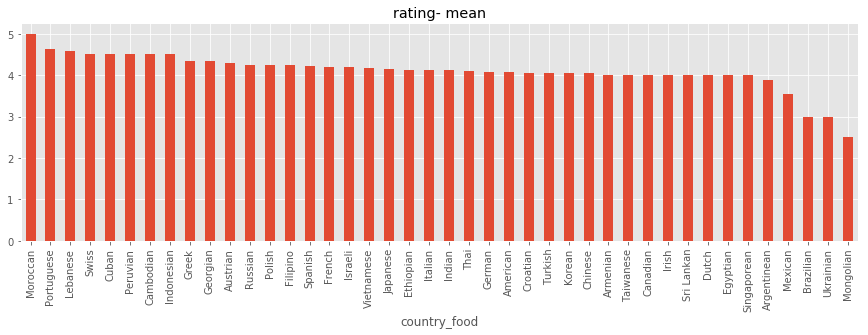

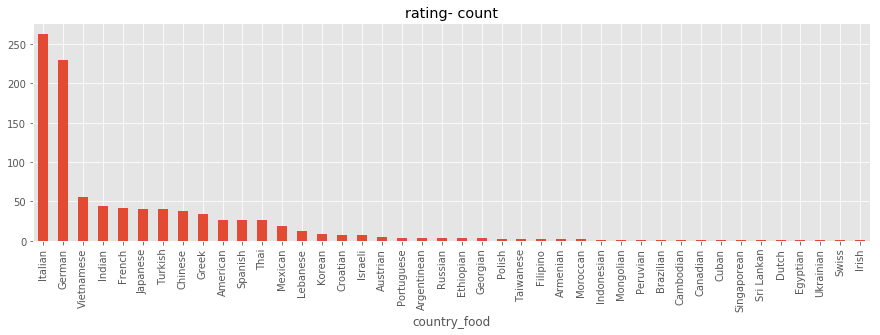

London


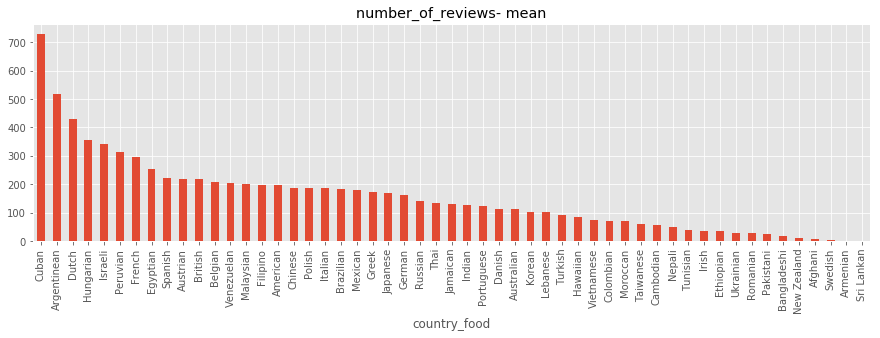

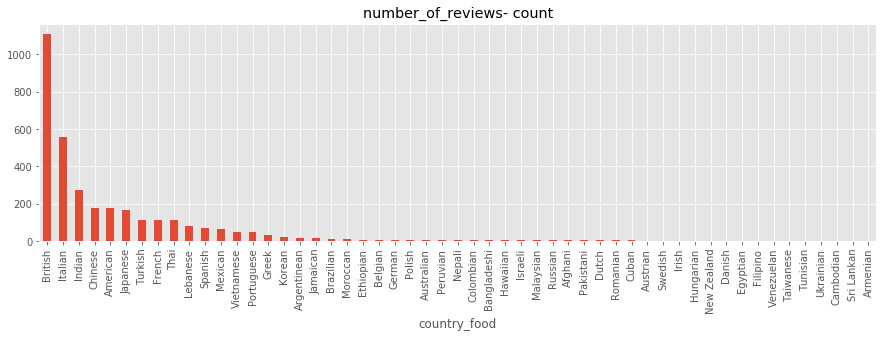

Paris


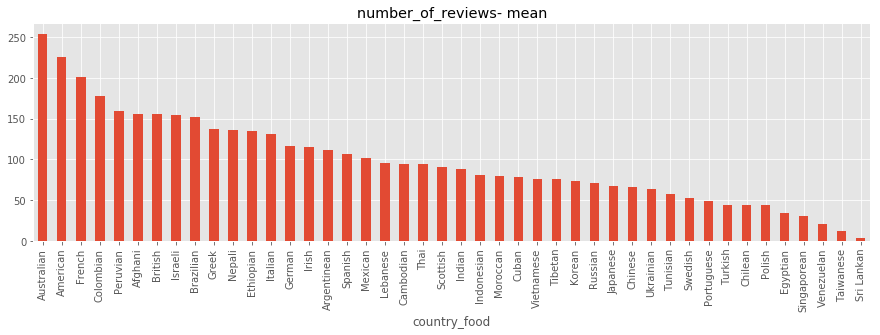

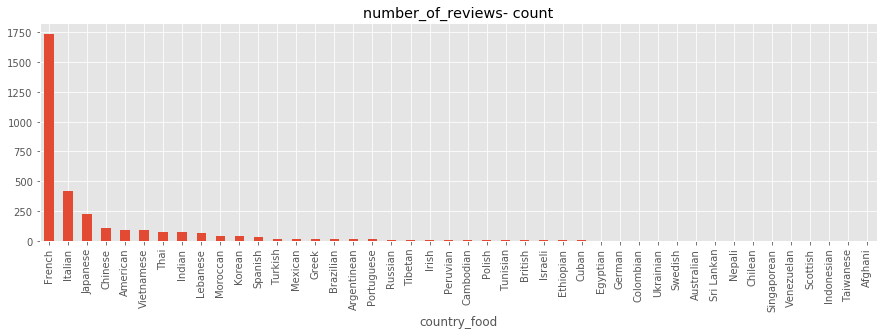

Madrid


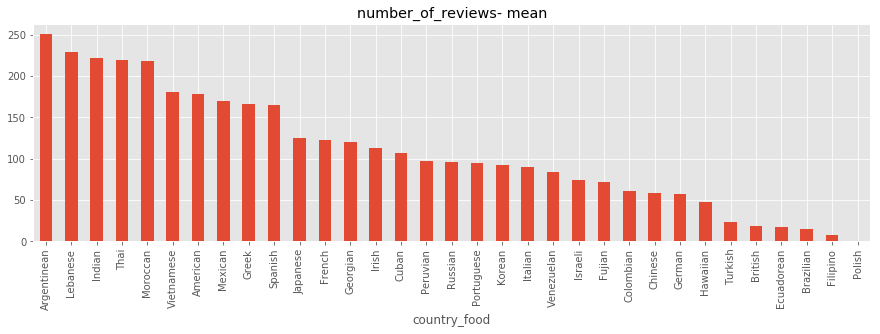

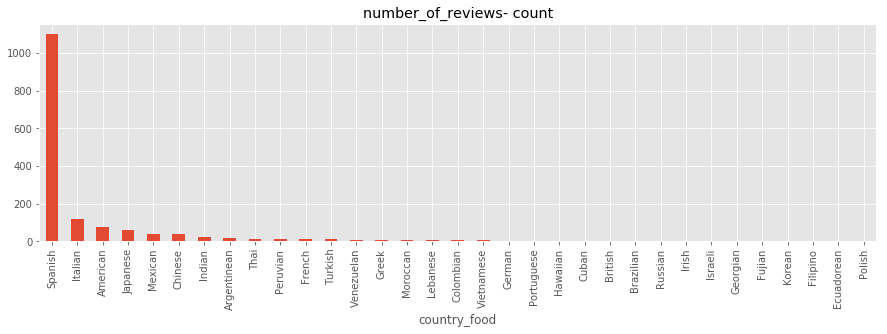

Barcelona


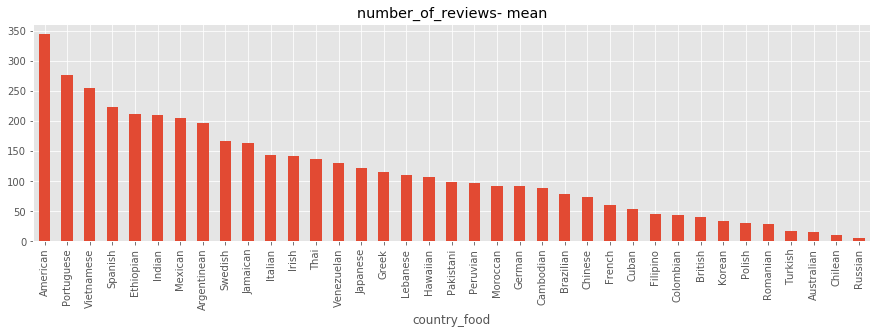

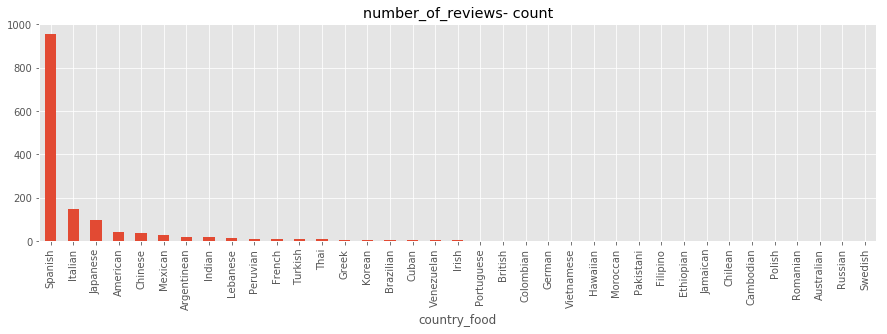

Berlin


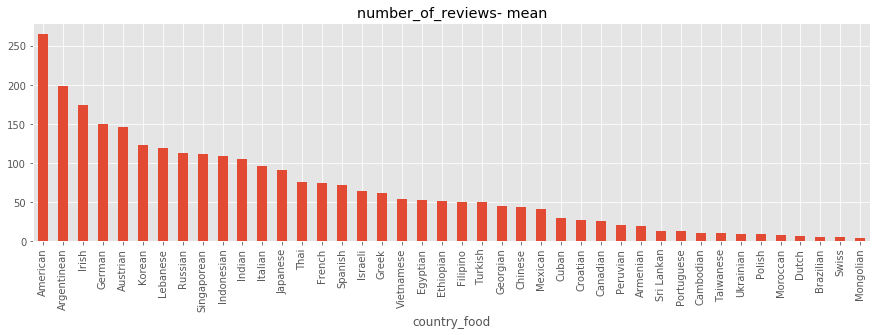

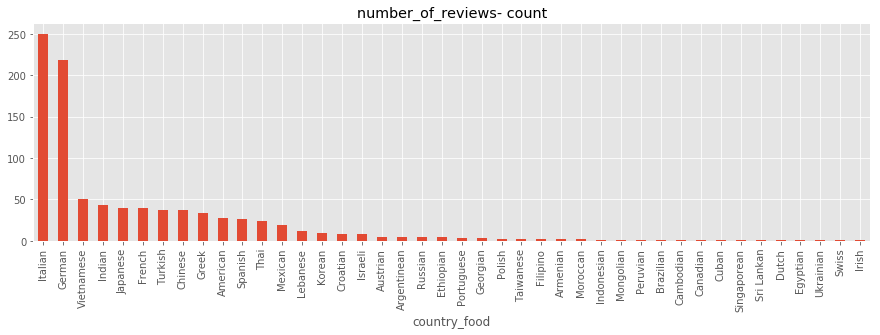

London


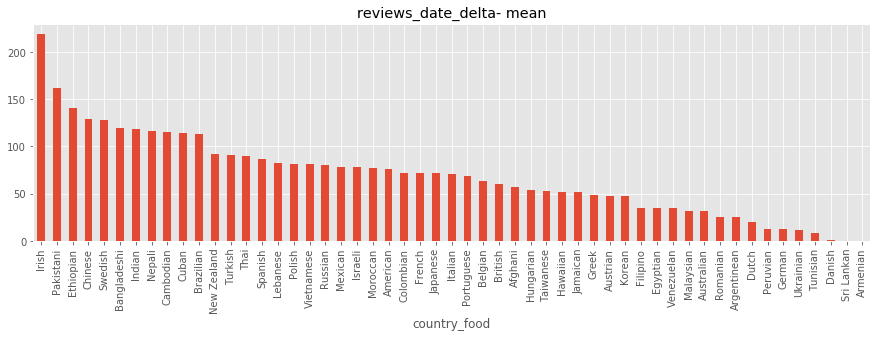

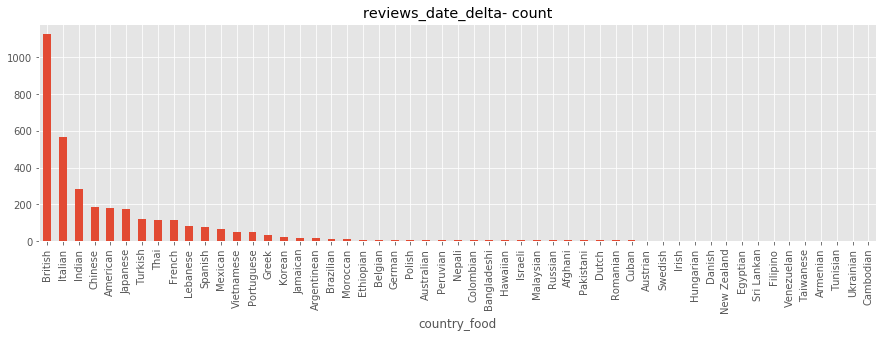

Paris


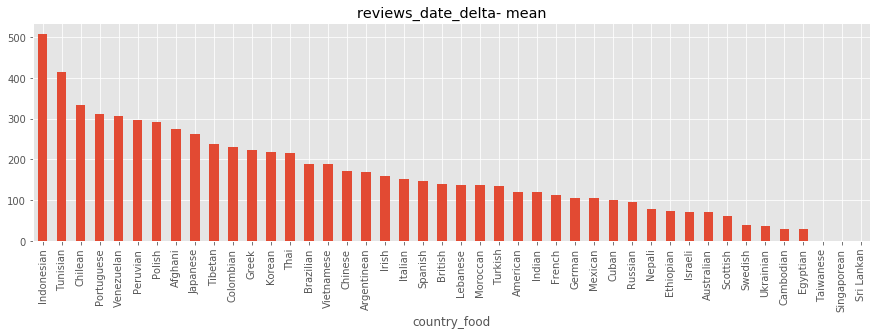

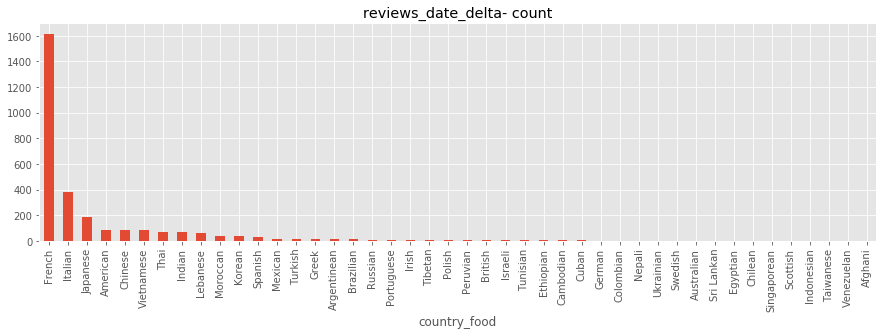

Madrid


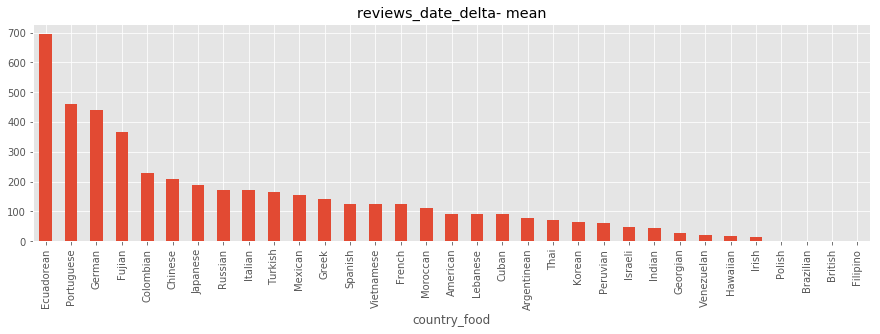

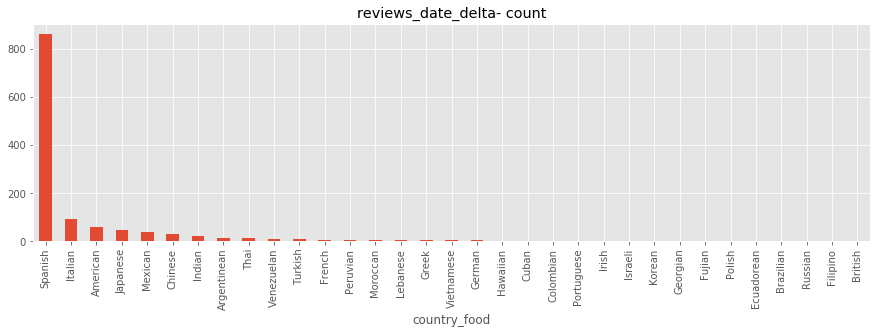

Barcelona


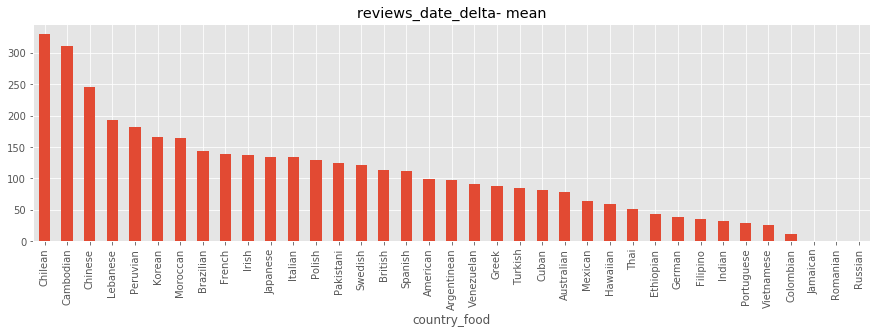

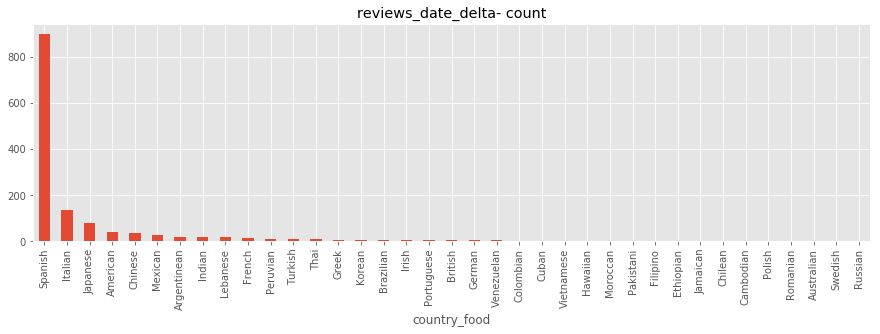

Berlin


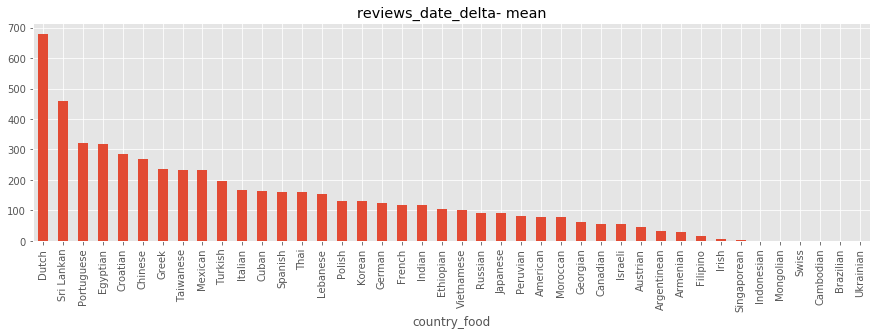

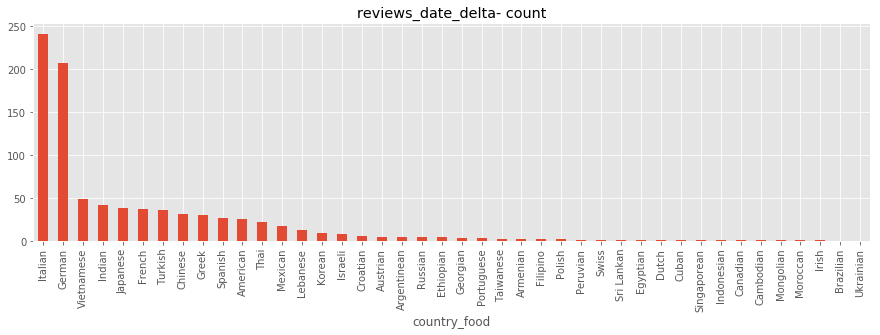

In [132]:
for ind, col in enumerate(['rest_type', 'area_food', 'spcialities', 'country_food']):
    for col_2 in ['rating', 'number_of_reviews', 'reviews_date_delta']:
        for city in data[data['sample']==1]['city'].value_counts().head().index:
            print(city)
            data.loc[(data['sample']==1)&(data['city']==city)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)[col_2].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
            plt.title(str(col_2) + '- mean')
            plt.show()
            data.loc[(data['sample']==1)&(data['city']==city)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)[col_2].count().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
            plt.title(str(col_2) + '- count')
            plt.show()

London


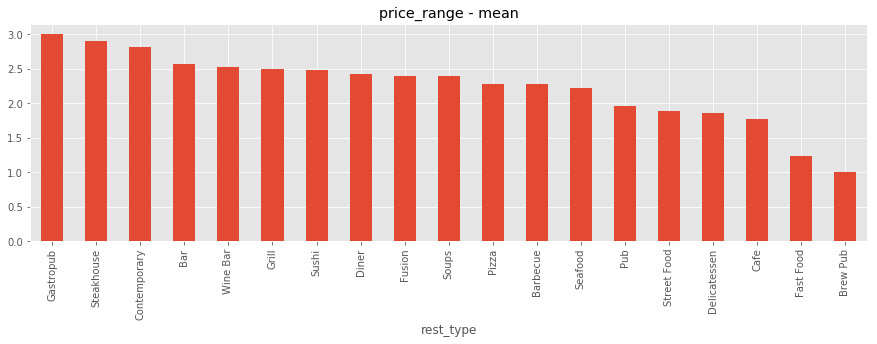

Paris


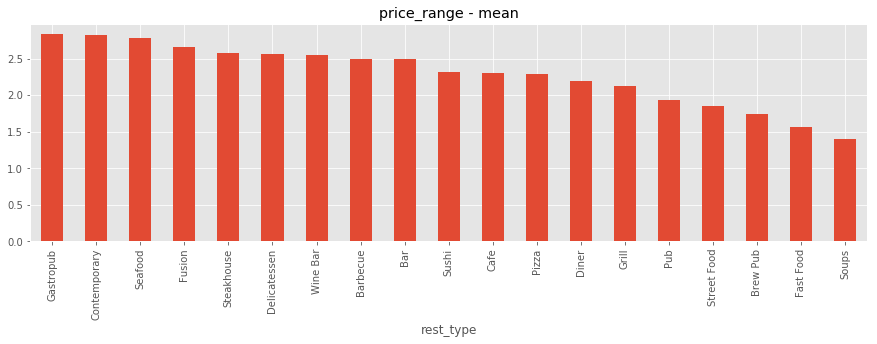

Madrid


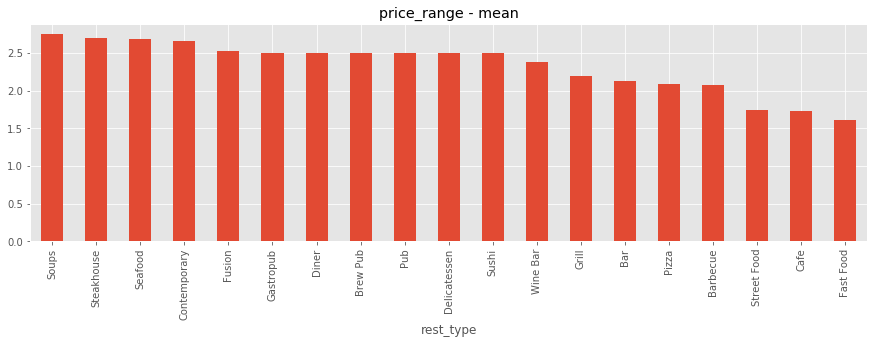

Barcelona


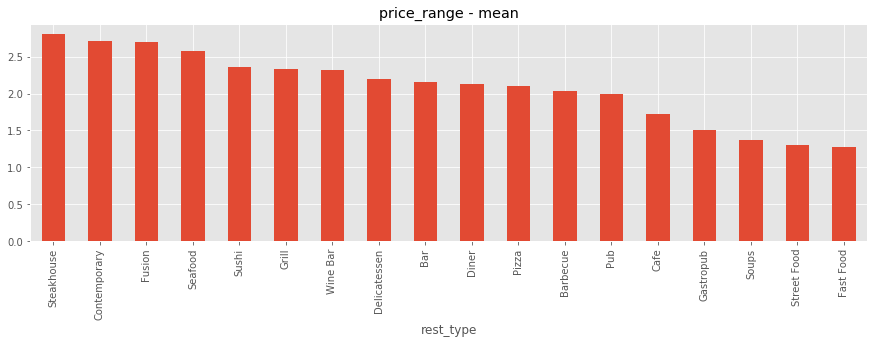

Berlin


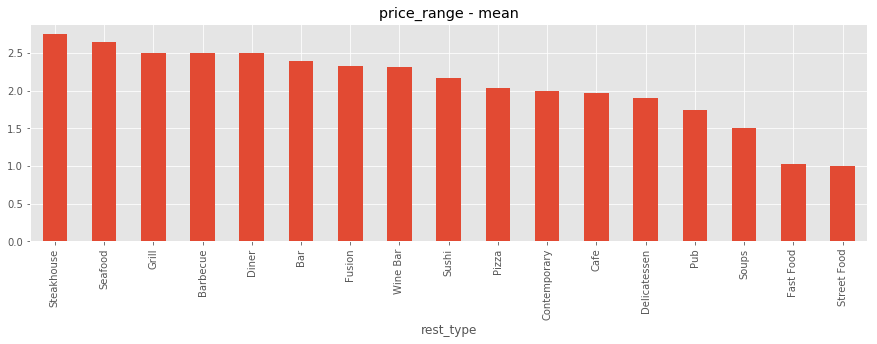

London


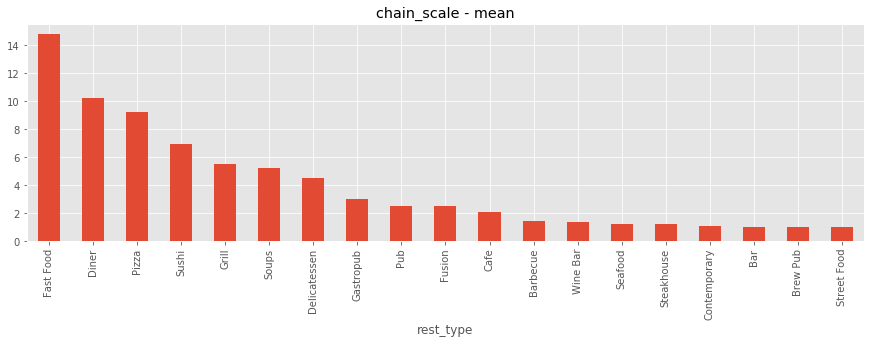

Paris


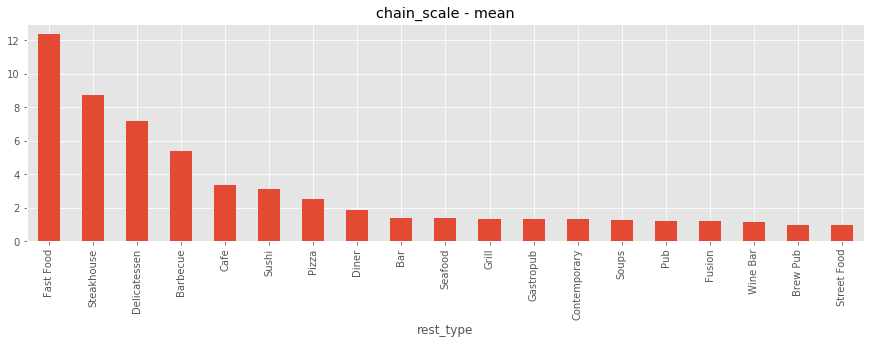

Madrid


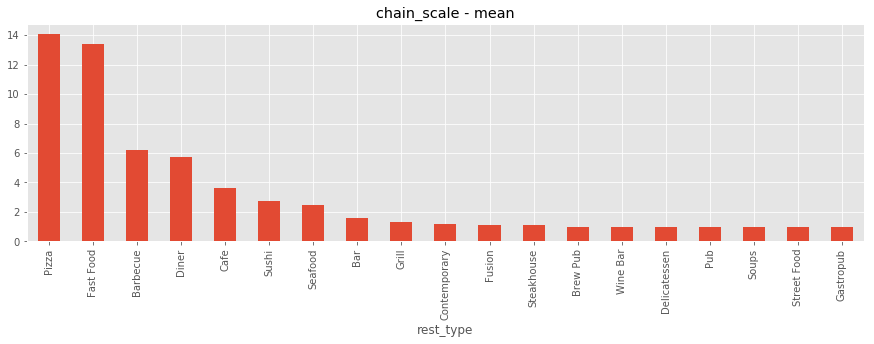

Barcelona


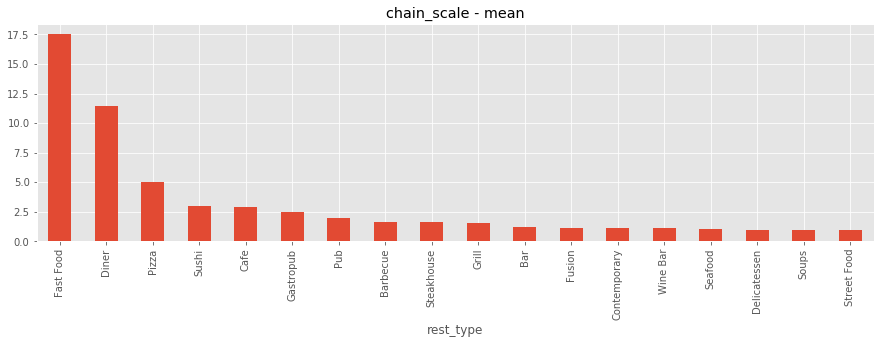

Berlin


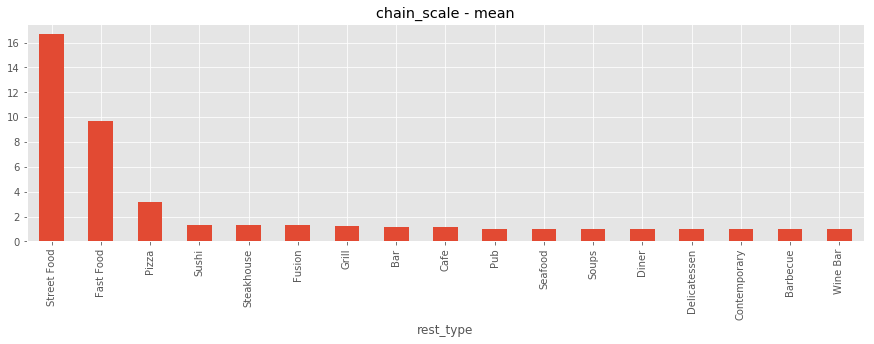

London


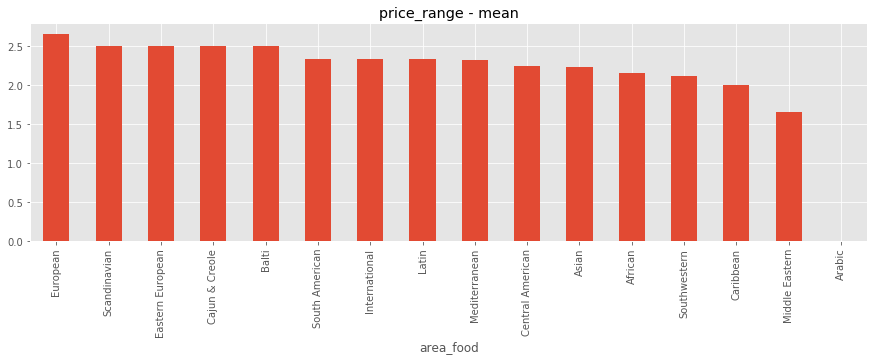

Paris


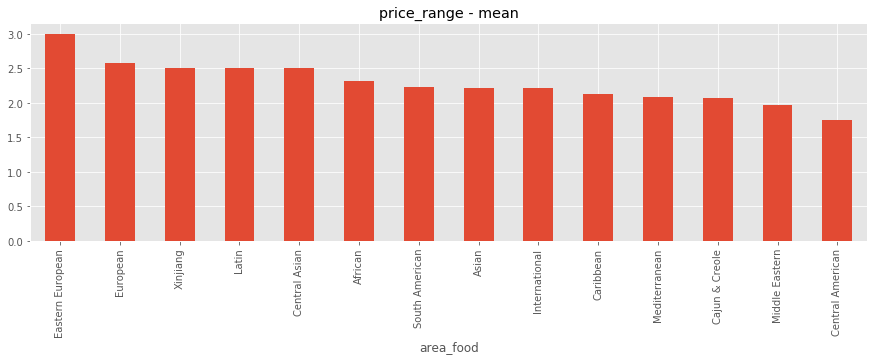

Madrid


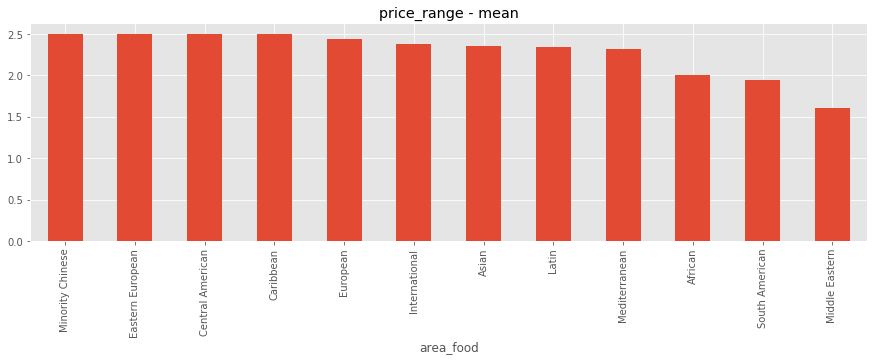

Barcelona


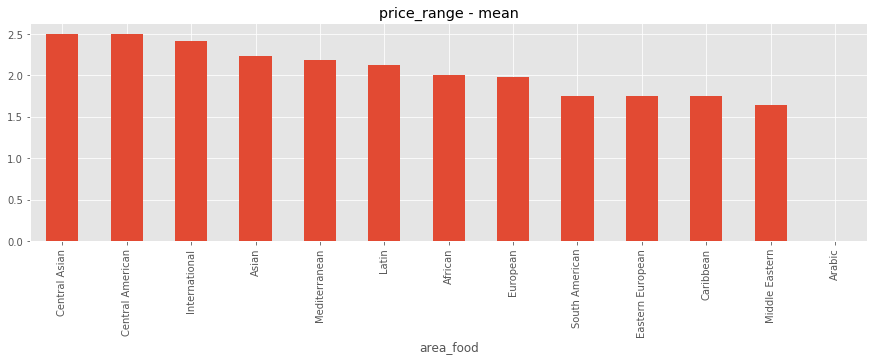

Berlin


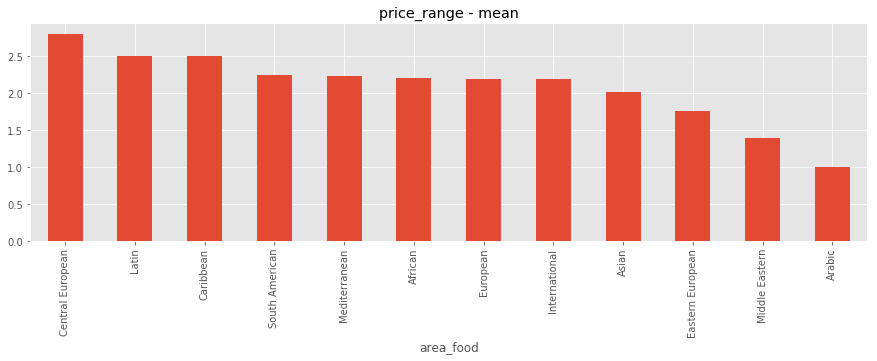

London


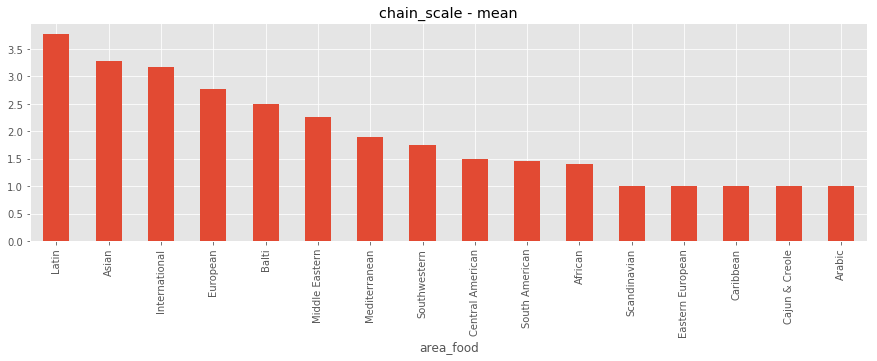

Paris


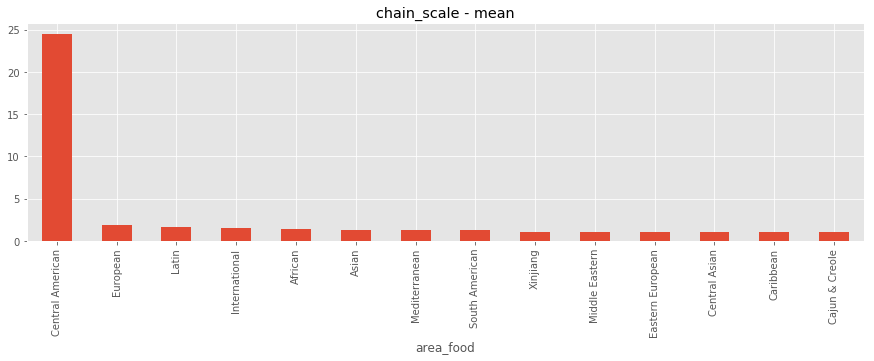

Madrid


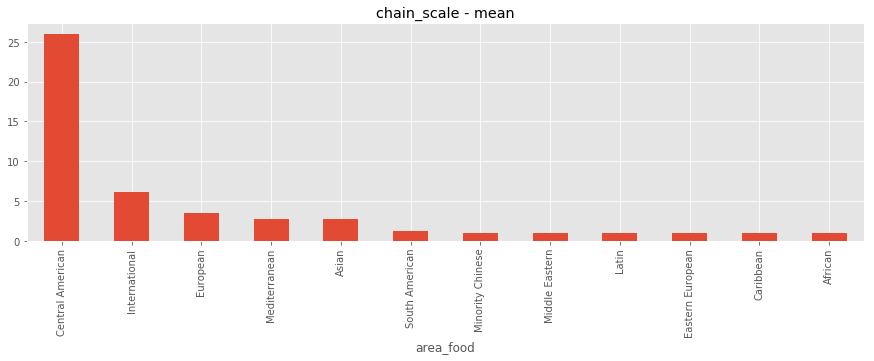

Barcelona


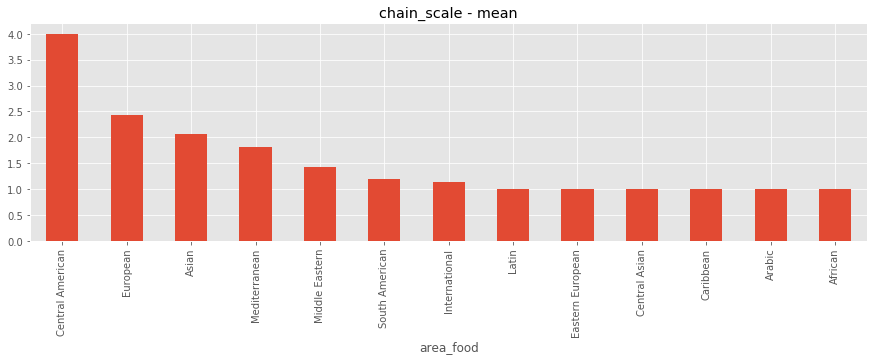

Berlin


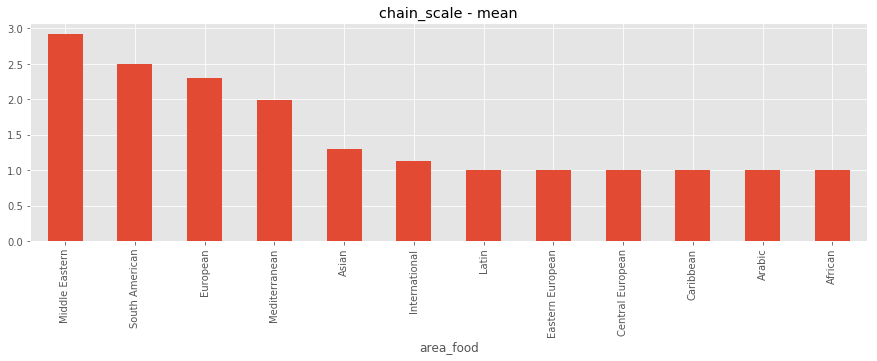

London


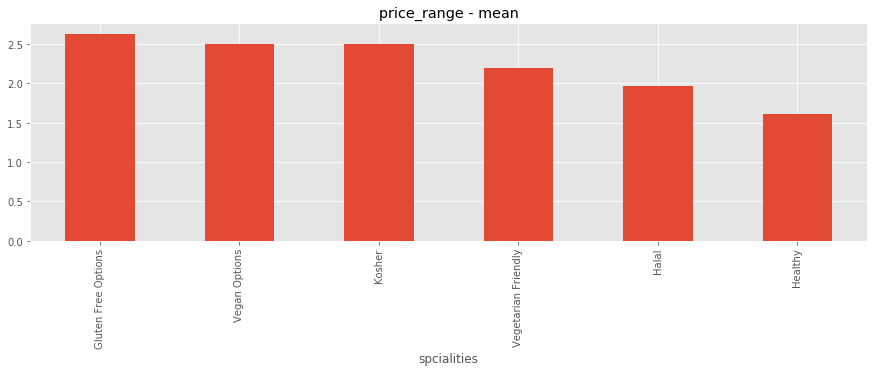

Paris


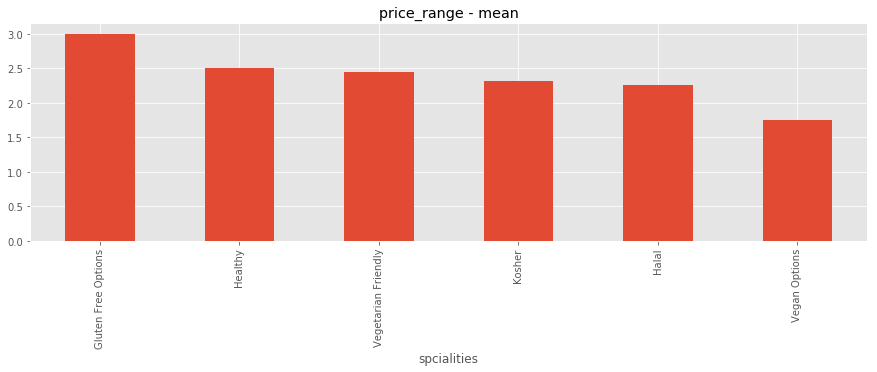

Madrid


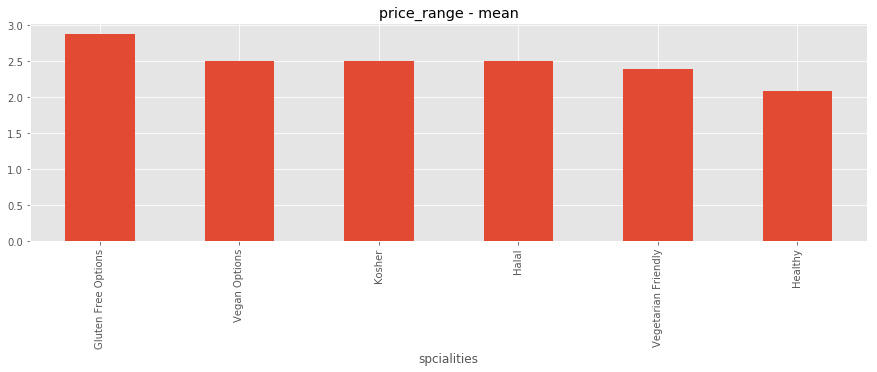

Barcelona


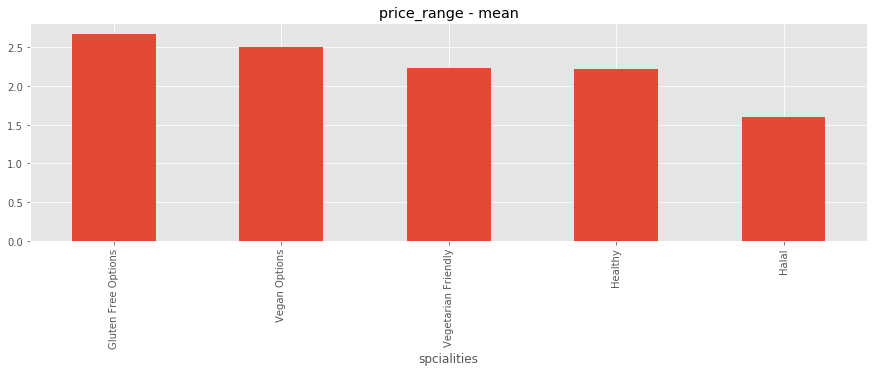

Berlin


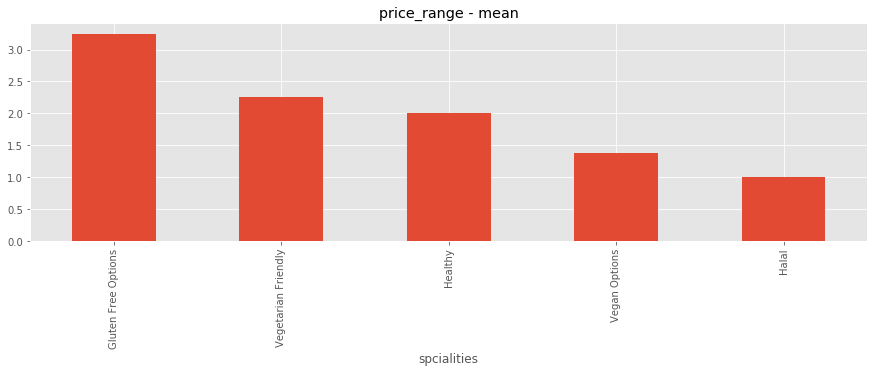

London


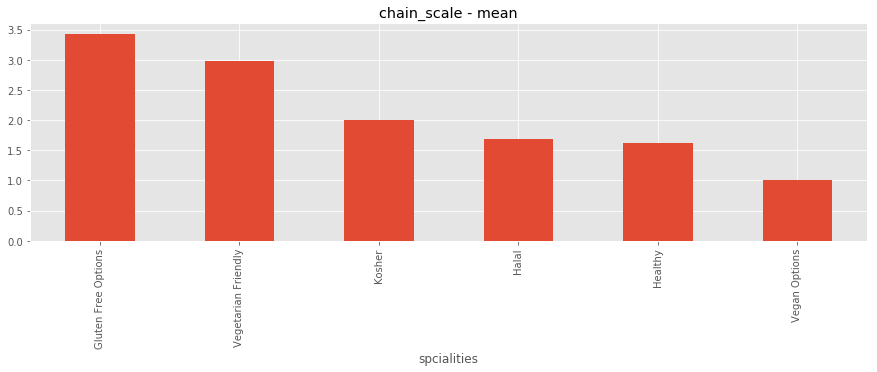

Paris


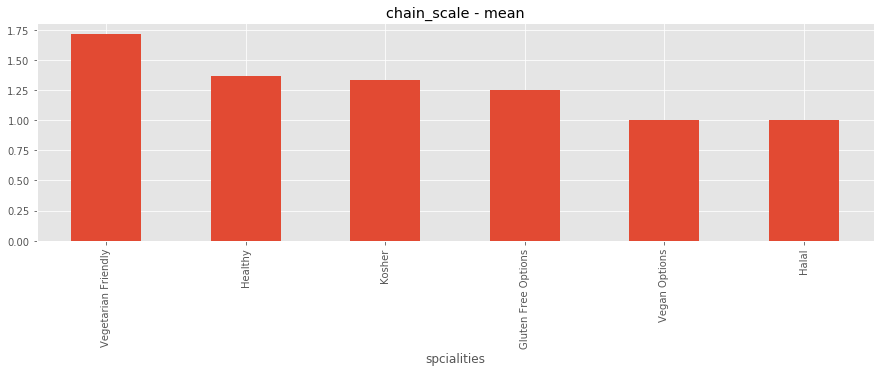

Madrid


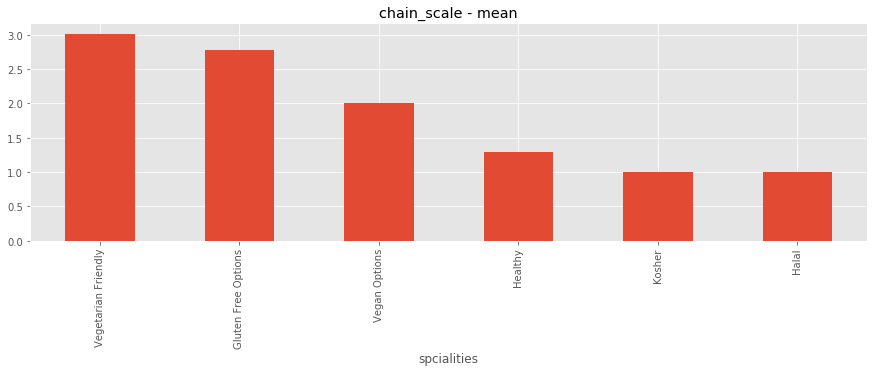

Barcelona


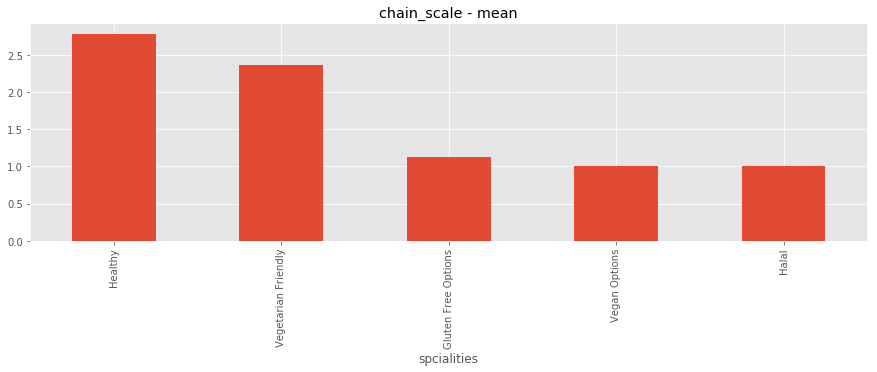

Berlin


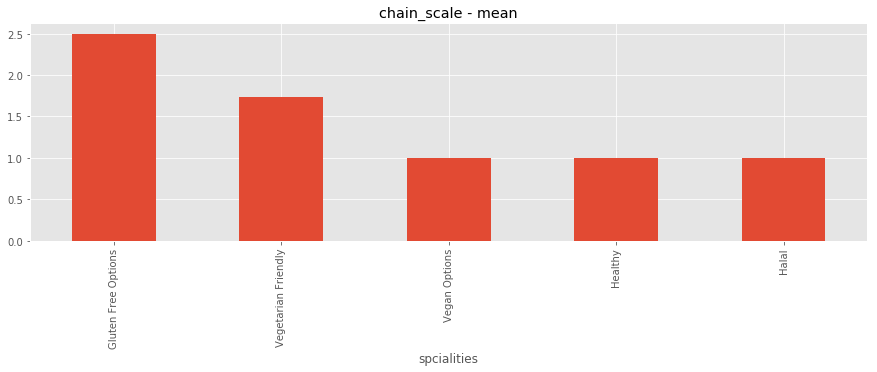

London


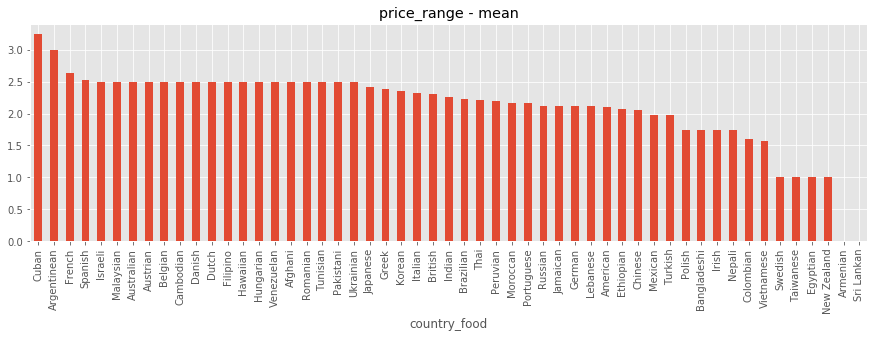

Paris


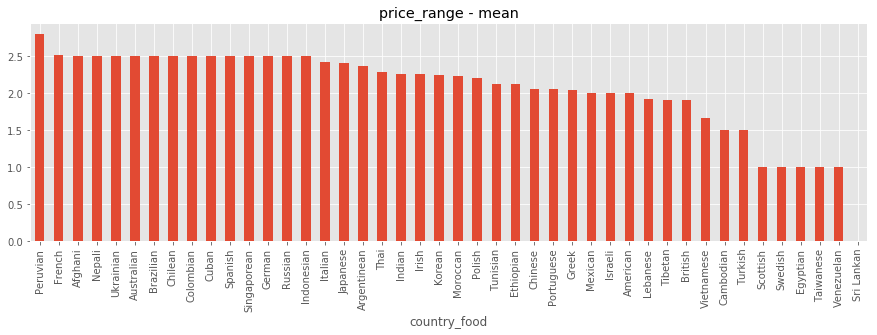

Madrid


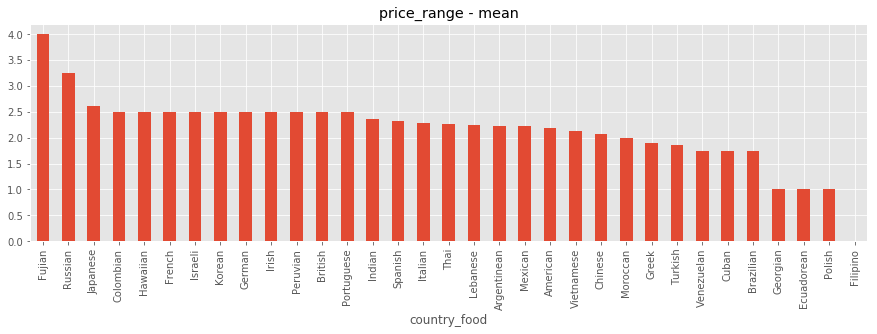

Barcelona


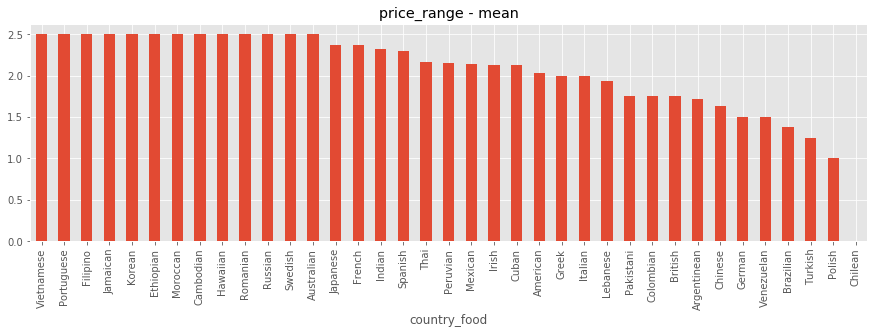

Berlin


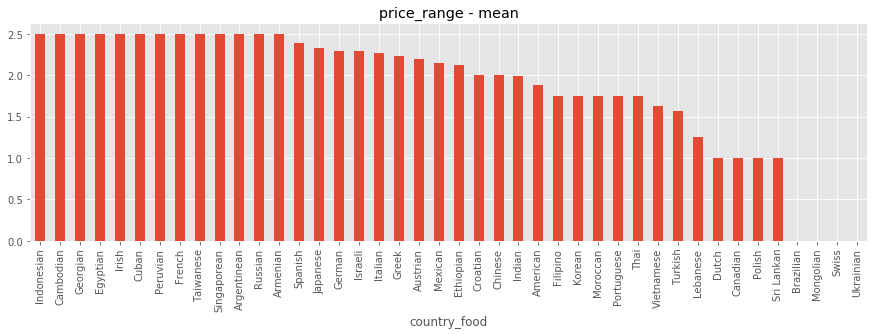

London


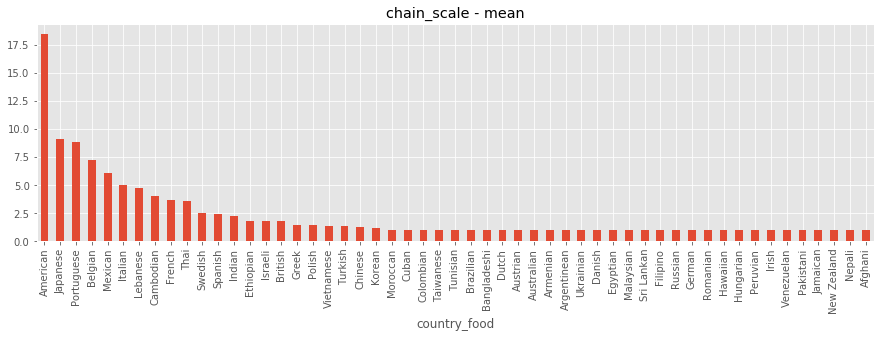

Paris


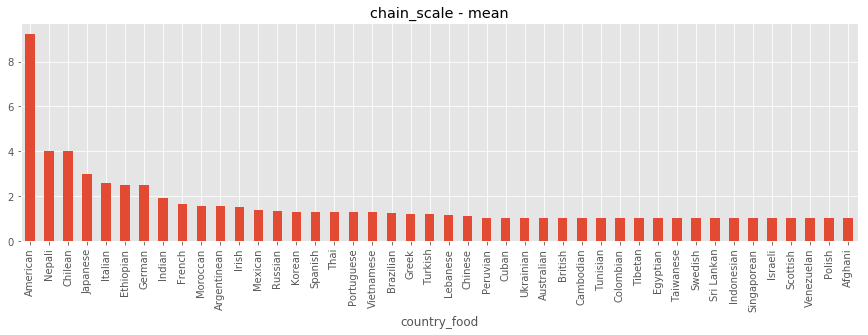

Madrid


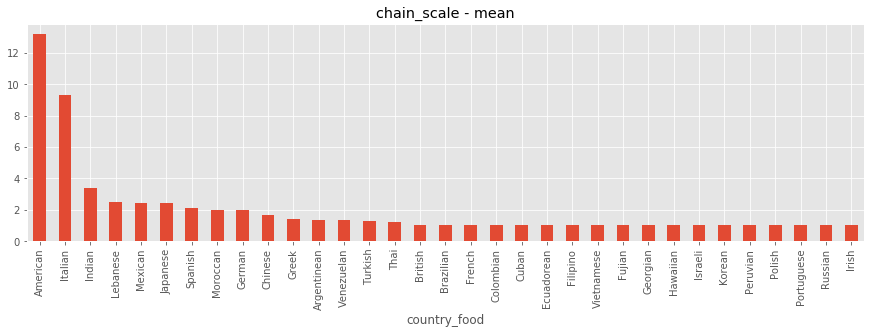

Barcelona


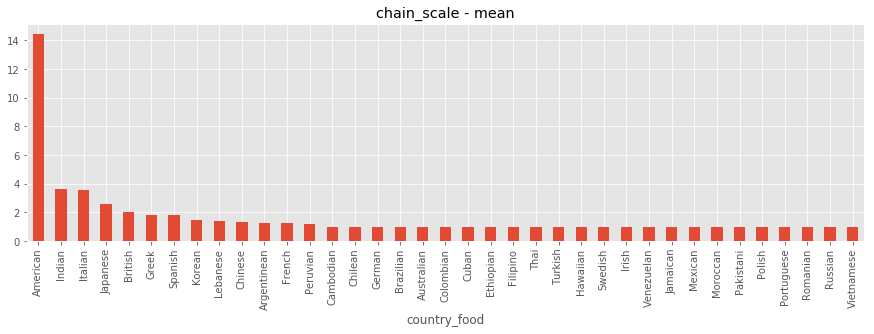

Berlin


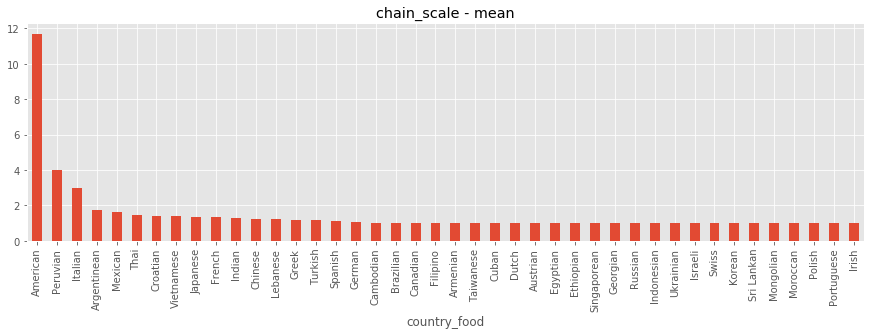

In [133]:
for ind, col in enumerate(['rest_type', 'area_food', 'spcialities', 'country_food']):
    for col_2 in ['price_range', 'chain_scale']:
        for city in data[data['sample']==1]['city'].value_counts().head().index:
            print(city)
            data.loc[(data['sample']==1)&(data['city']==city)&(data[['rest_type_count', 'area_food_count', 'spcialities_count', 'country_food_count'][ind]]==1)].groupby(col)[col_2].mean().sort_values(ascending=False).plot.bar(figsize=(15, 4)) #
            plt.title(str(col_2) + ' - mean')
            plt.show()

By quantity:
- top-3 **rest_type**: Pizza, Cafe, Fast Food
- top-3 **area_food**: European, Mediterranean, Asian
- top-1 **specialities**: Vegetarian Friendly
- top-3 **country_food**: Italian, French, Spanish
- average **rating** is higher where the number of restaurants is less
- average **number_of_reviews** is higher where the number of restaurants is less: Steakhouse, Central American, Gluten Free, New Zealand
- average **price_range** is higher where the number of restaurants is less
- average **chain_scale** is higher where the number of restaurants is less

Top-5 cities:
- London
    - top-3 **rest_type**: Pizza, Cafe, Fast Food
        - highest **rating**: Street Food
        - highest **number_of_reviews**: Steakhouse
        - highest **price_range**: Gastropub
        - highest **chain_scale**: Fast Food, Diner
    - top-3 **area_food**: Asian, European, Mediterranean
        - highest **rating**: Scandinavian
        - highest **number_of_reviews**: Central American
        - highest **price_range**: European
        - highest **chain_scale**: Latin
    - top-1 **spcialities**: Vegetarian Friendly
        - highest **rating**: Healthy
        - highest **number_of_reviews**: Gluten Free
        - highest **price_range**: Gluten Free
        - highest **chain_scale**: Gluten Free
    - top-3 **country_food**: British, Italian, Indian
        - highest **rating**: Tunisian, American (5th)
        - highest **number_of_reviews**: Cuban
        - highest **price_range**: Cuban
        - highest **chain_scale**: American --
- Paris
    - top-3 **rest_type**: Pizza, Sushi, Bar
        - highest **rating**: Fusion, Wine Bar
        - highest **number_of_reviews**: Soups
        - highest **price_range**: Gastropub
        - highest **chain_scale**: Fast Food, Steakhous
    - top-3 **area_food**: Euroepan, Asian, Mediterranean
        - highest **rating**: Eastern European
        - highest **number_of_reviews**: European
        - highest **price_range**: Eastern European
        - highest **chain_scale**: Central American ---
    - top-1 **spcialities**: Vegetarian Friendly
        - highest **rating**: Vegan Options
        - highest **number_of_reviews**: Gluten Free
        - highest **price_range**: Gluten Free
        - highest **chain_scale**: Vegetarian Friendly
    - top-3 **country_food**: French, Italian, Japanese
        - highest **rating**: Tiwanese
        - highest **number_of_reviews**: Australian
        - highest **price_range**: Peruvian
        - highest **chain_scale**: American --
- Madrid
    - top-3 **rest_type**: Pizza, Sushi, Fusion, Bar
        - highest **rating**: Street Food
        - highest **number_of_reviews**: Bar
        - highest **price_range**: Soups
        - highest **chain_scale**: Pizza, Fast Food
    - top-3 **area_food**: Mediterranean, Asian, Euroean
        - highest **rating**: Caribbean
        - highest **number_of_reviews**: Central American
        - highest **price_range**: Minority Chinese
        - highest **chain_scale**: Central American ---
    - top-1 **spcialities**: Vegetarian Friendly
        - highest **rating**: Halal
        - highest **number_of_reviews**: Gluten Free
        - highest **price_range**: Gluten Free
        - highest **chain_scale**: Vegetarian Friendly
    - top-3 **country_food**: Spanish, --- Italian, American
        - highest **rating**: Polish
        - highest **number_of_reviews**: Argentinean
        - highest **price_range**: Fujian
        - highest **chain_scale**: American
- Barcelona
    - top-3 **rest_type**: Pizza, Seafood, Cafe
        - highest **rating**: Street Food
        - highest **number_of_reviews**: Grill
        - highest **price_range**: Steakhous
        - highest **chain_scale**: Fast Food, Diner
    - top-3 **area_food**: Mediterranean, Asian, European
        - highest **rating**: Eastern European
        - highest **number_of_reviews**: Central American
        - highest **price_range**: Central Asian
        - highest **chain_scale**: Central American
    - top-1 **spcialities**: Vegetarian Friendly
        - highest **rating**: Vegan Options
        - highest **number_of_reviews**: Gluten Free
        - highest **price_range**: Gluten Free
        - highest **chain_scale**: Healthy
    - top-3 **country_food**: Spanish, --- Italian, Japanese
        - highest **rating**: Polish
        - highest **number_of_reviews**: American
        - highest **price_range**: Vietnamese
        - highest **chain_scale**: American --
- Berlin
    - top-3 **rest_type**: Pizza, Cafe, Sushi
        - highest **rating**: Steakhouse
        - highest **number_of_reviews**: Bar
        - highest **price_range**: Steakhous
        - highest **chain_scale**: Street Food, Fast Food
    - top-3 **area_food**: Asian, European, Mediterranean
        - highest **rating**: Arabic
        - highest **number_of_reviews**: Central European
        - highest **price_range**: Central European
        - highest **chain_scale**: Middle Eastern
    - top-1 **spcialities**: Vegetarian Friendly
        - highest **rating**: Vegan Options
        - highest **number_of_reviews**: Gluten Free
        - highest **price_range**: Gluten Free
        - highest **chain_scale**: Gluten Free
    - top-3 **country_food**: Italian, German, Vietnamese
        - highest **rating**: Moroccan
        - highest **number_of_reviews**: American
        - highest **price_range**: Indonesian
        - highest **chain_scale**: American --

### Texts

In [134]:
import nltk
from nltk.corpus import stopwords
import re

# count the number of positive and negative words in the reviews

def get_words_list(cell):
    cell_text = ' '.join(cell)
    cell_text_new = re.sub(r'[.,?!:;()=-_\'\"]', '', cell_text)
    cell_words_list = cell_text_new.split(' ')
    cell_words_list = [w.strip() for w in cell_words_list if len(w) > 1 ]
    cell_words_list = [w.strip() for w in cell_words_list if w not in stopwords.words('english')]
    
    return cell_words_list

In [135]:
# collect the entire corpus of reviews
data_text = ' '.join([' '.join(rt) for rt in data['reviews_text'].dropna()])
data_text = data_text.lower()

data_text_new = re.sub(r'[.,?!:;()=-_\'\"]', '', data_text)

# make a list of words and clean it up
words_list = data_text_new.split(' ')

words_list = [w.strip() for w in words_list if len(w) > 1 ]
words_list = [w.strip() for w in words_list if w not in stopwords.words('english')]

In [136]:
# define the parts of speech (just to make it easier to sort through) and make lists of positive and negative words
def get_tags(text):
    tokens = nltk.word_tokenize(text.lower())
    text = nltk.Text(tokens)
    tags = nltk.pos_tag(text)

    return tags


tags = get_tags(' '.join(words_list))
print('tags:', len(tags))

tags_list = [el[1] for el in tags]
print('tags_list:', len(tags_list))
tags_list = list(set(tags_list))
print('tags_list new:', len(tags_list))

tags: 234786
tags_list: 234786
tags_list new: 34


In [137]:
for el in tags:
    if el[1]=='JJR':
        print(el)

('better', 'JJR')
('kosher', 'JJR')
('love', 'JJR')
('better', 'JJR')
('better', 'JJR')
('worse', 'JJR')
('lot', 'JJR')
('better', 'JJR')
('super', 'JJR')
('better', 'JJR')
('better', 'JJR')
('burger', 'JJR')
('less', 'JJR')
('smaller', 'JJR')
('older', 'JJR')
('better', 'JJR')
('better', 'JJR')
('better', 'JJR')
('lobster', 'JJR')
('cheaper', 'JJR')
('better', 'JJR')
('smaller', 'JJR')
('super', 'JJR')
('friendlier', 'JJR')
('look', 'JJR')
('less', 'JJR')
('younger', 'JJR')
('better', 'JJR')
('greater', 'JJR')
('greater', 'JJR')
('hamburger', 'JJR')
('bigger', 'JJR')
('better', 'JJR')
('bigger', 'JJR')
('higher', 'JJR')
('better', 'JJR')
('higher', 'JJR')
('burger', 'JJR')
('better', 'JJR')
('premier', 'JJR')
('cider', 'JJR')
('longer', 'JJR')
('corner', 'JJR')
('character', 'JJR')
('greater', 'JJR')
('worse', 'JJR')
('better', 'JJR')
('cheaper', 'JJR')
('better', 'JJR')
('better', 'JJR')
('lier', 'JJR')
('older', 'JJR')
('better', 'JJR')
('older', 'JJR')
('worse', 'JJR')
('better', '

## FILL NA

In [138]:
pd.DataFrame({'sum': data.isna().sum(),
              '%': data.isna().mean()*100
             })

,sum,%
restaurant_id,0,0.000
city,0,0.000
cuisine_style,11590,23.180
ranking,0,0.000
price_range,17361,34.722
number_of_reviews,3200,6.400
reviews,8114,16.228
url_ta,0,0.000
id_ta,0,0.000
sample,0,0.000


***IMPORTANT!!!*** We count everything according to **train** and transfer it to **test** and only if there is no such combination in **train**, then we count according to **test**

### price_range

In [139]:
data[['price_range', 'number_of_reviews', 'cuisine_style_count', 'chain_scale']].corr()

,price_range,number_of_reviews,cuisine_style_count,chain_scale
price_range,1.000000,0.174354,0.154877,-0.087542
number_of_reviews,0.174354,1.000000,0.359266,-0.024554
cuisine_style_count,0.154877,0.359266,1.000000,-0.045244
chain_scale,-0.087542,-0.024554,-0.045244,1.000000


In [140]:
print('price_range NaNs count:', data['price_range'].isna().sum())
print('number_of_reviews NaNs count:', data['number_of_reviews'].isna().sum())
print('price_range & number_of_reviews NaNs count:', data.loc[(data['price_range'].isna()==True)&(data['number_of_reviews'].isna()==True)].id_ta.count())
print('cuisine_style_count NaNs count:', data['cuisine_style_count'].isna().sum())
print('price_range & cuisine_style_count NaNs count:', data.loc[(data['price_range'].isna()==True)&(data['cuisine_style_count'].isna()==True)].id_ta.count())

price_range NaNs count: 17361
number_of_reviews NaNs count: 3200
price_range & number_of_reviews NaNs count: 2670
cuisine_style_count NaNs count: 11590
price_range & cuisine_style_count NaNs count: 11590


It makes no sense to fill in **price_range** by **number_of_reviews** and **cuisine_style_count**. Take **city** and **chain_scale**.

In [141]:
data[data['name'].isna()==True]['chain_scale']

10770    1
14140    1
15566    1
Name: chain_scale, dtype: int64

In [142]:
def round_to_closest(number, lst=[1.0, 2.5, 4.0]):
    return min(lst, key=lambda x: abs(x - number))

price_range_dict = {}
for city in data.query('sample==1').city.unique():
    price_range_dict.update({city: {'chain_scale': data.loc[(data['sample']==1)&(data['city']==city)].groupby('chain_scale')['price_range'].mean().reset_index().to_dict('index')}})
        
#price_range_dict = data.query('sample==1').groupby(['city', 'chain_scale'])['price_range'].mean().head().reset_index().to_dict('index')
price_range_dict = {k: v['chain_scale'] for k, v in price_range_dict.items()}
price_range_dict = {key: {v['chain_scale']: round_to_closest(v['price_range']) if math.isnan(v['price_range'])==False else np.nan for k, v in price_range_dict[key].items()} for key, value in price_range_dict.items()}

print(len(list(price_range_dict.keys())))
print(price_range_dict['Munich'])
price_range_dict['London'][116]

31
{1: 2.5, 4: 2.5, 48: 2.5, 116: nan}


1.0

In [143]:
data['price_range_old'] = data['price_range']
#data['price_range'] = data['price_range_old']

# 'Paris': {1: 2.5, 4: 2.5, 48: 2.5, 116: 1.0}
data['price_range'] = data.apply(lambda x: price_range_dict[x['city']][x['chain_scale']] if math.isnan(x['price_range_old'])==True else x['price_range'], axis=1)

data[data['price_range_old'].isna()==False]['price_range'].unique()

array([2.5, 4. , 1. ])

In [144]:
print(data[data['price_range_old'].isna()==True]['price_range'].unique())
print(data['price_range'].isna().sum())
data[data['price_range_old'].isna()==True]['price_range'].value_counts()

[2.5 1.  nan]
25


2.5    17149
1.0      187
Name: price_range, dtype: int64

In [145]:
data['price_range'] = data['price_range'].fillna(2.5)

### number_of_reviews

In [146]:
data[['number_of_reviews', 'cuisine_style_count', 'rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 'price_range', 'chain_scale']].corr()

,number_of_reviews,cuisine_style_count,rest_type_count,area_food_count,country_food_count,spcialities_count,price_range,chain_scale
number_of_reviews,1.000000,0.359266,0.055543,0.194038,0.094346,0.385641,0.116812,-0.024554
cuisine_style_count,0.359266,1.000000,0.421914,0.624454,0.373990,0.717145,0.094446,-0.045244
rest_type_count,0.055543,0.421914,1.000000,-0.078419,-0.109251,0.027588,-0.073434,0.039315
area_food_count,0.194038,0.624454,-0.078419,1.000000,0.151960,0.285392,0.144734,-0.082881
country_food_count,0.094346,0.373990,-0.109251,0.151960,1.000000,0.072029,0.036327,-0.050475
spcialities_count,0.385641,0.717145,0.027588,0.285392,0.072029,1.000000,0.094214,-0.018454
price_range,0.116812,0.094446,-0.073434,0.144734,0.036327,0.094214,1.000000,-0.132365
chain_scale,-0.024554,-0.045244,0.039315,-0.082881,-0.050475,-0.018454,-0.132365,1.000000


In [147]:
print('number_of_reviews NaNs count:', data['number_of_reviews'].isna().sum())
print('cuisine_style_count NaNs count:', data['cuisine_style_count'].isna().sum())
print('number_of_reviews & cuisine_style_count NaNs count:', data.loc[(data['number_of_reviews'].isna()==True)&(data['cuisine_style_count'].isna()==True)].id_ta.count())

number_of_reviews NaNs count: 3200
cuisine_style_count NaNs count: 11590
number_of_reviews & cuisine_style_count NaNs count: 1710


The influence of **cuisine_style_count** on **number_of_reviews** is mainly due to **specialities_count**.

To fill in **number_of_reviews**, take **city** and **cuisine_style_count**, we will get the rest by **city** and **price_range**. We will take **median** since this feature has significant outliers.

In [148]:
num_rev_cuisine_dict = {}
for city in data.query('sample==1').city.unique():
    num_rev_cuisine_dict.update({city: {'cuisine_style_count': data.loc[(data['sample']==1)&(data['city']==city)&(data['cuisine_style_count'].isna()==False)].groupby('cuisine_style_count')['number_of_reviews'].median().reset_index().to_dict('index')}})
        
num_rev_cuisine_dict = {k: v['cuisine_style_count'] for k, v in num_rev_cuisine_dict.items()}
num_rev_cuisine_dict = {key: {v['cuisine_style_count']: v['number_of_reviews'] if math.isnan(v['number_of_reviews'])==False else np.nan for k, v in num_rev_cuisine_dict[key].items()} for key, value in num_rev_cuisine_dict.items()}

print(len(list(num_rev_cuisine_dict.keys())))
print(num_rev_cuisine_dict['Munich'])
num_rev_cuisine_dict['London'][5]

31
{1.0: 16.0, 2.0: 28.0, 3.0: 59.0, 4.0: 81.0, 5.0: 118.5, 6.0: 100.0, 7.0: 168.0, 8.0: 908.0}


148.5

In [149]:
num_rev_price_dict = {}
for city in data.query('sample==1').city.unique():
    num_rev_price_dict.update({city: {'price_range': data.loc[(data['sample']==1)&(data['city']==city)].groupby('price_range')['number_of_reviews'].median().reset_index().to_dict('index')}})
        
num_rev_price_dict = {k: v['price_range'] for k, v in num_rev_price_dict.items()}
num_rev_price_dict = {key: {v['price_range']: v['number_of_reviews'] if math.isnan(v['number_of_reviews'])==False else np.nan for k, v in num_rev_price_dict[key].items()} for key, value in num_rev_price_dict.items()}

print(len(list(num_rev_price_dict.keys())))
print(num_rev_price_dict['Munich'])
num_rev_price_dict['London'][4.0]

31
{1.0: 25.0, 2.5: 27.0, 4.0: 136.0}


285.0

In [150]:
data['number_of_reviews_old'] = data['number_of_reviews']
#data['number_of_reviews'] = data['number_of_reviews_old']

data['number_of_reviews'] = data.apply(lambda x: num_rev_cuisine_dict[x['city']][x['cuisine_style_count']] if math.isnan(x['number_of_reviews_old'])==True and math.isnan(x['cuisine_style_count'])==False else x['number_of_reviews'], axis=1)
data['number_of_reviews'] = data.apply(lambda x: num_rev_price_dict[x['city']][x['price_range']] if math.isnan(x['number_of_reviews'])==True else x['number_of_reviews'], axis=1)

data[['number_of_reviews_old', 'number_of_reviews']].isna().sum()

number_of_reviews_old    3200
number_of_reviews           0
dtype: int64

### cuisine_style

In [151]:
data[data['cuisine_style'].isna()==True]['chain'].value_counts()

0    10439
1     1151
Name: chain, dtype: int64

In [152]:
data[data['cuisine_style'].isna()==True]['city'].value_counts()

Paris         1308
London        1210
Madrid        1179
Berlin         912
Barcelona      787
Milan          708
Hamburg        520
Vienna         402
Lisbon         399
Lyon           379
Munich         329
Brussels       322
Rome           319
Stockholm      310
Prague         307
Warsaw         254
Copenhagen     203
Budapest       202
Amsterdam      202
Zurich         157
Oporto         150
Athens         149
Bratislava     144
Dublin         132
Krakow         118
Geneva         116
Helsinki       102
Oslo           100
Edinburgh       96
Luxembourg      41
Ljubljana       33
Name: city, dtype: int64

In [153]:
data[(data['cuisine_style'].isna()==True)&(data['chain']==0)][['name', 'id_ta']].sample(10)

,name,id_ta
40072,bar_twenty_five,d5008777
18653,la_mancha_en_madrid,d10915712
18115,le_bienvenu,d6702770
35631,charles_bridge_museum_cafe,d10202494
40273,dairo_cuina_japonesa_cocinada_por_chinos,d11726200
20198,the_birds,d12966411
14999,au_comptoir_de_nouilles,d12177599
33971,brauwastl,d5526663
25640,blazin_hot,d4911406
33826,americana_pizzeria,d12430105


In [154]:
data[data['name'].isin(data[(data['cuisine_style'].isna()==False)&(data['chain']==0)]['name'].sample(10))][['sample', 'city', 'chain_scale', 'name_count', 'rest_type', 'area_food', 'country_food', 'spcialities']]

,sample,city,chain_scale,name_count,rest_type,area_food,country_food,spcialities
2776,0,Milan,1,1,"Cafe, Wine Bar",-,Italian,-
9500,0,Paris,1,1,-,European,French,-
10911,1,Zurich,1,1,Bar,"Mediterranean, European",Italian,Vegetarian Friendly
19211,1,London,1,1,-,European,French,"Gluten Free Options, Vegetarian Friendly"
23475,1,Lyon,1,1,Pizza,-,-,-
23790,1,Paris,1,1,"Bar, Cafe",European,French,Vegetarian Friendly
31627,1,Paris,1,1,-,"Mediterranean, Middle Eastern",Lebanese,-
40431,1,Helsinki,1,1,Pizza,-,Italian,-
40669,1,Milan,1,1,Seafood,"Mediterranean, European",Italian,"Gluten Free Options, Vegetarian Friendly, Vega..."
41717,1,Milan,1,1,Seafood,Mediterranean,Italian,-


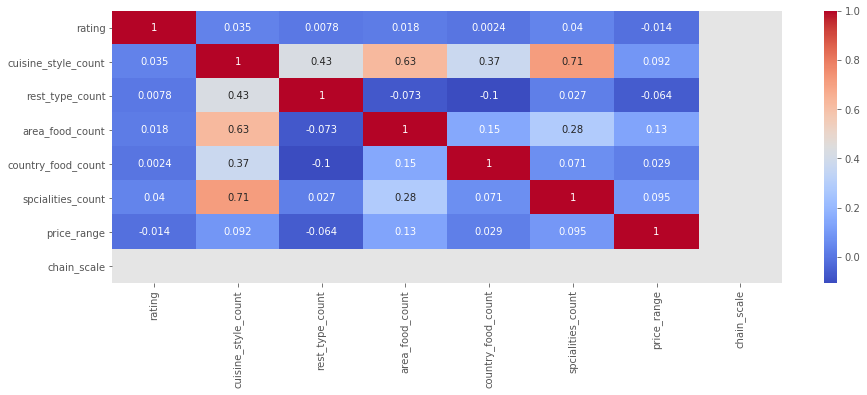

In [155]:
sns.heatmap(data[data['chain']==0][['rating', 'cuisine_style_count', 'rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 'price_range', 'chain_scale']].corr(), annot=True, cmap='coolwarm')

In [156]:
data[data['name']=='pinocchio'][['sample', 'city', 'chain_scale', 'name_count', 'rest_type', 'area_food', 'country_food', 'spcialities']]

,sample,city,chain_scale,name_count,rest_type,area_food,country_food,spcialities
23,0,Brussels,4,3,Pizza,Mediterranean,Italian,-
8076,0,Amsterdam,4,3,NaN,NaN,NaN,NaN
16082,1,Paris,4,3,-,European,Italian,Vegetarian Friendly
28963,1,Madrid,4,3,NaN,NaN,NaN,NaN
38894,1,Madrid,4,3,-,-,Spanish,-


- mcdonald_s           148
- burger_king           67
- pret_a_manger         61
- subway                59
- kfc                   51
- pizza_express         43
- domino_s_pizza        38
- eat                   34
- pizza_hut             34
- wagamama              23
- telepizza             22
- itsu                  22
- le_pain_quotidien     19
- sushi_shop            19
- nando_s               17

In [157]:
data[data['name']=='nando_s'][['sample', 'city', 'chain_scale', 'name_count', 'rest_type', 'area_food', 'country_food', 'spcialities']]

,sample,city,chain_scale,name_count,rest_type,area_food,country_food,spcialities
423,0,Edinburgh,48,13,-,-,Portuguese,-
1348,0,London,48,13,NaN,NaN,NaN,NaN
2268,0,London,48,13,-,-,Portuguese,-
4705,0,London,48,13,Fast Food,European,Portuguese,-
10542,1,London,48,13,"Fast Food, Barbecue",European,Portuguese,"Gluten Free Options, Vegetarian Friendly"
11767,1,London,48,13,Grill,European,-,-
14523,1,London,48,13,-,European,Portuguese,Vegetarian Friendly
16130,1,London,48,13,-,European,Portuguese,-
19404,1,Edinburgh,48,13,-,-,Portuguese,-
26071,1,London,48,13,Grill,European,Portuguese,-


In [158]:
data.query('chain==1')[['rest_type', 'area_food', 'country_food', 'spcialities']].describe()

,rest_type,area_food,country_food,spcialities
count,3548,3548,3548,3548
unique,137,62,141,22
top,-,-,Italian,-
freq,1594,1836,736,2149


**cuisine_style**:
- instead of **name_count**, let's count **name_city_count**
- in the case of **chain**==1 **rest_type**, **area_food**, **country_food**, **specialties** fill in with **modes** by **city** and **name** - recalculate all **..._count**
- in the case of **chain**==0 **cuisine_style_count**, **rest_type_count**, **area_food_count**, **country_food_count**, **spcialities_count**, fill in with **median** by **city** and **price_range** since this feature has significant emissions

In [159]:
# instead of name_count, let's count name_city_count
city_name_dict_1 = {}
for city in data.query('sample==1').city.unique():
    city_name_dict_1.update({city: {'name': data.loc[(data['sample']==1)&(data['city']==city)&(data['name'].isna()==False)].groupby('name')['id_ta'].count().reset_index().to_dict('index')}})

city_name_dict_1 = {k: v['name'] for k, v in city_name_dict_1.items()}
city_name_dict_1 = {key: {v['name']: v['id_ta'] if math.isnan(v['id_ta'])==False else np.nan for k, v in city_name_dict_1[key].items()} for key, value in city_name_dict_1.items()}


city_name_dict_0 = {}
for city in data.query('sample==0').city.unique():
    city_name_dict_0.update({city: {'name': data.loc[(data['sample']==0)&(data['city']==city)&(data['name'].isna()==False)].groupby('name')['id_ta'].count().reset_index().to_dict('index')}})

city_name_dict_0 = {k: v['name'] for k, v in city_name_dict_0.items()}
city_name_dict_0 = {key: {v['name']: v['id_ta'] if math.isnan(v['id_ta'])==False else np.nan for k, v in city_name_dict_0[key].items()} for key, value in city_name_dict_0.items()}

# {'Paris': {015_gang_nam': 1}, ...}

data['name_city_count'] = data.apply(lambda x: city_name_dict_1[x['city']][x['name']] if x['name'] in list(city_name_dict_1[x['city']].keys()) else (city_name_dict_0[x['city']][x['name']] if x['name'] in list(city_name_dict_0[x['city']].keys()) else 1), axis=1)

data[['name_city_count', 'name_count']].describe()

,name_city_count,name_count
count,50000.000000,50000.000000
mean,1.244100,1.859760
std,2.095949,7.291493
min,1.000000,1.000000
25%,1.000000,1.000000
50%,1.000000,1.000000
75%,1.000000,1.000000
max,42.000000,116.000000


In [160]:
data[['name_city_count', 'name_count']].isna().sum()

name_city_count    0
name_count         0
dtype: int64

In [161]:
data = data.drop('name_count', axis=1)

In [162]:
# in the case of chain==1 rest_type, area_food, country_food, specialties fill in with modes by city and name
def get_mode(col):

    city_name_dict_1 = {}
    for city in data.query('sample==1').city.unique():
        city_name_dict_1.update({city: {'name': data.loc[(data['sample']==1)&(data['city']==city)&(data['chain']==1)&(data['name'].isna()==False)].groupby('name')[col].apply(lambda x: x.mode()).reset_index().to_dict('index')}})

    city_name_dict_1 = {k: v['name'] for k, v in city_name_dict_1.items()}
    city_name_dict_1 = {key: {v['name']: v[col] for k, v in city_name_dict_1[key].items()} for key, value in city_name_dict_1.items()}


    city_name_dict_0 = {}
    for city in data.query('sample==0').city.unique():
        city_name_dict_0.update({city: {'name': data.loc[(data['sample']==0)&(data['city']==city)&(data['chain']==1)&(data['name'].isna()==False)].groupby('name')[col].apply(lambda x: x.mode()).reset_index().to_dict('index')}})

    city_name_dict_0 = {k: v['name'] for k, v in city_name_dict_0.items()}
    city_name_dict_0 = {key: {v['name']: v[col] for k, v in city_name_dict_0[key].items()} for key, value in city_name_dict_0.items()}

    return city_name_dict_1, city_name_dict_0
    # {'Paris': {'231_east_street': 'Fast Food', ...}}

In [163]:
data['rest_type_old'] = data['rest_type']
data['area_food_old'] = data['area_food']
data['country_food_old'] = data['country_food']
data['spcialities_old'] = data['spcialities']

In [164]:
# in the case of chain==1 rest_type, area_food, country_food, specialties fill in with modes by city and name
city_name_dict_1, city_name_dict_0 = get_mode('rest_type')
data['rest_type'] = data.apply(lambda x: city_name_dict_1[x['city']][x['name']] if x['name'] in list(city_name_dict_1[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else (city_name_dict_0[x['city']][x['name']] if x['name'] in list(city_name_dict_0[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else x['rest_type']), axis=1)

city_name_dict_1, city_name_dict_0 = get_mode('area_food')
data['area_food'] = data.apply(lambda x: city_name_dict_1[x['city']][x['name']] if x['name'] in list(city_name_dict_1[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else (city_name_dict_0[x['city']][x['name']] if x['name'] in list(city_name_dict_0[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else x['area_food']), axis=1)

city_name_dict_1, city_name_dict_0 = get_mode('country_food')
data['country_food'] = data.apply(lambda x: city_name_dict_1[x['city']][x['name']] if x['name'] in list(city_name_dict_1[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else (city_name_dict_0[x['city']][x['name']] if x['name'] in list(city_name_dict_0[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else x['country_food']), axis=1)

city_name_dict_1, city_name_dict_0 = get_mode('spcialities')
data['spcialities'] = data.apply(lambda x: city_name_dict_1[x['city']][x['name']] if x['name'] in list(city_name_dict_1[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else (city_name_dict_0[x['city']][x['name']] if x['name'] in list(city_name_dict_0[x['city']].keys()) and math.isnan(x['cuisine_style_count'])==True else x['spcialities']), axis=1)

data[['rest_type_old', 'rest_type', 'area_food_old', 'area_food', 'country_food_old', 'country_food', 'spcialities_old', 'spcialities']].isna().sum()

rest_type_old       11590
rest_type           11016
area_food_old       11590
area_food           11016
country_food_old    11590
country_food        11016
spcialities_old     11590
spcialities         11016
dtype: int64

In [165]:
# recalculate all ..._count
data['rest_type_count'] = data['rest_type'].dropna().apply(lambda x: len(x.split(', ')))
data['area_food_count'] = data['area_food'].dropna().apply(lambda x: len(x.split(', ')))
data['country_food_count'] = data['country_food'].dropna().apply(lambda x: len(x.split(', ')))
data['spcialities_count'] = data['spcialities'].dropna().apply(lambda x: len(x.split(', ')))

data[['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count']].isna().sum()

rest_type_count       11016
area_food_count       11016
country_food_count    11016
spcialities_count     11016
dtype: int64

In [166]:
# in the case of chain==0 cuisine_style_count, rest_type_count, area_food_count, country_food_count, spcialities_count, 
# fill in with median by city and price_range
def get_median(col):

    city_price_dict_1 = {}
    for city in data.query('sample==1').city.unique():
        city_price_dict_1.update({city: {'price_range': data.loc[(data['sample']==1)&(data['city']==city)&(data['chain']==0)&(data['name'].isna()==False)].groupby('price_range')[col].median().reset_index().to_dict('index')}})

    city_price_dict_1 = {k: v['price_range'] for k, v in city_price_dict_1.items()}
    city_price_dict_1 = {key: {v['price_range']: round(v[col], 0) for k, v in city_price_dict_1[key].items()} for key, value in city_price_dict_1.items()}


    city_price_dict_0 = {}
    for city in data.query('sample==0').city.unique():
        city_price_dict_0.update({city: {'price_range': data.loc[(data['sample']==0)&(data['city']==city)&(data['chain']==0)&(data['name'].isna()==False)].groupby('price_range')[col].median().reset_index().to_dict('index')}})

    city_price_dict_0 = {k: v['price_range'] for k, v in city_price_dict_0.items()}
    city_price_dict_0 = {key: {v['price_range']: round(v[col], 0) for k, v in city_price_dict_0[key].items()} for key, value in city_name_dict_0.items()}

    return city_price_dict_1, city_price_dict_0
    # 'Krakow': {1.0: 1.0, 2.5: 1.0, 4.0: 2.0}

In [167]:
# in the case of chain==0 cuisine_style_count, rest_type_count, area_food_count, country_food_count, spcialities_count, 
# fill in with median by city and price_range
city_price_dict_1, city_price_dict_0 = get_median('rest_type_count')
data['rest_type_count'] = data.apply(lambda x: city_price_dict_1[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else (city_price_dict_0[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else x['rest_type_count']), axis=1)

city_price_dict_1, city_price_dict_0 = get_median('area_food_count')
data['area_food_count'] = data.apply(lambda x: city_price_dict_1[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else (city_price_dict_0[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else x['area_food_count']), axis=1)

city_price_dict_1, city_price_dict_0 = get_median('country_food_count')
data['country_food_count'] = data.apply(lambda x: city_price_dict_1[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else (city_price_dict_0[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else x['country_food_count']), axis=1)

city_price_dict_1, city_price_dict_0 = get_median('spcialities_count')
data['spcialities_count'] = data.apply(lambda x: city_price_dict_1[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else (city_price_dict_0[x['city']][x['price_range']] if math.isnan(x['cuisine_style_count'])==True else x['spcialities_count']), axis=1)

data[['rest_type_old', 'rest_type_count', 'area_food_old', 'area_food_count', 'country_food_old', 'country_food_count', 'spcialities_old', 'spcialities_count']].isna().sum()

rest_type_old         11590
rest_type_count           0
area_food_old         11590
area_food_count           0
country_food_old      11590
country_food_count        0
spcialities_old       11590
spcialities_count         0
dtype: int64

In [168]:
# fill remain NaNs with 0 to recalculate cuisine_style_count
data['rest_type_count'] = data['rest_type_count'].fillna(0)
data['area_food_count'] = data['area_food_count'].fillna(0)
data['country_food_count'] = data['country_food_count'].fillna(0)
data['spcialities_count'] = data['spcialities_count'].fillna(0)

data['cuisine_style_count'] = data.apply(lambda x: x['rest_type_count']+x['area_food_count']+x['country_food_count']+x['spcialities_count'], axis=1)
data[['cuisine_style', 'cuisine_style_count']].isna().sum()

cuisine_style          11590
cuisine_style_count        0
dtype: int64

In [169]:
for col in ['rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 'cuisine_style_count']:
    print(col, data[col].unique())

rest_type_count [2. 1. 3. 4. 5. 6.]
area_food_count [1. 2. 3. 4. 5.]
country_food_count [1. 3. 2. 4. 5. 7. 6. 9.]
spcialities_count [1. 3. 2. 4. 5.]
cuisine_style_count [ 5.  7.  4.  6.  8.  9. 10. 11. 15. 13. 21.]


### reviews_date_delta & reviews_date_delta_max
We will fill in the gaps not in dates, but in intervals

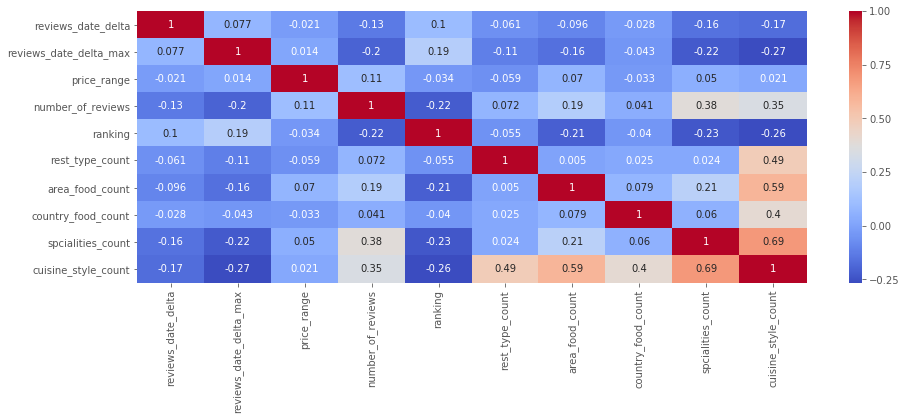

In [170]:
sns.heatmap(data[['reviews_date_delta', 'reviews_date_delta_max', 'price_range', 'number_of_reviews', 'ranking', 'rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 'cuisine_style_count']].corr(),
           annot=True, cmap='coolwarm')

To fill in **reviews_date_delta & reviews_date_delta_max**, take **city** and **cuisine_style_count**.

In [171]:
rev_delta_cuisine_dict = {}
for city in data.query('sample==1').city.unique():
    rev_delta_cuisine_dict.update({city: {'cuisine_style_count': data.loc[(data['sample']==1)&(data['city']==city)].groupby('cuisine_style_count')['reviews_date_delta'].median().reset_index().to_dict('index')}})
        
rev_delta_cuisine_dict = {k: v['cuisine_style_count'] for k, v in rev_delta_cuisine_dict.items()}
rev_delta_cuisine_dict = {key: {v['cuisine_style_count']: v['reviews_date_delta'] for k, v in rev_delta_cuisine_dict[key].items()} for key, value in rev_delta_cuisine_dict.items()}


rev_delta_max_cuisine_dict = {}
for city in data.query('sample==1').city.unique():
    rev_delta_max_cuisine_dict.update({city: {'cuisine_style_count': data.loc[(data['sample']==1)&(data['city']==city)].groupby('cuisine_style_count')['reviews_date_delta_max'].median().reset_index().to_dict('index')}})
        
rev_delta_max_cuisine_dict = {k: v['cuisine_style_count'] for k, v in rev_delta_max_cuisine_dict.items()}
rev_delta_max_cuisine_dict = {key: {v['cuisine_style_count']: v['reviews_date_delta_max'] for k, v in rev_delta_max_cuisine_dict[key].items()} for key, value in rev_delta_max_cuisine_dict.items()}


data['reviews_date_delta_old'] = data['reviews_date_delta']
data['reviews_date_delta_max_old'] = data['reviews_date_delta_max']

data['reviews_date_delta'] = data.apply(lambda x: rev_delta_cuisine_dict[x['city']][x['cuisine_style_count']] if math.isnan(x['reviews_date_delta_old'])==True else x['reviews_date_delta'], axis=1)
data['reviews_date_delta_max'] = data.apply(lambda x: rev_delta_max_cuisine_dict[x['city']][x['cuisine_style_count']] if math.isnan(x['reviews_date_delta_max_old'])==True else x['reviews_date_delta_max'], axis=1)

data[['reviews_date_delta_old', 'reviews_date_delta', 'reviews_date_delta_max_old', 'reviews_date_delta_max']].isna().sum()

reviews_date_delta_old        8114
reviews_date_delta               1
reviews_date_delta_max_old    8114
reviews_date_delta_max           1
dtype: int64

In [172]:
data.select_dtypes(include='number').isna().sum()

ranking                           0
price_range                       0
number_of_reviews                 0
sample                            0
rating                            0
cuisine_style_count               0
city_count                        0
chain                             0
chain_scale                       0
gcode_count                       0
reviews_date_delta                1
reviews_date_delta_max            1
rest_type_count                   0
area_food_count                   0
country_food_count                0
spcialities_count                 0
price_range_old               17361
number_of_reviews_old          3200
name_city_count                   0
reviews_date_delta_old         8114
reviews_date_delta_max_old     8114
dtype: int64

In [182]:
common_features = ['sample', 'rating', 'city', 'cuisine_style', 'ranking', 
                   'city_count', 'name_city_count',
                   'chain', 'chain_scale'
                  ]

old_features = ['price_range_old', 'number_of_reviews_old', 
                'rest_type_old', 'area_food_old', 'country_food_old', 'spcialities_old', 
                'reviews_date_delta_old', 'reviews_date_delta_max_old'
                ]

new_features = ['price_range', 'number_of_reviews', 
                'rest_type', 'area_food', 'country_food', 'spcialities',
                'cuisine_style_count',
                'rest_type_count', 'area_food_count', 'country_food_count', 'spcialities_count', 
                'reviews_date_delta', 'reviews_date_delta_max',
                ]

not_relvant = ['restaurant_id', 'reviews', 'url_ta', 'id_ta',
               'name', 'region', 'g_code', 'gcode_count', 
               'reviews_date', 'reviews_date_last', 'reviews_text',
              ]

In [176]:
def get_data_columns(list_of_lists):
    columns_list = []
    for el in list_of_lists:
        columns_list.extend(el)
        
    return columns_list

In [183]:
data_old_columns = get_data_columns([common_features, old_features]) # list_of_lists
data_new_columns = get_data_columns([common_features, new_features]) # list_of_lists

In [184]:
data[data_old_columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 17 columns):
sample                        50000 non-null int64
rating                        50000 non-null float64
city                          50000 non-null object
cuisine_style                 38410 non-null object
ranking                       50000 non-null float64
city_count                    50000 non-null int64
name_city_count               50000 non-null int64
chain                         50000 non-null int64
chain_scale                   50000 non-null int64
price_range_old               32639 non-null float64
number_of_reviews_old         46800 non-null float64
rest_type_old                 38410 non-null object
area_food_old                 38410 non-null object
country_food_old              38410 non-null object
spcialities_old               38410 non-null object
reviews_date_delta_old        41886 non-null float64
reviews_date_delta_max_old    41886 non-null float64
dtypes

In [185]:
data[data_new_columns].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 22 columns):
sample                    50000 non-null int64
rating                    50000 non-null float64
city                      50000 non-null object
cuisine_style             38410 non-null object
ranking                   50000 non-null float64
city_count                50000 non-null int64
name_city_count           50000 non-null int64
chain                     50000 non-null int64
chain_scale               50000 non-null int64
price_range               50000 non-null float64
number_of_reviews         50000 non-null float64
rest_type                 38984 non-null object
area_food                 38984 non-null object
country_food              38984 non-null object
spcialities               38984 non-null object
cuisine_style_count       50000 non-null float64
rest_type_count           50000 non-null float64
area_food_count           50000 non-null float64
country_food_count       